### Confirming the asymmetric behavior of Chinese

In [1]:
import torch
import pandas as pd
import numpy as np
import pyvene as pv
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from tqdm import tqdm
import os

from pyvene.models.gemma2.modelings_intervenable_gemma2 import create_gemma2

# device setup
os.environ["CUDA_VISIBLE_DEVICES"] = "0" # replace it with the available gpus
device = "cuda" if torch.cuda.is_available() else "cpu"

In [ ]:
from huggingface_hub import login
login(token="") # replace your token

In [3]:
config, tokenizer, model = create_gemma2() # gemma2-2b
model.to(device)

`torch_dtype` is deprecated! Use `dtype` instead!


Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

loaded model


Gemma2ForCausalLM(
  (model): Gemma2Model(
    (embed_tokens): Embedding(256000, 2304, padding_idx=0)
    (layers): ModuleList(
      (0-25): 26 x Gemma2DecoderLayer(
        (self_attn): Gemma2Attention(
          (q_proj): Linear(in_features=2304, out_features=2048, bias=False)
          (k_proj): Linear(in_features=2304, out_features=1024, bias=False)
          (v_proj): Linear(in_features=2304, out_features=1024, bias=False)
          (o_proj): Linear(in_features=2048, out_features=2304, bias=False)
        )
        (mlp): Gemma2MLP(
          (gate_proj): Linear(in_features=2304, out_features=9216, bias=False)
          (up_proj): Linear(in_features=2304, out_features=9216, bias=False)
          (down_proj): Linear(in_features=9216, out_features=2304, bias=False)
          (act_fn): PytorchGELUTanh()
        )
        (input_layernorm): Gemma2RMSNorm((2304,), eps=1e-06)
        (post_attention_layernorm): Gemma2RMSNorm((2304,), eps=1e-06)
        (pre_feedforward_layernorm): Gemm

In [4]:
# this is the logits for the last word
def get_logits(input: str, model=model, tokenizer=tokenizer):
    inputs = [tokenizer(input, return_tensors='pt').to(device)]
    res = model(**inputs[0])
    logits = res.logits[0][-1].detach().clone()
    return logits

In [5]:
base_strings = {
    'en': 'The {op} of "{adj}" is "',
    'fr': 'Le {op} de "{adj}" est "',
    'es': 'Lo {op} de "{adj}" es "',
    'de': 'Das {op} von "{adj}" ist "',
    'zh':'"{adj}"{op}义词是"',
    'ja':'「{adj}」の{op}は「',
    'ko':'"{adj}"의 {op}은 "',
}
langs = {'en', 'fr', 'es', 'de', 'zh', 'ja', 'ko'}
opp_dict = {
    'en': 'opposite', 'fr': 'contraire', 'es': 'opuesto',
    'de': 'Gegenteil', 'zh': '的反', 'ja': '反対', 'ko': '반대말',
}
lang_dict = {
    'en': {'en': 'English', 'fr': 'French', 'es': 'Spanish', 'de': 'German', 
            'zh': 'Chinese', 'ja': 'Japanese', 'ko': 'Korean',},
    'ja': {'en': '英語', 'fr': 'フランス語', 'es': 'スペイン語', 'de': 'ドイツ語',
           'zh': '中国語', 'ja': '日本語', 'ko': '韓国語',},
    'fr': {'en': 'anglais', 'fr': 'français', 'es': 'espagnol', 
           'de': 'allemand', 'zh': 'chinois', 'ja': 'japonais', 'ko': 'coréen',},
    'es': {'en': 'inglés', 'fr': 'francés', 'es': 'español', 'de': 'alemán',
           'zh': 'chino', 'ja': 'japonés', 'ko': 'coreano'},
    'de': {'en': 'Englisch', 'fr': 'Französisch', 'es': 'Spanisch', 
           'de': 'Deutsch', 'zh': 'Chinesisch', 'ja': 'Japanisch', 'ko': 'Koreanisch'},
    'zh': {'en': '英语', 'fr': '法语', 'es': '西班牙语', 'de': '德语', 
           'zh': '中文', 'ja': '日文', 'ko': '韩文'},
    'ko': {'en': '영어', 'fr': '프랑스어', 'es': '스페인어', 'de': '독일어', 
           'zh': '중국어', 'ja': '일본어', 'ko': '한국어'},
    }

In [6]:
"""
Small / Big, Heavy / Light, Hot / Cold, New / Old, Soft / Hard, Near / Far, Dark / Light,
Young / Old, Quiet / Loud (Noisy), True / False, Active / Passive, Fast / Slow,
"""
adj_dict = {
    'en': 'small', 'fr': 'petit', 'es': 'pequeño', 'de': 'klein', 
    'zh': '小', 'ja': '小さい', 'ko': '작다',
}
ans_dict = {
    'en': ['big', 'large'], 'fr': ['grand', 'gros', 'énorme'], 'es': ['grande', 'enorme', 'gigante'], 
    'de': ['groß'], 'zh': ['大'], 'ja': ['大きい'], 'ko': ['크다', '큰']
}

adj_dict2 = {
    'en': 'heavy', 'fr': 'lourd', 'es': 'pesado', 'de': 'schwer', 
    'zh': '重', 'ja': '重い', 'ko': '무거운',
}
ans_dict2 = {
    'en': ['light'], 'fr': ['léger'], 'es': ['ligero'], 
    'de': ['leicht', 'einfach'], 'zh': ['轻', '軽', '輕'], 'ja': ['軽い'], 'ko': ['가벼운']
}

adj_dict3 = {
    'en': 'hot', 'fr': 'chaud', 'es': 'caliente', 'de': 'heiß', 
    'zh': '热', 'ja': '熱い', 'ko': '뜨거운',
}
ans_dict3 = {
    'en': ['cold'], 'fr': ['froid'], 'es': ['frío', 'helado', 'fresco'], 'de': ['kalt'],
    'zh': ['冷', '凉'], 'ja': ['冷たい'], 'ko': ['차가운'], 
}

adj_dict4 = {
    'en': 'new', 'fr': 'nouveau', 'es': 'nuevo', 'de': 'neu',
    'zh': '新', 'ja': '新しい', 'ko': '새롭다',
}
ans_dict4 = {
    'en': ['old'], 'fr': ['vieux', 'ancien'], 'es': ['viejo', 'antiguo'], 'de': ['alt'],
    'zh': ['旧', '老'], 'ja': ['古い'], 'ko': ['오래되다', '낡다'],
}

adj_dict5 = {
    'en': 'soft', 'fr': 'doux', 'es': 'suave', 'de': 'weich',
    'zh': '软', 'ja': '柔らかい', 'ko': '부드럽다',
}
ans_dict5 = {
    'en': ['hard'], 'fr': ['dur', 'amer', 'acide', 'aigre', 'fort', 'violent', 'brutal', 'raide'], 'es': ['duro', 'fuerte', 'áspero', 'rugoso', 'brusco', 'violento', 'agrio'], 'de': ['hart'],
    'zh': ['硬', '强'], 'ja': ['硬い'], 'ko': ['딱딱하다', '단단하다'],
}

adj_dict6 = {
    'en': 'near', 'fr': 'près', 'es': 'cerca', 'de': 'nah', 
    'zh': '近', 'ja': '近い', 'ko': '가깝다'
}
ans_dict6 = {
    'en': ['far'], 'fr': ['loin', 'éloigné'], 'es': ['lejos'], 'de': ['weit', 'fern'], 
    'zh': ['远', '遠'], 'ja': ['遠い'], 'ko': ['멀다', '먼'],
}

adj_dict7 = {
    'en': 'dark', 'fr': 'foncé', 'es': 'oscuro', 'de': 'dunkel',
    'zh': '暗', 'ja': '暗い', 'ko': '어둡다',
}
ans_dict7 = {
    'en': ['light', 'bright'], 'fr': ['clair', 'pâle', 'brillant'], 'es': ['claro', 'luminoso', 'brillante'],
    'de': ['hell'], 'zh': ['亮', '明', '公开'], 'ja': ['明るい'], 'ko': ['밝다'],
}

adj_dict8 = {
    'en': 'young', 'fr': 'jeune', 'es': 'joven', 'de': 'jung',
    'zh': '年轻', 'ja': '若い', 'ko': '젊다',
}
ans_dict8 = {
    'en': ['old'], 'fr': ['vieux', 'vielle', 'âgé', 'ancien'], 'es': ['viejo', 'mayor'], 'de': ['alt'],
    'zh': ['老', '年老', '年长'], 'ja': ['古い', '年を取った', '高齢の', '老いた'], 'ko': ['늙다', '오래되다'], 
}

adj_dict9 = {
    'en': 'quiet', 'fr': 'silencieux', 'es': 'tranquilo', 'de': 'leise',
    'zh': '安静', 'ja': '静かな', 'ko': '조용하다',
}
ans_dict9 = {
    'en': ['loud', 'noisy'], 'fr': ['bruyant', 'fort', 'tapageur'], 'es': ['ruidoso', 'nervioso', 'agitado', 'inquieto'], 'de': ['laut'],
    'zh': ['吵闹', '大声', '嘈杂', '热闹', '喧闹'], 'ja': ['うるさい', '騒がしい', '賑やかな'], 'ko': ['시끄럽다', '떠들썩하다', '활기차다'],
}

adj_dict10 = {
    'en': 'true', 'fr': 'vrai', 'es': 'verdadero', 'de': 'wahr',
    'zh': '真', 'ja': '本当の', 'ko': '진실하다',
}
ans_dict10 = {
    'en': ['false'], 'fr': ['faux'], 'es': ['falso'], 'de': ['falsch'],
    'zh': ['假'], 'ja': ['偽の', '嘘の', '間違った'], 'ko': ['거짓되다', '가짜이다', '불성실하다'],
}

adj_dict11 = {
    'en': 'active', 'fr': 'actif', 'es': 'activo', 'de': 'aktiv',
    'zh': '主动', 'ja': '能動的な', 'ko': '능동적이다',
}
ans_dict11 = {
    'en': ['passive', 'inactive', 'dormant'], 'fr': ['passif', 'inactif', 'sédentaire', 'paresseux'], 'es': ['pasivo', 'inactivo', 'sedentario', 'ocioso', 'latente'], 'de': ['passiv', 'inaktiv'],
    'zh': ['被动'], 'ja': ['受動的な', '消極的な', '怠惰な'], 'ko': ['수동적이다', '소극적이다'],
}

adj_dict12= {
    'en': 'fast', 'fr': 'rapide', 'es': 'rápido', 'de': 'schnell',
    'zh': '快', 'ja': '速い', 'ko': '빠르다',
}
ans_dict12 = {
    'en': ['slow'], 'fr': ['lent'], 'es': ['lento'], 'de': ['langsam'],
    'zh': ['慢'], 'ja': ['遅い'], 'ko': ['느리다'],
}

dicts = [(adj_dict, ans_dict), (adj_dict2, ans_dict2), (adj_dict3, ans_dict3),
         (adj_dict4, ans_dict4), (adj_dict5, ans_dict5), (adj_dict6, ans_dict6),
         (adj_dict7, ans_dict7), (adj_dict8, ans_dict8), (adj_dict9, ans_dict9),
         (adj_dict10, ans_dict10), (adj_dict11, ans_dict11), (adj_dict12, ans_dict12),]


In [7]:
result_dict = {}
for l in langs:
    result_dict[l] = {}
    for l2 in langs:
        result_dict[l][l2] = {'wlca': [], 'clca': [], 'wlsa': [], 'clsa': [], 'enca': [], 'ensa': [], 'wrong': []}
for adj_d, ans_d in dicts:
    for l in langs:
        for l2, adj in adj_dict2.items():
            prompt = base_strings[l].format(op=opp_dict[l], adj=adj_d[l2])
            probability = torch.softmax(get_logits(prompt), dim=-1)
            
            rest = 1
            tmp = []
            for ans in ans_d[l]:
                token_idx = tokenizer.encode(ans)[1]
                tmp.append(probability[token_idx])
            result_dict[l][l2]['wlca'].append(sum(tmp))
            rest -= sum(tmp)

            tmp = []
            for ans in ans_d[l2]:
                token_idx = tokenizer.encode(ans)[1]
                tmp.append(probability[token_idx])
            result_dict[l][l2]['clca'].append(sum(tmp))
            if l != l2:
                rest -= sum(tmp)

            tmp = []
            for ans in ans_d['en']:
                token_idx = tokenizer.encode(ans)[1]
                tmp.append(probability[token_idx])
            result_dict[l][l2]['enca'].append(sum(tmp))
            if l != 'en' and l2 != 'en':
                rest -= sum(tmp)

            token_idx = tokenizer.encode(adj_d[l])[1]
            result_dict[l][l2]['wlsa'].append(probability[token_idx])
            rest -= probability[token_idx]

            token_idx = tokenizer.encode(adj_d[l2])[1]
            result_dict[l][l2]['clsa'].append(probability[token_idx])
            if l != l2:
                rest -= probability[token_idx]

            token_idx = tokenizer.encode(adj_d['en'])[1]
            result_dict[l][l2]['ensa'].append(probability[token_idx])
            if l != 'en' and l2 != 'en':
                rest -= probability[token_idx]

            result_dict[l][l2]['wrong'].append(rest)

In [8]:
avg_dict = {}
for l in langs:
    avg_dict[l] = {}
    for l2 in langs:
        avg_dict[l][l2] = {}
for l in langs:
    for l2 in langs:
        for key in result_dict[l][l2].keys():
            lst_tensors = result_dict[l][l2][key]
            stack = torch.stack(lst_tensors, dim=0)
            overall_mean = torch.mean(stack)
            avg_dict[l][l2][key] = overall_mean.cpu().detach().float().numpy().item()


Korean
           ko      en      fr      de      ja      zh      es
wlca  0.26172 0.03345 0.03906 0.04175 0.03040 0.08398 0.09961
clca  0.26172 0.52734 0.08057 0.13965 0.28125 0.29883 0.11182
wlsa  0.05493 0.00525 0.00836 0.00343 0.00377 0.00677 0.01385
clsa  0.05493 0.01685 0.02429 0.03149 0.00430 0.00049 0.01129
enca  0.01532 0.52734 0.05176 0.05981 0.02722 0.02087 0.02393
ensa  0.00001 0.01685 0.00058 0.00173 0.00011 0.00001 0.00076
wrong 0.66797 0.41797 0.79688 0.72266 0.65234 0.58984 0.73828


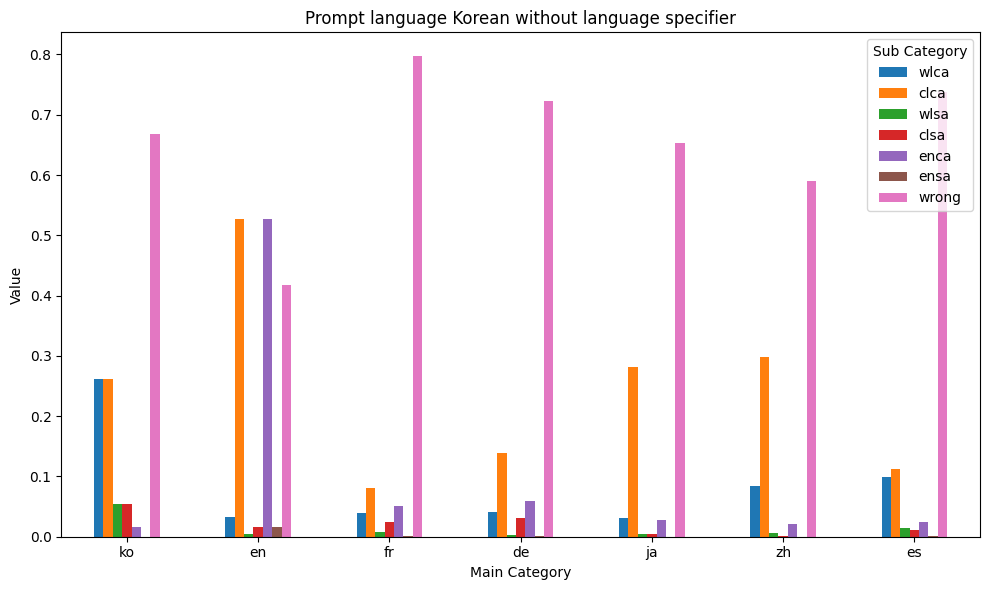

English
           ko      en      fr      de      ja      zh      es
wlca  0.02173 0.79297 0.05981 0.02917 0.00934 0.01526 0.01855
clca  0.29297 0.79297 0.32617 0.36719 0.50781 0.71875 0.44531
wlsa  0.00001 0.01556 0.00940 0.00626 0.00001 0.00000 0.00005
clsa  0.05713 0.01556 0.03784 0.07764 0.01324 0.00247 0.05249
enca  0.02173 0.79297 0.05981 0.02917 0.00934 0.01526 0.01855
ensa  0.00001 0.01556 0.00940 0.00626 0.00001 0.00000 0.00005
wrong 0.62891 0.19238 0.56641 0.51953 0.47070 0.26172 0.48438


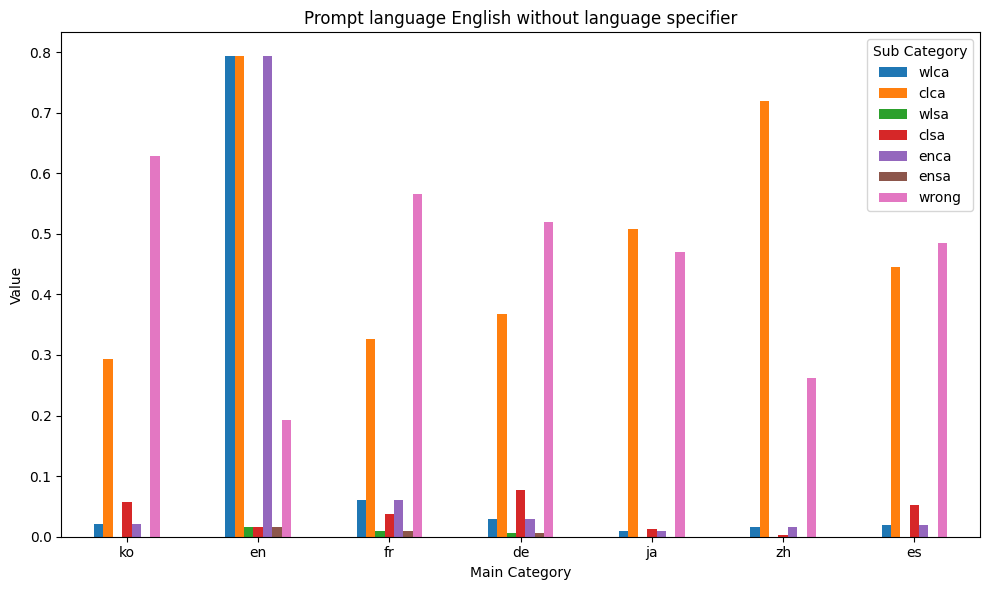

French
           ko      en      fr      de      ja      zh      es
wlca  0.04980 0.03760 0.59375 0.07764 0.02441 0.01892 0.17188
clca  0.27539 0.75000 0.59375 0.33789 0.41602 0.58203 0.41602
wlsa  0.00004 0.00101 0.01117 0.00439 0.00002 0.00005 0.00310
clsa  0.06836 0.00787 0.01117 0.04395 0.00940 0.00253 0.02783
enca  0.02124 0.75000 0.00488 0.02197 0.01263 0.05908 0.01093
ensa  0.00001 0.00787 0.00000 0.00243 0.00001 0.00001 0.00001
wrong 0.58594 0.20312 0.39062 0.51172 0.53906 0.33984 0.36914


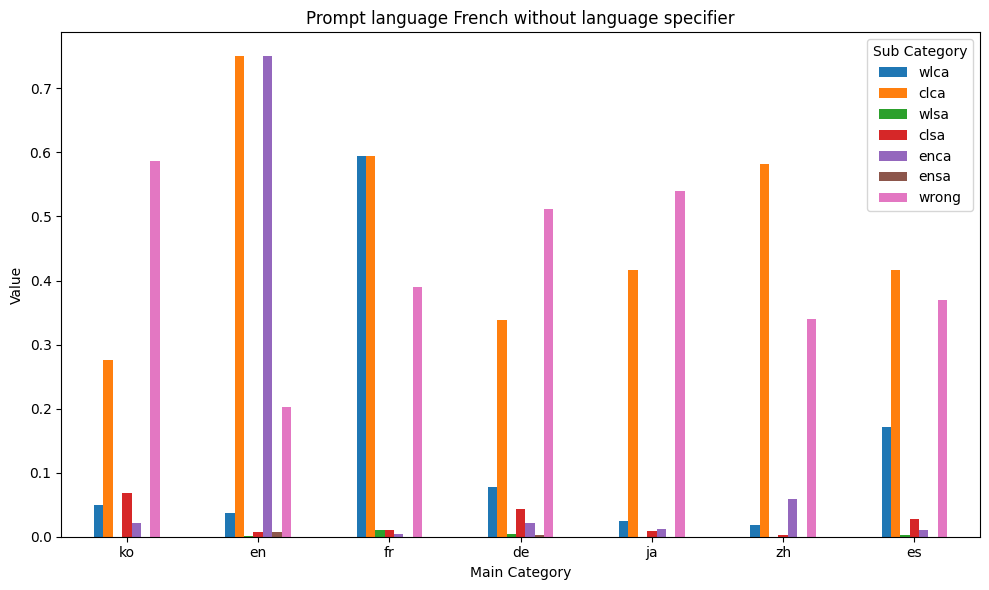

German
           ko      en      fr      de      ja      zh      es
wlca  0.02026 0.01611 0.05078 0.63672 0.01129 0.00214 0.08496
clca  0.25781 0.69922 0.29883 0.63672 0.43164 0.64062 0.40430
wlsa  0.00000 0.00168 0.00080 0.03052 0.00005 0.00000 0.00063
clsa  0.06030 0.02979 0.04907 0.03052 0.01141 0.00188 0.06787
enca  0.01514 0.69922 0.03003 0.01410 0.00830 0.02563 0.01746
ensa  0.00001 0.02979 0.00042 0.00002 0.00002 0.00001 0.00004
wrong 0.64844 0.25195 0.57031 0.32031 0.53906 0.33203 0.42578


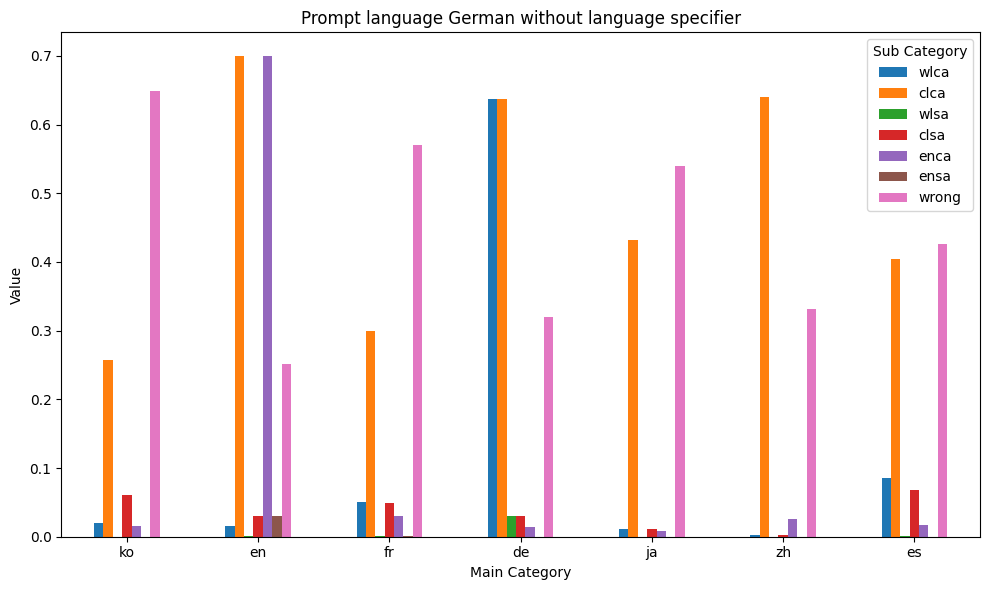

Japanese
           ko      en      fr      de      ja      zh      es
wlca  0.12988 0.03882 0.01990 0.01855 0.55078 0.27344 0.04614
clca  0.08252 0.67969 0.11475 0.15918 0.55078 0.50391 0.12207
wlsa  0.00134 0.00073 0.00076 0.00232 0.00922 0.00203 0.00019
clsa  0.01123 0.00482 0.04419 0.06226 0.00922 0.00098 0.03955
enca  0.01013 0.67969 0.10352 0.07861 0.00175 0.00323 0.04956
ensa  0.00000 0.00482 0.00155 0.00305 0.00000 0.00000 0.00024
wrong 0.76562 0.27734 0.71484 0.67578 0.43750 0.21875 0.74219


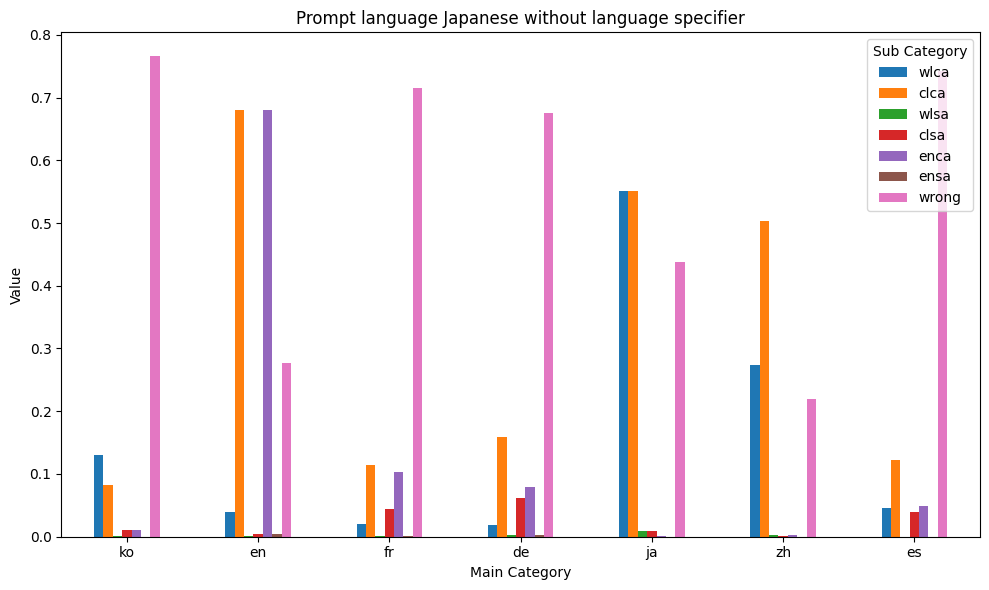

Chinese
           ko      en      fr      de      ja      zh      es
wlca  0.39258 0.08545 0.20410 0.12158 0.48633 0.82422 0.26562
clca  0.08594 0.67188 0.06836 0.09570 0.15234 0.82422 0.07666
wlsa  0.00032 0.00121 0.00458 0.00165 0.00359 0.00226 0.00195
clsa  0.00452 0.00252 0.00510 0.00377 0.00087 0.00226 0.00546
enca  0.02393 0.67188 0.17090 0.17383 0.02734 0.00369 0.05298
ensa  0.00000 0.00252 0.00146 0.00323 0.00001 0.00000 0.00014
wrong 0.49219 0.24121 0.54688 0.60156 0.33008 0.16992 0.59766


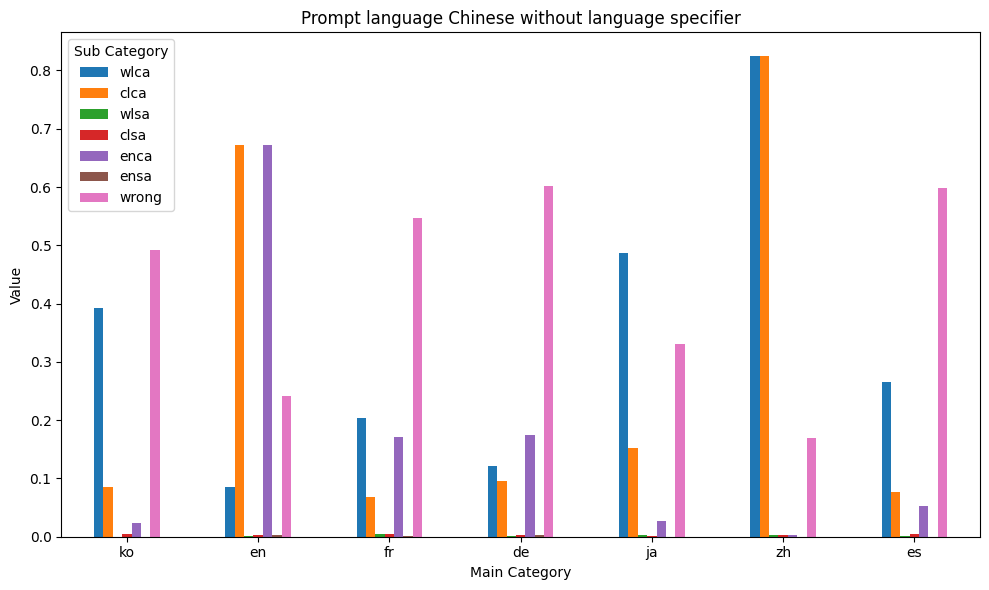

Spanish
           ko      en      fr      de      ja      zh      es
wlca  0.04248 0.04004 0.24902 0.08301 0.00534 0.00241 0.62109
clca  0.28516 0.79688 0.37109 0.31641 0.39258 0.75391 0.62109
wlsa  0.00003 0.00105 0.00745 0.00098 0.00002 0.00001 0.02832
clsa  0.07520 0.00995 0.04150 0.08105 0.01367 0.00232 0.02832
enca  0.02307 0.79688 0.01440 0.01941 0.01093 0.01489 0.00623
ensa  0.00001 0.00995 0.00006 0.00177 0.00001 0.00000 0.00000
wrong 0.57422 0.15332 0.31641 0.50000 0.57812 0.22852 0.34375


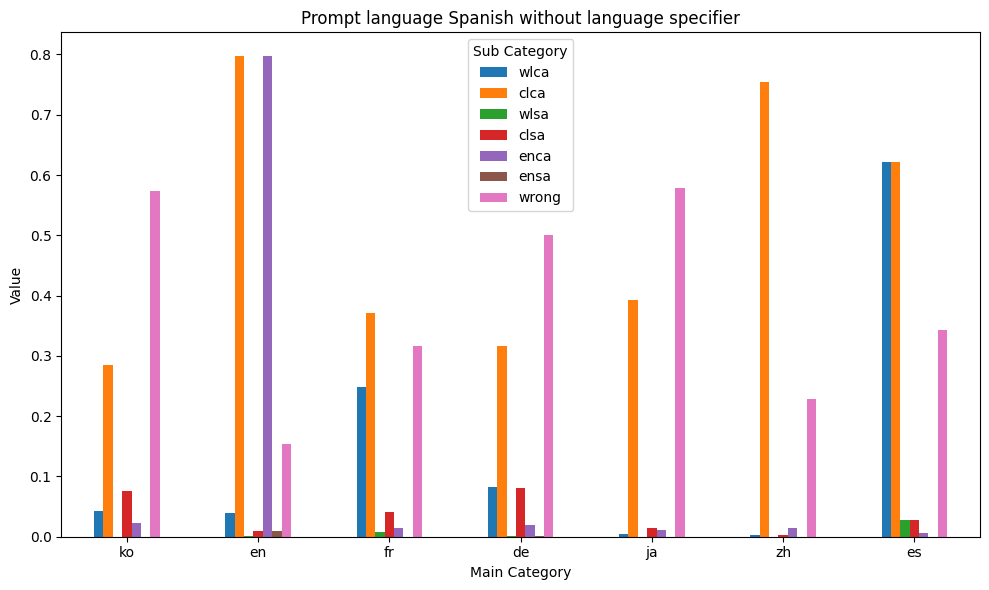

In [9]:
for l in langs:
    prompt_language = lang_dict['en'][l]
    print(prompt_language)
    df = pd.DataFrame(avg_dict[l])
    pd.set_option('display.float_format', lambda x: '%.5f' % x)
    print(df)
    # Transpose the DataFrame to have outer keys as columns and inner keys as index
    df_transposed = df.transpose()

    ax = df_transposed.plot.bar(rot=0, figsize=(10, 6))

    # Add labels and title for clarity
    ax.set_xlabel("Main Category")
    ax.set_ylabel("Value")
    ax.set_title(f"Prompt language {prompt_language} without language specifier")
    plt.legend(title="Sub Category")
    plt.tight_layout()
    plt.show()

### Extracting Features

In [2]:
import os, sys
# path to circuit-tracer
module_dir = os.path.abspath('/export/home/rmitsuhashi/circuit-tracer')
sys.path.insert(0, module_dir)
module_dir2 = os.path.join(module_dir, 'demos')
sys.path.insert(0, module_dir2)

import copy
import heapq
import requests
import torch
from circuit_tracer import ReplacementModel, attribute
from circuit_tracer.graph import Graph, prune_graph
from typing import Optional
import json
from graph_visualization import create_graph_visualization, Supernode, InterventionGraph, Feature
from collections import namedtuple
import matplotlib.pyplot as plt

device = 'cuda' if torch.cuda.is_available() else "cpu"

In [3]:
model_name = 'google/gemma-2-2b'
transcoder_name = "gemma"
model = ReplacementModel.from_pretrained(model_name, transcoder_name, device=device, dtype=torch.bfloat16)

Fetching 26 files:   0%|          | 0/26 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!


Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

Loaded pretrained model google/gemma-2-2b into HookedTransformer


In [4]:
## helper functions
def token_to_idx(graph: Graph, token: int) -> int:
    features = len(graph.selected_features)
    errors = graph.cfg.n_layers * graph.n_pos
    if token >= 0:
        return features + errors + token
    else:
        return features + errors + graph.n_pos + token

def logit_to_idx(graph: Graph, logit: int) -> int:
    features = len(graph.selected_features)
    errors = graph.cfg.n_layers * graph.n_pos
    tokens = graph.n_pos
    return features + errors + tokens + logit

def path_reconstruct(start, last, step_dict) -> list[int]:
    curr = last
    path = [last]
    while curr != start:
        try:
            curr = step_dict[curr]
            path.insert(0, curr)
        except KeyError:
            raise KeyError('Path is disconnected')
    return path

def path_to_edge_weights(graph: Graph, path: list[int]) -> list[float]:
    path_copy = copy.deepcopy(path)
    last = path[-1]
    if last < len(graph.logit_tokens):
        path_copy[-1] = logit_to_idx(graph, path[-1])
    n = len(path_copy)
    weights = []
    for i in range(n - 1):
        weight = (graph.adjacency_matrix[path_copy[i+1], path_copy[i]]).item()
        weights.append(weight)
    return weights

def distinct_path_max_bottleneck(
        graph: Graph, token_idx: int, logit_idx: int,
        throughput_threshold: float = 0,
        node_threshold: float = 0.8, edge_threshold: float = 0.98,
        MAX_ITERATIONS: int = 50,
        ) -> list[list[int]]:

    if throughput_threshold < 0:
        raise ValueError('The throughput threshold cannot be negative')
    if MAX_ITERATIONS <= 0:
        raise ValueError('The maximum number of iterations have to be positive')

    pruned_adjacency_matrix = copy.deepcopy(graph.adjacency_matrix)
    node_mask, edge_mask, _ = prune_graph(graph, node_threshold, edge_threshold)
    n, _ = pruned_adjacency_matrix.shape

    for i in range(n):
        if not node_mask[i]:
            pruned_adjacency_matrix[i, :] = 0.0
            pruned_adjacency_matrix[:, i] = 0.0
    pruned_adjacency_matrix = pruned_adjacency_matrix * edge_mask.float()

    negative_values = (pruned_adjacency_matrix > 0).float() # 0 means it is negative
    pruned_adjacency_matrix = pruned_adjacency_matrix * negative_values

    start_node_idx = token_to_idx(graph, token_idx)
    target_node_idx = logit_to_idx(graph, logit_idx)

    # exclude the direct path
    pruned_adjacency_matrix[target_node_idx, start_node_idx] = 0

    matrix_for_distinct_paths = copy.deepcopy(pruned_adjacency_matrix) # This matrix gets nodes removed after each path

    paths = []
    iteration_counter = 0

    while True:
        iteration_counter += 1
        if iteration_counter > MAX_ITERATIONS:
            print(f"Hit MAX_ITERATIONS ({MAX_ITERATIONS}). Forced termination.")
            return paths

        # Step 1: Find the max-throughput path in the *current* network state (matrix_for_distinct_paths)
        # using a modified Dijkstra's algorithm (or similar widest path algorithm)

        # bottleneck_capacity[v] stores the maximum bottleneck capacity found so far to reach v from start_node_idx
        # predecessor[v] stores the predecessor node on that max-bottleneck path
        bottleneck_capacity = torch.full((n,), float('-inf')) # Use -inf for min-heap (will store negative for max-heap)
        bottleneck_capacity[start_node_idx] = float('inf') # Source has infinite capacity to itself (bottleneck is min of path)
        predecessor = {} # Stores predecessor for path reconstruction

        # Max-heap (Python's heapq is a min-heap, so store negative capacities to simulate a max-heap)
        # Priority Queue: ( -bottleneck_capacity, node_idx )
        pq = [(-float('inf'), start_node_idx)] # (negative_capacity_to_node, node_idx)

        current_path_predecessors = {} # For this iteration's path reconstruction

        path_found_in_iteration = False

        while pq:
            # Pop node with current highest bottleneck capacity
            # Use -w to convert back to positive for comparison
            neg_current_bottleneck, u = heapq.heappop(pq)
            current_bottleneck = -neg_current_bottleneck

            # If we've already found a better or equal bottleneck path to 'u', skip
            if current_bottleneck < bottleneck_capacity[u].item(): # Compare with stored value
                continue

            if u == target_node_idx:
                path_found_in_iteration = True
                break # Found a path to the target

            # Iterate over neighbors v of u (outgoing edges from u)
            # Assuming adjacency_matrix[destination, source] = weight
            outgoing_edges_from_u = matrix_for_distinct_paths[:, u]
            valid_neighbors = (outgoing_edges_from_u > throughput_threshold).nonzero().squeeze(1) # Find neighbors with positive capacity

            for v_tensor in valid_neighbors:
                v = v_tensor.item()
                edge_capacity_u_v = outgoing_edges_from_u[v].item()

                new_bottleneck = min(current_bottleneck, edge_capacity_u_v)

                if new_bottleneck > bottleneck_capacity[v].item(): # If this path offers a better bottleneck to v
                    bottleneck_capacity[v] = new_bottleneck
                    current_path_predecessors[v] = u # Store predecessor for this path
                    heapq.heappush(pq, (-new_bottleneck, v)) # Add to PQ (negated for max-heap behavior)

        if not path_found_in_iteration or bottleneck_capacity[target_node_idx].item() <= throughput_threshold:
            # No path found to target_node_idx, or the best path found is below the threshold
            return paths

        # Step 2: Reconstruct the path found
        reconstructed_path = path_reconstruct(start_node_idx, target_node_idx, current_path_predecessors)
        paths.append(reconstructed_path)

        # Step 3: Remove internal nodes of the found path for the next iteration (to find distinct paths)
        # Ensure not to remove source or target nodes
        for node_in_path in reconstructed_path[1:-1]: # Exclude start and end nodes
            matrix_for_distinct_paths[node_in_path, :] = 0.0 # Remove all outgoing edges from this node
            matrix_for_distinct_paths[:, node_in_path] = 0.0 # Remove all incoming edges to this node

# helper functions for the graph visualization
def paths_list(*paths_lsts: list[list[int]]) -> list[list[int]]:
    path_sets = []
    for paths_lst in paths_lsts:
        for path in paths_lst:
            path_sets.append(path)
    return path_sets

def create_feature_dict(graph: Graph, paths: list[list[int]]) -> dict[str, str]:
    feature_dict = dict()

    for path in paths:
        features = path[1:-1]
        for feature in features:
            layer, pos, feature_idx = graph.active_features[graph.selected_features[feature]]
            key = f"{layer.item()}.{feature_idx.item()}"
            if feature_dict.get(key) == None:
                response = requests.get(f"https://www.neuronpedia.org/api/feature/gemma-2-2b/{layer}-gemmascope-transcoder-16k/{feature_idx}")
                explanations = response.json()['explanations']
                description = explanations[0]['description']
                feature_dict[key] = description

    return feature_dict

def prune_paths_by_first_last(graph: Graph, paths: list[list[int]], threshold_first: float, threshold_last: float) -> list[list[int]]:
    pruned_paths = []
    for path in paths:
        weights = path_to_edge_weights(graph, path)
        if weights[0] > threshold_first and weights[-1] > threshold_last:
            pruned_paths.append(path)
    return pruned_paths

def paths_set_to_json(graph: Graph, paths: list[list[int]], filename: Optional[str] = None, feature_dict: Optional[dict[str, str]] = None) -> dict[str, str]:
    feature_set = set()
    for path in paths:
        middle = path[1:-1]
        for feature in middle:
            feature_set.add(feature)

    description_dict = dict()

    for feature in feature_set:
        layer, pos, feature_idx = graph.active_features[graph.selected_features[feature]]
        layer = layer.item() if isinstance(layer, torch.Tensor) else layer
        pos = pos.item() if isinstance(pos, torch.Tensor) else pos
        feature_idx = feature_idx.item() if isinstance(feature_idx, torch.Tensor) else feature_idx

        description_key = f'{layer}.{pos}.{feature_idx}'
        if feature_dict == None:
            try:
                response = requests.get(f"https://www.neuronpedia.org/api/feature/gemma-2-2b/{layer}-gemmascope-transcoder-16k/{feature_idx}")
                explanations = response.json()['explanations']
                description = explanations[0]['description']
                description_dict[description_key] = description
            except TypeError:
                raise TypeError(f"Layer {layer}, position {pos}, feature {feature_idx} does not exist")
        else:
            feature_dict_key = f'{layer}.{feature_idx}'
            try:
                description = feature_dict[feature_dict_key]
                description_dict[description_key] = description
            except KeyError:
                try:
                    response = requests.get(f"https://www.neuronpedia.org/api/feature/gemma-2-2b/{layer}-gemmascope-transcoder-16k/{feature_idx}")
                    explanations = response.json()['explanations']
                    description = explanations[0]['description']
                    description_dict[description_key] = description
                except TypeError:
                    raise TypeError(f"Layer {layer}, position {pos}, feature {feature_idx} does not exist")
                
    if filename != None:
        with open(filename, 'w') as file:
            json.dump(description_dict, file, indent=4)

    return description_dict
    
def find_substring(hay: str, needles: list[str]) -> bool:
    for needle in needles:
        if needle in hay:
            return True
    return False

def pick_last_pos_features(graph: Graph, paths: list[list[int]]) -> list[tuple[int, int]]:
    feature_list = []
    n_pos = graph.n_pos
    for path in paths:
        middle = path[1:-1]
        for feature in middle:
            layer, pos, feature_idx = graph.active_features[graph.selected_features[feature]]
            layer = layer.item() if isinstance(layer, torch.Tensor) else layer
            pos = pos.item() if isinstance(pos, torch.Tensor) else pos
            feature_idx = feature_idx.item() if isinstance(feature_idx, torch.Tensor) else feature_idx

            if pos == n_pos - 1:
                feature_list.append((layer, feature_idx))

    return feature_list

def choose_language_features(features: list[tuple[int, int]], language_identifiers: list[str], feature_dict: Optional[dict[str, str]] = None) -> dict[str, int]:
    lang_feature_dict = dict()
    for layer, feature_idx in features:
        key = f'{layer}.{feature_idx}'
        if feature_dict == None:
            try:
                response = requests.get(f"https://www.neuronpedia.org/api/feature/gemma-2-2b/{layer}-gemmascope-transcoder-16k/{feature_idx}")
                explanations = response.json()['explanations']
                description = explanations[0]['description']
            except TypeError:
                raise TypeError(f"Layer {layer}, feature {feature_idx} does not exist")
        else:
            try:
                description = feature_dict[key]
            except KeyError:
                try:
                    response = requests.get(f"https://www.neuronpedia.org/api/feature/gemma-2-2b/{layer}-gemmascope-transcoder-16k/{feature_idx}")
                    explanations = response.json()['explanations']
                    description = explanations[0]['description']
                    feature_dict[key] = description
                except TypeError:
                    raise TypeError(f"Layer {layer}, feature {feature_idx} does not exist")
                
        if find_substring(description, language_identifiers):
            if lang_feature_dict.get(key) == None:
                lang_feature_dict[key] = 1
            else:
                lang_feature_dict[key] = lang_feature_dict[key] + 1

    return lang_feature_dict

In [13]:
french_identifiers = ['French', 'french', 'France', 'france']
german_identifiers = ['German', 'german', 'Germany', 'germany']
japanese_identifiers = ['Japanese', 'japanese', 'Japan', 'japan']
chinese_identifiers = ['Chinese', 'chinese', 'China', 'china']
non_english_identifiers = ['foreign', 'Foreign', 'multilingual', 'Multilingual', 'non English', 'non-English', 'Non-English', 'Non English']

In [14]:
adj_dict = {
    'en': 'small', 'fr': 'petit', 'es': 'pequeño', 'de': 'klein', 
    'zh': '小', 'ja': '小さい', 'ko': '작다',
}
ans_dict = {
    'en': ['big', 'large'], 'fr': ['grand', 'gros'], 'es': ['grande', 'enorme', 'gigante'], 
    'de': ['groß'], 'zh': ['大'], 'ja': ['大きい'], 'ko': ['크다', '큰']
}

adj_dict2 = {
    'en': 'heavy', 'fr': 'lourd', 'es': 'pesado', 'de': 'schwer', 
    'zh': '重', 'ja': '重い', 'ko': '무거운',
} # simple is the translation of einfach
ans_dict2 = {
    'en': ['light', 'simple'], 'fr': ['léger'], 'es': ['ligero'], 
    'de': ['leicht', 'einfach'], 'zh': ['轻', '輕'], 'ja': ['軽い'], 'ko': ['가벼운']
}

adj_dict3 = {
    'en': 'hot', 'fr': 'chaud', 'es': 'caliente', 'de': 'heiß', 
    'zh': '热', 'ja': '熱い', 'ko': '뜨거운',
}
ans_dict3 = {
    'en': ['cold', 'cool'], 'fr': ['froid'], 'es': ['frío', 'helado', 'fresco'], 'de': ['kalt', 'kühl'],
    'zh': ['冷', '凉', '寒'], 'ja': ['冷たい', '寒い'], 'ko': ['차가운'], 
}

adj_dict4 = {
    'en': 'new', 'fr': 'nouveau', 'es': 'nuevo', 'de': 'neu',
    'zh': '新', 'ja': '新しい', 'ko': '새롭다',
}
ans_dict4 = {
    'en': ['old', 'used'], 'fr': ['vieux', 'ancien'], 'es': ['viejo', 'antiguo'], 'de': ['alt'],
    'zh': ['旧', '老', '古'], 'ja': ['古い'], 'ko': ['오래되다', '낡다'],
}

adj_dict5 = {
    'en': 'soft', 'fr': 'doux', 'es': 'suave', 'de': 'weich',
    'zh': '软', 'ja': '柔らかい', 'ko': '부드럽다',
}
ans_dict5 = {
    'en': ['hard', 'firm'], 'fr': ['dur', 'amer', 'acide', 'aigre', 'fort', 'violent', 'brutal', 'raide'], 'es': ['duro', 'fuerte', 'áspero', 'rugoso', 'brusco', 'violento', 'agrio'], 'de': ['hart'],
    'zh': ['硬', '坚', '强'], 'ja': ['硬い', '固い', '堅い'], 'ko': ['딱딱하다', '단단하다'],
}
# 'nah' being understood as English
adj_dict6 = {
    'en': 'near', 'fr': 'près', 'es': 'cerca', 'de': 'nah', 
    'zh': '近', 'ja': '近い', 'ko': '가깝다'
}
ans_dict6 = {
    'en': ['far'], 'fr': ['loin', 'éloigné'], 'es': ['lejos'], 'de': ['weit', 'fern'], 
    'zh': ['远', '遥'], 'ja': ['遠い'], 'ko': ['멀다', '먼'],
}

adj_dict7 = {
    'en': 'dark', 'fr': 'foncé', 'es': 'oscuro', 'de': 'dunkel',
    'zh': '暗', 'ja': '暗い', 'ko': '어둡다',
}
ans_dict7 = {
    'en': ['light', 'bright'], 'fr': ['clair', 'pâle', 'brillant'], 'es': ['claro', 'luminoso', 'brillante'],
    'de': ['hell'], 'zh': ['亮', '明', '公开'], 'ja': ['明るい'], 'ko': ['밝다'],
}

adj_dict8 = {
    'en': 'young', 'fr': 'jeune', 'es': 'joven', 'de': 'jung',
    'zh': '年轻', 'ja': '若い', 'ko': '젊다',
}
ans_dict8 = {
    'en': ['old', 'mature'], 'fr': ['vieux', 'vielle', 'âgé', 'ancien'], 'es': ['viejo', 'mayor'], 'de': ['alt'],
    'zh': ['老', '老年', '年长'], 'ja': ['年を取った', '高齢の', '老いた'], 'ko': ['늙다', '오래되다'], 
}

# French produced wrong answer
adj_dict9 = {
    'en': 'quiet', 'fr': 'silencieux', 'es': 'tranquilo', 'de': 'leise',
    'zh': '安静', 'ja': '静かな', 'ko': '조용하다',
}
ans_dict9 = {
    'en': ['loud', 'noisy'], 'fr': ['bruyant', 'fort', 'tapageur'], 'es': ['ruidoso', 'nervioso', 'agitado', 'inquieto'], 'de': ['laut'],
    'zh': ['吵闹', '大声', '嘈杂', '热闹', '喧闹'], 'ja': ['うるさい', '騒がしい', '賑やかな'], 'ko': ['시끄럽다', '떠들썩하다', '활기차다'],
}

adj_dict10 = {
    'en': 'true', 'fr': 'vrai', 'es': 'verdadero', 'de': 'wahr',
    'zh': '真', 'ja': '本当の', 'ko': '진실하다',
}
ans_dict10 = {
    'en': ['false'], 'fr': ['faux'], 'es': ['falso'], 'de': ['falsch'],
    'zh': ['假', '虚'], 'ja': ['偽の', '嘘の', '間違った', '虚'], 'ko': ['거짓되다', '가짜이다', '불성실하다'],
}
# Japanese failed
adj_dict11 = {
    'en': 'active', 'fr': 'actif', 'es': 'activo', 'de': 'aktiv',
    'zh': '主动', 'ja': '能動的な', 'ko': '능동적이다',
}
ans_dict11 = {
    'en': ['passive', 'inactive', 'dormant'], 'fr': ['passif', 'inactif', 'sédentaire', 'paresseux'], 'es': ['pasivo', 'inactivo', 'sedentario', 'ocioso', 'latente'], 'de': ['passiv', 'inaktiv'],
    'zh': ['被动'], 'ja': ['受動的な', '消極的な', '怠惰な'], 'ko': ['수동적이다', '소극적이다'],
}

adj_dict12= {
    'en': 'fast', 'fr': 'rapide', 'es': 'rápido', 'de': 'schnell',
    'zh': '快', 'ja': '速い', 'ko': '빠르다',
}
ans_dict12 = {
    'en': ['slow'], 'fr': ['lent'], 'es': ['lento'], 'de': ['langsam'],
    'zh': ['慢'], 'ja': ['遅い'], 'ko': ['느리다'],
}
# 'gut' being understood as English
good_adj_dict = {
    'en': 'good', 'fr': 'bon', 'es': 'bueno', 'de': 'gut',
    'zh': '好', 'ja': '良い', 'ko': '선'
}
bad_ans_dict = {
    'en': ['bad'], 'fr': ['mauvais', 'mal'], 'es': ['malo'], 'de': ['schlecht'],
    'zh': ['不好', '坏'], 'ja': ['悪い'], 'ko': ['악']
}

# 2. Up / Down (Directional/Positional)
up_adj_dict = {
    'en': 'up', 'fr': 'haut', 'es': 'alto', 'de': 'hoch',
    'zh': '上', 'ja': '上に', 'ko': '상'
}
down_ans_dict = {
    'en': ['down', 'below'], 'fr': ['bas'], 'es': ['bajo'], 'de': ['tief', 'niedrig'],
    'zh': ['下'], 'ja': ['下に'], 'ko': ['하']
}

# 4. Rich / Poor
rich_adj_dict = {
    'en': 'rich', 'fr': 'riche', 'es': 'rico', 'de': 'reich',
    'zh': '富', 'ja': '豊か', 'ko': '부'
}
poor_ans_dict = {
    'en': ['poor'], 'fr': ['pauvre'], 'es': ['pobre'], 'de': ['arm'],
    'zh': ['贫'], 'ja': ['貧しい'], 'ko': ['빈']
}
# 'tot' being understood as English
# 5. Dead / Alive
dead_adj_dict = {
    'en': 'dead', 'fr': 'mort', 'es': 'muerto', 'de': 'tot',
    'zh': '死', 'ja': '死ぬ', 'ko': '사'
}
alive_ans_dict = {
    'en': ['alive'], 'fr': ['vivant'], 'es': ['vivo'], 'de': ['lebendig'],
    'zh': ['生'], 'ja': ['生きる', '生'], 'ko': ['생']
}

# French, German produces wrong output
# 1. Whole / Part (Completeness)
whole_adj_dict = {
    'en': 'whole', 'fr': 'entier', 'es': 'entero', 'de': 'ganz',
    'zh': '全体', 'ja': '全体', 'ko': '전' # '全/全/전' as in 全部/全体/전체 (whole/entire)
}
part_ans_dict = {
    'en': ['part'], 'fr': 'partiel', 'es': 'parcial', 'de': 'teil', # 'teil' is a noun/prefix, 'teilweise' is adj
    'zh': '部分', 'ja': '部分', 'ko': '부' # '部/部/부' as in 部分/部分/부분 (part)
}

# fr and de interpret as hard (as in texture)
# 9. Solid / Liquid (State of Matter)
solid_adj_dict = {
    'en': 'solid', 'fr': 'solide', 'es': 'sólido', 'de': 'fest',
    'zh': '固体', 'ja': '固体', 'ko': '고' # '固/固/고' as in 固体/固体/고체 (solid)
}
liquid_ans_dict = {
    'en': 'liquid', 'fr': ['liquide', 'fragile'], 'es': 'líquido', 'de': ['flüssig', 'weich'],
    'zh': '液体', 'ja': '液体', 'ko': '액' # '液/液/액' as in 液体/液体/액체 (liquid)
}

# 10. Empty / Full (Container)
empty_adj_dict = {
    'en': 'empty', 'fr': 'vide', 'es': 'vacío', 'de': 'leer',
    'zh': '空', 'ja': '空っぽ', 'ko': '공'
}
full_ans_dict = {
    'en': ['full'], 'fr': ['plein'], 'es': ['lleno'], 'de': ['voll'],
    'zh': ['满'], 'ja': ['満杯', 'いっぱい'], 'ko': ['만']
}

# English returns 'gay' as the first prediction
# 6. Straight / Curved (Line/Path)
straight_line_adj_dict = {
    'en': 'straight', 'fr': 'droit', 'es': 'recto', 'de': 'gerade',
    'zh': '直', 'ja': '直線', 'ko': '직'
}
curved_line_ans_dict = {
    'en': 'curved', 'fr': 'courbe', 'es': 'curvo', 'de': 'gekrümmt',
    'zh': '弯', 'ja': '曲線', 'ko': '곡'
}

# 2. Male / Female (Biological Gender)
male_adj_dict = {
    'en': 'male', 'fr': 'mâle', 'es': 'macho', 'de': 'männlich',
    'zh': '雄', 'ja': '男性', 'ko': '웅' # '雄/雄/웅' as in 雄性/雄性/웅성 (male)
}
female_ans_dict = {
    'en': ['female', 'feminine'], 'fr': ['femelle'], 'es': ['hembra'], 'de': ['weiblich'],
    'zh': ['雌'], 'ja': ['女性'], 'ko': ['자'] # '雌/雌/자' as in 雌性/雌性/자성 (female)
}

# English, French, German predicts the same
# 9. Formal / Informal (Style)
formal_adj_dict = {
    'en': 'formal', 'fr': 'formel', 'es': 'formal', 'de': 'formell',
    'zh': '正式', 'ja': '正式', 'ko': '정' # '正' as in 正式 (formal)
}
informal_ans_dict = {
    'en': 'informal', 'fr': 'informel', 'es': 'informal', 'de': 'informell',
    'zh': '非正式', 'ja': '非正式', 'ko': '비' # '非' as in 非正式 (informal)
}
# not being understood
wet_adj_dict = {
    'en': 'wet', 'fr': 'mouillé', 'es': 'mojado', 'de': 'nass',
    'zh': '湿', 'ja': '湿った', 'ko': '습'
}
dry_ans_dict = {
    'en': ['dry'], 'fr': ['sec'], 'es': ['seco'], 'de': ['trocken'],
    'zh': ['干', '干燥'], 'ja': ['乾いた', '乾燥'], 'ko': ['건']
}

# 2. Open / Closed (State)
open_adj_dict = {
    'en': 'open', 'fr': 'ouvert', 'es': 'abierto', 'de': 'offen',
    'zh': '开', 'ja': '開く', 'ko': '개'
}
closed_ans_dict = {
    'en': ['closed', 'close'], 'fr': ['fermé'], 'es': ['cerrado'], 'de': ['geschlossen'],
    'zh': ['关', '闭'], 'ja': ['閉じる', '閉'], 'ko': ['폐']
}

awake_adj_dict = {
    'en': 'awake', 'fr': 'éveillé', 'es': 'despierto', 'de': 'wach',
    'zh': '清醒', 'ja': '覚醒', 'ko': '각' # '醒/覚/각' as in 清醒/覚醒/각성 (awake/conscious)
}
asleep_ans_dict = {
    'en': ['asleep', 'sleepy', 'sleep', 'unconscious'], 'fr': ['endormi'], 'es': ['dormido'], 'de': ['schlafend'],
    'zh': ['昏迷'], 'ja': ['眠', '鎮'], 'ko': ['수'] # '眠/眠/수' as in 睡眠/睡眠/수면 (sleep)
}

# german makes a mistake
tight_adj_dict = {
    'en': 'tight', 'fr': 'serré', 'es': 'apretado', 'de': 'eng',
    'zh': '紧密', 'ja': '締まる', 'ko': '긴' # '紧/締/긴' as in 紧密/締まる/긴장 (tight/tense)
}
loose_ans_dict = {
    'en': ['loose'], 'fr': ['lâche', 'détendu'], 'es': ['suelto'], 'de': ['locker'],
    'zh': ['宽松'], 'ja': ['緩む'], 'ko': ['이'] # '松/緩/이' as in 宽松/緩む/이완 (loose/relaxed)
}

# 2. Healthy / Sick (Health State)
healthy_adj_dict = {
    'en': 'healthy', 'fr': 'sain', 'es': 'sano', 'de': 'gesund',
    'zh': '健康', 'ja': '健康', 'ko': '건' # '康/健/건' as in 健康/健康/건강 (healthy)
}
sick_ans_dict = {
    'en': ['sick', 'unhealthy', 'ill'], 'fr': ['malade', 'sale', 'malsain'], 'es': ['enfermo'], 'de': ['krank'],
    'zh': ['疾病', '病', '不健康'], 'ja': ['病弱', '病気', '不健康'], 'ko': ['병']
}

# 10. Positive / Negative (Result/Polarity)
positive_adj_dict = {
    'en': 'positive', 'fr': 'positif', 'es': 'positivo', 'de': 'positiv',
    'zh': '正', 'ja': '正', 'ko': '정'
}
negative_ans_dict = {
    'en': ['negative'], 'fr': ['négatif'], 'es': ['negativo'], 'de': ['negativ'],
    'zh': ['负', '反', '邪', '不正'], 'ja': ['負', '反', '逆', '邪'], 'ko': ['부']
}

# tokens for English, French, German are same
# 7. Optimistic / Pessimistic (Outlook)
optimistic_adj_dict = {
    'en': 'optimistic', 'fr': 'optimiste', 'es': 'optimista', 'de': 'optimistisch',
    'zh': '乐观', 'ja': '楽観的', 'ko': '낙' # '乐/楽/낙' as in 乐观/楽観/낙관 (optimistic)
}
pessimistic_ans_dict = {
    'en': 'pessimistic', 'fr': 'pessimiste', 'es': 'pesimista', 'de': 'pessimistisch',
    'zh': '悲观', 'ja': '悲観的', 'ko': '비' # '悲/悲/비' as in 悲观/悲観/비관 (pessimistic)
}

# English and French are the same + Japanese does not work
# 6. Responsible / Irresponsible (Accountability)
responsible_adj_dict = {
    'en': 'responsible', 'fr': 'responsable', 'es': 'responsable', 'de': 'verantwortlich',
    'zh': '责任', 'ja': '責任', 'ko': '책' # '责/責/책' as in 责任/責任/책임 (responsibility)
}
irresponsible_ans_dict = {
    'en': 'irresponsible', 'fr': 'irresponsable', 'es': 'irresponsable', 'de': 'unverantwortlich',
    'zh': '不负责', 'ja': '無責任', 'ko': '무' # '不/無/무' as in 不负责/無責任/무책임 (irresponsible)
}

# French does not work
# 3. Natural / Artificial (Origin)
natural_adj_dict = {
    'en': 'natural', 'fr': 'naturel', 'es': 'natural', 'de': 'natürlich',
    'zh': '天然', 'ja': '天然', 'ko': '천' # '天' as in 天然 (natural)
}
artificial_ans_dict = {
    'en': 'artificial', 'fr': 'artificiel', 'es': 'artificial', 'de': 'künstlich',
    'zh': '人工', 'ja': '人工', 'ko': '인' # '人' as in 人工 (artificial)
}

# English and French are same token
# 2. Simple / Complex (Complexity)
simple_adj_dict = {
    'en': 'simple', 'fr': 'simple', 'es': 'simple', 'de': 'einfach',
    'zh': '简', 'ja': '単純', 'ko': '간'
}
complex_ans_dict = {
    'en': 'complex', 'fr': 'complexe', 'es': 'complejo', 'de': 'komplex',
    'zh': '繁', 'ja': '複雑', 'ko': '복'
}

# 10. Top / Bottom (Position)
top_adj_dict = {
    'en': 'top', 'fr': 'haut', 'es': 'superior', 'de': 'oben',
    'zh': '顶', 'ja': '頂点', 'ko': '정'
}
bottom_ans_dict = {
    'en': ['bottom', 'below'], 'fr': ['bas'], 'es': ['inferior'], 'de': ['unten'],
    'zh': ['底'], 'ja': ['底辺'], 'ko': ['저']
}

# French does not work
# 9. Rough / Smooth (Texture)
rough_adj_dict = {
    'en': 'rough', 'fr': 'rugueux', 'es': 'áspero', 'de': 'rau',
    'zh': '粗', 'ja': '粗い', 'ko': '조'
}
smooth_ans_dict = {
    'en': 'smooth', 'fr': 'lisse', 'es': 'liso', 'de': 'glatt',
    'zh': '光', 'ja': '滑らか', 'ko': '활'
}

# 3. Front / Back (Position)
front_adj_dict = {
    'en': 'front', 'fr': 'avant', 'es': 'frontal', 'de': 'vorn',
    'zh': '前', 'ja': '前方', 'ko': '전'
}
back_ans_dict = {
    'en': ['back', 'rear'], 'fr': ['arrière', 'après', 'derrière'], 'es': ['trasero'], 'de': ['hinten', 'hinter'],
    'zh': ['后'], 'ja': ['後方'], 'ko': ['후']
}

# 1. High / Low (Elevation/Rank)
high_adj_dict = {
    'en': 'high', 'fr': 'haut', 'es': 'alto', 'de': 'hoch',
    'zh': '高', 'ja': '高い', 'ko': '고'
}
low_ans_dict = {
    'en': ['low'], 'fr': ['bas'], 'es': ['bajo'], 'de': ['tief', 'niedrig'],
    'zh': ['低'], 'ja': ['低い', '安い'], 'ko': ['저']
}

# 8. Early / Late
early_adj_dict = {
    'en': 'early', 'fr': 'précoce', 'es': 'temprano', 'de': 'früh',
    'zh': '早', 'ja': '早い', 'ko': '조'
}
late_ans_dict = {
    'en': ['late', 'slow'], 'fr': ['tardif'], 'es': ['tarde'], 'de': ['spät'],
    'zh': ['晚'], 'ja': ['遅い'], 'ko': ['만']
}

# German does not work
# 7. Beautiful / Ugly
beautiful_adj_dict = {
    'en': 'beautiful', 'fr': 'beau', 'es': 'bello', 'de': 'schön',
    'zh': '美', 'ja': '美しい', 'ko': '미'
}
ugly_ans_dict = {
    'en': ['ugly'], 'fr': ['laid', 'mauvais'], 'es': ['feo'], 'de': ['hässlich'],
    'zh': ['丑'], 'ja': ['醜い'], 'ko': ['추']
}

# 3. Easy / Difficult
easy_adj_dict = {
    'en': 'easy', 'fr': 'facile', 'es': 'fácil', 'de': 'einfach',
    'zh': '易', 'ja': '簡単', 'ko': '이'
}
difficult_ans_dict = {
    'en': ['difficult'], 'fr': ['difficile'], 'es': ['difícil'], 'de': ['schwer'],
    'zh': ['难'], 'ja': ['難解', '難しい'], 'ko': ['난']
}

dicts = [(adj_dict, ans_dict), (adj_dict2, ans_dict2), (adj_dict3, ans_dict3),
         (adj_dict4, ans_dict4), (adj_dict5, ans_dict5), (adj_dict6, ans_dict6),
         (adj_dict7, ans_dict7), (adj_dict8, ans_dict8), (adj_dict9, ans_dict9),
         (adj_dict10, ans_dict10), (adj_dict11, ans_dict11), (adj_dict12, ans_dict12),]

In [5]:
base_strings = {
    'en': 'The {op} of "{adj}" is "',
    'fr': 'Le {op} de "{adj}" est "',
    'es': 'Lo {op} de "{adj}" es "',
    'de': 'Das {op} von "{adj}" ist "',
    'zh':'"{adj}"{op}义词是"',
    'ja':'「{adj}」の{op}は「',
    'ko':'"{adj}"의 {op}은 "',
}
opp_dict = {
    'en': 'opposite', 'fr': 'contraire', 'es': 'opuesto',
    'de': 'Gegenteil', 'zh': '的反', 'ja': '反対', 'ko': '반대말',
}

In [6]:
Intervention = namedtuple('Intervention', ['supernode', 'scaling_factor'])

def get_top_outputs(logits: torch.Tensor, k: int = 10):
    top_probs, top_token_ids = logits.squeeze(0)[-1].softmax(-1).topk(k)
    top_tokens = [model.tokenizer.decode(token_id) for token_id in top_token_ids]
    top_outputs = list(zip(top_tokens, top_probs.tolist()))
    return top_outputs

def ablation_test(prompt: str, language_node: Supernode, factor: float, k: int = 10) -> None:
    og_logits, og_activations = model.get_activations(prompt)
    outputs_og = get_top_outputs(og_logits, k)
    print(outputs_og)

    graph = InterventionGraph([language_node], prompt=prompt)
    graph.initialize_node(language_node, og_activations)
    interventions = [Intervention(language_node, factor)]
    intervention_values = [(*feature, scaling_factor * default_act) for intervened_supernode, scaling_factor in interventions 
                           for feature, default_act in zip(intervened_supernode.features, intervened_supernode.default_activations)]
    new_logits, new_activations = model.feature_intervention(graph.prompt, intervention_values)
    new_outputs = get_top_outputs(new_logits, k)
    print(new_outputs)
    return

def choose_lang_node(lang_features: dict[str, int], threshold: int = 10) -> list[Feature]:
    feature_lst = []
    for key, value in lang_features.items():
        if value > threshold:
            layer, feature_idx = key.split('.')
            layer = int(layer) if isinstance(layer, str) else layer
            feature_idx = int(feature_idx) if isinstance(feature_idx, str) else feature_idx
            feature_lst.append(Feature(layer=layer, pos=-1, feature_idx=feature_idx))

    return feature_lst


## metrics
def prob_diff(old_logits: torch.Tensor, new_logits: torch.Tensor, targets: list[str], verbose=True) -> list[float]:
    old_probs = old_logits.squeeze(0)[-1].softmax(-1)
    new_probs = new_logits.squeeze(0)[-1].softmax(-1)

    diffs = []
    for target in targets:
        token = model.tokenizer.encode(target)[1]
        old_prob = old_probs[token].item()
        new_prob = new_probs[token].item()
        if verbose:
            print(f'Probability of "{target}": old {old_prob}, new {new_prob}, diff {new_prob - old_prob}')
        diffs.append(new_prob - old_prob)
    return diffs

def rank_diff(old_logits: torch.Tensor, new_logits: torch.Tensor, targets: list[str], verbose=True) -> list[int]:
    o_logits = old_logits.squeeze(0)[-1]
    _, o_indices = torch.sort(o_logits, dim=-1, descending=True)
    n_logits = new_logits.squeeze(0)[-1]
    _, n_indices = torch.sort(n_logits, dim=-1, descending=True)

    diffs = []
    for target in targets:
        token = model.tokenizer.encode(target)[1]

        o_mask = (o_indices == token)
        o_rank = torch.argmax(o_mask.int(), dim=-1)

        n_mask = (n_indices == token)
        n_rank = torch.argmax(n_mask.int(), dim=-1)
        if verbose:
            print(f'Rank of "{target}": old {o_rank}, new {n_rank}, diff {n_rank - o_rank}')
            
        diffs.append(n_rank - o_rank)
    return diffs

def logit_diff(old_logits: torch.Tensor, new_logits: torch.Tensor, targets: list[str], base: str, verbose=True) -> list[float]:
    o_logits = old_logits.squeeze(0)[-1]
    n_logits = new_logits.squeeze(0)[-1]
    s = model.tokenizer.encode(base)[1]

    diffs = []
    for target in targets:
        t = model.tokenizer.encode(target)[1]
        o_diff = o_logits[t] - o_logits[s]
        n_diff = n_logits[t] - n_logits[s]
        if verbose:
            print(f'Logit difference of "{target}" to "{base}": old {o_diff}, new {n_diff}, diff {n_diff - o_diff}')
        diffs.append(n_diff - o_diff)
    return diffs

def ablation_test_with_metrics(prompt_lang: str, adj_lang: str, language_node: Supernode, factor: float, adj_dict: dict[str, str], ans_dict: dict[str, list[str]], k: int = 10, verbose=True, target_prompt: bool = False) -> tuple[list[float], list[int], list[float], int, int]:
    prompt = base_strings[prompt_lang].format(op=opp_dict[prompt_lang], adj=adj_dict[adj_lang])
    if verbose:
        print(prompt)
    og_logits, og_activations = model.get_activations(prompt)
    outputs_og = get_top_outputs(og_logits, k)
    if verbose:
        print(outputs_og)

    graph = InterventionGraph([language_node], prompt=prompt)
    graph.initialize_node(language_node, og_activations)
    interventions = [Intervention(language_node, factor)]
    intervention_values = [(*feature, scaling_factor * default_act) for intervened_supernode, scaling_factor in interventions 
                           for feature, default_act in zip(intervened_supernode.features, intervened_supernode.default_activations)]
    new_logits, new_activations = model.feature_intervention(graph.prompt, intervention_values)
    new_outputs = get_top_outputs(new_logits, k)
    if verbose:
        print(new_outputs)

    if not target_prompt:
        target = ans_dict[adj_lang]
        bases = ans_dict[prompt_lang]
    else:
        target = ans_dict[prompt_lang]
        bases = ans_dict['en']

    prob_diffs = prob_diff(og_logits, new_logits, target, verbose=verbose)
    rank_diffs = rank_diff(og_logits, new_logits, target, verbose=verbose)
    logit_diffs = []
    for base in bases:
        logit_diffs.extend(logit_diff(og_logits, new_logits, target, base, verbose=verbose))

    original_rank = get_best_rank(og_logits, target)
    if original_rank < 20:
        base_rank = get_best_rank(new_logits, bases)
        target_rank = get_best_rank(new_logits, target)
    else:
        base_rank = -1
        target_rank = -1

    return prob_diffs, rank_diffs, logit_diffs, base_rank, target_rank

def get_best_rank(logits: torch.Tensor, targets: list[str]) -> int:
    last_logits = logits.squeeze(0)[-1]
    _, indices = torch.sort(last_logits, dim=-1, descending=True)
    ranks = []
    for target in targets:
        token = model.tokenizer.encode(target)[1]
        mask = (indices == token)
        rank = torch.argmax(mask.int(), dim=-1)
        rank = rank.item() if isinstance(rank, torch.Tensor) else rank
        ranks.append(rank)
    return min(ranks)


def prob_rank_logit_visualize(x: list[int], probs: list[float], ranks: list[float], logits: list[float]) -> None:
    # --- Approach 1: Using twinx() twice ---
    # This is generally the most straightforward for 3 y-axes, though the third
    # might need manual positioning or color differentiation.

    fig, ax1 = plt.subplots(figsize=(10, 6)) # Create the main plot and first axis

    # Plot on the first Y-axis (left)
    ax1.plot(x, probs, color='blue', label='Prob Diff')
    ax1.set_xlabel('Threshold for language features')
    ax1.set_ylabel('Prob Diff', color='blue')
    ax1.tick_params(axis='y', labelcolor='blue')

    # Create a second Y-axis (right) sharing the same x-axis
    ax2 = ax1.twinx()
    ax2.plot(x, ranks, color='red', label='Rank Diff')
    ax2.set_ylabel('Rank Diff', color='red')
    ax2.tick_params(axis='y', labelcolor='red')

    # Create a third Y-axis (also on the right), sharing the same x-axis.
    # This is where it gets tricky: twinx() only creates one new axis at a time.
    # To get a third, we either create another twinx from ax1 (which means it will
    # overlap ax2) or, more commonly, use a trick with transforms or manual
    # positioning for the third one if precise separation is needed.
    # For simplicity, if you just want to plot it and differentiate by color/legend:
    ax3 = ax1.twinx()

    # Offset the spine of the third y-axis to the right
    # This is crucial to prevent the third y-axis from completely overlapping the second one.
    # The value '1.2' is a relative position; adjust as needed.
    ax3.spines['right'].set_position(('axes', 1.15)) # Adjust this value to move the axis
    ax3.spines['right'].set_visible(True) # Make sure the spine is visible

    # Plot on the third Y-axis
    ax3.plot(x, logits, color='green', label='Logit Diff')
    ax3.set_ylabel('Logit diff', color='green')
    ax3.tick_params(axis='y', labelcolor='green')


    # Add a title and legend
    plt.title('Change in each metric as the threshold changes')

    # Combine legends from all axes
    lines, labels = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    lines3, labels3 = ax3.get_legend_handles_labels()
    ax3.legend(lines + lines2 + lines3, labels + labels2 + labels3, loc='upper left')

    plt.tight_layout() # Adjust layout to prevent labels from overlapping
    plt.show()
    return

def best_rank_visualize(x: list[int], base_ranks: list[float], target_ranks: list[float]) -> None:
    # Create the main plot and the first (left) axis
    fig, ax1 = plt.subplots(figsize=(10, 6))

    # Plot on the first Y-axis (left side)
    ax1.plot(x, base_ranks, color='blue', label='Rank of English words')
    ax1.set_xlabel('Threshold for language features')
    ax1.set_ylabel('Rank (English words)', color='blue')
    ax1.tick_params(axis='y', labelcolor='blue') # Set tick label color to match line

    # Create a second Y-axis (right side) sharing the same x-axis
    ax2 = ax1.twinx()

    # Plot on the second Y-axis (right side)
    ax2.plot(x, target_ranks, color='red', label='Rank of adj lang words')
    ax2.set_ylabel('Rank (adj lang words)', color='red')
    ax2.tick_params(axis='y', labelcolor='red') # Set tick label color to match line

    # Add a title
    plt.title('Ranks after ablation')

    # Add a legend
    # It's good practice to combine legends from all axes for clarity
    lines, labels = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax2.legend(lines + lines2, labels + labels2, loc='upper left')

    # Ensure layout is tight to prevent labels from overlapping
    fig.tight_layout()

    # Display the plot
    plt.show()

In [17]:
prompt_en = 'The opposite of "{adj}" is "'
prompt_zh = '"{adj}"的反义词是"'
# 26 adjectives - > 80% (20) train 20% (6) test
train_data = [(adj_dict, ans_dict), (adj_dict2, ans_dict2), (adj_dict3, ans_dict3), 
              (adj_dict4, ans_dict4), (adj_dict5, ans_dict5), (adj_dict6, ans_dict6), 
              (adj_dict7, ans_dict7), (adj_dict8, ans_dict8), (adj_dict10, ans_dict10), 
              (adj_dict12, ans_dict12), (good_adj_dict, bad_ans_dict), (up_adj_dict, down_ans_dict),
              (rich_adj_dict, poor_ans_dict), (dead_adj_dict, alive_ans_dict), (empty_adj_dict, full_ans_dict), 
              (male_adj_dict, female_ans_dict), (wet_adj_dict, dry_ans_dict), (open_adj_dict, closed_ans_dict), 
              (awake_adj_dict, asleep_ans_dict), (healthy_adj_dict, sick_ans_dict)]
test_data = [(positive_adj_dict, negative_ans_dict), (top_adj_dict, bottom_ans_dict), (front_adj_dict, back_ans_dict), 
             (high_adj_dict, low_ans_dict), (early_adj_dict, late_ans_dict), (easy_adj_dict, difficult_ans_dict)]

In [18]:
for adj, ans in train_data:
    new_words = []
    for answer in ans['en']:
        with_space = ' ' + answer
        new_words.append(with_space)
    ans['en'].extend(new_words)

In [19]:
max_n_logits = 5
desired_logit_prob = 0.95
max_feature_nodes = None
batch_size = 256
offload = 'cpu'
verbose = True

In [24]:
throughput_threshold = 0.1
MAX_ITERATIONS = 75
threshold_first = 0.5
threshold_last = 0.25

French Supernode

In [23]:
features_fr = []
for adj, ans in train_data:
    prompt = prompt_en.format(adj=adj['fr'])
    graph = attribute(
        prompt=prompt,
        model=model,
        max_n_logits=max_n_logits,
        desired_logit_prob=desired_logit_prob,
        batch_size=batch_size,
        max_feature_nodes=max_feature_nodes,
        offload=offload,
        verbose=verbose
    )
    paths_opp = distinct_path_max_bottleneck(graph, 2, 0, throughput_threshold=throughput_threshold, MAX_ITERATIONS=MAX_ITERATIONS)
    paths_adj = distinct_path_max_bottleneck(graph, -4, 0, throughput_threshold=throughput_threshold, MAX_ITERATIONS=MAX_ITERATIONS)
    paths_last = distinct_path_max_bottleneck(graph, -1, 0, throughput_threshold=throughput_threshold, MAX_ITERATIONS=MAX_ITERATIONS)
    paths_set = paths_list(paths_opp, paths_adj, paths_last)
    paths_pruned = prune_paths_by_first_last(graph, paths_set, threshold_first, threshold_last)
    last_pos_features = pick_last_pos_features(graph, paths_pruned)
    features_fr.extend(last_pos_features)

Phase 0: Precomputing activations and vectors
Precomputation completed in 0.67s
Found 7359 active features
Phase 1: Running forward pass
Forward pass completed in 0.98s
Phase 2: Building input vectors
Selected 5 logits with cumulative probability 0.7461
Will include 7359 of 7359 feature nodes
Input vectors built in 0.42s
Phase 3: Computing logit attributions
Logit attributions completed in 0.18s
Phase 4: Computing feature attributions
Feature influence computation: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 7359/7359 [00:02<00:00, 3516.61it/s]
Feature attributions completed in 2.10s
Attribution completed in 4.43s


Hit MAX_ITERATIONS (75). Forced termination.


Phase 0: Precomputing activations and vectors
Precomputation completed in 0.59s
Found 9141 active features
Phase 1: Running forward pass
Forward pass completed in 1.45s
Phase 2: Building input vectors
Selected 5 logits with cumulative probability 0.5352
Will include 9141 of 9141 feature nodes
Input vectors built in 0.97s
Phase 3: Computing logit attributions
Logit attributions completed in 0.40s
Phase 4: Computing feature attributions
Feature influence computation: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9141/9141 [00:06<00:00, 1422.56it/s]
Feature attributions completed in 6.43s
Attribution completed in 9.96s
Phase 0: Precomputing activations and vectors
Precomputation completed in 0.59s
Found 8956 active features
Phase 1: Running forward pass
Forward pass completed in 1.45s
Phase 2: Building input vectors
Selected 5 logits with cumulative probability 0.8320
Will include 8956 of 8956 feature nodes
Input vec

Hit MAX_ITERATIONS (75). Forced termination.


Phase 0: Precomputing activations and vectors
Precomputation completed in 0.62s
Found 8155 active features
Phase 1: Running forward pass
Forward pass completed in 1.43s
Phase 2: Building input vectors
Selected 5 logits with cumulative probability 0.3047
Will include 8155 of 8155 feature nodes
Input vectors built in 0.96s
Phase 3: Computing logit attributions
Logit attributions completed in 0.38s
Phase 4: Computing feature attributions
Feature influence computation: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8155/8155 [00:05<00:00, 1457.53it/s]
Feature attributions completed in 5.60s
Attribution completed in 9.10s
Phase 0: Precomputing activations and vectors
Precomputation completed in 0.57s
Found 7448 active features
Phase 1: Running forward pass
Forward pass completed in 1.31s
Phase 2: Building input vectors
Selected 5 logits with cumulative probability 0.5977
Will include 7448 of 7448 feature nodes
Input vec

Hit MAX_ITERATIONS (75). Forced termination.
Hit MAX_ITERATIONS (75). Forced termination.


Phase 0: Precomputing activations and vectors
Precomputation completed in 0.57s
Found 8804 active features
Phase 1: Running forward pass
Forward pass completed in 1.43s
Phase 2: Building input vectors
Selected 5 logits with cumulative probability 0.2715
Will include 8804 of 8804 feature nodes
Input vectors built in 0.95s
Phase 3: Computing logit attributions
Logit attributions completed in 0.39s
Phase 4: Computing feature attributions
Feature influence computation: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8804/8804 [00:06<00:00, 1436.10it/s]
Feature attributions completed in 6.13s
Attribution completed in 9.61s
Phase 0: Precomputing activations and vectors
Precomputation completed in 0.59s
Found 8022 active features
Phase 1: Running forward pass
Forward pass completed in 1.32s
Phase 2: Building input vectors
Selected 5 logits with cumulative probability 0.7578
Will include 8022 of 8022 feature nodes
Input vec

Hit MAX_ITERATIONS (75). Forced termination.
Hit MAX_ITERATIONS (75). Forced termination.


Phase 0: Precomputing activations and vectors
Precomputation completed in 0.61s
Found 8769 active features
Phase 1: Running forward pass
Forward pass completed in 1.45s
Phase 2: Building input vectors
Selected 3 logits with cumulative probability 0.9492
Will include 8769 of 8769 feature nodes
Input vectors built in 0.96s
Phase 3: Computing logit attributions
Logit attributions completed in 0.39s
Phase 4: Computing feature attributions
Feature influence computation: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8769/8769 [00:06<00:00, 1379.00it/s]
Feature attributions completed in 6.36s
Attribution completed in 9.89s


Hit MAX_ITERATIONS (75). Forced termination.
Hit MAX_ITERATIONS (75). Forced termination.


Phase 0: Precomputing activations and vectors
Precomputation completed in 0.24s
Found 9492 active features
Phase 1: Running forward pass
Forward pass completed in 0.67s
Phase 2: Building input vectors
Selected 5 logits with cumulative probability 0.6016
Will include 9492 of 9492 feature nodes
Input vectors built in 0.47s
Phase 3: Computing logit attributions
Logit attributions completed in 0.19s
Phase 4: Computing feature attributions
Feature influence computation: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9492/9492 [00:03<00:00, 3097.89it/s]
Feature attributions completed in 3.07s
Attribution completed in 4.77s


Hit MAX_ITERATIONS (75). Forced termination.


Phase 0: Precomputing activations and vectors
Precomputation completed in 0.25s
Found 6822 active features
Phase 1: Running forward pass
Forward pass completed in 0.61s
Phase 2: Building input vectors
Selected 5 logits with cumulative probability 0.3633
Will include 6822 of 6822 feature nodes
Input vectors built in 0.41s
Phase 3: Computing logit attributions
Logit attributions completed in 0.17s
Phase 4: Computing feature attributions
Feature influence computation: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6822/6822 [00:01<00:00, 3600.45it/s]
Feature attributions completed in 1.90s
Attribution completed in 3.43s
Phase 0: Precomputing activations and vectors
Precomputation completed in 0.57s
Found 7801 active features
Phase 1: Running forward pass
Forward pass completed in 1.34s
Phase 2: Building input vectors
Selected 5 logits with cumulative probability 0.6328
Will include 7801 of 7801 feature nodes
Input vec

Hit MAX_ITERATIONS (75). Forced termination.
Hit MAX_ITERATIONS (75). Forced termination.


Phase 0: Precomputing activations and vectors
Precomputation completed in 0.62s
Found 8919 active features
Phase 1: Running forward pass
Forward pass completed in 1.41s
Phase 2: Building input vectors
Selected 5 logits with cumulative probability 0.4062
Will include 8919 of 8919 feature nodes
Input vectors built in 0.96s
Phase 3: Computing logit attributions
Logit attributions completed in 0.40s
Phase 4: Computing feature attributions
Feature influence computation: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8919/8919 [00:06<00:00, 1439.76it/s]
Feature attributions completed in 6.20s
Attribution completed in 9.71s
Phase 0: Precomputing activations and vectors
Precomputation completed in 0.61s
Found 9048 active features
Phase 1: Running forward pass
Forward pass completed in 1.45s
Phase 2: Building input vectors
Selected 5 logits with cumulative probability 0.8281
Will include 9048 of 9048 feature nodes
Input vec

In [26]:
lang_features_fr = choose_language_features(features_fr, french_identifiers)

In [27]:
threshold_options = list(range(0, 60))
p = []
r = []
l = []
b = []
t = []
for threshold in threshold_options:
    probs = []
    ranks = []
    logits = []
    bases = []
    targets = []
    feature_lst = choose_lang_node(lang_features_fr, threshold)
    if not feature_lst:
        idx = threshold_options.index(threshold)
        threshold_options = threshold_options[:idx]
        break
    for adj, ans in train_data:
        prob_diffs, rank_diffs, logit_diffs, base_rank, target_rank = ablation_test_with_metrics('en', 'fr', Supernode('French', features=feature_lst), -2, adj, ans, verbose=False)
        probs.extend(prob_diffs)
        ranks.extend(rank_diffs)
        logits.extend(logit_diffs)
        if base_rank >= 0:
            bases.append(base_rank)
        if target_rank >= 0:
            targets.append(target_rank)
    #print(bases)
    prob = sum(probs) / len(probs)
    rank = sum(ranks) / len(ranks)
    logit = sum(logits) / len(logits)
    base = sum(bases) / len(bases)
    target = sum(targets) / len(targets)
    prob = prob.item() if isinstance(prob, torch.Tensor) else prob
    rank = rank.item() if isinstance(rank, torch.Tensor) else rank
    logit = logit.item() if isinstance(logit, torch.Tensor) else logit
    base = base.item() if isinstance(base, torch.Tensor) else base
    target = target.item() if isinstance(base, torch.Tensor) else target
    p.append(- prob)
    r.append(rank)
    l.append(- logit)
    b.append(base)
    t.append(target)

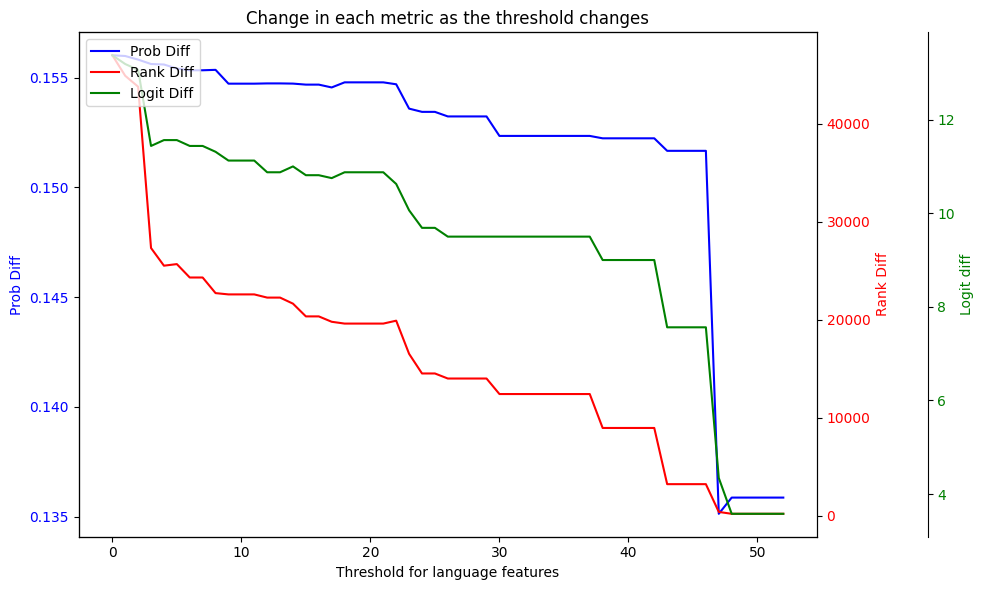

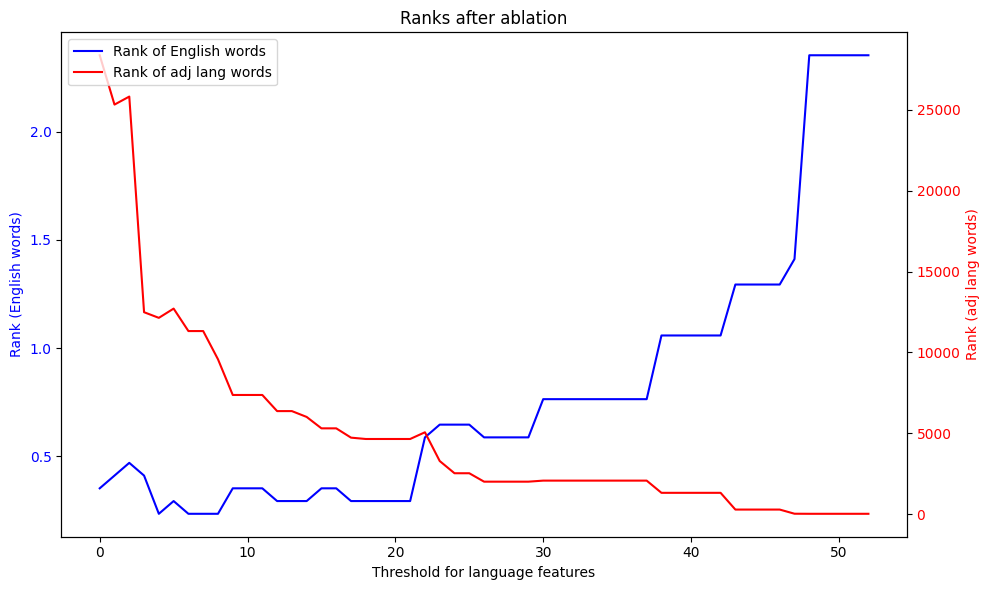

In [28]:
prob_rank_logit_visualize(threshold_options, p, r, l)
best_rank_visualize(threshold_options, b, t)

In [29]:
feature_lst_fr = choose_lang_node(lang_features_fr, 20)
for adj, ans in train_data:
    ablation_test_with_metrics('en', 'fr', Supernode('French', features=feature_lst_fr), -2, adj, ans)

The opposite of "petit" is "
[('grand', 0.470703125), ('grande', 0.134765625), ('big', 0.056396484375), ('gros', 0.0439453125), ('large', 0.03857421875), ('great', 0.0341796875), ('petit', 0.020751953125), ('g', 0.0125732421875), ('<strong>', 0.0125732421875), ('ma', 0.0111083984375)]
[('big', 0.51171875), ('large', 0.1005859375), ('<strong>', 0.02880859375), ('great', 0.02880859375), ('grande', 0.0174560546875), (' grande', 0.0174560546875), (' big', 0.0174560546875), (' groß', 0.015380859375), ('<b>', 0.01202392578125), ('Big', 0.01202392578125)]
Probability of "grand": old 0.470703125, new 0.00046539306640625, diff -0.47023773193359375
Probability of "gros": old 0.0439453125, new 6.100162863731384e-08, diff -0.04394525149837136
Rank of "grand": old 0, new 94, diff 94
Rank of "gros": old 3, new 15898, diff 15895
Logit difference of "grand" to "big": old 2.125, new -7.0, diff -9.125
Logit difference of "gros" to "big": old -0.25, new -15.9375, diff -15.6875
Logit difference of "grand"

Chinese Supernode

In [30]:
features_zh = []
for adj, ans in train_data:
    prompt = prompt_en.format(adj=adj['zh'])
    graph = attribute(
        prompt=prompt,
        model=model,
        max_n_logits=max_n_logits,
        desired_logit_prob=desired_logit_prob,
        batch_size=batch_size,
        max_feature_nodes=max_feature_nodes,
        offload=offload,
        verbose=verbose
    )
    paths_opp = distinct_path_max_bottleneck(graph, 2, 0, throughput_threshold=throughput_threshold, MAX_ITERATIONS=MAX_ITERATIONS)
    paths_adj = distinct_path_max_bottleneck(graph, -4, 0, throughput_threshold=throughput_threshold, MAX_ITERATIONS=MAX_ITERATIONS)
    paths_last = distinct_path_max_bottleneck(graph, -1, 0, throughput_threshold=throughput_threshold, MAX_ITERATIONS=MAX_ITERATIONS)
    paths_set = paths_list(paths_opp, paths_adj, paths_last)
    paths_pruned = prune_paths_by_first_last(graph, paths_set, threshold_first, threshold_last)
    last_pos_features = pick_last_pos_features(graph, paths_pruned)
    features_zh.extend(last_pos_features)

Phase 0: Precomputing activations and vectors
Precomputation completed in 0.25s
Found 7228 active features
Phase 1: Running forward pass
Forward pass completed in 0.61s
Phase 2: Building input vectors
Selected 5 logits with cumulative probability 0.9023
Will include 7228 of 7228 feature nodes
Input vectors built in 0.41s
Phase 3: Computing logit attributions
Logit attributions completed in 0.16s
Phase 4: Computing feature attributions
Feature influence computation: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 7228/7228 [00:02<00:00, 3476.81it/s]
Feature attributions completed in 2.08s
Attribution completed in 3.60s
Phase 0: Precomputing activations and vectors
Precomputation completed in 0.57s
Found 7101 active features
Phase 1: Running forward pass
Forward pass completed in 1.33s
Phase 2: Building input vectors
Selected 5 logits with cumulative probability 0.9258
Will include 7101 of 7101 feature nodes
Input vec

Hit MAX_ITERATIONS (75). Forced termination.


Phase 0: Precomputing activations and vectors
Precomputation completed in 0.56s
Found 7284 active features
Phase 1: Running forward pass
Forward pass completed in 1.33s
Phase 2: Building input vectors
Selected 5 logits with cumulative probability 0.9023
Will include 7284 of 7284 feature nodes
Input vectors built in 0.87s
Phase 3: Computing logit attributions
Logit attributions completed in 0.37s
Phase 4: Computing feature attributions
Feature influence computation: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 7284/7284 [00:04<00:00, 1524.21it/s]
Feature attributions completed in 4.78s
Attribution completed in 8.00s
Phase 0: Precomputing activations and vectors
Precomputation completed in 0.26s
Found 7319 active features
Phase 1: Running forward pass
Forward pass completed in 0.62s
Phase 2: Building input vectors
Selected 5 logits with cumulative probability 0.8906
Will include 7319 of 7319 feature nodes
Input vec

In [31]:
lang_features_zh = choose_language_features(features_zh, chinese_identifiers)

In [32]:
threshold_options = list(range(0, 60))
p = []
r = []
l = []
b = []
t = []
for threshold in threshold_options:
    probs = []
    ranks = []
    logits = []
    bases = []
    targets = []
    feature_lst = choose_lang_node(lang_features_zh, threshold)
    if not feature_lst:
        idx = threshold_options.index(threshold)
        threshold_options = threshold_options[:idx]
        break
    for adj, ans in train_data:
        prob_diffs, rank_diffs, logit_diffs, base_rank, target_rank = ablation_test_with_metrics('en', 'zh', Supernode('Chinese', features=feature_lst), -2, adj, ans, verbose=False)
        probs.extend(prob_diffs)
        ranks.extend(rank_diffs)
        logits.extend(logit_diffs)
        if base_rank >= 0:
            bases.append(base_rank)
        if target_rank >= 0:
            targets.append(target_rank)
    print(bases)
    prob = sum(probs) / len(probs)
    rank = sum(ranks) / len(ranks)
    logit = sum(logits) / len(logits)
    base = sum(bases) / len(bases)
    target = sum(targets) / len(targets)
    prob = prob.item() if isinstance(prob, torch.Tensor) else prob
    rank = rank.item() if isinstance(rank, torch.Tensor) else rank
    logit = logit.item() if isinstance(logit, torch.Tensor) else logit
    base = base.item() if isinstance(base, torch.Tensor) else base
    target = target.item() if isinstance(base, torch.Tensor) else target
    p.append(- prob)
    r.append(rank)
    l.append(- logit)
    b.append(base)
    t.append(target)

[0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 35, 0, 0, 1, 16]
[0, 0, 0, 0, 2, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 43, 0, 0, 1, 16]
[0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 49, 0, 0, 1, 16]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 55, 0, 0, 0, 17]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 55, 0, 0, 0, 17]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 39, 0, 0, 0, 19]
[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 101, 0, 0, 1, 19]
[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 101, 0, 0, 1, 19]
[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 101, 0, 0, 1, 19]
[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 58, 0, 0, 3, 16]
[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 58, 0, 0, 3, 16]
[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 58, 0, 0, 3, 16]
[2, 0, 0, 0, 1, 0, 0, 0, 2, 2, 0, 1, 0, 0, 0, 59, 0, 0, 4, 16]
[2, 0, 0, 0, 1, 0, 0, 0, 2, 2, 0, 1, 0, 0, 0, 59, 0, 0, 4, 16]
[2, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 1, 0, 0, 0, 62, 0, 0, 2, 14]
[0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 11, 0,

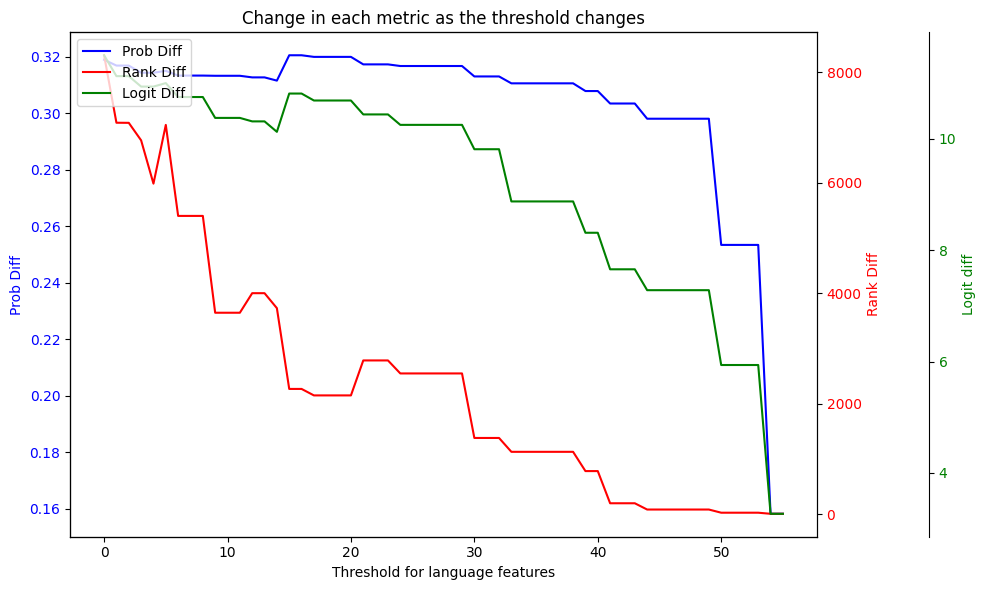

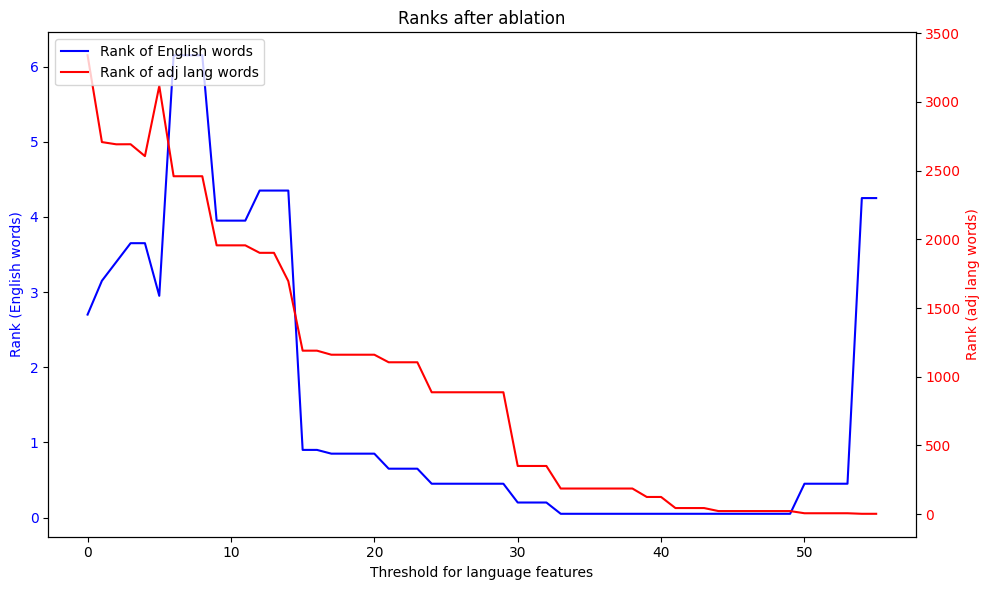

In [33]:
prob_rank_logit_visualize(threshold_options, p, r, l)
best_rank_visualize(threshold_options, b, t)

In [34]:
feature_lst_zh = choose_lang_node(lang_features_zh, 35)
for adj, ans in train_data:
    ablation_test_with_metrics('en', 'zh', Supernode('Chinese', features=feature_lst_zh), -2, adj, ans)

The opposite of "小" is "
[('大', 0.859375), ('big', 0.013916015625), (' 大', 0.013916015625), ('小', 0.0084228515625), ('大人', 0.0084228515625), ('<strong>', 0.0084228515625), ('大大', 0.003997802734375), ('老', 0.003997802734375), ('大了', 0.003997802734375), ('<b>', 0.003997802734375)]
[('big', 0.1923828125), ('大', 0.11669921875), (' big', 0.07080078125), ('large', 0.07080078125), (' 大', 0.033447265625), (' large', 0.0294189453125), ('Big', 0.02294921875), ('great', 0.017822265625), ('<strong>', 0.0157470703125), ('Large', 0.0157470703125)]
Probability of "大": old 0.859375, new 0.11669921875, diff -0.74267578125
Rank of "大": old 0, new 1, diff 1
Logit difference of "大" to "big": old 4.125, new -0.5, diff -4.625
Logit difference of "大" to "large": old 6.0, new 0.5, diff -5.5
Logit difference of "大" to " big": old 5.625, new 0.5, diff -5.125
Logit difference of "大" to " large": old 8.25, new 1.375, diff -6.875
The opposite of "重" is "
[('輕', 0.4140625), ('轻', 0.4140625), ('軽', 0.08154296875), (

German Supernode

In [35]:
features_de = []
for adj, ans in train_data:
    prompt = prompt_en.format(adj=adj['de'])
    graph = attribute(
        prompt=prompt,
        model=model,
        max_n_logits=max_n_logits,
        desired_logit_prob=desired_logit_prob,
        batch_size=batch_size,
        max_feature_nodes=max_feature_nodes,
        offload=offload,
        verbose=verbose
    )
    paths_opp = distinct_path_max_bottleneck(graph, 2, 0, throughput_threshold=throughput_threshold, MAX_ITERATIONS=MAX_ITERATIONS)
    paths_adj = distinct_path_max_bottleneck(graph, -4, 0, throughput_threshold=throughput_threshold, MAX_ITERATIONS=MAX_ITERATIONS)
    paths_last = distinct_path_max_bottleneck(graph, -1, 0, throughput_threshold=throughput_threshold, MAX_ITERATIONS=MAX_ITERATIONS)
    paths_set = paths_list(paths_opp, paths_adj, paths_last)
    paths_pruned = prune_paths_by_first_last(graph, paths_set, threshold_first, threshold_last)
    last_pos_features = pick_last_pos_features(graph, paths_pruned)
    features_de.extend(last_pos_features)

Phase 0: Precomputing activations and vectors
Precomputation completed in 0.57s
Found 7068 active features
Phase 1: Running forward pass
Forward pass completed in 1.33s
Phase 2: Building input vectors
Selected 5 logits with cumulative probability 0.8008
Will include 7068 of 7068 feature nodes
Input vectors built in 0.86s
Phase 3: Computing logit attributions
Logit attributions completed in 0.36s
Phase 4: Computing feature attributions
Feature influence computation: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 7068/7068 [00:04<00:00, 1498.47it/s]
Feature attributions completed in 4.72s
Attribution completed in 7.91s
Phase 0: Precomputing activations and vectors
Precomputation completed in 0.25s
Found 9049 active features
Phase 1: Running forward pass
Forward pass completed in 0.67s
Phase 2: Building input vectors
Selected 5 logits with cumulative probability 0.9180
Will include 9049 of 9049 feature nodes
Input vec

Hit MAX_ITERATIONS (75). Forced termination.
Hit MAX_ITERATIONS (75). Forced termination.


Phase 0: Precomputing activations and vectors
Precomputation completed in 0.26s
Found 8965 active features
Phase 1: Running forward pass
Forward pass completed in 0.67s
Phase 2: Building input vectors
Selected 5 logits with cumulative probability 0.7148
Will include 8965 of 8965 feature nodes
Input vectors built in 0.46s
Phase 3: Computing logit attributions
Logit attributions completed in 0.18s
Phase 4: Computing feature attributions
Feature influence computation: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8965/8965 [00:02<00:00, 3115.39it/s]
Feature attributions completed in 2.88s
Attribution completed in 4.56s
Phase 0: Precomputing activations and vectors
Precomputation completed in 0.64s
Found 6960 active features
Phase 1: Running forward pass
Forward pass completed in 1.30s
Phase 2: Building input vectors
Selected 5 logits with cumulative probability 0.3242
Will include 6960 of 6960 feature nodes
Input vec

Hit MAX_ITERATIONS (75). Forced termination.
Hit MAX_ITERATIONS (75). Forced termination.


Phase 0: Precomputing activations and vectors
Precomputation completed in 0.56s
Found 7362 active features
Phase 1: Running forward pass
Forward pass completed in 1.33s
Phase 2: Building input vectors
Selected 5 logits with cumulative probability 0.6953
Will include 7362 of 7362 feature nodes
Input vectors built in 0.87s
Phase 3: Computing logit attributions
Logit attributions completed in 0.36s
Phase 4: Computing feature attributions
Feature influence computation: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 7362/7362 [00:04<00:00, 1508.51it/s]
Feature attributions completed in 4.88s
Attribution completed in 8.10s
Phase 0: Precomputing activations and vectors
Precomputation completed in 0.55s
Found 7669 active features
Phase 1: Running forward pass
Forward pass completed in 1.32s
Phase 2: Building input vectors
Selected 5 logits with cumulative probability 0.4609
Will include 7669 of 7669 feature nodes
Input vec

Hit MAX_ITERATIONS (75). Forced termination.
Hit MAX_ITERATIONS (75). Forced termination.


Phase 0: Precomputing activations and vectors
Precomputation completed in 0.25s
Found 6854 active features
Phase 1: Running forward pass
Forward pass completed in 0.61s
Phase 2: Building input vectors
Selected 5 logits with cumulative probability 0.2793
Will include 6854 of 6854 feature nodes
Input vectors built in 0.41s
Phase 3: Computing logit attributions
Logit attributions completed in 0.16s
Phase 4: Computing feature attributions
Feature influence computation: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6854/6854 [00:01<00:00, 3687.44it/s]
Feature attributions completed in 1.86s
Attribution completed in 3.38s
Phase 0: Precomputing activations and vectors
Precomputation completed in 0.25s
Found 7286 active features
Phase 1: Running forward pass
Forward pass completed in 0.61s
Phase 2: Building input vectors
Selected 5 logits with cumulative probability 0.5547
Will include 7286 of 7286 feature nodes
Input vec

Hit MAX_ITERATIONS (75). Forced termination.


Phase 0: Precomputing activations and vectors
Precomputation completed in 0.57s
Found 9581 active features
Phase 1: Running forward pass
Forward pass completed in 1.64s
Phase 2: Building input vectors
Selected 5 logits with cumulative probability 0.9336
Will include 9581 of 9581 feature nodes
Input vectors built in 1.09s
Phase 3: Computing logit attributions
Logit attributions completed in 0.44s
Phase 4: Computing feature attributions
Feature influence computation: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9581/9581 [00:07<00:00, 1262.47it/s]
Feature attributions completed in 7.59s
Attribution completed in 11.47s
Phase 0: Precomputing activations and vectors
Precomputation completed in 0.59s
Found 7264 active features
Phase 1: Running forward pass
Forward pass completed in 1.34s
Phase 2: Building input vectors
Selected 5 logits with cumulative probability 0.2754
Will include 7264 of 7264 feature nodes
Input ve

In [36]:
lang_features_de = choose_language_features(features_de, german_identifiers)

In [37]:
threshold_options = list(range(0, 60))
p = []
r = []
l = []
b = []
t = []
for threshold in threshold_options:
    probs = []
    ranks = []
    logits = []
    bases = []
    targets = []
    feature_lst = choose_lang_node(lang_features_de, threshold)
    if not feature_lst:
        idx = threshold_options.index(threshold)
        threshold_options = threshold_options[:idx]
        break
    for adj, ans in train_data:
        prob_diffs, rank_diffs, logit_diffs, base_rank, target_rank = ablation_test_with_metrics('en', 'de', Supernode('German', features=feature_lst), -2, adj, ans, verbose=False)
        probs.extend(prob_diffs)
        ranks.extend(rank_diffs)
        logits.extend(logit_diffs)
        if base_rank >= 0:
            bases.append(base_rank)
        if target_rank >= 0:
            targets.append(target_rank)
    print(bases)
    prob = sum(probs) / len(probs)
    rank = sum(ranks) / len(ranks)
    logit = sum(logits) / len(logits)
    base = sum(bases) / len(bases)
    target = sum(targets) / len(targets)
    prob = prob.item() if isinstance(prob, torch.Tensor) else prob
    rank = rank.item() if isinstance(rank, torch.Tensor) else rank
    logit = logit.item() if isinstance(logit, torch.Tensor) else logit
    base = base.item() if isinstance(base, torch.Tensor) else base
    target = target.item() if isinstance(base, torch.Tensor) else target
    p.append(- prob)
    r.append(rank)
    l.append(- logit)
    b.append(base)
    t.append(target)

[0, 1, 9, 0, 0, 0, 68, 5, 2, 18, 5]
[0, 0, 3, 0, 0, 0, 135, 5, 2, 23, 7]
[0, 0, 2, 0, 0, 0, 116, 3, 1, 20, 5]
[0, 0, 2, 1, 0, 0, 162, 3, 3, 20, 18]
[0, 0, 4, 0, 0, 0, 172, 2, 2, 21, 17]
[0, 0, 8, 0, 1, 0, 207, 1, 2, 14, 17]
[0, 0, 15, 0, 1, 0, 262, 1, 3, 17, 4]
[0, 0, 17, 0, 0, 0, 236, 1, 3, 17, 3]
[0, 0, 13, 0, 0, 0, 258, 1, 3, 17, 5]
[0, 0, 17, 0, 1, 0, 238, 1, 3, 17, 3]
[0, 0, 17, 0, 1, 0, 238, 1, 3, 17, 3]
[0, 0, 12, 0, 0, 0, 184, 1, 3, 17, 3]
[0, 0, 11, 0, 0, 0, 157, 1, 3, 17, 7]
[0, 0, 11, 0, 2, 0, 128, 1, 5, 18, 16]
[0, 0, 11, 0, 2, 0, 157, 1, 3, 18, 43]
[0, 0, 7, 0, 0, 0, 83, 1, 2, 20, 32]
[0, 0, 7, 0, 0, 0, 83, 1, 2, 20, 32]
[0, 0, 7, 0, 0, 0, 83, 1, 2, 20, 32]
[0, 0, 1, 0, 0, 0, 52, 1, 2, 21, 19]
[0, 0, 1, 0, 0, 0, 43, 1, 2, 21, 29]
[0, 0, 1, 0, 1, 0, 53, 1, 2, 21, 37]
[0, 0, 1, 0, 1, 0, 36, 1, 2, 24, 39]
[0, 0, 1, 0, 1, 0, 38, 1, 2, 30, 13]
[0, 0, 1, 0, 0, 0, 45, 1, 2, 30, 6]
[0, 0, 1, 0, 0, 0, 7, 1, 1, 15, 21]
[0, 0, 1, 0, 0, 0, 7, 1, 1, 15, 21]
[0, 0, 1, 0, 0, 0, 7, 1, 1, 

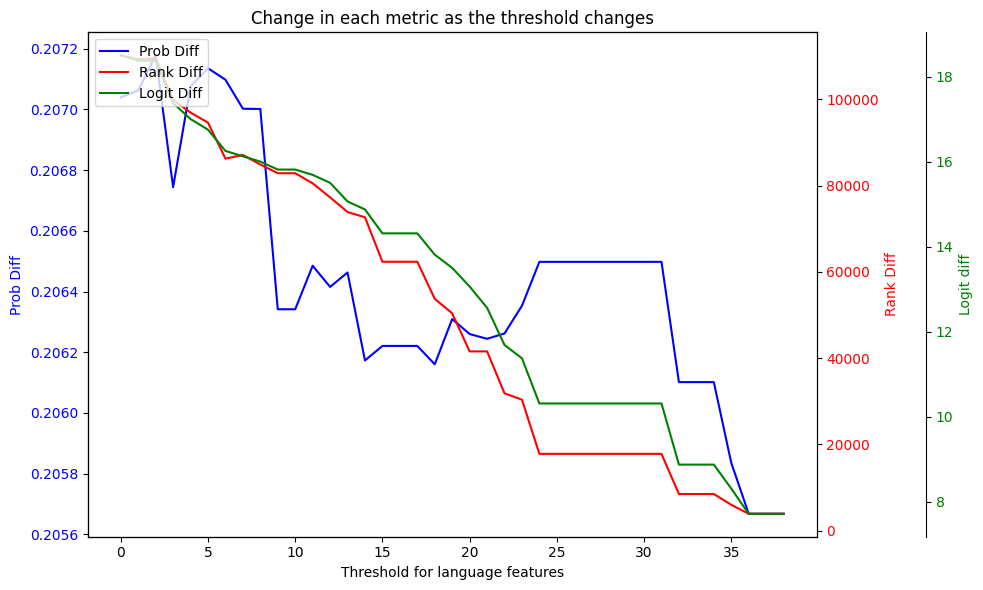

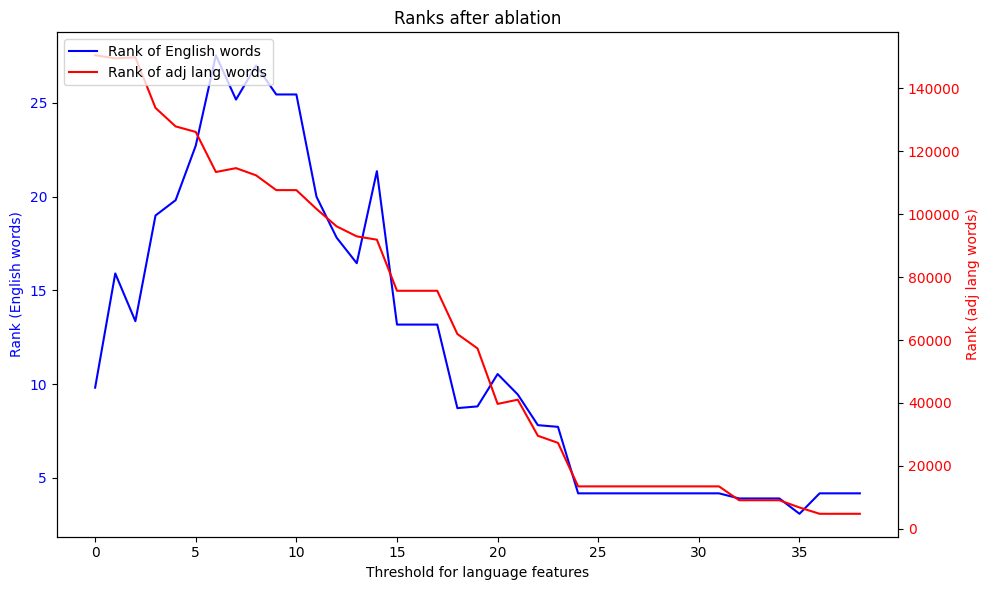

In [38]:
prob_rank_logit_visualize(threshold_options, p, r, l)
best_rank_visualize(threshold_options, b, t)

In [39]:
feature_lst_de = choose_lang_node(lang_features_de, 30)
for adj, ans in train_data:
    ablation_test_with_metrics('en', 'de', Supernode('German', features=feature_lst_de), -2, adj, ans)

The opposite of "klein" is "
[('groß', 0.421875), ('gross', 0.17578125), ('big', 0.09423828125), ('gro', 0.0732421875), ('klein', 0.03466796875), ('Gross', 0.016357421875), ('Groß', 0.016357421875), ('g', 0.01275634765625), ('gros', 0.01275634765625), ('great', 0.01123046875)]
[('big', 0.1923828125), ('large', 0.169921875), ('大', 0.0625), ('g', 0.048828125), ('grand', 0.033447265625), ('grande', 0.026123046875), ('great', 0.020263671875), ('<b>', 0.0179443359375), ('<em>', 0.0179443359375), ('<i>', 0.015869140625)]
Probability of "groß": old 0.421875, new 1.7210841178894043e-06, diff -0.4218732789158821
Rank of "groß": old 0, new 7002, diff 7002
Logit difference of "groß" to "big": old 1.5, new -11.625, diff -13.125
Logit difference of "groß" to "large": old 4.0, new -11.5, diff -15.5
Logit difference of "groß" to " big": old 8.0, new -4.75, diff -12.75
Logit difference of "groß" to " large": old 9.375, new -6.5, diff -15.875
The opposite of "schwer" is "
[('leicht', 0.6484375), ('le',

Japanese Supernode

In [40]:
features_ja = []
for adj, ans in train_data:
    prompt = prompt_en.format(adj=adj['ja'])
    graph = attribute(
        prompt=prompt,
        model=model,
        max_n_logits=max_n_logits,
        desired_logit_prob=desired_logit_prob,
        batch_size=batch_size,
        max_feature_nodes=max_feature_nodes,
        offload=offload,
        verbose=verbose
    )
    paths_opp = distinct_path_max_bottleneck(graph, 2, 0, throughput_threshold=throughput_threshold, MAX_ITERATIONS=MAX_ITERATIONS)
    paths_adj = distinct_path_max_bottleneck(graph, -4, 0, throughput_threshold=throughput_threshold, MAX_ITERATIONS=MAX_ITERATIONS)
    paths_last = distinct_path_max_bottleneck(graph, -1, 0, throughput_threshold=throughput_threshold, MAX_ITERATIONS=MAX_ITERATIONS)
    paths_set = paths_list(paths_opp, paths_adj, paths_last)
    paths_pruned = prune_paths_by_first_last(graph, paths_set, threshold_first, threshold_last)
    last_pos_features = pick_last_pos_features(graph, paths_pruned)
    features_ja.extend(last_pos_features)

Phase 0: Precomputing activations and vectors
Precomputation completed in 0.62s
Found 7314 active features
Phase 1: Running forward pass
Forward pass completed in 1.33s
Phase 2: Building input vectors
Selected 5 logits with cumulative probability 0.8750
Will include 7314 of 7314 feature nodes
Input vectors built in 0.87s
Phase 3: Computing logit attributions
Logit attributions completed in 0.36s
Phase 4: Computing feature attributions
Feature influence computation: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 7314/7314 [00:04<00:00, 1504.61it/s]
Feature attributions completed in 4.86s
Attribution completed in 8.13s


Hit MAX_ITERATIONS (75). Forced termination.


Phase 0: Precomputing activations and vectors
Precomputation completed in 0.26s
Found 7238 active features
Phase 1: Running forward pass
Forward pass completed in 0.61s
Phase 2: Building input vectors
Selected 3 logits with cumulative probability 0.9492
Will include 7238 of 7238 feature nodes
Input vectors built in 0.41s
Phase 3: Computing logit attributions
Logit attributions completed in 0.16s
Phase 4: Computing feature attributions
Feature influence computation: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 7238/7238 [00:02<00:00, 3432.60it/s]
Feature attributions completed in 2.11s
Attribution completed in 3.64s
Phase 0: Precomputing activations and vectors
Precomputation completed in 0.57s
Found 7133 active features
Phase 1: Running forward pass
Forward pass completed in 1.31s
Phase 2: Building input vectors
Selected 5 logits with cumulative probability 0.8711
Will include 7133 of 7133 feature nodes
Input vec

Hit MAX_ITERATIONS (75). Forced termination.


Phase 0: Precomputing activations and vectors
Precomputation completed in 0.60s
Found 7135 active features
Phase 1: Running forward pass
Forward pass completed in 1.33s
Phase 2: Building input vectors
Selected 5 logits with cumulative probability 0.6445
Will include 7135 of 7135 feature nodes
Input vectors built in 0.87s
Phase 3: Computing logit attributions
Logit attributions completed in 0.36s
Phase 4: Computing feature attributions
Feature influence computation: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 7135/7135 [00:04<00:00, 1557.04it/s]
Feature attributions completed in 4.58s
Attribution completed in 7.82s
Phase 0: Precomputing activations and vectors
Precomputation completed in 0.25s
Found 7225 active features
Phase 1: Running forward pass
Forward pass completed in 0.61s
Phase 2: Building input vectors
Selected 5 logits with cumulative probability 0.9141
Will include 7225 of 7225 feature nodes
Input vec

Hit MAX_ITERATIONS (75). Forced termination.


Phase 0: Precomputing activations and vectors
Precomputation completed in 0.56s
Found 7205 active features
Phase 1: Running forward pass
Forward pass completed in 1.33s
Phase 2: Building input vectors
Selected 5 logits with cumulative probability 0.9336
Will include 7205 of 7205 feature nodes
Input vectors built in 0.88s
Phase 3: Computing logit attributions
Logit attributions completed in 0.37s
Phase 4: Computing feature attributions
Feature influence computation: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 7205/7205 [00:04<00:00, 1462.88it/s]
Feature attributions completed in 4.93s
Attribution completed in 8.15s


Hit MAX_ITERATIONS (75). Forced termination.


Phase 0: Precomputing activations and vectors
Precomputation completed in 0.25s
Found 7016 active features
Phase 1: Running forward pass
Forward pass completed in 0.61s
Phase 2: Building input vectors
Selected 5 logits with cumulative probability 0.4453
Will include 7016 of 7016 feature nodes
Input vectors built in 0.41s
Phase 3: Computing logit attributions
Logit attributions completed in 0.16s
Phase 4: Computing feature attributions
Feature influence computation: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 7016/7016 [00:02<00:00, 3484.99it/s]
Feature attributions completed in 2.02s
Attribution completed in 3.54s
Phase 0: Precomputing activations and vectors
Precomputation completed in 0.56s
Found 7148 active features
Phase 1: Running forward pass
Forward pass completed in 1.32s
Phase 2: Building input vectors
Selected 5 logits with cumulative probability 0.4434
Will include 7148 of 7148 feature nodes
Input vec

Hit MAX_ITERATIONS (75). Forced termination.


Phase 0: Precomputing activations and vectors
Precomputation completed in 0.60s
Found 8187 active features
Phase 1: Running forward pass
Forward pass completed in 1.43s
Phase 2: Building input vectors
Selected 5 logits with cumulative probability 0.5625
Will include 8187 of 8187 feature nodes
Input vectors built in 0.94s
Phase 3: Computing logit attributions
Logit attributions completed in 0.39s
Phase 4: Computing feature attributions
Feature influence computation: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8187/8187 [00:05<00:00, 1483.44it/s]
Feature attributions completed in 5.52s
Attribution completed in 9.00s
Phase 0: Precomputing activations and vectors
Precomputation completed in 0.26s
Found 8677 active features
Phase 1: Running forward pass
Forward pass completed in 0.67s
Phase 2: Building input vectors
Selected 5 logits with cumulative probability 0.7305
Will include 8677 of 8677 feature nodes
Input vec

In [41]:
lang_features_ja = choose_language_features(features_ja, japanese_identifiers)

In [42]:
threshold_options = list(range(0, 60))
p = []
r = []
l = []
b = []
t = []
for threshold in threshold_options:
    probs = []
    ranks = []
    logits = []
    bases = []
    targets = []
    feature_lst = choose_lang_node(lang_features_ja, threshold)
    if not feature_lst:
        idx = threshold_options.index(threshold)
        threshold_options = threshold_options[:idx]
        break
    for adj, ans in train_data:
        prob_diffs, rank_diffs, logit_diffs, base_rank, target_rank = ablation_test_with_metrics('en', 'ja', Supernode('Japanese', features=feature_lst), -2, adj, ans, verbose=False)
        probs.extend(prob_diffs)
        ranks.extend(rank_diffs)
        logits.extend(logit_diffs)
        if base_rank >= 0:
            bases.append(base_rank)
        if target_rank >= 0:
            targets.append(target_rank)
    print(bases)
    prob = sum(probs) / len(probs)
    rank = sum(ranks) / len(ranks)
    logit = sum(logits) / len(logits)
    base = sum(bases) / len(bases)
    target = sum(targets) / len(targets)
    prob = prob.item() if isinstance(prob, torch.Tensor) else prob
    rank = rank.item() if isinstance(rank, torch.Tensor) else rank
    logit = logit.item() if isinstance(logit, torch.Tensor) else logit
    base = base.item() if isinstance(base, torch.Tensor) else base
    target = target.item() if isinstance(base, torch.Tensor) else target
    p.append(- prob)
    r.append(rank)
    l.append(- logit)
    b.append(base)
    t.append(target)

[0, 0, 0, 0, 0, 1, 0, 0, 7, 0, 0, 0, 0, 10, 1, 0, 0, 1, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 7, 0, 0, 0, 0, 7, 0, 0, 0, 1, 0, 0]
[0, 0, 0, 0, 0, 0, 0, 0, 11, 0, 0, 0, 0, 10, 2, 0, 0, 1, 0, 2]
[0, 0, 0, 0, 0, 1, 0, 0, 10, 0, 1, 0, 0, 8, 1, 0, 0, 6, 0, 2]
[0, 0, 0, 0, 0, 1, 0, 0, 10, 0, 1, 0, 0, 13, 2, 0, 0, 6, 0, 2]
[0, 0, 0, 0, 0, 1, 0, 0, 11, 0, 0, 0, 0, 12, 2, 0, 0, 6, 0, 2]
[0, 0, 0, 0, 0, 1, 0, 0, 8, 0, 0, 1, 0, 14, 2, 0, 0, 8, 0, 0]
[0, 0, 0, 0, 0, 1, 0, 0, 8, 0, 0, 1, 0, 14, 2, 0, 0, 8, 0, 0]
[0, 0, 0, 0, 0, 1, 0, 0, 8, 0, 0, 1, 0, 14, 2, 0, 0, 8, 0, 0]
[0, 0, 0, 0, 0, 1, 0, 0, 2, 0, 0, 0, 0, 15, 1, 0, 0, 8, 0, 1]
[0, 0, 0, 0, 0, 1, 0, 0, 2, 0, 0, 0, 0, 15, 2, 0, 0, 7, 0, 0]
[0, 0, 0, 0, 0, 1, 0, 0, 2, 0, 0, 0, 0, 15, 2, 0, 0, 7, 0, 0]
[0, 0, 0, 0, 0, 1, 0, 0, 2, 0, 0, 0, 0, 10, 2, 0, 0, 2, 1, 0]
[0, 0, 0, 0, 0, 1, 0, 0, 2, 0, 0, 0, 0, 10, 2, 0, 0, 2, 1, 0]
[0, 0, 0, 0, 0, 1, 0, 0, 2, 0, 0, 0, 0, 10, 2, 0, 0, 2, 1, 0]
[0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 11, 0, 0, 0, 2, 1, 0]
[0, 0,

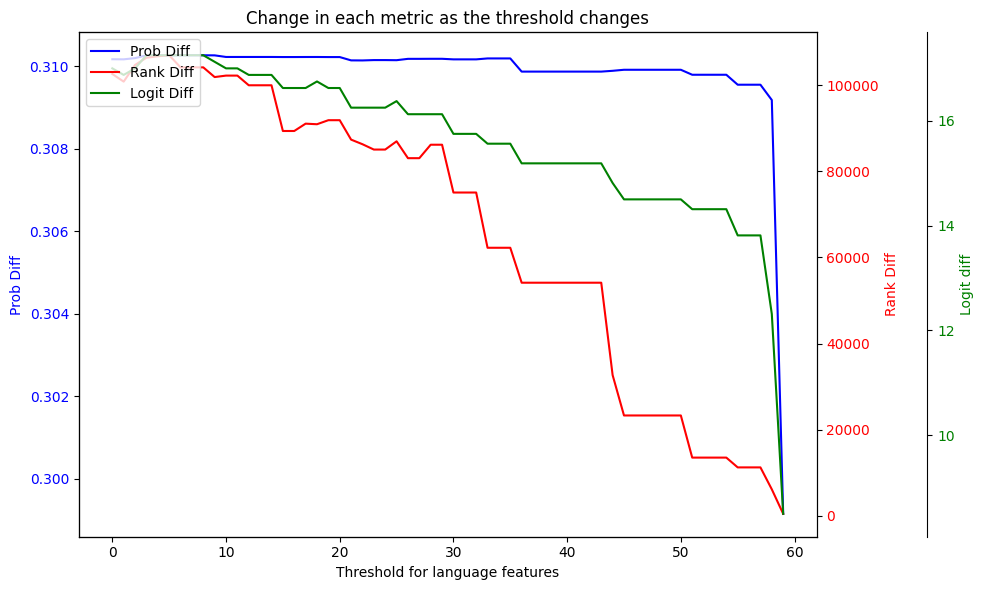

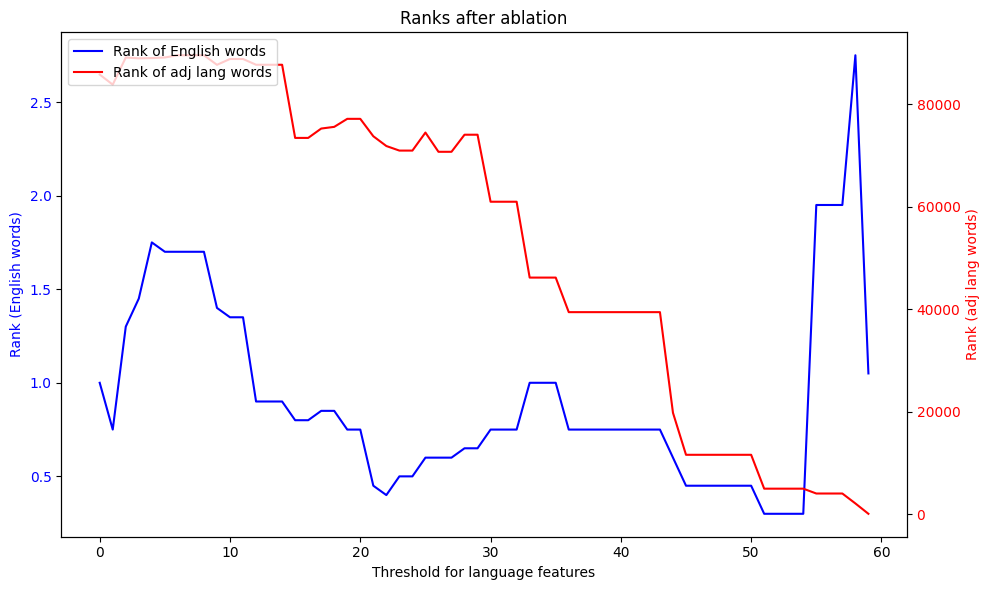

In [43]:
prob_rank_logit_visualize(threshold_options, p, r, l)
best_rank_visualize(threshold_options, b, t)

In [44]:
feature_lst_ja = choose_lang_node(lang_features_ja, 22)
for adj, ans in train_data:
    ablation_test_with_metrics('en', 'ja', Supernode('Japanese', features=feature_lst_ja), -2, adj, ans)

The opposite of "小さい" is "
[('大きい', 0.64453125), ('大きな', 0.08740234375), ('大き', 0.08740234375), ('大', 0.0283203125), ('大きく', 0.0283203125), ('<strong>', 0.01953125), ('<b>', 0.01519775390625), ('おお', 0.013427734375), ('大人', 0.0118408203125), ('小さい', 0.0118408203125)]
[(' big', 0.14453125), (' ', 0.087890625), (' large', 0.060546875), (' Big', 0.0152587890625), (' "', 0.01348876953125), (' much', 0.01190185546875), (' Large', 0.010498046875), (' good', 0.010498046875), (' 大', 0.010498046875), (' LARGE', 0.0081787109375)]
Probability of "大きい": old 0.64453125, new 5.029141902923584e-08, diff -0.644531199708581
Rank of "大きい": old 0, new 114870, diff 114870
Logit difference of "大きい" to "big": old 5.6875, new -11.5, diff -17.25
Logit difference of "大きい" to "large": old 6.75, new -11.25, diff -18.0
Logit difference of "大きい" to " big": old 8.4375, new -14.875, diff -23.25
Logit difference of "大きい" to " large": old 9.5625, new -14.0, diff -23.5
The opposite of "重い" is "
[('軽い', 0.578125), ('軽',

In [45]:
fr_supernode = Supernode('French', features=feature_lst_fr)
de_supernode = Supernode('German', features=feature_lst_de)
zh_supernode = Supernode('Chinese', features=feature_lst_zh)
ja_supernode = Supernode('Japanese', features=feature_lst_ja)

Non-English Supernode

In [46]:
def merge_feature_list(*lists: list[tuple[int, int]]) -> list[tuple[int, int]]:
    result_set = list()
    for lst in lists:
        for feature in lst:
            result_set.append(feature)
    return result_set

feature_whole = merge_feature_list(features_de, features_ja, features_fr, features_zh)

In [47]:
lang_features_non_english = choose_language_features(feature_whole, non_english_identifiers)

In [48]:
def threshold_prune(lang_features: dict[str, int]) -> list[int]:
    options_set = set()
    for value in lang_features.values():
        options_set.add(value)
    options = [0]
    options.extend(list(options_set))
    options.sort()
    return options

threshold_options = threshold_prune(lang_features_non_english)
p = []
r = []
l = []
b = []
t = []
for threshold in threshold_options:
    probs = []
    ranks = []
    logits = []
    bases = []
    targets = []
    feature_lst = choose_lang_node(lang_features_non_english, threshold)
    if not feature_lst:
        idx = threshold_options.index(threshold)
        threshold_options = threshold_options[:idx]
        break
    for lang in ['fr', 'zh', 'de', 'ja']:
        for adj, ans in train_data:
            prob_diffs, rank_diffs, logit_diffs, base_rank, target_rank = ablation_test_with_metrics('en', lang, Supernode('Non-english', features=feature_lst), -2, adj, ans, verbose=False)
            probs.extend(prob_diffs)
            ranks.extend(rank_diffs)
            logits.extend(logit_diffs)
            if base_rank >= 0:
                bases.append(base_rank)
            if target_rank >= 0:
                targets.append(target_rank)
    print(bases)
    prob = sum(probs) / len(probs)
    rank = sum(ranks) / len(ranks)
    logit = sum(logits) / len(logits)
    base = sum(bases) / len(bases)
    target = sum(targets) / len(targets)
    prob = prob.item() if isinstance(prob, torch.Tensor) else prob
    rank = rank.item() if isinstance(rank, torch.Tensor) else rank
    logit = logit.item() if isinstance(logit, torch.Tensor) else logit
    base = base.item() if isinstance(base, torch.Tensor) else base
    target = target.item() if isinstance(base, torch.Tensor) else target
    p.append(- prob)
    r.append(rank)
    l.append(- logit)
    b.append(base)
    t.append(target)

[1, 0, 1, 0, 7, 14, 4, 3, 7, 0, 23, 2, 1, 6, 0, 1, 29, 2, 1, 0, 3, 2, 0, 2, 2, 3, 1, 0, 1, 0, 0, 0, 6, 1, 2, 18, 2, 0, 2, 0, 4, 2, 9, 4, 28, 3, 17, 0, 1, 1, 2, 2, 5, 1, 0, 7, 5, 9, 0, 3, 7, 0, 0, 2, 2, 8, 27, 2]
[1, 0, 1, 0, 6, 14, 4, 6, 7, 0, 26, 2, 1, 6, 0, 1, 29, 2, 1, 0, 3, 2, 0, 2, 2, 3, 1, 0, 1, 0, 0, 0, 6, 1, 2, 26, 2, 0, 2, 0, 5, 11, 9, 4, 28, 3, 17, 0, 1, 1, 1, 2, 5, 1, 0, 7, 5, 9, 0, 3, 7, 0, 0, 2, 2, 8, 27, 2]
[1, 0, 1, 0, 6, 14, 4, 6, 7, 0, 26, 2, 1, 7, 0, 2, 35, 2, 1, 0, 3, 2, 0, 2, 2, 3, 1, 0, 1, 0, 0, 0, 6, 1, 2, 26, 2, 0, 3, 0, 5, 11, 11, 4, 36, 3, 27, 0, 1, 1, 1, 2, 5, 1, 0, 7, 5, 9, 0, 3, 7, 0, 0, 2, 2, 8, 27, 2]
[1, 0, 1, 0, 6, 14, 4, 6, 7, 0, 26, 2, 1, 7, 0, 2, 35, 2, 1, 0, 3, 2, 0, 2, 2, 3, 1, 0, 1, 0, 0, 0, 6, 1, 2, 26, 2, 0, 3, 0, 5, 11, 11, 4, 36, 3, 27, 0, 1, 1, 1, 2, 5, 1, 0, 7, 5, 9, 0, 3, 7, 0, 0, 2, 2, 8, 27, 2]
[1, 0, 1, 0, 6, 14, 4, 6, 7, 0, 10, 2, 1, 5, 0, 2, 35, 2, 1, 0, 3, 2, 0, 2, 2, 3, 1, 0, 1, 0, 0, 0, 6, 1, 2, 26, 2, 0, 3, 0, 5, 11, 11, 4, 36, 3, 2

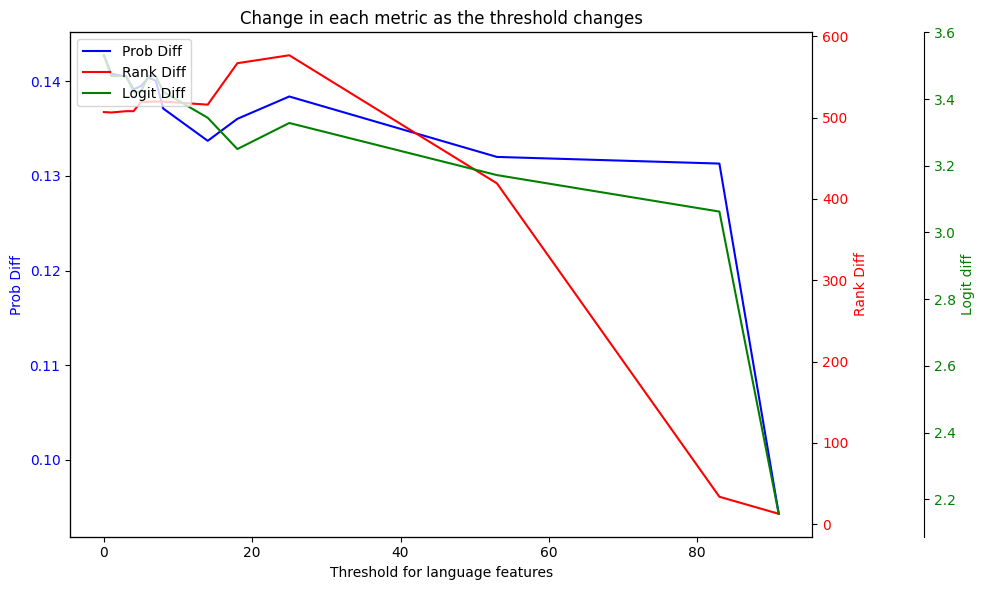

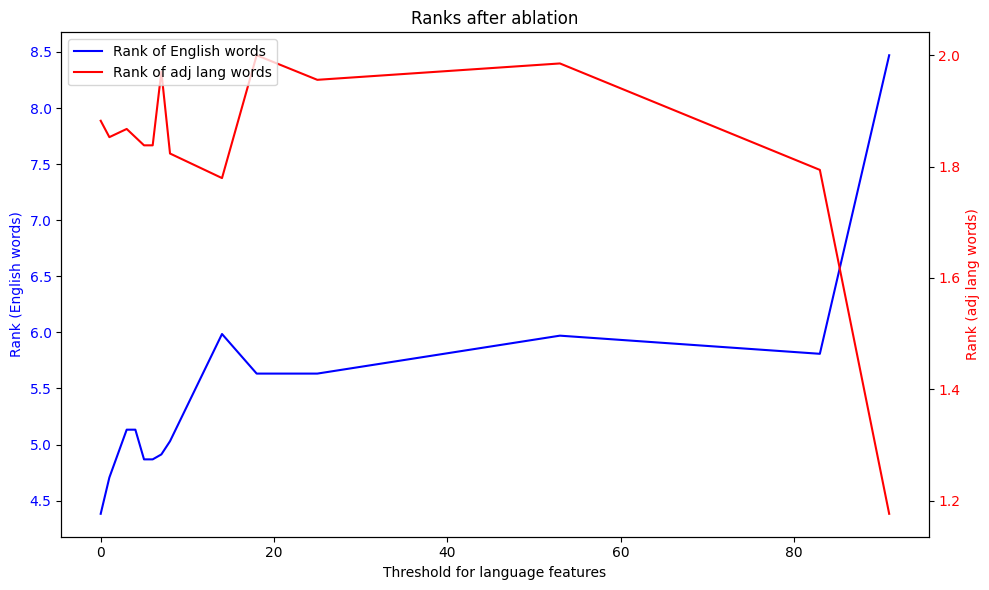

In [49]:
prob_rank_logit_visualize(threshold_options, p, r, l)
best_rank_visualize(threshold_options, b, t)

In [50]:
feature_lst_non_english = choose_lang_node(lang_features_non_english, 25)
for lang in ['fr', 'zh', 'de', 'ja']:
    for adj, ans in train_data:
        prob_diffs, rank_diffs, logit_diffs, base_rank, target_rank = ablation_test_with_metrics('en', lang, Supernode('Non-english', features=feature_lst_non_english), -2, adj, ans)

The opposite of "petit" is "
[('grand', 0.470703125), ('grande', 0.134765625), ('big', 0.056396484375), ('gros', 0.0439453125), ('large', 0.03857421875), ('great', 0.0341796875), ('petit', 0.020751953125), ('g', 0.0125732421875), ('<strong>', 0.0125732421875), ('ma', 0.0111083984375)]
[('grand', 0.330078125), ('big', 0.12109375), ('large', 0.09423828125), ('grande', 0.09423828125), ('great', 0.06494140625), ('gros', 0.0306396484375), ('Grand', 0.0269775390625), ('<strong>', 0.0238037109375), ('<em>', 0.0185546875), ('<b>', 0.01275634765625)]
Probability of "grand": old 0.470703125, new 0.330078125, diff -0.140625
Probability of "gros": old 0.0439453125, new 0.0306396484375, diff -0.0133056640625
Rank of "grand": old 0, new 0, diff 0
Rank of "gros": old 3, new 5, diff 2
Logit difference of "grand" to "big": old 2.125, new 1.0, diff -1.125
Logit difference of "gros" to "big": old -0.25, new -1.375, diff -1.125
Logit difference of "grand" to "large": old 2.5, new 1.25, diff -1.25
Logit di

In [51]:
non_en_supernode = Supernode('Non English', features=feature_lst_non_english)

In [65]:
supernode_dict = {
    'en': non_en_supernode, 'fr': fr_supernode, 'zh': zh_supernode,
    'de': de_supernode, 'ja': ja_supernode,
}
langs = ['en', 'fr', 'zh', 'de', 'ja']

In [66]:
# save the supernode info to avoid recomputation
features_str_dict = dict()
for key, value in supernode_dict.items():
    features = value.features
    features_str = []
    for feature in features:
        layer = feature.layer
        pos = feature.pos
        feature_idx = feature.feature_idx
        feature_str = f"{layer}.{pos}.{feature_idx}"
        features_str.append(feature_str)
    features_str_dict[key] = features_str

with open("supernodes_dict.json", "w") as f:
    json.dump(features_str_dict, f)

In [7]:
with open("supernodes_dict.json", "r") as f:
    features_str_dict = json.load(f)

feature_lst_dict = dict()
for key, value in features_str_dict.items():
    f_lst = []
    for feature in value:
        layer, pos, feature_idx = feature.split('.')
        layer = int(layer)
        pos = int(pos)
        feature_idx = int(feature_idx)
        f = Feature(layer=layer, pos=pos, feature_idx=feature_idx)
        f_lst.append(f)
    feature_lst_dict[key] = f_lst

non_en_supernode = Supernode('Non English', features=feature_lst_dict['en'])
fr_supernode = Supernode('French', features=feature_lst_dict['fr'])
de_supernode = Supernode('German', features=feature_lst_dict['de'])
zh_supernode = Supernode('Chinese', features=feature_lst_dict['zh'])
ja_supernode = Supernode('Japanese', features=feature_lst_dict['ja'])

supernode_dict = {
    'en': non_en_supernode, 'fr': fr_supernode, 'zh': zh_supernode,
    'de': de_supernode, 'ja': ja_supernode,
}
langs = ['en', 'fr', 'zh', 'de', 'ja']

### Determine amplification values from generic sentences

In [11]:
from circuit_tracer import ReplacementModel, attribute
from circuit_tracer.graph import Graph
from utils import extract_supernode_features
from graph_visualization import create_graph_visualization, Supernode, InterventionGraph, Feature

import json
from collections import namedtuple
from typing import List, Dict, Optional, Callable
import matplotlib.pyplot as plt
import numpy as np
from datasets import load_dataset

import math
import random
import regex
import statistics
import torch

In [12]:
# control these parameters to avoid CUDA OOM
max_n_logits = 5
desired_logit_prob = 0.95
max_feature_nodes = None
batch_size = 256
offload = 'cpu'
verbose = True


In [14]:
def set_features_from_supernodes(*supernodes: Supernode) -> list[Feature]:
    feature_lst = []
    for supernode in supernodes:
        feature_lst.extend(supernode.features)
    return list(set(feature_lst))

def feature_find(graph: Graph, feature: Feature) -> Optional[int]:
    layer = feature.layer
    pos = feature.pos
    if pos < 0:
        pos = graph.n_pos + pos
    feature_idx = feature.feature_idx
    feature_tensor = torch.tensor([layer, pos, feature_idx], device=device)

    element_wise_match = (graph.active_features == feature_tensor)
    row_match = torch.all(element_wise_match, dim=1)
    matching_indices = torch.where(row_match)[0]
    if matching_indices.numel() > 1:
        raise ValueError('Multiple matching rows')
    elif matching_indices.numel() == 0:
        return None
    return matching_indices.item()

def get_feature_activation_from_prompt(prompt: str, feature_list: list[Feature]) -> list[float]:
    graph = attribute(
        prompt=prompt,
        model=model,
        max_n_logits=max_n_logits,
        desired_logit_prob=desired_logit_prob,
        batch_size=batch_size,
        max_feature_nodes=max_feature_nodes,
        offload=offload,
        verbose=verbose
    )
    activation_list = []
    for feature in feature_list:
        idx = feature_find(graph, feature)
        if idx == None:
            activation_list.append(float('nan'))
        else:
            activation_value = graph.activation_values[idx]
            activation_value = activation_value.item() if isinstance(activation_value, torch.Tensor) else activation_value
            activation_list.append(activation_value)
    del graph
    return activation_list

def iterate_over_sentences(prompts: list[str], feature_list: list[Feature]) -> dict[Feature, list[float]]:
    activation_values_dict = dict()
    for feature in feature_list:
        activation_values_dict[feature] = []
    for prompt in prompts:
        activation_list = get_feature_activation_from_prompt(prompt, feature_list)
        for i, feature in enumerate(feature_list):
            activation_values_dict[feature].append(activation_list[i])
    return activation_values_dict

def make_histogram_from_values_dict(data: list[float], bins: int = 30, title: str = "Histogram of Data (NaNs Excluded)", xlabel: str = "Value", ylabel: str = "Frequency") -> None:
    clean_data = []
    nan_count = 0
    
    for x in data:
        if math.isnan(x):
            nan_count += 1
        else:
            clean_data.append(x)

    print(f"Total NaN values found: {nan_count}")
    if not clean_data:
        print("No valid data points to plot after excluding NaNs.")
        return
    
    maximum = max(clean_data)
    minimum = min(clean_data)
    mean = statistics.mean(clean_data)
    median = statistics.median(clean_data)
    print(f'Max {maximum}, Min {minimum}, Mean {mean}, Median {median}')
    
    plt.figure(figsize=(10, 6)) # Set figure size for better readability
    plt.hist(clean_data, bins=bins, edgecolor='black', alpha=0.7) # 'edgecolor' for bin borders, 'alpha' for transparency
    
    # Add labels and title
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    
    # Add a text box to display NaN count on the plot
    plt.text(0.95, 0.95, f'NaNs: {nan_count}, Max: {maximum}, Min: {minimum}, Mean: {mean}, Median: {median}', transform=plt.gca().transAxes,
             fontsize=12, verticalalignment='top', horizontalalignment='right',
             bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5))
             
    plt.grid(axis='y', alpha=0.75) # Add a grid for better readability
    plt.show()
    return

def print_feature(feature: Feature) -> str:
    layer = feature.layer
    feature_idx = feature.feature_idx
    layer = layer.item() if isinstance(layer, torch.Tensor) else layer
    feature_idx = feature_idx.item() if isinstance(feature_idx, torch.Tensor) else feature_idx
    return f'Layer {layer}, feature_idx {feature_idx}'

# character-checks
def is_english_alphabet_char(char: str) -> bool:
    if len(char) > 1:
        raise AssertionError('Argument should be one character')
    return ('a' <= char <= 'z' or 'A' <= char <= 'Z')

def is_french_alphabet_char(char: str) -> bool:
    if len(char) > 1:
        raise AssertionError('Argument should be one character')
    french_chars = "abcdefghijklmnopqrstuvwxyzABCDEFGHIJKLMNOPQRSTUVWXYZàâæçéèêëîïôœùûüÿÀÂÆÇÉÈÊËÎÏÔŒÙÛÜŸ"
    return char.isalpha() and char in french_chars

# may not be comprehensive
def is_german_alphabet_char(char: str) -> bool:
    if len(char) > 1:
        raise AssertionError('Argument should be one character')
    
    if not char.isalpha():
        return False
    german_specific_chars = "äöüÄÖÜß"
    if char in german_specific_chars:
        return True
    elif is_english_alphabet_char(char):
        return True
    else:
        return False
    
def is_chinese_alphabet_char(char: str) -> bool:
    if len(char) > 1:
        raise AssertionError('Argument should be one character')
    
    return bool(regex.fullmatch(r'\p{Han}', char))

def is_japanese_alphabet_char(char: str) -> bool:
    if len(char) > 1:
        raise AssertionError('Argument should be one character')
    unicode_value = ord(char)
    # Hiragana range
    if 0x3040 <= unicode_value <= 0x309F:
        return True
    # Katakana range
    elif 0x30A0 <= unicode_value <= 0x30FF:
        return True
    # CJK Unified Ideographs (Kanji) range
    elif 0x4E00 <= unicode_value <= 0x9FFF:
        return True
    return False

def english_sentence_clean(sentence: str) -> str:
    words = sentence.split(" ")
    modified_words = []
    for word in words:
        if word == 'i':
            modified_words.append(' I')
        elif word[0] == ',' or word[0] == "'" or word[0] == '?' or word[0] == '.':
            modified_words.append(word)
        else:
            modified_words.append(' ' + word)
    result = "".join(modified_words)
    if result[0] == ' ':
        result = result[1:]
    
    return result

def french_sentence_clean(sentence: str) -> str:
    words = sentence.split(" ")
    modified_words = []
    ends_with_apos = False
    for word in words:
        if ends_with_apos:
            modified_words.append(word)
        elif word[0] == ',' or word[0] == "'" or word[0] == '?' or word[0] == '.':
            modified_words.append(word)
        else:
            modified_words.append(' ' + word)
        
        if word[-1] == "'":
            ends_with_apos = True
        else:
            ends_with_apos = False

    result = "".join(modified_words)
    if result[0] == ' ':
        result = result[1:]
    
    return result

def german_sentence_clean(sentence: str) -> str:
    words = sentence.split(" ")
    modified_words = []
    for word in words:
        if word[0] == ',' or word[0] == "'" or word[0] == '?' or word[0] == '.':
            modified_words.append(word)
        else:
            modified_words.append(' ' + word)

    result = "".join(modified_words)
    if result[0] == ' ':
        result = result[1:]
    
    return result

def chinese_sentence_clean(sentence: str) -> str:
    words = sentence.split(" ")
    modified_words = []
    before_eng_alphabet = False
    for word in words:
        if word[0] == ',' or word[0] == "'" or word[0] == '?' or word[0] == '.':
            modified_words.append(word)
        elif before_eng_alphabet or is_english_alphabet_char(word[0]):
            modified_words.append(' ' + word)
        else:
            modified_words.append(word)
        before_eng_alphabet = is_english_alphabet_char(word[-1])

    result = "".join(modified_words)
    if result[0] == ' ':
        result = result[1:]
    
    return result

def sentences_clean(sentences: list[str], function: Callable) -> list[str]:
    cleaned = []
    for sentence in sentences:
        cleaned.append(function(sentence))
    return cleaned

def is_valid_word(word: str, function: Callable) -> bool:
    if function(word[0]):
        return True
    elif word[0] == ' ' and len(word) > 1:
        return function(word[1])
    else:
        return False

# min_tokens is for the minimum length of the original sentence, 
# max_tokens is for the maximum length for the resulting incomplete sentences
def filter_sentences(sentences: list[str], function: Callable, num_sentences: int=100, min_tokens: int=6, max_tokens: int=20, random_seed: int = 42) -> list[str]:
    MAX_ITERATIONS = 20
    random.seed(random_seed)
    filtered = []
    for sentence in sentences:
        if len(filtered) >= num_sentences:
            break
        tokenized = model.tokenizer.encode(sentence)
        n = len(tokenized)
        if n <= min_tokens:
            continue
        random_token = random.randint(3, min(n-2, max_tokens))
        next_token = model.tokenizer.decode(tokenized[random_token])
        iterations = 0
        while not (is_valid_word(next_token, function)):
            if iterations > MAX_ITERATIONS:
                print(sentence)
                raise TypeError('No character of the specified language found')
            random_token = random.randint(3, min(n-2, max_tokens))
            next_token = model.tokenizer.decode(tokenized[random_token])
            iterations += 1
        decoded = model.tokenizer.decode(tokenized[1:random_token])
        filtered.append(decoded)
    if len(filtered) < num_sentences:
        raise ValueError('Not enough good sentences')
    return filtered

features_lst = set_features_from_supernodes(non_en_supernode, fr_supernode, de_supernode, zh_supernode, ja_supernode)

In [15]:
# prepare dataset
dataset_en = load_dataset("xnli", "en") # Load English split
dataset_fr = load_dataset('xnli', 'fr')
dataset_de = load_dataset('xnli', 'de')
dataset_zh = load_dataset('xnli', 'zh')

english_sentences = dataset_en.shuffle(seed=45)['train'][:150]['premise']
french_sentences = dataset_fr.shuffle(seed=31)['train'][:150]['premise']
german_sentences = dataset_de.shuffle(seed=87)['train'][:150]['premise']
chinese_sentences = dataset_zh.shuffle(seed=47)['train'][:150]['premise']

cleaned_en = sentences_clean(english_sentences, english_sentence_clean)
cleaned_fr = sentences_clean(french_sentences, french_sentence_clean)
cleaned_de = sentences_clean(german_sentences, german_sentence_clean)
cleaned_zh = sentences_clean(chinese_sentences, chinese_sentence_clean)

filtered_en = filter_sentences(cleaned_en, is_english_alphabet_char)
filtered_fr = filter_sentences(cleaned_fr, is_french_alphabet_char)
filtered_de = filter_sentences(cleaned_de, is_german_alphabet_char)
filtered_zh = filter_sentences(cleaned_zh, is_chinese_alphabet_char)

In [16]:
# make sure you have datasets == 3.6.0 to avoid an error
dataset_ja1 = load_dataset("shunk031/JGLUE", "MARC-ja", split="train")
sentences_ja1 = dataset_ja1.shuffle(seed=483)['sentence'][:50]
dataset_ja2 = load_dataset("shunk031/JGLUE", name="JCoLA")['train']
sentences_ja2 = dataset_ja2.shuffle(seed=41)['sentence'][:50]
dataset_ja3 = load_dataset("shunk031/JGLUE", name="JSTS")['train']
sentences_ja3 = dataset_ja3.shuffle(seed=67)['sentence1'][:50]

cleaned_ja = sentences_ja1 + sentences_ja2 + sentences_ja3

filtered_ja = filter_sentences(cleaned_ja, is_japanese_alphabet_char)

In [17]:
def map_features_to_supernodes(supernodes: dict[str, Supernode]) -> dict[Feature, [str]]:
    feature_to_supernodes_dict = dict()
    for key, value in supernodes.items():
        name = value.name
        for feature in value.features:
            if feature_to_supernodes_dict.get(feature) == None:
                feature_to_supernodes_dict[feature] = [name]
            else:
                feature_to_supernodes_dict[feature].append(name)
    return feature_to_supernodes_dict
#%%
features_to_supernodes = map_features_to_supernodes(supernode_dict)

In [18]:
from typing import Any
def feature_key_to_str_key(feature_dict: dict[Feature, Any]) -> dict[str, Any]:
    new_dict = dict()
    for key, value in feature_dict.items():
        layer = key.layer
        pos = key.pos
        feature_idx = key.feature_idx
        feature_str = f"{layer}.{pos}.{feature_idx}"
        new_dict[feature_str] = value

In [37]:
en_values = iterate_over_sentences(filtered_en, features_lst)

Phase 0: Precomputing activations and vectors
Precomputation completed in 0.57s
Found 11998 active features
Phase 1: Running forward pass
Forward pass completed in 1.88s
Phase 2: Building input vectors
Selected 5 logits with cumulative probability 0.4219
Will include 11998 of 11998 feature nodes
Input vectors built in 1.27s
Phase 3: Computing logit attributions
Logit attributions completed in 0.54s
Phase 4: Computing feature attributions
Feature influence computation: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11998/11998 [00:10<00:00, 1127.86it/s]
Feature attributions completed in 10.64s
Attribution completed in 15.13s
Phase 0: Precomputing activations and vectors
Precomputation completed in 0.60s
Found 6410 active features
Phase 1: Running forward pass
Forward pass completed in 0.95s
Phase 2: Building input vectors
Selected 5 logits with cumulative probability 0.5508
Will include 6410 of 6410 feature nodes
Inpu

In [20]:
with open('en_values.json', 'w') as f:
    json.dump(feature_key_to_str_key(en_values), f)

In [21]:
fr_values = iterate_over_sentences(filtered_fr, features_lst)

Phase 0: Precomputing activations and vectors
Precomputation completed in 0.25s
Found 2202 active features
Phase 1: Running forward pass
Forward pass completed in 0.24s
Phase 2: Building input vectors
Selected 4 logits with cumulative probability 0.9961
Will include 2202 of 2202 feature nodes
Input vectors built in 0.15s
Phase 3: Computing logit attributions
Logit attributions completed in 0.07s
Phase 4: Computing feature attributions
Feature influence computation: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2202/2202 [00:00<00:00, 7736.40it/s]
Feature attributions completed in 0.29s
Attribution completed in 1.02s
Phase 0: Precomputing activations and vectors
Precomputation completed in 0.24s
Found 11799 active features
Phase 1: Running forward pass
Forward pass completed in 0.75s
Phase 2: Building input vectors
Selected 5 logits with cumulative probability 0.8945
Will include 11799 of 11799 feature nodes
Input 

In [23]:
with open('fr_values.json', 'w') as f:
    json.dump(feature_key_to_str_key(fr_values), f)

In [24]:
de_values = iterate_over_sentences(filtered_de, features_lst)

Phase 0: Precomputing activations and vectors
Precomputation completed in 0.60s
Found 2912 active features
Phase 1: Running forward pass
Forward pass completed in 0.64s
Phase 2: Building input vectors
Selected 5 logits with cumulative probability 0.4785
Will include 2912 of 2912 feature nodes
Input vectors built in 0.40s
Phase 3: Computing logit attributions
<sys>:0: UserWarning: Full backward hook is firing when gradients are computed with respect to module outputs since no inputs require gradients. See https://docs.pytorch.org/docs/main/generated/torch.nn.Module.html#torch.nn.Module.register_full_backward_hook for more details.
Logit attributions completed in 0.17s
Phase 4: Computing feature attributions
Feature influence computation: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2912/2912 [00:01<00:00, 2271.91it/s]
Feature attributions completed in 1.28s
Attribution completed in 3.12s
Phase 0: Precomputing acti

In [25]:
with open('de_values.json', 'w') as f:
    json.dump(feature_key_to_str_key(de_values), f)

In [26]:
zh_values = iterate_over_sentences(filtered_zh, features_lst)

Phase 0: Precomputing activations and vectors
Precomputation completed in 0.26s
Found 1733 active features
Phase 1: Running forward pass
Forward pass completed in 0.24s
Phase 2: Building input vectors
Selected 5 logits with cumulative probability 0.3750
Will include 1733 of 1733 feature nodes
Input vectors built in 0.15s
Phase 3: Computing logit attributions
Logit attributions completed in 0.07s
Phase 4: Computing feature attributions
Feature influence computation: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1733/1733 [00:00<00:00, 7794.52it/s]
Feature attributions completed in 0.22s
Attribution completed in 0.94s
Phase 0: Precomputing activations and vectors
Precomputation completed in 0.23s
Found 2020 active features
Phase 1: Running forward pass
Forward pass completed in 0.23s
Phase 2: Building input vectors
Selected 5 logits with cumulative probability 0.4043
Will include 2020 of 2020 feature nodes
Input vec

In [27]:
with open('zh_values.json', 'w') as f:
    json.dump(feature_key_to_str_key(zh_values), f)

In [28]:
ja_values = iterate_over_sentences(filtered_ja, features_lst)

Phase 0: Precomputing activations and vectors
Precomputation completed in 0.23s
Found 5246 active features
Phase 1: Running forward pass
Forward pass completed in 0.44s
Phase 2: Building input vectors
Selected 1 logits with cumulative probability 0.9922
Will include 5246 of 5246 feature nodes
Input vectors built in 0.29s
Phase 3: Computing logit attributions
Logit attributions completed in 0.12s
Phase 4: Computing feature attributions
Feature influence computation: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5246/5246 [00:01<00:00, 5164.18it/s]
Feature attributions completed in 1.02s
Attribution completed in 2.15s
Phase 0: Precomputing activations and vectors
Precomputation completed in 0.22s
Found 2056 active features
Phase 1: Running forward pass
Forward pass completed in 0.23s
Phase 2: Building input vectors
Selected 5 logits with cumulative probability 0.3418
Will include 2056 of 2056 feature nodes
Input vec

In [29]:
with open('ja_values.json', 'w') as f:
    json.dump(feature_key_to_str_key(ja_values), f)

In [30]:
def str_key_to_feature(feature_dict: dict[str, Any]) -> dict[Feature, Any]:
    new_dict = dict()
    for key, value in feature_dict.items():
        layer, pos, feature_idx = key.split('.')
        layer = int(layer)
        pos = int(pos)
        feature_idx = int(feature_idx)
        feature = Feature(layer=layer, pos=pos, feature_idx=feature_idx)
        new_dict[feature] = value
    return new_dict

with open('en_values.json', "r") as f:
    en_values = json.load(f)
en_values = str_key_to_feature(en_values)
with open('zh_values.json', "r") as f:
    zh_values = json.load(f)
zh_values = str_key_to_feature(zh_values)
with open('fr_values.json', "r") as f:
    fr_values = json.load(f)
fr_values = str_key_to_feature(fr_values)
with open('de_values.json', "r") as f:
    de_values = json.load(f)
de_values = str_key_to_feature(de_values)
with open('ja_values.json', "r") as f:
    ja_values = json.load(f)
ja_values = str_key_to_feature(ja_values)

AttributeError: 'NoneType' object has no attribute 'items'

In [ ]:
# %%
for feature in features_lst:
    print(f'{print_feature(feature)}: {features_to_supernodes[feature]}')
    print('English sentences')
    make_histogram_from_values_dict(en_values[feature])
    print('French sentences')
    make_histogram_from_values_dict(fr_values[feature])
    print('German sentences')
    make_histogram_from_values_dict(de_values[feature])
    print('Chinese sentences')
    make_histogram_from_values_dict(zh_values[feature])
    print('Japanese sentences')
    make_histogram_from_values_dict(ja_values[feature])
    print('-----------------------------------------------')
#%%

### Determine which supernode each feature belong to

In [31]:
import json
import math
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import numpy as np
import os
import statistics
import sys
import torch

from collections import namedtuple
Feature = namedtuple('Feature', ['layer', 'pos', 'feature_idx'])

from typing import List, Optional

In [32]:
supernode_dict = {
    'en': non_en_supernode, 'fr': fr_supernode, 'zh': zh_supernode,
    'de': de_supernode, 'ja': ja_supernode,
}
langs = ['en', 'fr', 'zh', 'de', 'ja']

In [33]:
def set_features_from_supernodes(*supernodes: Supernode) -> list[Feature]:
    feature_lst = []
    for supernode in supernodes:
        feature_lst.extend(supernode.features)
    return list(set(feature_lst))

features_lst = set_features_from_supernodes(non_en_supernode, fr_supernode, de_supernode, zh_supernode, ja_supernode)

In [38]:
values_dict = {
    'en': en_values, 'fr': fr_values, 'de': de_values, 'zh': zh_values, 'ja': ja_values
}

In [39]:
def count_NaN(lst: list[float]) -> tuple[int, list[float]]:
    n_lst = []
    count = len(lst)
    for value in lst:
        if math.isnan(value):
            count -= 1
        else:
            n_lst.append(value)
    return count, n_lst

def classify_feature(lang_values: dict[str, tuple[int, float, float]]) -> list[str]:
    lst = []
    for key, value in lang_values.items():
        if value[0] == 0:
            continue
        else:
            lst.append(key)
    if len(lst) == 1:
        return lst
    else:
        val_lst = []
        for key in lst:
            val_lst.append(lang_values[key][0])
        if not val_lst:
            return val_lst
        threshold = 0.1 * max(val_lst)
        idx_lst = [index for index, value in enumerate(val_lst) if value > threshold]
        n_lst = []
        for idx in idx_lst:
            n_lst.append(lst[idx])
        return n_lst

def classify_features_with_values(features: list[Feature], values_dict: dict[str, dict[Feature, list[float]]]) -> dict[str, list[tuple[Feature, float]]]:
    # return type is dictionary with key of language and the value of Feature, the value for amplification (ablation is just 0)
    feature_dict = dict()
    for feature in features:
        feature_dict[feature] = dict()
    for key, value in values_dict.items():
        for feature, float_list in value.items():
            nan_count, filtered_list = count_NaN(float_list)
            if filtered_list:
                median = statistics.median(filtered_list)
                mean = statistics.mean(filtered_list)
            else:
                median = 0
                mean = 0
            feature_dict[feature][key] = (nan_count, median, mean)

    return_dict = dict()
    for lang in langs:
        return_dict[lang] = []
    for feature in features:
        which_supernode = classify_feature(feature_dict[feature])
        for lang in which_supernode:
            return_dict[lang].append((feature, feature_dict[feature][lang][1]))
    return return_dict

In [40]:
supernodes_dict = classify_features_with_values(features_lst, values_dict)

### Determine ablation value

In [41]:
train_data = [
    # --- Original 10 Pairs ---
    (
        {'en': 'good', 'fr': 'bon', 'de': 'gut', 'zh': '好', 'ja': '良い', 'es': 'bueno', 'ko': '좋은'},
        {'en': ['bad'], 'fr': ['mauvais'], 'de': ['schlecht'], 'zh': ['坏'], 'ja': ['悪い'], 'es': ['malo'], 'ko': ['나쁜']}
    ),
    (
        {'en': 'happy', 'fr': 'heureux', 'de': 'glücklich', 'zh': '开心', 'ja': '嬉しい', 'es': 'feliz', 'ko': '행복한'},
        {'en': ['sad', 'unhappy'], 'fr': ['triste', 'malheureux'], 'de': ['traurig', 'unglücklich'], 'zh': ['难过', '不高兴'], 'ja': ['悲しい'], 'es': ['triste', 'infeliz'], 'ko': ['슬픈', '불행한']}
    ),
    (
        {'en': 'big', 'fr': 'grand', 'de': 'groß', 'zh': '大', 'ja': '大きい', 'es': 'grande', 'ko': '큰'},
        {'en': ['small'], 'fr': ['petit'], 'de': ['klein'], 'zh': ['小'], 'ja': ['小さい'], 'es': ['pequeño'], 'ko': ['작은']}
    ),
    (
        {'en': 'hot', 'fr': 'chaud', 'de': 'heiß', 'zh': '热', 'ja': '暑い', 'es': 'caliente', 'ko': '더운'},
        {'en': ['cold'], 'fr': ['froid'], 'de': ['kalt'], 'zh': ['冷'], 'ja': ['寒い', '冷たい'], 'es': ['frío'], 'ko': ['추운', '차가운']}
    ),
    (
        {'en': 'fast', 'fr': 'rapide', 'de': 'schnell', 'zh': '快', 'ja': '速い', 'es': 'rápido', 'ko': '빠른'},
        {'en': ['slow'], 'fr': ['lent', 'lente'], 'de': ['langsam'], 'zh': ['慢'], 'ja': ['遅い'], 'es': ['lento'], 'ko': ['느린']}
    ),
    (
        {'en': 'light', 'fr': 'léger', 'de': 'leicht', 'zh': '轻', 'ja': '軽い', 'es': 'ligero', 'ko': '가벼운'},
        {'en': ['heavy', 'dark'], 'fr': ['lourd'], 'de': ['schwer'], 'zh': ['重'], 'ja': ['重い'], 'es': ['pesado'], 'ko': ['무거운']}
    ),
    (
        {'en': 'easy', 'fr': 'facile', 'de': 'einfach', 'zh': '容易', 'ja': '簡単な', 'es': 'fácil', 'ko': '쉬운'},
        {'en': ['difficult', 'hard'], 'fr': ['difficile'], 'de': ['schwierig', 'schwer'], 'zh': ['难'], 'ja': ['難しい'], 'es': ['difícil'], 'ko': ['어려운']}
    ),
    (
        {'en': 'new', 'fr': 'nouveau', 'de': 'neu', 'zh': '新', 'ja': '新しい', 'es': 'nuevo', 'ko': '새로운'},
        {'en': ['old'], 'fr': ['vieux', 'ancien'], 'de': ['alt'], 'zh': ['旧'], 'ja': ['古い'], 'es': ['viejo'], 'ko': ['오래된']}
    ),
    (
        {'en': 'true', 'fr': 'vrai', 'de': 'wahr', 'zh': '真', 'ja': '正しい', 'es': 'verdadero', 'ko': '진실한'},
        {'en': ['false', 'untrue'], 'fr': ['faux'], 'de': ['falsch', 'unwahr'], 'zh': ['假'], 'ja': ['間違った'], 'es': ['falso', 'incorrecto'], 'ko': ['거짓의', '틀린']}
    ),
    (
        {'en': 'alive', 'fr': 'vivant', 'de': 'lebendig', 'zh': '活', 'ja': '生きている', 'es': 'vivo', 'ko': '살아있는'},
        {'en': ['dead'], 'fr': ['mort'], 'de': ['tot'], 'zh': ['死'], 'ja': ['死んでいる'], 'es': ['muerto'], 'ko': ['죽은']}
    ),
    # --- Added 6 more original pairs ---
    (
        {'en': 'full', 'fr': 'plein', 'de': 'voll', 'zh': '满', 'ja': '満杯', 'es': 'lleno', 'ko': '가득 찬'},
        {'en': ['empty'], 'fr': ['vide'], 'de': ['leer'], 'zh': ['空'], 'ja': ['空っぽ'], 'es': ['vacío'], 'ko': ['빈']}
    ),
    (
        {'en': 'bright', 'fr': 'brillant', 'de': 'hell', 'zh': '亮', 'ja': '明るい', 'es': 'brillante', 'ko': '밝은'},
        {'en': ['dark', 'dim'], 'fr': ['sombre', 'obscur'], 'de': ['dunkel'], 'zh': ['暗'], 'ja': ['暗い'], 'es': ['oscuro', 'opaco'], 'ko': ['어두운', '흐릿한']}
    ),
    (
        {'en': 'strong', 'fr': 'fort', 'de': 'stark', 'zh': '强', 'ja': '強い', 'es': 'fuerte', 'ko': '강한'},
        {'en': ['weak'], 'fr': ['faible'], 'de': ['schwach'], 'zh': ['弱'], 'ja': ['弱い'], 'es': ['débil'], 'ko': ['약한']}
    ),
    (
        {'en': 'clean', 'fr': 'propre', 'de': 'sauber', 'zh': '干净', 'ja': 'きれいな', 'es': 'limpio', 'ko': '깨끗한'},
        {'en': ['dirty'], 'fr': ['sale'], 'de': ['schmutzig'], 'zh': ['脏'], 'ja': ['汚い'], 'es': ['sucio'], 'ko': ['더러운']}
    ),
    (
        {'en': 'open', 'fr': 'ouvert', 'de': 'offen', 'zh': '开', 'ja': '開いた', 'es': 'abierto', 'ko': '열린'},
        {'en': ['closed'], 'fr': ['fermé'], 'de': ['geschlossen'], 'zh': ['关'], 'ja': ['閉じた'], 'es': ['cerrado'], 'ko': ['닫힌']}
    ),
    (
        {'en': 'rich', 'fr': 'riche', 'de': 'reich', 'zh': '富裕', 'ja': '裕福な', 'es': 'rico', 'ko': '부유한'},
        {'en': ['poor'], 'fr': ['pauvre'], 'de': ['arm'], 'zh': ['贫穷'], 'ja': ['貧しい'], 'es': ['pobre'], 'ko': ['가난한']}
    ),
    # --- New original pairs to reach a base of ~25-30 ---
    (
        {'en': 'beautiful', 'fr': 'beau', 'de': 'schön', 'zh': '美', 'ja': '美しい', 'es': 'hermoso', 'ko': '아름다운'},
        {'en': ['ugly'], 'fr': ['laid'], 'de': ['hässlich'], 'zh': ['丑'], 'ja': ['醜い'], 'es': ['feo'], 'ko': ['못생긴']}
    ),
    (
        {'en': 'long', 'fr': 'long', 'de': 'lang', 'zh': '长', 'ja': '長い', 'es': 'largo', 'ko': '긴'},
        {'en': ['short'], 'fr': ['court'], 'de': ['kurz'], 'zh': ['短'], 'ja': ['短い'], 'es': ['corto'], 'ko': ['짧은']}
    ),
    (
        {'en': 'wide', 'fr': 'large', 'de': 'breit', 'zh': '宽', 'ja': '広い', 'es': 'ancho', 'ko': '넓은'},
        {'en': ['narrow'], 'fr': ['étroit'], 'de': ['eng'], 'zh': ['窄'], 'ja': ['狭い'], 'es': ['estrecho'], 'ko': ['좁은']}
    ),
    (
        {'en': 'hard', 'fr': 'dur', 'de': 'hart', 'zh': '硬', 'ja': '硬い', 'es': 'duro', 'ko': '딱딱한'},
        {'en': ['soft'], 'fr': ['mou'], 'de': ['weich'], 'zh': ['软'], 'ja': ['柔らかい'], 'es': ['suave'], 'ko': ['부드러운']}
    ),
    (
        {'en': 'dry', 'fr': 'sec', 'de': 'trocken', 'zh': '干', 'ja': '乾いた', 'es': 'seco', 'ko': '마른'},
        {'en': ['wet', 'moist'], 'fr': ['humide', 'mouillé'], 'de': ['nass'], 'zh': ['湿'], 'ja': ['濡れた', '湿った'], 'es': ['mojado', 'húmedo'], 'ko': ['젖은', '축축한']}
    ),
    (
        {'en': 'loud', 'fr': 'fort', 'de': 'laut', 'zh': '大声', 'ja': 'うるさい', 'es': 'ruidoso', 'ko': '시끄러운'},
        {'en': ['quiet', 'silent'], 'fr': ['silencieux', 'doux'], 'de': ['leise', 'still'], 'zh': ['安静', '小声'], 'ja': ['静かな'], 'es': ['tranquilo', 'silencioso'], 'ko': ['조용한', '고요한']}
    ),
    (
        {'en': 'strong', 'fr': 'fort', 'de': 'stark', 'zh': '强壮', 'ja': '丈夫な', 'es': 'fuerte', 'ko': '튼튼한'},
        {'en': ['weak'], 'fr': ['faible'], 'de': ['schwach'], 'zh': ['虚弱'], 'ja': ['弱い'], 'es': ['débil'], 'ko': ['약한']}
    ),
    (
        {'en': 'early', 'fr': 'tôt', 'de': 'früh', 'zh': '早', 'ja': '早い', 'es': 'temprano', 'ko': '이른'},
        {'en': ['late'], 'fr': ['tard'], 'de': ['spät'], 'zh': ['晚'], 'ja': ['遅い'], 'es': ['tarde'], 'ko': ['늦은']}
    ),
    (
        {'en': 'near', 'fr': 'proche', 'de': 'nah', 'zh': '近', 'ja': '近い', 'es': 'cerca', 'ko': '가까운'},
        {'en': ['far'], 'fr': ['loin'], 'de': ['fern', 'weit'], 'zh': ['远'], 'ja': ['遠い'], 'es': ['lejos'], 'ko': ['먼']}
    ),
    (
        {'en': 'deep', 'fr': 'profond', 'de': 'tief', 'zh': '深', 'ja': '深い', 'es': 'profundo', 'ko': '깊은'},
        {'en': ['shallow'], 'fr': ['peu profond'], 'de': ['flach'], 'zh': ['浅'], 'ja': ['浅い'], 'es': ['superficial', 'poco profundo'], 'ko': ['얕은']}
    ),

    # --- Flipping existing pairs & adding new ones to reach 50 ---

    # 1. (Flipped) Bad / Good
    (
        {'en': 'bad', 'fr': 'mauvais', 'de': 'schlecht', 'zh': '坏', 'ja': '悪い', 'es': 'malo', 'ko': '나쁜'},
        {'en': ['good'], 'fr': ['bon'], 'de': ['gut'], 'zh': ['好'], 'ja': ['良い'], 'es': ['bueno'], 'ko': ['좋은']}
    ),
    # 2. (Flipped) Sad / Happy
    (
        {'en': 'sad', 'fr': 'triste', 'de': 'traurig', 'zh': '难过', 'ja': '悲しい', 'es': 'triste', 'ko': '슬픈'},
        {'en': ['happy', 'joyful'], 'fr': ['heureux', 'joyeux'], 'de': ['glücklich'], 'zh': ['开心'], 'ja': ['嬉しい'], 'es': ['feliz', 'alegre'], 'ko': ['행복한', '기쁜']}
    ),
    # 3. (Flipped) Small / Big
    (
        {'en': 'small', 'fr': 'petit', 'de': 'klein', 'zh': '小', 'ja': '小さい', 'es': 'pequeño', 'ko': '작은'},
        {'en': ['big', 'large'], 'fr': ['grand'], 'de': ['groß'], 'zh': ['大'], 'ja': ['大きい'], 'es': ['grande'], 'ko': ['큰']}
    ),
    # 4. (Flipped) Cold / Hot
    (
        {'en': 'cold', 'fr': 'froid', 'de': 'kalt', 'zh': '冷', 'ja': '寒い', 'es': 'frío', 'ko': '추운'},
        {'en': ['hot', 'warm'], 'fr': ['chaud'], 'de': ['heiß'], 'zh': ['热'], 'ja': ['暑い', '熱い'], 'es': ['caliente', 'cálido'], 'ko': ['더운', '따뜻한']}
    ),
    # 5. (Flipped) Slow / Fast
    (
        {'en': 'slow', 'fr': 'lent', 'de': 'langsam', 'zh': '慢', 'ja': '遅い', 'es': 'lento', 'ko': '느린'},
        {'en': ['fast', 'quick'], 'fr': ['rapide'], 'de': ['schnell'], 'zh': ['快'], 'ja': ['速い', '早い'], 'es': ['rápido', 'veloz'], 'ko': ['빠른']}
    ),
    # 6. (Flipped) Heavy / Light
    (
        {'en': 'heavy', 'fr': 'lourd', 'de': 'schwer', 'zh': '重', 'ja': '重い', 'es': 'pesado', 'ko': '무거운'},
        {'en': ['light'], 'fr': ['léger'], 'de': ['leicht'], 'zh': ['轻'], 'ja': ['軽い'], 'es': ['ligero'], 'ko': ['가벼운']}
    ),
    # 7. (Flipped) Difficult / Easy
    (
        {'en': 'difficult', 'fr': 'difficile', 'de': 'schwierig', 'zh': '难', 'ja': '難しい', 'es': 'difícil', 'ko': '어려운'},
        {'en': ['easy', 'simple'], 'fr': ['facile'], 'de': ['einfach'], 'zh': ['容易', '易'], 'ja': ['簡単な', '簡単'], 'es': ['fácil', 'sencillo'], 'ko': ['쉬운', '간단한']}
    ),
    # 8. (Flipped) Old / New
    (
        {'en': 'old', 'fr': 'vieux', 'de': 'alt', 'zh': '旧', 'ja': '古い', 'es': 'viejo', 'ko': '오래된'},
        {'en': ['new'], 'fr': ['nouveau', 'jeune'], 'de': ['neu'], 'zh': ['新'], 'ja': ['新しい'], 'es': ['nuevo', 'joven'], 'ko': ['새로운', '젊은']}
    ),
    # 9. (Flipped) False / True
    (
        {'en': 'false', 'fr': 'faux', 'de': 'falsch', 'zh': '假', 'ja': '間違った', 'es': 'falso', 'ko': '거짓의'},
        {'en': ['true', 'correct'], 'fr': ['vrai', 'correct'], 'de': ['wahr', 'richtig'], 'zh': ['真'], 'ja': ['正しい'], 'es': ['verdadero', 'correcto'], 'ko': ['진실한', '올바른']}
    ),
    # 10. (Flipped) Dead / Alive
    (
        {'en': 'dead', 'fr': 'mort', 'de': 'tot', 'zh': '死', 'ja': '死んでいる', 'es': 'muerto', 'ko': '죽은'},
        {'en': ['alive', 'living'], 'fr': ['vivant'], 'de': ['lebendig'], 'zh': ['活', '生'], 'ja': ['生きている'], 'es': ['vivo', 'viviente'], 'ko': ['살아있는', '생생한']}
    ),
    # 11. (Flipped) Empty / Full
    (
        {'en': 'empty', 'fr': 'vide', 'de': 'leer', 'zh': '空', 'ja': '空っぽ', 'es': 'vacío', 'ko': '빈'},
        {'en': ['full'], 'fr': ['plein'], 'de': ['voll'], 'zh': ['满'], 'ja': ['満杯'], 'es': ['lleno'], 'ko': ['가득 찬']}
    ),
    # 12. (Flipped) Dark / Bright
    (
        {'en': 'dark', 'fr': 'sombre', 'de': 'dunkel', 'zh': '暗', 'ja': '暗い', 'es': 'oscuro', 'ko': '어두운'},
        {'en': ['bright', 'light'], 'fr': ['brillant', 'clair'], 'de': ['hell'], 'zh': ['亮', '光明'], 'ja': ['明るい'], 'es': ['brillante', 'claro'], 'ko': ['밝은']}
    ),
    # 13. (Flipped) Weak / Strong
    (
        {'en': 'weak', 'fr': 'faible', 'de': 'schwach', 'zh': '弱', 'ja': '弱い', 'es': 'débil', 'ko': '약한'},
        {'en': ['strong'], 'fr': ['fort'], 'de': ['stark'], 'zh': ['强', '强壮'], 'ja': ['強い', '丈夫な'], 'es': ['fuerte'], 'ko': ['강한']}
    ),
    # 14. (Flipped) Dirty / Clean
    (
        {'en': 'dirty', 'fr': 'sale', 'de': 'schmutzig', 'zh': '脏', 'ja': '汚い', 'es': 'sucio', 'ko': '더러운'},
        {'en': ['clean'], 'fr': ['propre'], 'de': ['sauber'], 'zh': ['干净'], 'ja': ['きれいな', 'きれい', '綺麗'], 'es': ['limpio'], 'ko': ['깨끗한']}
    ),
    # 15. (Flipped) Closed / Open
    (
        {'en': 'closed', 'fr': 'fermé', 'de': 'geschlossen', 'zh': '关', 'ja': '閉じた', 'es': 'cerrado', 'ko': '닫힌'},
        {'en': ['open'], 'fr': ['ouvert'], 'de': ['offen'], 'zh': ['开'], 'ja': ['開いた'], 'es': ['abierto'], 'ko': ['열린']}
    ),
    # 16. (Flipped) Poor / Rich
    (
        {'en': 'poor', 'fr': 'pauvre', 'de': 'arm', 'zh': '贫穷', 'ja': '貧しい', 'es': 'pobre', 'ko': '가난한'},
        {'en': ['rich', 'wealthy'], 'fr': ['riche'], 'de': ['reich'], 'zh': ['富裕'], 'ja': ['裕福な', '豊かな'], 'es': ['rico', 'adinerado'], 'ko': ['부유한', '풍부한']}
    ),
    # 17. (Flipped) Ugly / Beautiful
    (
        {'en': 'ugly', 'fr': 'laid', 'de': 'hässlich', 'zh': '丑', 'ja': '醜い', 'es': 'feo', 'ko': '못생긴'},
        {'en': ['beautiful', 'pretty'], 'fr': ['beau', 'joli'], 'de': ['schön'], 'zh': ['美'], 'ja': ['美しい'], 'es': ['hermoso', 'bonito'], 'ko': ['아름다운', '예쁜']}
    ),
    # 18. (Flipped) Short / Long
    (
        {'en': 'short', 'fr': 'court', 'de': 'kurz', 'zh': '短', 'ja': '短い', 'es': 'corto', 'ko': '짧은'},
        {'en': ['long'], 'fr': ['long'], 'de': ['lang'], 'zh': ['长'], 'ja': ['長い'], 'es': ['largo'], 'ko': ['긴']}
    ),
    # 19. (Flipped) Narrow / Wide
    (
        {'en': 'narrow', 'fr': 'étroit', 'de': 'eng', 'zh': '窄', 'ja': '狭い', 'es': 'estrecho', 'ko': '좁은'},
        {'en': ['wide', 'broad'], 'fr': ['large'], 'de': ['breit'], 'zh': ['宽'], 'ja': ['広い'], 'es': ['ancho'], 'ko': ['넓은']}
    ),
    # 20. (Flipped) Soft / Hard
    (
        {'en': 'soft', 'fr': 'mou', 'de': 'weich', 'zh': '软', 'ja': '柔らかい', 'es': 'suave', 'ko': '부드러운'},
        {'en': ['hard', 'firm'], 'fr': ['dur'], 'de': ['hart'], 'zh': ['硬'], 'ja': ['硬い'], 'es': ['duro'], 'ko': ['딱딱한']}
    ),
    # 21. (Flipped) Wet / Dry
    (
        {'en': 'wet', 'fr': 'humide', 'de': 'nass', 'zh': '湿', 'ja': '濡れた', 'es': 'mojado', 'ko': '젖은'},
        {'en': ['dry'], 'fr': ['sec'], 'de': ['trocken'], 'zh': ['干'], 'ja': ['乾いた'], 'es': ['seco'], 'ko': ['마른']}
    ),
    # 22. (Flipped) Quiet / Loud
    (
        {'en': 'quiet', 'fr': 'silencieux', 'de': 'leise', 'zh': '安静', 'ja': '静かな', 'es': 'tranquilo', 'ko': '조용한'},
        {'en': ['loud', 'noisy'], 'fr': ['fort', 'bruyant'], 'de': ['laut'], 'zh': ['大声', '吵闹'], 'ja': ['うるさい'], 'es': ['ruidoso'], 'ko': ['시끄러운']}
    ),
    # 23. (Flipped) Late / Early
    (
        {'en': 'late', 'fr': 'tard', 'de': 'spät', 'zh': '晚', 'ja': '遅い', 'es': 'tarde', 'ko': '늦은'},
        {'en': ['early'], 'fr': ['tôt'], 'de': ['früh'], 'zh': ['早'], 'ja': ['早い'], 'es': ['temprano'], 'ko': ['이른']}
    ),
    # 24. (Flipped) Far / Near
    (
        {'en': 'far', 'fr': 'loin', 'de': 'fern', 'zh': '远', 'ja': '遠い', 'es': 'lejos', 'ko': '먼'},
        {'en': ['near', 'close'], 'fr': ['proche'], 'de': ['nah'], 'zh': ['近'], 'ja': ['近い'], 'es': ['cerca'], 'ko': ['가까운']}
    ),
    # 25. (Flipped) Shallow / Deep
    (
        {'en': 'shallow', 'fr': 'peu profond', 'de': 'flach', 'zh': '浅', 'ja': '浅い', 'es': 'superficial', 'ko': '얕은'},
        {'en': ['deep'], 'fr': ['profond'], 'de': ['tief', 'hoch'], 'zh': ['深'], 'ja': ['深い'], 'es': ['profundo'], 'ko': ['깊은']}
    ),
    # --- New original pairs to fill out the remaining slots (25 more) ---
    (
        {'en': 'young', 'fr': 'jeune', 'de': 'jung', 'zh': '年轻', 'ja': '若い', 'es': 'joven', 'ko': '젊은'},
        {'en': ['old'], 'fr': ['vieux'], 'de': ['alt'], 'zh': ['老'], 'ja': ['老いた'], 'es': ['viejo'], 'ko': ['늙은']}
    ),
    (
        {'en': 'clean', 'fr': 'propre', 'de': 'sauber', 'zh': '干净', 'ja': '清潔な', 'es': 'limpio', 'ko': '청결한'},
        {'en': ['unclean'], 'fr': ['impropre'], 'de': ['unsauber'], 'zh': ['不干净'], 'ja': ['不潔な'], 'es': ['impuro', 'sucio'], 'ko': ['불결한', '더러운']}
    ),
    (
        {'en': 'kind', 'fr': 'gentil', 'de': 'freundlich', 'zh': '善良', 'ja': '親切な', 'es': 'amable', 'ko': '친절한'},
        {'en': ['unkind', 'mean'], 'fr': ['méchant'], 'de': ['unfreundlich'], 'zh': ['不善良', '邪恶'], 'ja': ['意地悪な', '不親切な', '失礼な'], 'es': ['desagradable', 'malo'], 'ko': ['불친절한', '못된']}
    ),
    (
        {'en': 'brave', 'fr': 'courageux', 'de': 'mutig', 'zh': '勇敢', 'ja': '勇敢な', 'es': 'valiente', 'ko': '용감한'},
        {'en': ['cowardly'], 'fr': ['lâche'], 'de': ['feige'], 'zh': ['懦弱'], 'ja': ['臆病な'], 'es': ['cobarde'], 'ko': ['겁많은']}
    ),
    (
        {'en': 'wise', 'fr': 'sage', 'de': 'weise', 'zh': '明智', 'ja': '賢い', 'es': 'sabio', 'ko': '현명한'},
        {'en': ['foolish'], 'fr': ['insensé', 'stupide'], 'de': ['dumm', 'töricht'], 'zh': ['愚蠢'], 'ja': ['愚かな'], 'es': ['tonto', 'necio'], 'ko': ['어리석은']}
    ),
    (
        {'en': 'polite', 'fr': 'poli', 'de': 'höflich', 'zh': '礼貌', 'ja': '丁寧な', 'es': 'educado', 'ko': '예의 바른'},
        {'en': ['impolite', 'rude'], 'fr': ['impoli', 'grossier'], 'de': ['unhöflich', 'grob'], 'zh': ['不礼貌'], 'ja': ['失礼な', '無礼な', '粗略な', '粗雑な'], 'es': ['descortés', 'maleducado'], 'ko': ['무례한']}
    ),
    (
        {'en': 'patient', 'fr': 'patient', 'de': 'geduldig', 'zh': '耐心', 'ja': '我慢強い', 'es': 'paciente', 'ko': '인내심 있는'},
        {'en': ['impatient'], 'fr': ['impatient'], 'de': ['ungeduldig'], 'zh': ['不耐烦'], 'ja': ['せっかちな'], 'es': ['impaciente'], 'ko': ['성급한', '참을성 없는']}
    ),
    (
        {'en': 'honest', 'fr': 'honnête', 'de': 'ehrlich', 'zh': '诚实', 'ja': '正直な', 'es': 'honesto', 'ko': '정직한'},
        {'en': ['dishonest'], 'fr': ['malhonnête'], 'de': ['unehrlich'], 'zh': ['不诚实'], 'ja': ['不正直な'], 'es': ['deshonesto'], 'ko': ['부정직한']}
    ),
    (
        {'en': 'safe', 'fr': 'sûr', 'de': 'sicher', 'zh': '安全', 'ja': '安全な', 'es': 'seguro', 'ko': '안전한'},
        {'en': ['dangerous', 'unsafe'], 'fr': ['dangereux'], 'de': ['gefährlich', 'unsicher'], 'zh': ['危险'], 'ja': ['危険な'], 'es': ['peligroso', 'inseguro'], 'ko': ['위험한']}
    ),
    (
        {'en': 'active', 'fr': 'actif', 'de': 'aktiv', 'zh': '积极', 'ja': '活動的な', 'es': 'activo', 'ko': '활동적인'},
        {'en': ['inactive', 'passive'], 'fr': ['inactif', 'passif'], 'de': ['inaktiv', 'passiv'], 'zh': ['消极'], 'ja': ['消極的な'], 'es': ['inactivo', 'pasivo'], 'ko': ['비활동적인', '소극적인']}
    ),
    (
        {'en': 'clean', 'fr': 'propre', 'de': 'sauber', 'zh': '干净', 'ja': 'きれいな', 'es': 'limpio', 'ko': '깨끗한'},
        {'en': ['dirty'], 'fr': ['sale'], 'de': ['schmutzig'], 'zh': ['脏'], 'ja': ['汚い'], 'es': ['sucio'], 'ko': ['더러운']}
    ),
    (
        {'en': 'straight', 'fr': 'droit', 'de': 'gerade', 'zh': '直', 'ja': 'まっすぐな', 'es': 'recto', 'ko': '곧은'},
        {'en': ['curved', 'bent'], 'fr': ['courbe', 'tordu'], 'de': ['gebogen', 'krumm'], 'zh': ['弯'], 'ja': ['曲がった'], 'es': ['curvo', 'doblado'], 'ko': ['굽은', '휘어진']}
    ),
    (
        {'en': 'whole', 'fr': 'entier', 'de': 'ganz', 'zh': '完整', 'ja': '全体の', 'es': 'entero', 'ko': '전체의'},
        {'en': ['part', 'broken'], 'fr': ['partiel', 'cassé'], 'de': ['teilweise', 'gebrochen'], 'zh': ['部分', '破'], 'ja': ['部分的な', '壊れた'], 'es': ['parcial', 'roto'], 'ko': ['부분적인', '부서진']}
    ),
    (
        {'en': 'early', 'fr': 'tôt', 'de': 'früh', 'zh': '早', 'ja': '早い', 'es': 'temprano', 'ko': '이른'},
        {'en': ['late'], 'fr': ['tard'], 'de': ['spät'], 'zh': ['晚'], 'ja': ['遅い'], 'es': ['tarde'], 'ko': ['늦은']}
    ),
    (
        {'en': 'strong', 'fr': 'fort', 'de': 'stark', 'zh': '强', 'ja': '強い', 'es': 'fuerte', 'ko': '강한'},
        {'en': ['weak'], 'fr': ['faible'], 'de': ['schwach'], 'zh': ['弱'], 'ja': ['弱い'], 'es': ['débil'], 'ko': ['약한']}
    ),
    (
        {'en': 'clean', 'fr': 'propre', 'de': 'sauber', 'zh': '干净', 'ja': 'きれいな', 'es': 'limpio', 'ko': '깨끗한'},
        {'en': ['dirty'], 'fr': ['sale'], 'de': ['schmutzig'], 'zh': ['脏'], 'ja': ['汚い'], 'es': ['sucio'], 'ko': ['더러운']}
    ),
    (
        {'en': 'polite', 'fr': 'poli', 'de': 'höflich', 'zh': '礼貌', 'ja': '丁寧な', 'es': 'educado', 'ko': '예의 바른'},
        {'en': ['impolite', 'rude'], 'fr': ['impoli', 'grossier'], 'de': ['unhöflich', 'grob'], 'zh': ['不礼貌'], 'ja': ['失礼な'], 'es': ['descortés', 'maleducado'], 'ko': ['무례한']}
    ),
    (
        {'en': 'true', 'fr': 'vrai', 'de': 'wahr', 'zh': '真', 'ja': '正しい', 'es': 'verdadero', 'ko': '진실한'},
        {'en': ['false', 'untrue'], 'fr': ['faux'], 'de': ['falsch', 'unwahr'], 'zh': ['假'], 'ja': ['間違った'], 'es': ['falso'], 'ko': ['거짓의']}
    ),
    (
        {'en': 'young', 'fr': 'jeune', 'de': 'jung', 'zh': '年轻', 'ja': '若い', 'es': 'joven', 'ko': '젊은'},
        {'en': ['old'], 'fr': ['vieux'], 'de': ['alt'], 'zh': ['老'], 'ja': ['老いた'], 'es': ['viejo'], 'ko': ['늙은']}
    ),
    (
        {'en': 'dry', 'fr': 'sec', 'de': 'trocken', 'zh': '干', 'ja': '乾いた', 'es': 'seco', 'ko': '마른'},
        {'en': ['wet'], 'fr': ['humide', 'mouillé'], 'de': ['nass'], 'zh': ['湿'], 'ja': ['濡れた'], 'es': ['mojado', 'húmedo'], 'ko': ['젖은']}
    ),
    (
        {'en': 'loud', 'fr': 'fort', 'de': 'laut', 'zh': '大声', 'ja': 'うるさい', 'es': 'ruidoso', 'ko': '시끄러운'},
        {'en': ['quiet', 'silent'], 'fr': ['silencieux', 'doux'], 'de': ['leise', 'still'], 'zh': ['安静', '小声'], 'ja': ['静かな'], 'es': ['tranquilo', 'silencioso'], 'ko': ['조용한']}
    ),
    (
        {'en': 'open', 'fr': 'ouvert', 'de': 'offen', 'zh': '开', 'ja': '開いた', 'es': 'abierto', 'ko': '열린'},
        {'en': ['closed'], 'fr': ['fermé'], 'de': ['geschlossen'], 'zh': ['关'], 'ja': ['閉じた'], 'es': ['cerrado'], 'ko': ['닫힌']}
    ),
    (
        {'en': 'bright', 'fr': 'brillant', 'de': 'hell', 'zh': '亮', 'ja': '明るい', 'es': 'brillante', 'ko': '밝은'},
        {'en': ['dark', 'dim'], 'fr': ['sombre', 'obscur'], 'de': ['dunkel'], 'zh': ['暗'], 'ja': ['暗い'], 'es': ['oscuro', 'opaco'], 'ko': ['어두운', '흐릿한']}
    ),
    (
        {'en': 'hard', 'fr': 'dur', 'de': 'hart', 'zh': '硬', 'ja': '硬い', 'es': 'duro', 'ko': '딱딱한'},
        {'en': ['soft'], 'fr': ['mou'], 'de': ['weich'], 'zh': ['软'], 'ja': ['柔らかい', 'やわらかい'], 'es': ['suave'], 'ko': ['부드러운']}
    ),
    (
        {'en': 'deep', 'fr': 'profond', 'de': 'tief', 'zh': '深', 'ja': '深い', 'es': 'profundo', 'ko': '깊은'},
        {'en': ['shallow'], 'fr': ['peu profond'], 'de': ['flach'], 'zh': ['浅'], 'ja': ['浅い'], 'es': ['superficial'], 'ko': ['얕은']}
    ),
    (
        {'en': 'cold', 'fr': 'froid', 'de': 'kalt', 'zh': '冷', 'ja': '寒い', 'es': 'frío', 'ko': '차가운'},
        {'en': ['hot'], 'fr': ['chaud'], 'de': ['heiß'], 'zh': ['热'], 'ja': ['暑い'], 'es': ['caliente'], 'ko': ['뜨거운']}
    ),
    (
        {'en': 'active', 'fr': 'actif', 'de': 'aktiv', 'zh': '积极', 'ja': '活動的な', 'es': 'activo', 'ko': '활동적인'},
        {'en': ['inactive'], 'fr': ['inactif'], 'de': ['inaktiv'], 'zh': ['不积极'], 'ja': ['非活動的な'], 'es': ['inactivo'], 'ko': ['비활동적인']}
    ),
    (
        {'en': 'calm', 'fr': 'calme', 'de': 'ruhig', 'zh': '平静', 'ja': '穏やかな', 'es': 'calmado', 'ko': '차분한'},
        {'en': ['agitated', 'stormy'], 'fr': ['agité', 'orageux'], 'de': ['aufgeregt', 'stürmisch'], 'zh': ['激动', '骚乱'], 'ja': ['荒れた', '興奮した'], 'es': ['agitado', 'tormentoso'], 'ko': ['격앙된', '폭풍우치는']}
    ),
    (
        {'en': 'correct', 'fr': 'correct', 'de': 'richtig', 'zh': '正确', 'ja': '正しい', 'es': 'correcto', 'ko': '정확한'},
        {'en': ['incorrect', 'wrong'], 'fr': ['incorrect', 'faux'], 'de': ['falsch'], 'zh': ['不正确', '错误'], 'ja': ['間違っている'], 'es': ['incorrecto', 'equivocado'], 'ko': ['부정확한', '틀린']}
    ),
    (
        {'en': 'clean', 'fr': 'propre', 'de': 'sauber', 'zh': '清洁', 'ja': '清潔な', 'es': 'limpio', 'ko': '깨끗한'},
        {'en': ['unclean'], 'fr': ['impropre'], 'de': ['unsauber'], 'zh': ['不清洁'], 'ja': ['不潔な'], 'es': ['sucio'], 'ko': ['더러운']}
    ),
    (
        {'en': 'complex', 'fr': 'complexe', 'de': 'komplex', 'zh': '复杂', 'ja': '複雑な', 'es': 'complejo', 'ko': '복잡한'},
        {'en': ['simple'], 'fr': ['simple'], 'de': ['einfach'], 'zh': ['简单'], 'ja': ['単純な'], 'es': ['simple', 'sencillo'], 'ko': ['간단한', '단순한']}
    ),
    (
        {'en': 'difficult', 'fr': 'difficile', 'de': 'schwierig', 'zh': '困难', 'ja': '困難な', 'es': 'difícil', 'ko': '어려운'},
        {'en': ['easy', 'simple'], 'fr': ['facile', 'simple'], 'de': ['einfach'], 'zh': ['容易', '简单'], 'ja': ['簡単な'], 'es': ['fácil', 'sencillo'], 'ko': ['쉬운', '간단한']}
    ),
    (
        {'en': 'early', 'fr': 'précoce', 'de': 'früh', 'zh': '早', 'ja': '早い', 'es': 'temprano', 'ko': '이른'},
        {'en': ['late'], 'fr': ['tardif'], 'de': ['spät'], 'zh': ['晚'], 'ja': ['遅い'], 'es': ['tarde'], 'ko': ['늦은']}
    ),
    (
        {'en': 'effective', 'fr': 'efficace', 'de': 'effektiv', 'zh': '有效', 'ja': '効果的な', 'es': 'efectivo', 'ko': '효과적인'},
        {'en': ['ineffective'], 'fr': ['inefficace'], 'de': ['ineffektiv'], 'zh': ['无效'], 'ja': ['非効果的な'], 'es': ['ineficaz'], 'ko': ['비효과적인']}
    ),
    (
        {'en': 'famous', 'fr': 'célèbre', 'de': 'berühmt', 'zh': '著名', 'ja': '有名な', 'es': 'famoso', 'ko': '유명한'},
        {'en': ['unknown', 'obscure'], 'fr': ['inconnu', 'obscur'], 'de': ['unbekannt', 'unbedeutend'], 'zh': ['无名', '不为人知'], 'ja': ['無名の', '知られていない'], 'es': ['desconocido', 'oscuro'], 'ko': ['무명의', '잘 알려지지 않은']}
    ),
    (
        {'en': 'generous', 'fr': 'généreux', 'de': 'großzügig', 'zh': '慷慨', 'ja': '寛大な', 'es': 'generoso', 'ko': '관대한'},
        {'en': ['stingy', 'mean'], 'fr': ['avare', 'mesquin'], 'de': ['geizig'], 'zh': ['吝啬'], 'ja': ['ケチな'], 'es': ['tacaño', 'malo'], 'ko': ['인색한', '못된']}
    ),
    (
        {'en': 'happy', 'fr': 'content', 'de': 'zufrieden', 'zh': '高兴', 'ja': '幸せな', 'es': 'contento', 'ko': '행복한'},
        {'en': ['unhappy', 'dissatisfied'], 'fr': ['mécontent', 'insatisfait'], 'de': ['unzufrieden'], 'zh': ['不高兴', '不满意'], 'ja': ['不幸せな'], 'es': ['infeliz', 'insatisfecho'], 'ko': ['불행한', '불만족스러운']}
    ),
    (
        {'en': 'healthy', 'fr': 'sain', 'de': 'gesund', 'zh': '健康', 'ja': '健康な', 'es': 'saludable', 'ko': '건강한'},
        {'en': ['unhealthy', 'sick'], 'fr': ['malsain', 'malade'], 'de': ['ungesund', 'krank'], 'zh': ['不健康', '生病'], 'ja': ['不健康な', '病気の'], 'es': ['insalubre', 'enfermo'], 'ko': ['건강하지 않은', '아픈']}
    ),
    (
        {'en': 'high', 'fr': 'haut', 'de': 'hoch', 'zh': '高', 'ja': '高い', 'es': 'alto', 'ko': '높은'},
        {'en': ['low'], 'fr': ['bas'], 'de': ['niedrig'], 'zh': ['低'], 'ja': ['低い'], 'es': ['bajo'], 'ko': ['낮은']}
    ),
    (
        {'en': 'important', 'fr': 'important', 'de': 'wichtig', 'zh': '重要', 'ja': '重要な', 'es': 'importante', 'ko': '중요한'},
        {'en': ['unimportant', 'trivial'], 'fr': ['sans importance', 'insignifiant'], 'de': ['unwichtig', 'trivial'], 'zh': ['不重要', '琐碎'], 'ja': ['重要でない', '取るに足らない'], 'es': ['sin importancia', 'trivial'], 'ko': ['중요하지 않은', '사소한']}
    ),
    (
        {'en': 'innocent', 'fr': 'innocent', 'de': 'unschuldig', 'zh': '无辜', 'ja': '無罪の', 'es': 'inocente', 'ko': '무고한'},
        {'en': ['guilty'], 'fr': ['coupable'], 'de': ['schuldig'], 'zh': ['有罪'], 'ja': ['有罪の'], 'es': ['culpable'], 'ko': ['유죄의']}
    ),
    (
        {'en': 'known', 'fr': 'connu', 'de': 'bekannt', 'zh': '已知', 'ja': '既知の', 'es': 'conocido', 'ko': '알려진'},
        {'en': ['unknown'], 'fr': ['inconnu'], 'de': ['unbekannt'], 'zh': ['未知'], 'ja': ['未知の'], 'es': ['desconocido'], 'ko': ['알려지지 않은']}
    ),
    (
        {'en': 'light', 'fr': 'clair', 'de': 'hell', 'zh': '浅', 'ja': '薄い', 'es': 'claro', 'ko': '옅은'},
        {'en': ['dark'], 'fr': ['foncé'], 'de': ['dunkel'], 'zh': ['深'], 'ja': ['濃い', '厚い'], 'es': ['oscuro'], 'ko': ['어두운']}
    ),
    (
        {'en': 'male', 'fr': 'masculin', 'de': 'männlich', 'zh': '男性', 'ja': '男性の', 'es': 'masculino', 'ko': '남성의'},
        {'en': ['female'], 'fr': ['féminin'], 'de': ['weiblich'], 'zh': ['女性'], 'ja': ['女性の'], 'es': ['femenino'], 'ko': ['여성의']}
    ),
    (
        {'en': 'normal', 'fr': 'normal', 'de': 'normal', 'zh': '正常', 'ja': '普通の', 'es': 'normal', 'ko': '정상적인'},
        {'en': ['abnormal', 'unusual'], 'fr': ['anormal', 'inusuel'], 'de': ['abnormal', 'ungewöhnlich'], 'zh': ['异常', '不正常'], 'ja': ['異常な'], 'es': ['anormal', 'inusual'], 'ko': ['비정상적인', '이상한']}
    ),
    (
        {'en': 'old', 'fr': 'âgé', 'de': 'alt', 'zh': '老', 'ja': '高齢の', 'es': 'mayor', 'ko': '나이든'},
        {'en': ['young'], 'fr': ['jeune'], 'de': ['jung'], 'zh': ['年轻'], 'ja': ['若い'], 'es': ['joven'], 'ko': ['젊은']}
    ),
    (
        {'en': 'possible', 'fr': 'possible', 'de': 'möglich', 'zh': '可能', 'ja': '可能な', 'es': 'posible', 'ko': '가능한'},
        {'en': ['impossible'], 'fr': ['impossible'], 'de': ['unmöglich'], 'zh': ['不可能'], 'ja': ['不可能な'], 'es': ['imposible'], 'ko': ['불가능한']}
    ),
    (
        {'en': 'private', 'fr': 'privé', 'de': 'privat', 'zh': '私人', 'ja': '個人の', 'es': 'privado', 'ko': '사적인'},
        {'en': ['public'], 'fr': ['public'], 'de': ['öffentlich'], 'zh': ['公共'], 'ja': ['公共の'], 'es': ['público'], 'ko': ['공적인']}
    ),
    (
        {'en': 'right', 'fr': 'juste', 'de': 'richtig', 'zh': '对', 'ja': '正しい', 'es': 'correcto', 'ko': '올바른'},
        {'en': ['wrong'], 'fr': ['faux'], 'de': ['falsch'], 'zh': ['错'], 'ja': ['間違っている'], 'es': ['incorrecto', 'equivocado'], 'ko': ['틀린']}
    ),
    (
        {'en': 'simple', 'fr': 'simple', 'de': 'einfach', 'zh': '简单', 'ja': '簡単な', 'es': 'sencillo', 'ko': '단순한'},
        {'en': ['complex'], 'fr': ['complexe'], 'de': ['komplex'], 'zh': ['复杂'], 'ja': ['複雑な'], 'es': ['complejo'], 'ko': ['복잡한']}
    ),
    (
        {'en': 'strong', 'fr': 'fort', 'de': 'stark', 'zh': '强', 'ja': '強い', 'es': 'fuerte', 'ko': '강한'},
        {'en': ['weak'], 'fr': ['faible'], 'de': ['schwach'], 'zh': ['弱'], 'ja': ['弱い'], 'es': ['débil'], 'ko': ['약한']}
    ),
    (
        {'en': 'sweet', 'fr': 'doux', 'de': 'süß', 'zh': '甜', 'ja': '甘い', 'es': 'dulce', 'ko': '달콤한'},
        {'en': ['sour', 'bitter'], 'fr': ['acide', 'amer'], 'de': ['sauer', 'bitter'], 'zh': ['酸', '苦'], 'ja': ['酸っぱい', '苦い'], 'es': ['agrio', 'amargo'], 'ko': ['신', '쓴']}
    ),
    (
        {'en': 'ugly', 'fr': 'laid', 'de': 'hässlich', 'zh': '丑', 'ja': '醜い', 'es': 'feo', 'ko': '못생긴'},
        {'en': ['beautiful'], 'fr': ['beau'], 'de': ['schön'], 'zh': ['美'], 'ja': ['美しい'], 'es': ['hermoso'], 'ko': ['아름다운']}
    ),
    (
        {'en': 'visible', 'fr': 'visible', 'de': 'sichtbar', 'zh': '可见', 'ja': '見える', 'es': 'visible', 'ko': '보이는'},
        {'en': ['invisible'], 'fr': ['invisible'], 'de': ['unsichtbar'], 'zh': ['不可见'], 'ja': ['見えない'], 'es': ['invisible'], 'ko': ['보이지 않는']}
    ),
    (
        {'en': 'warm', 'fr': 'chaud', 'de': 'warm', 'zh': '暖和', 'ja': '暖かい', 'es': 'cálido', 'ko': '따뜻한'},
        {'en': ['cool', 'cold'], 'fr': ['frais', 'froid'], 'de': ['kühl', 'kalt'], 'zh': ['凉', '冷'], 'ja': ['涼しい', '冷たい'], 'es': ['fresco', 'frío'], 'ko': ['시원한', '차가운']}
    ),
    (
        {'en': 'wet', 'fr': 'mouillé', 'de': 'nass', 'zh': '湿', 'ja': '濡れた', 'es': 'mojado', 'ko': '젖은'},
        {'en': ['dry'], 'fr': ['sec'], 'de': ['trocken'], 'zh': ['干'], 'ja': ['乾いた'], 'es': ['seco'], 'ko': ['마른']}
    ),
    (
        {'en': 'wide', 'fr': 'large', 'de': 'breit', 'zh': '宽', 'ja': '広い', 'es': 'ancho', 'ko': '넓은'},
        {'en': ['narrow'], 'fr': ['étroit'], 'de': ['eng'], 'zh': ['窄'], 'ja': ['狭い'], 'es': ['estrecho'], 'ko': ['좁은']}
    ),
    (
        {'en': 'young', 'fr': 'jeune', 'de': 'jung', 'zh': '年轻', 'ja': '若い', 'es': 'joven', 'ko': '젊은'},
        {'en': ['old'], 'fr': ['vieux', 'âgé'], 'de': ['alt'], 'zh': ['老'], 'ja': ['老いた'], 'es': ['viejo', 'mayor'], 'ko': ['늙은', '나이든']}
    ),
    (
        {'en': 'true', 'fr': 'vrai', 'de': 'wahr', 'zh': '真', 'ja': '真の', 'es': 'verdadero', 'ko': '참된'},
        {'en': ['false'], 'fr': ['faux'], 'de': ['falsch'], 'zh': ['假'], 'ja': ['偽の'], 'es': ['falso'], 'ko': ['거짓된']}
    ),
    (
        {'en': 'right', 'fr': 'droit', 'de': 'rechts', 'zh': '右', 'ja': '右', 'es': 'derecho', 'ko': '오른쪽'},
        {'en': ['left'], 'fr': ['gauche'], 'de': ['links'], 'zh': ['左'], 'ja': ['左'], 'es': ['izquierdo'], 'ko': ['왼쪽']}
    ),
    (
        {'en': 'full', 'fr': 'complet', 'de': 'vollständig', 'zh': '完整', 'ja': '完全な', 'es': 'completo', 'ko': '완전한'},
        {'en': ['incomplete'], 'fr': ['incomplet'], 'de': ['unvollständig'], 'zh': ['不完整'], 'ja': ['不完全な'], 'es': ['incompleto'], 'ko': ['불완전한']}
    ),
    (
        {'en': 'clean', 'fr': 'nettoyer', 'de': 'reinigen', 'zh': '清洁', 'ja': '清掃する', 'es': 'limpiar', 'ko': '청소하는'},
        {'en': ['dirty', 'soil'], 'fr': ['salir'], 'de': ['beschmutzen'], 'zh': ['弄脏'], 'ja': ['汚す'], 'es': ['ensuciar'], 'ko': ['더럽히는']}
    ),
    (
        {'en': 'smooth', 'fr': 'lisse', 'de': 'glatt', 'zh': '光滑', 'ja': '滑らかな', 'es': 'liso', 'ko': '매끄러운'},
        {'en': ['rough', 'bumpy'], 'fr': ['rugueux', 'bosselé'], 'de': ['rau', 'holprig'], 'zh': ['粗糙'], 'ja': ['粗い'], 'es': ['áspero', 'irregular'], 'ko': ['거친', '울퉁불퉁한']}
    ),
    (
        {'en': 'thin', 'fr': 'mince', 'de': 'dünn', 'zh': '薄', 'ja': '薄い', 'es': 'delgado', 'ko': '얇은'},
        {'en': ['thick', 'fat'], 'fr': ['épais'], 'de': ['dick'], 'zh': ['厚'], 'ja': ['厚い'], 'es': ['grueso'], 'ko': ['두꺼운']}
    ),
    (
        {'en': 'tall', 'fr': 'grand', 'de': 'groß', 'zh': '高', 'ja': '背が高い', 'es': 'alto', 'ko': '키가 큰'},
        {'en': ['short'], 'fr': ['petit'], 'de': ['klein'], 'zh': ['矮'], 'ja': ['背が低い'], 'es': ['bajo'], 'ko': ['키가 작은']}
    ),
    (
        {'en': 'male', 'fr': 'masculin', 'de': 'männlich', 'zh': '雄性', 'ja': '雄', 'es': 'masculino', 'ko': '수컷의'},
        {'en': ['female'], 'fr': ['féminin'], 'de': ['weiblich'], 'zh': ['雌性'], 'ja': ['雌'], 'es': ['femenino'], 'ko': ['암컷의']}
    ),
    (
        {'en': 'married', 'fr': 'marié', 'de': 'verheiratet', 'zh': '已婚', 'ja': '既婚の', 'es': 'casado', 'ko': '결혼한'},
        {'en': ['single', 'unmarried'], 'fr': ['célibataire'], 'de': ['ledig', 'unverheiratet'], 'zh': ['单身', '未婚'], 'ja': ['独身の', '未婚の'], 'es': ['soltero'], 'ko': ['독신의', '미혼의']}
    ),
    (
        {'en': 'optimistic', 'fr': 'optimiste', 'de': 'optimistisch', 'zh': '乐观', 'ja': '楽観的な', 'es': 'optimista', 'ko': '낙관적인'},
        {'en': ['pessimistic'], 'fr': ['pessimiste'], 'de': ['pessimistisch'], 'zh': ['悲观'], 'ja': ['悲観的な'], 'es': ['pesimista'], 'ko': ['비관적인']}
    ),
    (
        {'en': 'permanent', 'fr': 'permanent', 'de': 'permanent', 'zh': '永久', 'ja': '恒久的な', 'es': 'permanente', 'ko': '영구적인'},
        {'en': ['temporary'], 'fr': ['temporaire'], 'de': ['temporär'], 'zh': ['临时'], 'ja': ['一時的な'], 'es': ['temporal'], 'ko': ['일시적인']}
    ),
    (
        {'en': 'possible', 'fr': 'possible', 'de': 'möglich', 'zh': '可能', 'ja': '可能な', 'es': 'posible', 'ko': '가능한'},
        {'en': ['impossible'], 'fr': ['impossible'], 'de': ['unmöglich'], 'zh': ['不可能'], 'ja': ['不可能な'], 'es': ['imposible'], 'ko': ['불가능한']}
    ),
    (
        {'en': 'present', 'fr': 'présent', 'de': 'gegenwärtig', 'zh': '现在', 'ja': '現在の', 'es': 'presente', 'ko': '현재의'},
        {'en': ['absent', 'past'], 'fr': ['absent', 'passé'], 'de': ['abwesend', 'vergangen'], 'zh': ['缺席', '过去'], 'ja': ['不在の', '過去の'], 'es': ['ausente', 'pasado'], 'ko': ['부재의', '과거의']}
    ),
    (
        {'en': 'public', 'fr': 'public', 'de': 'öffentlich', 'zh': '公共', 'ja': '公共の', 'es': 'público', 'ko': '공공의'},
        {'en': ['private'], 'fr': ['privé'], 'de': ['privat'], 'zh': ['私人'], 'ja': ['個人の'], 'es': ['privado'], 'ko': ['사적인']}
    ),
    (
        {'en': 'real', 'fr': 'réel', 'de': 'echt', 'zh': '真实', 'ja': '本物の', 'es': 'real', 'ko': '실제적인'},
        {'en': ['fake', 'unreal'], 'fr': ['faux', 'irréel'], 'de': ['falsch', 'unreal'], 'zh': ['假', '虚假'], 'ja': ['偽物の', '非現実の'], 'es': ['falso', 'irreal'], 'ko': ['가짜의', '비현실적인']}
    ),
    (
        {'en': 'responsible', 'fr': 'responsable', 'de': 'verantwortlich', 'zh': '负责', 'ja': '責任', 'es': 'responsable', 'ko': '책임 있는'},
        {'en': ['irresponsible'], 'fr': ['irresponsable'], 'de': ['unverantwortlich'], 'zh': ['不负责'], 'ja': ['無責任な', '無責任'], 'es': ['irresponsable'], 'ko': ['무책임한']}
    ),
    (
        {'en': 'safe', 'fr': 'sûr', 'de': 'sicher', 'zh': '安全', 'ja': '安全な', 'es': 'seguro', 'ko': '안전한'},
        {'en': ['dangerous', 'unsafe'], 'fr': ['dangereux'], 'de': ['gefährlich', 'unsicher'], 'zh': ['危险'], 'ja': ['危険な'], 'es': ['peligroso', 'inseguro'], 'ko': ['위험한']}
    ),
    (
        {'en': 'single', 'fr': 'célibataire', 'de': 'ledig', 'zh': '单身', 'ja': '独身の', 'es': 'soltero', 'ko': '독신의'},
        {'en': ['married'], 'fr': ['marié'], 'de': ['verheiratet'], 'zh': ['已婚'], 'ja': ['既婚の', '結婚している'], 'es': ['casado'], 'ko': ['결혼한']}
    ),
    (
        {'en': 'soft', 'fr': 'doux', 'de': 'weich', 'zh': '软', 'ja': '柔らかい', 'es': 'suave', 'ko': '부드러운'},
        {'en': ['hard'], 'fr': ['dur'], 'de': ['hart'], 'zh': ['硬'], 'ja': ['硬い'], 'es': ['duro'], 'ko': ['딱딱한']}
    ),
    (
        {'en': 'sour', 'fr': 'acide', 'de': 'sauer', 'zh': '酸', 'ja': '酸っぱい', 'es': 'agrio', 'ko': '신'},
        {'en': ['sweet'], 'fr': ['doux'], 'de': ['süß'], 'zh': ['甜'], 'ja': ['甘い'], 'es': ['dulce'], 'ko': ['달콤한']}
    ),
    (
        {'en': 'strong', 'fr': 'fort', 'de': 'stark', 'zh': '强', 'ja': '強い', 'es': 'fuerte', 'ko': '강한'},
        {'en': ['weak'], 'fr': ['faible'], 'de': ['schwach'], 'zh': ['弱'], 'ja': ['弱い'], 'es': ['débil'], 'ko': ['약한']}
    ),
    (
        {'en': 'true', 'fr': 'vrai', 'de': 'wahr', 'zh': '真', 'ja': '真実の', 'es': 'verdadero', 'ko': '참된'},
        {'en': ['false', 'untrue'], 'fr': ['faux'], 'de': ['falsch', 'unwahr'], 'zh': ['假', '虚假'], 'ja': ['虚偽の'], 'es': ['falso'], 'ko': ['거짓된']}
    ),
    (
        {'en': 'useful', 'fr': 'utile', 'de': 'nützlich', 'zh': '有用', 'ja': '役に立つ', 'es': 'útil', 'ko': '유용한'},
        {'en': ['useless'], 'fr': ['inutile'], 'de': ['nutzlos'], 'zh': ['没用'], 'ja': ['役に立たない'], 'es': ['inútil'], 'ko': ['쓸모없는']}
    ),
    (
        {'en': 'vertical', 'fr': 'vertical', 'de': 'vertikal', 'zh': '垂直', 'ja': '垂直な', 'es': 'vertical', 'ko': '수직의'},
        {'en': ['horizontal'], 'fr': ['horizontal'], 'de': ['horizontal'], 'zh': ['水平'], 'ja': ['수평의'], 'es': ['horizontal'], 'ko': ['수평의']}
    ),
    (
        {'en': 'visible', 'fr': 'visible', 'de': 'sichtbar', 'zh': '可见', 'ja': '目に見える', 'es': 'visible', 'ko': '보이는'},
        {'en': ['invisible'], 'fr': ['invisible'], 'de': ['unsichtbar'], 'zh': ['不可见'], 'ja': ['目に見えない'], 'es': ['invisible'], 'ko': ['보이지 않는']}
    ),
    (
        {'en': 'well', 'fr': 'bien', 'de': 'gut', 'zh': '好', 'ja': '良い', 'es': 'bien', 'ko': '잘'},
        {'en': ['poorly'], 'fr': ['mal'], 'de': ['schlecht'], 'zh': ['差'], 'ja': ['悪い'], 'es': ['mal', 'pobremente'], 'ko': ['못', '형편없이']}
    ),
    (
        {'en': 'whole', 'fr': 'entier', 'de': 'ganz', 'zh': '完整', 'ja': '全体の', 'es': 'entero', 'ko': '전체의'},
        {'en': ['partial'], 'fr': ['partiel'], 'de': ['teilweise'], 'zh': ['部分'], 'ja': ['部分的な'], 'es': ['parcial'], 'ko': ['부분적인']}
    ),
    (
        {'en': 'wise', 'fr': 'sage', 'de': 'weise', 'zh': '明智', 'ja': '賢い', 'es': 'sabio', 'ko': '현명한'},
        {'en': ['foolish'], 'fr': ['insensé'], 'de': ['dumm'], 'zh': ['愚蠢'], 'ja': ['愚かな'], 'es': ['tonto'], 'ko': ['어리석은']}
    ),
    (
        {'en': 'winning', 'fr': 'gagnant', 'de': 'gewinnend', 'zh': '获胜', 'ja': '勝利の', 'es': 'ganador', 'ko': '승리하는'},
        {'en': ['losing'], 'fr': ['perdant'], 'de': ['verlierend'], 'zh': ['失败'], 'ja': ['敗北の'], 'es': ['perdedor'], 'ko': ['패배하는']}
    ),
]

In [42]:
alr_adjs = set()
for adj, ans in train_data[:]:
  if adj['en'] in alr_adjs:
    train_data.remove((adj, ans))
  else:
    alr_adjs.add(adj['en'])

len(train_data)

97

In [43]:
prompt_en = 'The opposite of "{adj}" is "'
langs = ['en', 'fr', 'de', 'ja', 'zh']
langs_plus = langs + ['es', 'ko']

In [45]:
# if the best rank before any intervention is above 10, 
# then the model cannot interpret the word correctly
inappropriate_set = set()

for adj, ans in train_data:
    for lang in langs_plus:
      prompt = prompt_en.format(adj=adj[lang])
      logits, activation = model.get_activations(prompt)
      rank = get_best_rank(logits, ans[lang])
      if rank > 10:
        print(prompt, rank)
        print(get_top_outputs(logits))
        inappropriate_set.add((lang, adj[lang]))

The opposite of "gut" is " 1364
[('heart', 0.12158203125), ('sto', 0.12158203125), ('gut', 0.06494140625), ('mind', 0.05078125), ('head', 0.05078125), ('g', 0.034912109375), ('brain', 0.03076171875), ('mouth', 0.03076171875), ('int', 0.027099609375), ('soul', 0.0211181640625)]
The opposite of "neu" is " 351
[('neu', 0.142578125), ('neo', 0.052490234375), ('ne', 0.052490234375), ('pro', 0.041015625), ('neuro', 0.0361328125), ('hyper', 0.02197265625), ('non', 0.019287109375), ('positive', 0.01708984375), ('eu', 0.01708984375), ('de', 0.01708984375)]
The opposite of "vivo" is " 107
[('dead', 0.265625), ('vivo', 0.07568359375), ('death', 0.07568359375), ('vi', 0.024658203125), ('retro', 0.021728515625), ('non', 0.01495361328125), ('de', 0.01495361328125), ('in', 0.01318359375), ('v', 0.01165771484375), ('slow', 0.01025390625)]
The opposite of "reich" is " 24
[('reich', 0.3125), ('poor', 0.08935546875), ('Reich', 0.029052734375), ('sch', 0.01556396484375), ('free', 0.01373291015625), ('pove

In [46]:
def ablation(supernode_dict: dict[str, list[tuple[Feature, float]]], lang: str, alpha: float=0) -> list[tuple[int, int, int, torch.Tensor]]:
    if lang not in supernode_dict.keys():
        raise KeyError(f'{lang} is not a valid intervention language.')
    intervention_values = []
    for feature, val in supernode_dict[lang]:
        layer = feature.layer
        pos = feature.pos
        feature_idx = feature.feature_idx

        layer = layer.item() if isinstance(layer, torch.Tensor) else layer
        pos = pos.item() if isinstance(pos, torch.Tensor) else pos
        feature_idx = feature_idx.item() if isinstance(feature_idx, torch.Tensor) else feature_idx

        ablation_value = torch.tensor(val * alpha)
        intervention_values.append((layer, pos, feature_idx, ablation_value))
    return intervention_values

def amplification(supernode_dict: dict[str, list[tuple[Feature, float]]], lang: str) -> list[tuple[int, int, int, torch.Tensor]]:
    if lang not in supernode_dict.keys():
        raise KeyError(f'{lang} is not a valid intervention language.')
    intervention_values = []
    for feature, val in supernode_dict[lang]:
        layer = feature.layer
        pos = feature.pos
        feature_idx = feature.feature_idx

        layer = layer.item() if isinstance(layer, torch.Tensor) else layer
        pos = pos.item() if isinstance(pos, torch.Tensor) else pos
        feature_idx = feature_idx.item() if isinstance(feature_idx, torch.Tensor) else feature_idx

        amplification_value = torch.tensor(val) if isinstance(val, float) else val
        intervention_values.append((layer, pos, feature_idx, amplification_value))
    return intervention_values

def get_best_base(logits: torch.Tensor, targets: list[str]) -> str:
    last_logits = logits.squeeze(0)[-1]
    _, indices = torch.sort(last_logits, dim=-1, descending=True)
    ranks = []
    for target in targets:
        token = model.tokenizer.encode(target)[1]
        mask = (indices == token)
        rank = torch.argmax(mask.int(), dim=-1)
        rank = rank.item() if isinstance(rank, torch.Tensor) else rank
        ranks.append((target, rank))
    ranks.sort(key=lambda x: x[1], reverse=False)
    return ranks[0][0]

def logit_diff_single(old_logits: torch.Tensor, new_logits: torch.Tensor, target: str, base: str) -> tuple[float, float, float]:
    o_logits = old_logits.squeeze(0)[-1]
    n_logits = new_logits.squeeze(0)[-1]

    s = model.tokenizer.encode(base)[1]
    t = model.tokenizer.encode(target)[1]

    o_diff = o_logits[t] - o_logits[s]
    n_diff = n_logits[t] - n_logits[s]
    o_diff = o_diff.item() if isinstance(o_diff, torch.Tensor) else o_diff
    n_diff = n_diff.item() if isinstance(n_diff, torch.Tensor) else n_diff

    diff = n_diff - o_diff

    print(f'Logit difference of "{target}" to "{base}": old {o_diff}, new {n_diff}, diff {diff}')
    return o_diff, n_diff, diff

def check_valid_meaning(prompt: str, ans: dict[str, list[str]], k: int=10) -> bool:
    logits, activaitons = model.get_activations(prompt)
    en = get_best_rank(logits, ans['en'])
    zh = get_best_rank(logits, ans['zh'])
    return en <= k or zh <= k

def visualize_bar_2ddict_outer_inter(data: dict[str, dict[str, float]]):
    # I will name the keys outer and inter
    
    outer_keys = list(data.keys())
    # Sort them for consistent order
    outer_keys_sorted = sorted(outer_keys)
    num_outer_keys = len(outer_keys_sorted)

    # Get all unique inner keys for the grouped bars and legend
    inter_keys = set()
    for d in data.values():
        inter_keys.update(d.keys())
    # Sort them to ensure consistent order in the legend and bar groups
    inter_keys_sorted = sorted(list(inter_keys))
    num_inter_keys = len(inter_keys_sorted)

    plt.figure(figsize=(12, 7)) # Set a larger figure size for better readability

    total_group_width = 0.8
    bar_width = total_group_width / num_inter_keys # Width of each individual bar within a group
    # Base positions for each group of bars on the x-axis
    index = np.arange(num_outer_keys)

    # Define a color palette for each output language
    colors = cm.get_cmap('tab10', num_inter_keys)

    # Iterate through each output language (lang2) to plot its bars across prompt languages
    for i, inter_key in enumerate(inter_keys_sorted):
        # Calculate the offset for the current output language's bars
        # This centers the group of bars around the tick mark for each prompt language
        offset = (i - (num_inter_keys - 1) / 2) * bar_width

        # Get the likelihood scores for the current output_lang across all prompt languages
        values = [data[outer_key].get(inter_key, 0) for outer_key in outer_keys_sorted]

        # Plot the bars
        plt.bar(index + offset, values, bar_width, label=inter_key, color=colors(i % num_inter_keys))

    for i in range(num_outer_keys - 1):
        # The x-position for the vertical line is half-way between the current intervention type's
        # x-index and the next one's x-index.
        # Since 'index' is `np.arange(len(intervention_types_sorted))`, the points are 0, 1, 2...
        # A line between index[i] and index[i+1] is at (index[i] + index[i+1]) / 2, which simplifies to i + 0.5.
        plt.axvline(x=i + 0.5, color='gray', linestyle='-', linewidth=1)

    plt.xlabel('Prompt Language (lang1)', fontsize=12)
    plt.ylabel('Likelihood Score', fontsize=12)
    plt.title('LLM Output Likelihood by Prompt Language and Output Language', fontsize=14)

    # Set x-axis ticks to be at the center of each group of bars
    plt.xticks(index, outer_keys_sorted, rotation=45, ha='right', fontsize=10)
    plt.yticks(fontsize=10)

    plt.legend(title='Output Language (lang2)', fontsize=10)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout() # Adjust layout to prevent labels from overlapping
    plt.show()

def bar_graph_visualize(data: dict[str, dict[str, dict[str, float]]], name:str) -> None:
    # Get the outermost keys (lang1: e.g., 'English Prompt', 'Spanish Prompt')
    prompt_languages = sorted(list(data.keys()))

    # Get the innermost keys (lang2: e.g., 'French Output', 'German Output') for legend and individual bars
    # Assuming all innermost dictionaries have the same keys for consistency in plotting
    first_prompt_lang = prompt_languages[0]
    first_intervention_type = list(data[first_prompt_lang].keys())[0]
    output_languages = sorted(list(data[first_prompt_lang][first_intervention_type].keys()))
    num_output_languages = len(output_languages)

    # Define colors for each innermost category (lang2: e.g., French Output)
    colors =cm.get_cmap('tab10', num_output_languages)

    # Determine the number of rows and columns for subplots
    num_plots = len(output_languages)
    n_cols = 2 # Number of columns for subplots
    n_rows = (num_plots + n_cols - 1) // n_cols # Calculate rows needed

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 5 * n_rows), squeeze=False)
    axes = axes.flatten() # Flatten the 2D array of axes for easy iteration

    total_group_width = 0.8
    bar_width = total_group_width / num_output_languages # Width of each individual bar within a group

    # Iterate through each outermost category (lang1: e.g., Year) to create a subplot
    for idx, prompt_lang in enumerate(prompt_languages):
        ax = axes[idx] # Get the current subplot axis

        # Get the inner categories for the current prompt_lang (types: e.g., 'No Intervention', 'Hint')
        intervention_types = sorted(list(data[prompt_lang].keys()))
        index = np.arange(len(intervention_types)) # X-axis positions for intervention types

        # Prepare data for plotting in the current subplot
        # This will be a dictionary like {'French Output': [val_no_int, val_hint, ...], ...}
        plot_data_for_subplot = {
            output_lang: [data[prompt_lang][intervention_type].get(output_lang, 0)
                        for intervention_type in intervention_types]
            for output_lang in output_languages
        }

        # Plot each innermost category (lang2: e.g., Product) as a separate set of bars
        for i, output_lang in enumerate(output_languages):
            # Calculate the offset for each group of bars
            offset = (i - (len(output_languages) - 1) / 2) * bar_width
            ax.bar(index + offset, plot_data_for_subplot[output_lang], bar_width,
                label=output_lang, color=colors(i % len(output_languages))) # Use modulo for color cycling

        for i in range(len(intervention_types) - 1):
            ax.axvline(x=i + 0.5, color='gray', linestyle='-', linewidth=1)

        ax.set_xlabel('Intervention Type', fontsize=10)
        ax.set_ylabel(f'Likelihood Score measured in {name}', fontsize=10)
        ax.set_title(f'Output Likelihood with word language {prompt_lang}', fontsize=12)
        ax.set_xticks(index)
        ax.set_xticklabels(intervention_types, rotation=45, ha='right', fontsize=9)
        ax.tick_params(axis='y', labelsize=9)
        ax.legend(title='Output Language', fontsize=8)
        ax.grid(axis='y', linestyle='--', alpha=0.7)

    # Hide any unused subplots if num_plots is less than n_rows * n_cols
    for i in range(num_plots, n_rows * n_cols):
        fig.delaxes(axes[i])

    plt.tight_layout() # Adjust layout to prevent labels from overlapping
    plt.show()
    return

def create_histogram_0_to_10(data: dict[str, list[int]], bins: int = 10, title: str = "Histogram of Data (0-10 Range)", xlabel: str = "Value", ylabel: str = "Frequency"):
    """
    Creates a histogram from a dictionary of integer data, where each key represents a series.
    Only data points between 0 and 10 (inclusive) are plotted.
    All series are plotted on a single histogram, distinguished by color.
    This function assumes no NaN values are present in the input data.

    Args:
        data (dict[str, list[int]]): The input dictionary with string keys and lists of integer data.
        bins (int): The number of bins for the histogram within the 0-10 range.
        title (str): The title of the histogram plot.
        xlabel (str): The label for the x-axis.
        ylabel (str): The label for the y-axis.
    """

    all_data_for_plot = [] # To hold all filtered data lists for plotting
    all_labels = []        # To hold labels for each series

    # Define the target range for plotting
    min_plot_value = 0
    max_plot_value = 10

    # Filter data to include only values between 0 and 10
    for key, values in data.items():
        filtered_series_data = [x for x in values if min_plot_value <= x <= max_plot_value]

        if filtered_series_data: # Only add if there's valid data in the filtered series
            all_data_for_plot.append(filtered_series_data)
            all_labels.append(key)
        else:
            print(f"Series '{key}' has no data points within the 0-10 range and will not be plotted.")

    if not all_data_for_plot:
        print("No valid data points to plot from any series within the 0-10 range.")
        return

    # Create bins specifically for the 0-10 range
    # Using np.linspace for evenly spaced bins between 0 and 10
    custom_bins = np.linspace(min_plot_value, max_plot_value, bins + 1)

    print(f"Generated bins for 0-10 range: {custom_bins}")

    # Create the histogram using matplotlib.pyplot
    plt.figure(figsize=(12, 7)) # Set figure size for better readability

    # Plot each series using the custom bins. Matplotlib will automatically assign different colors.
    plt.hist(all_data_for_plot, bins=custom_bins, edgecolor='black', alpha=0.7, label=all_labels)

    # Add labels and title
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)

    # Add a legend to distinguish the different data series by color
    plt.legend(title="Data Series")

    # Ensure x-axis limits match the 0-10 range
    plt.xlim(min_plot_value, max_plot_value)

    plt.grid(axis='y', alpha=0.75) # Add a grid for better readability
    plt.show()
    return

def create_multi_series_histogram(data: dict[str, list[int]], bins: int = 30, title: str = "Histogram of Data Series", xlabel: str = "Value", ylabel: str = "Frequency"):
    """
    Creates a histogram from a dictionary of integer data, where each key represents a series.
    All series are plotted on a single histogram, distinguished by color.
    This function assumes no NaN values are present in the input data.

    Args:
        data (dict[str, list[int]]): The input dictionary with string keys and lists of integer data.
        bins (int): The number of bins for the histogram.
        title (str): The title of the histogram plot.
        xlabel (str): The label for the x-axis.
        ylabel (str): The label for the y-axis.
    """

    all_data_for_plot = [] # To hold all data lists for plotting
    all_labels = []        # To hold labels for each series (keys from the dictionary)

    # Prepare data for plotting
    for key, values in data.items():
        if values: # Only add if the series is not empty
            all_data_for_plot.append(values)
            all_labels.append(key)
        else:
            print(f"Series '{key}' is empty and will not be plotted.")

    if not all_data_for_plot:
        print("No valid data points to plot from any series.")
        return

    # Create the histogram using matplotlib.pyplot
    plt.figure(figsize=(12, 7)) # Set figure size for better readability

    # Plot each series. Matplotlib will automatically assign different colors.
    # 'histtype' can be 'bar', 'barstacked', 'step', 'stepfilled'
    # 'alpha' controls transparency, useful when bars overlap
    plt.hist(all_data_for_plot, bins=bins, edgecolor='black', alpha=0.7, label=all_labels)

    # Add labels and title
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)

    # Add a legend to distinguish the different data series by color
    plt.legend(title="Data Series")

    plt.grid(axis='y', alpha=0.75) # Add a grid for better readability
    plt.show()

    if max(map(max, all_data_for_plot)) > 30:
      new_title = title + ' between 0 and 10'
      create_histogram_0_to_10(data, title=new_title)

    return



In [47]:
prompt_zh = '"{adj}"的反义词是"'

In [ ]:
def ablation_test_strength(supernode_dict: dict[str, list[tuple[Feature, float]]], lang: str, alpha: float) -> list[tuple[int, int, int, torch.Tensor]]:
    if lang not in supernode_dict.keys():
        raise KeyError(f'{lang} is not a valid intervention language.')
    intervention_values = []
    for feature, val in supernode_dict[lang]:
        layer = feature.layer
        pos = feature.pos
        feature_idx = feature.feature_idx

        layer = layer.item() if isinstance(layer, torch.Tensor) else layer
        pos = pos.item() if isinstance(pos, torch.Tensor) else pos
        feature_idx = feature_idx.item() if isinstance(feature_idx, torch.Tensor) else feature_idx

        ablation_value = torch.tensor(val * alpha)
        intervention_values.append((layer, pos, feature_idx, ablation_value))
    return intervention_values

def ablation_test_chinese(
        prompt: str, ans: dict[str, list[str]],
        supernodes_dict: dict[str, list[tuple[Feature, float]]], alpha: float, k: int=10) -> dict[str, tuple[float, float, float]]:

    og_logits, og_activations = model.get_activations(prompt)
    outputs_og = get_top_outputs(og_logits, k)
    print(outputs_og)

    intervention_lst = ablation_test_strength(supernodes_dict, 'zh', alpha)

    new_logits, new_activations = model.feature_intervention(prompt, intervention_lst)
    new_outputs = get_top_outputs(new_logits, k)
    print(new_outputs)

    base = get_best_base(og_logits, ans['zh'])
    result_dict = dict()

    for lang2 in langs:
        target = get_best_base(og_logits, ans[lang2])
        o_diff, n_diff, diff = logit_diff_single(og_logits, new_logits, target, base)
        best_rank = get_best_rank(new_logits, ans[lang2])

        result_dict[lang2] = (o_diff, n_diff, diff, best_rank)
    return result_dict

"好"的反义词是"
[('不好', 0.423828125), ('坏', 0.373046875), ('不', 0.03466796875), ('差', 0.0306396484375), ('恶', 0.0164794921875), ('难', 0.0128173828125), ('<b>', 0.0087890625), ('糟糕', 0.007293701171875), ('<strong>', 0.006439208984375), (' ', 0.005340576171875)]
[('不好', 0.296875), ('坏', 0.1591796875), ('bad', 0.1591796875), ('Bad', 0.0277099609375), ('<b>', 0.0277099609375), (' ', 0.0277099609375), ('不', 0.0244140625), ('<strong>', 0.02294921875), ('恶', 0.020263671875), ('难', 0.0157470703125)]
Logit difference of "bad" to "坏": old -5.1875, new 0.0, diff 5.1875
Logit difference of "mauvais" to "坏": old -12.0, new -8.9375, diff 3.0625
Logit difference of "schlecht" to "坏": old -19.375, new -14.8125, diff 4.5625
Logit difference of "悪い" to "坏": old -11.625, new -8.5, diff 3.125
Logit difference of "坏" to "坏": old 0.0, new 0.0, diff 0.0
"开心"的反义词是"
[('悲伤', 0.15625), ('忧', 0.0947265625), ('痛苦', 0.07373046875), ('不', 0.07373046875), ('悲', 0.06103515625), ('烦恼', 0.053955078125), ('伤心', 0.044677734375)

/tmp/ipykernel_1812624/2126995624.py:95: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab10', num_inter_keys)


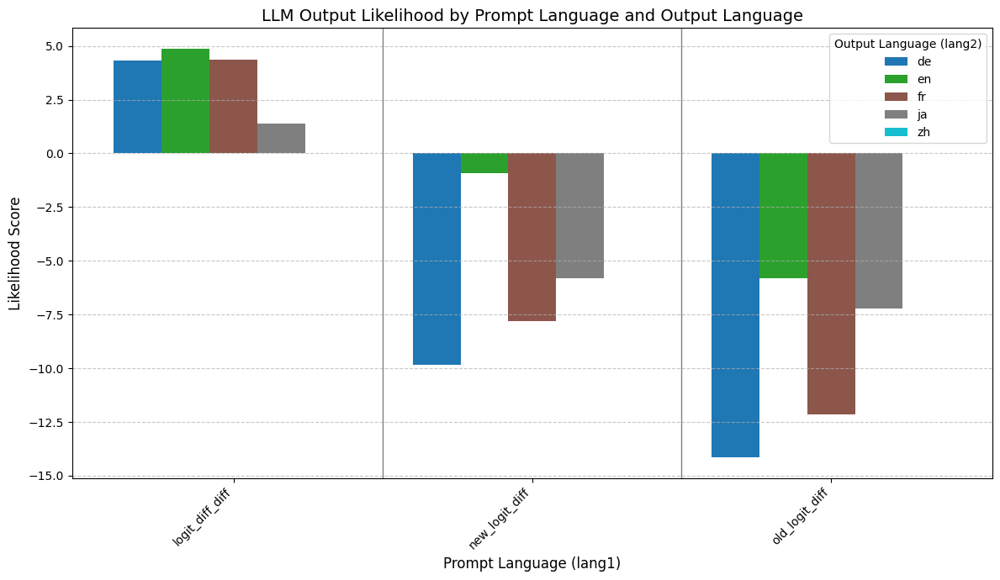

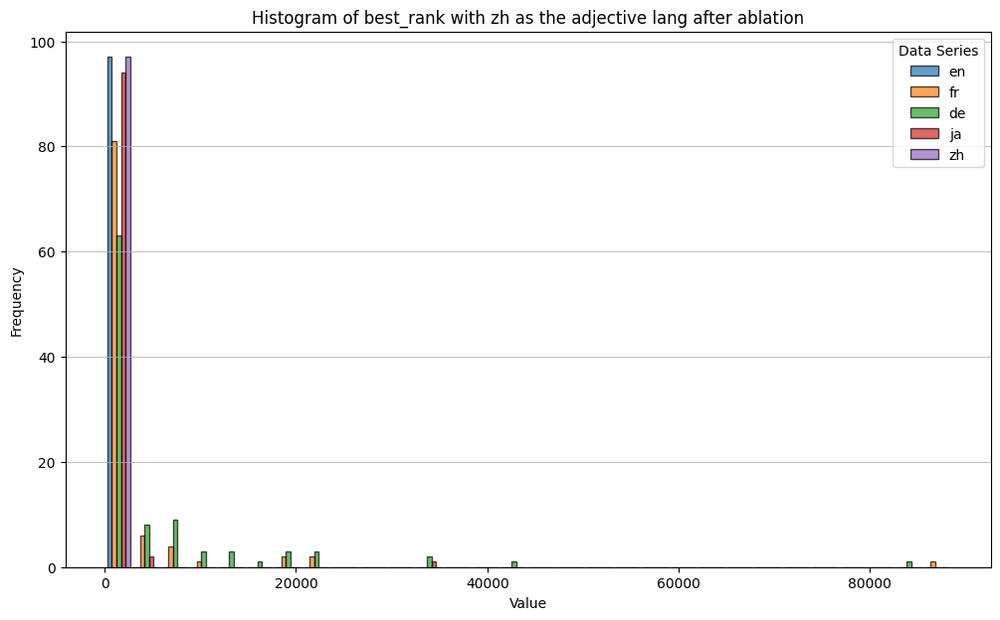

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


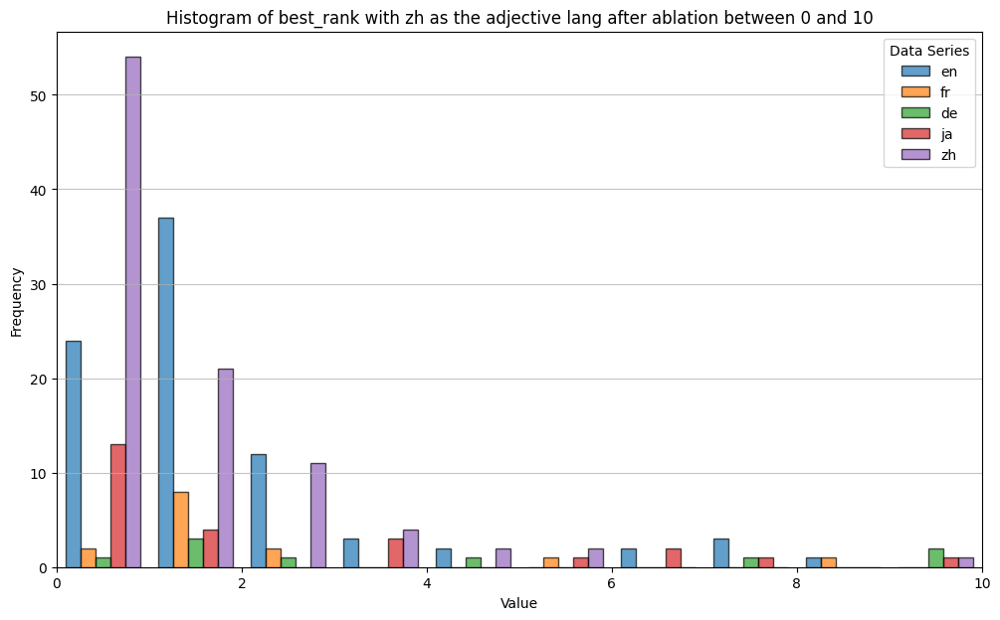

In [46]:
alpha = 0
result_test_ablation = dict()
for lang in langs:
  result_test_ablation[lang] = {'old_logit_diff': [], 'new_logit_diff': [], 'logit_diff_diff': [], 'best_rank': []}

for adj, ans in train_data:
  prompt = prompt_zh.format(adj=adj['zh'])
  print(prompt)
  d = ablation_test_chinese(prompt, ans, supernodes_dict, alpha)
  for lang2 in langs:
    o_diff, n_diff, diff, best_rank = d[lang2]
    result_test_ablation[lang2]['old_logit_diff'].append(o_diff)
    result_test_ablation[lang2]['new_logit_diff'].append(n_diff)
    result_test_ablation[lang2]['logit_diff_diff'].append(diff)
    result_test_ablation[lang2]['best_rank'].append(best_rank)

for lang2 in langs:
        for key, value in result_test_ablation[lang2].items():
            if key == 'best_rank':
                continue
            # take mean
            if len(value) != 0:
                result_test_ablation[lang2][key] = sum(value) / len(value)
            if len(value) == 0:
                result_test_ablation[lang2][key] = 0

categories = ['old_logit_diff', 'new_logit_diff', 'logit_diff_diff', 'best_rank']
small_dict = dict()
for category in categories:
  if category == 'best_rank':
    continue
  small_dict[category] = dict()
  for lang in langs:
    small_dict[category][lang] = result_test_ablation[lang][category]

visualize_bar_2ddict_outer_inter(small_dict)

rank_dict = dict()
for lang in langs:
  rank_dict[lang] = result_test_ablation[lang]['best_rank']

title = f"Histogram of best_rank with zh as the adjective lang after ablation"
create_multi_series_histogram(rank_dict, title=title)


"好"的反义词是"
[('不好', 0.423828125), ('坏', 0.373046875), ('不', 0.03466796875), ('差', 0.0306396484375), ('恶', 0.0164794921875), ('难', 0.0128173828125), ('<b>', 0.0087890625), ('糟糕', 0.007293701171875), ('<strong>', 0.006439208984375), (' ', 0.005340576171875)]
[('bad', 0.287109375), ('不好', 0.197265625), ('坏', 0.08203125), ('Bad', 0.0341796875), (' ', 0.0341796875), (' bad', 0.0302734375), ('<b>', 0.0284423828125), ('<strong>', 0.0220947265625), ('不', 0.01953125), (' Bad', 0.01611328125)]
Logit difference of "bad" to "坏": old -5.1875, new 1.25, diff 6.4375
Logit difference of "mauvais" to "坏": old -12.0, new -8.125, diff 3.875
Logit difference of "schlecht" to "坏": old -19.375, new -13.125, diff 6.25
Logit difference of "悪い" to "坏": old -11.625, new -7.375, diff 4.25
Logit difference of "坏" to "坏": old 0.0, new 0.0, diff 0.0
"开心"的反义词是"
[('悲伤', 0.15625), ('忧', 0.0947265625), ('痛苦', 0.07373046875), ('不', 0.07373046875), ('悲', 0.06103515625), ('烦恼', 0.053955078125), ('伤心', 0.044677734375), ('难过'

/tmp/ipykernel_1812624/2126995624.py:95: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab10', num_inter_keys)


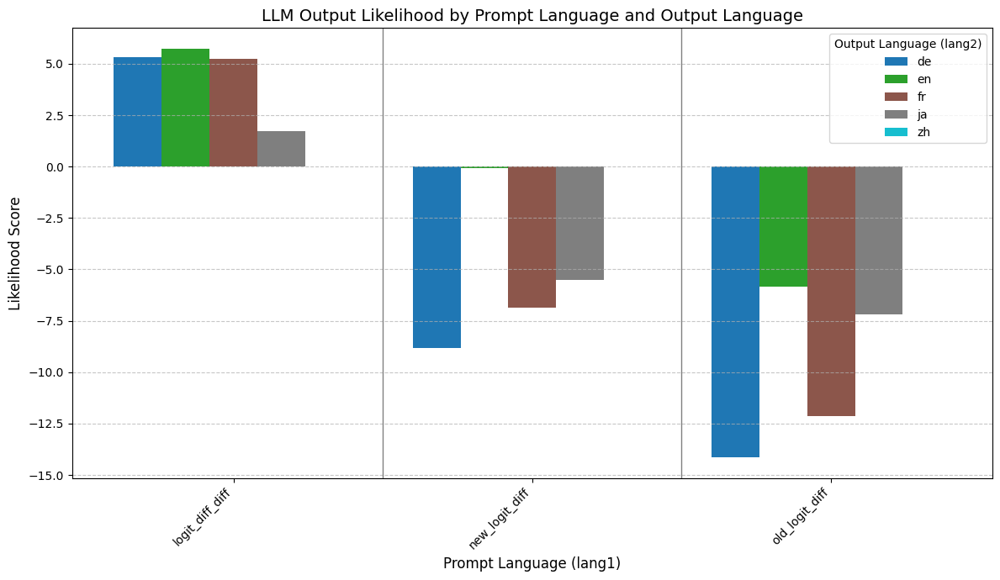

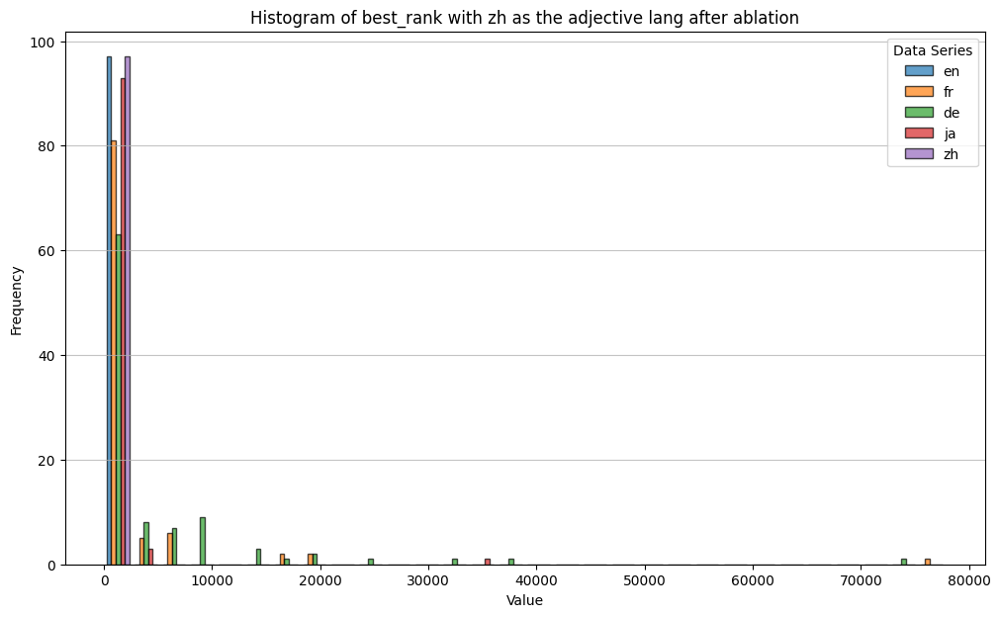

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


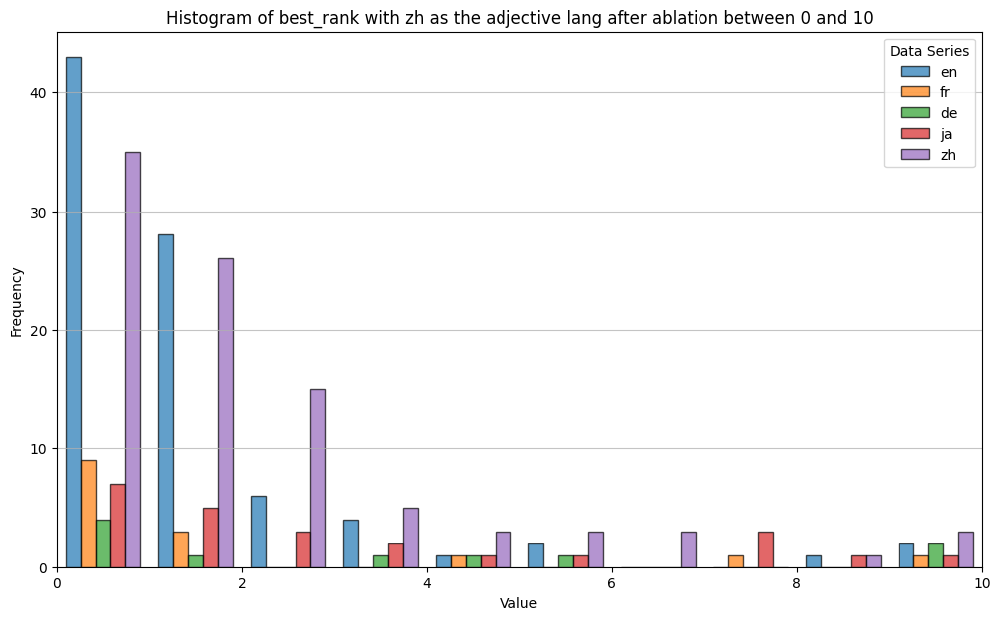

In [47]:
alpha = -0.2
result_test_ablation = dict()
for lang in langs:
  result_test_ablation[lang] = {'old_logit_diff': [], 'new_logit_diff': [], 'logit_diff_diff': [], 'best_rank': []}

for adj, ans in train_data:
  prompt = prompt_zh.format(adj=adj['zh'])
  print(prompt)
  d = ablation_test_chinese(prompt, ans, supernodes_dict, alpha)
  for lang2 in langs:
    o_diff, n_diff, diff, best_rank = d[lang2]
    result_test_ablation[lang2]['old_logit_diff'].append(o_diff)
    result_test_ablation[lang2]['new_logit_diff'].append(n_diff)
    result_test_ablation[lang2]['logit_diff_diff'].append(diff)
    result_test_ablation[lang2]['best_rank'].append(best_rank)

for lang2 in langs:
        for key, value in result_test_ablation[lang2].items():
            if key == 'best_rank':
                continue
            # take mean
            if len(value) != 0:
                result_test_ablation[lang2][key] = sum(value) / len(value)
            if len(value) == 0:
                result_test_ablation[lang2][key] = 0

categories = ['old_logit_diff', 'new_logit_diff', 'logit_diff_diff', 'best_rank']
small_dict = dict()
for category in categories:
  if category == 'best_rank':
    continue
  small_dict[category] = dict()
  for lang in langs:
    small_dict[category][lang] = result_test_ablation[lang][category]

visualize_bar_2ddict_outer_inter(small_dict)

rank_dict = dict()
for lang in langs:
  rank_dict[lang] = result_test_ablation[lang]['best_rank']

title = f"Histogram of best_rank with zh as the adjective lang after ablation"
create_multi_series_histogram(rank_dict, title=title)


"好"的反义词是"
[('不好', 0.423828125), ('坏', 0.373046875), ('不', 0.03466796875), ('差', 0.0306396484375), ('恶', 0.0164794921875), ('难', 0.0128173828125), ('<b>', 0.0087890625), ('糟糕', 0.007293701171875), ('<strong>', 0.006439208984375), (' ', 0.005340576171875)]
[('bad', 0.45703125), ('不好', 0.06982421875), (' bad', 0.06982421875), (' ', 0.033203125), ('Bad', 0.024169921875), ('<b>', 0.0213623046875), ('evil', 0.018798828125), ('坏', 0.018798828125), ('not', 0.018798828125), ('<strong>', 0.018798828125)]
Logit difference of "bad" to "坏": old -5.1875, new 3.1875, diff 8.375
Logit difference of "mauvais" to "坏": old -12.0, new -6.8125, diff 5.1875
Logit difference of "schlecht" to "坏": old -19.375, new -10.5, diff 8.875
Logit difference of "悪い" to "坏": old -11.625, new -5.875, diff 5.75
Logit difference of "坏" to "坏": old 0.0, new 0.0, diff 0.0
"开心"的反义词是"
[('悲伤', 0.15625), ('忧', 0.0947265625), ('痛苦', 0.07373046875), ('不', 0.07373046875), ('悲', 0.06103515625), ('烦恼', 0.053955078125), ('伤心', 0.04467

/tmp/ipykernel_1812624/2126995624.py:95: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab10', num_inter_keys)


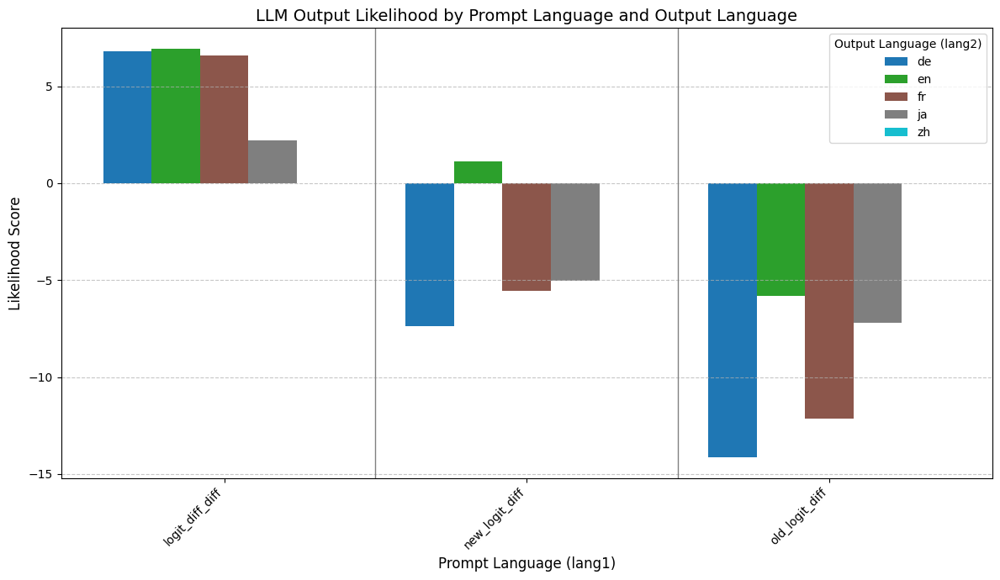

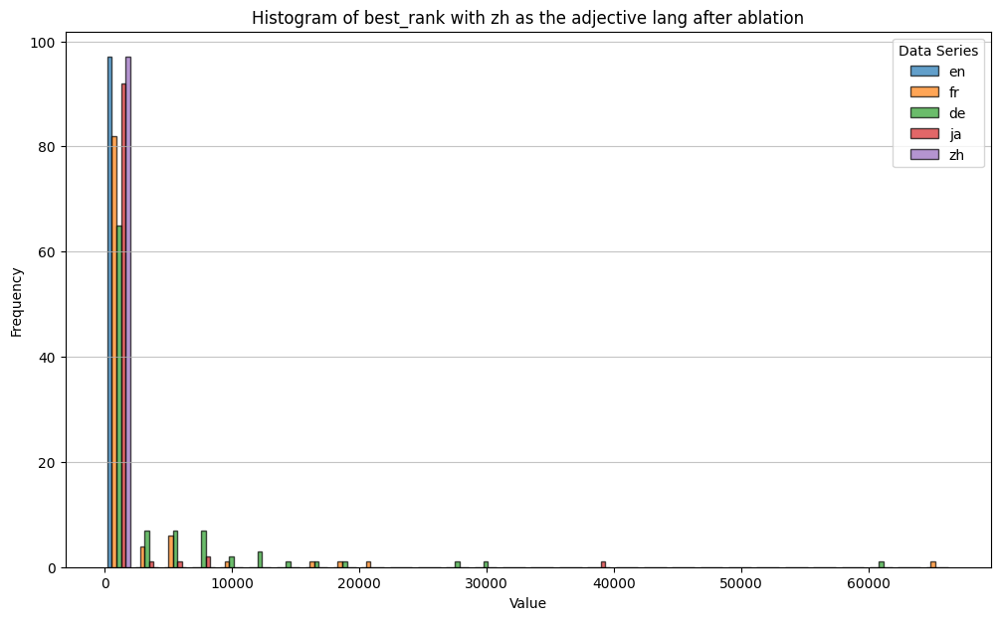

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


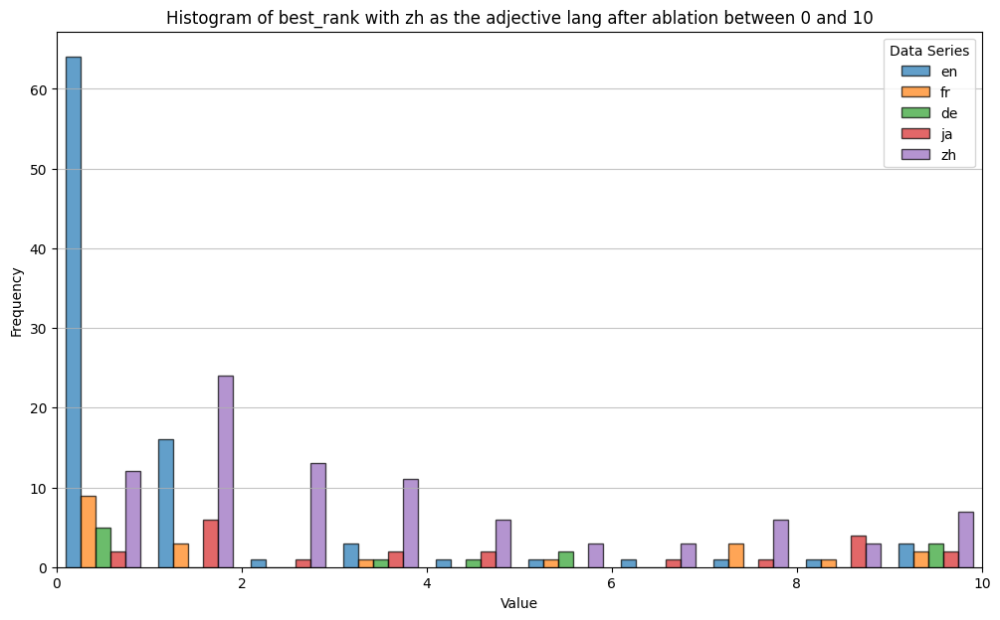

In [48]:
alpha = -0.5
result_test_ablation = dict()
for lang in langs:
  result_test_ablation[lang] = {'old_logit_diff': [], 'new_logit_diff': [], 'logit_diff_diff': [], 'best_rank': []}

for adj, ans in train_data:
  prompt = prompt_zh.format(adj=adj['zh'])
  print(prompt)
  d = ablation_test_chinese(prompt, ans, supernodes_dict, alpha)
  for lang2 in langs:
    o_diff, n_diff, diff, best_rank = d[lang2]
    result_test_ablation[lang2]['old_logit_diff'].append(o_diff)
    result_test_ablation[lang2]['new_logit_diff'].append(n_diff)
    result_test_ablation[lang2]['logit_diff_diff'].append(diff)
    result_test_ablation[lang2]['best_rank'].append(best_rank)

for lang2 in langs:
        for key, value in result_test_ablation[lang2].items():
            if key == 'best_rank':
                continue
            # take mean
            if len(value) != 0:
                result_test_ablation[lang2][key] = sum(value) / len(value)
            if len(value) == 0:
                result_test_ablation[lang2][key] = 0

categories = ['old_logit_diff', 'new_logit_diff', 'logit_diff_diff', 'best_rank']
small_dict = dict()
for category in categories:
  if category == 'best_rank':
    continue
  small_dict[category] = dict()
  for lang in langs:
    small_dict[category][lang] = result_test_ablation[lang][category]

visualize_bar_2ddict_outer_inter(small_dict)

rank_dict = dict()
for lang in langs:
  rank_dict[lang] = result_test_ablation[lang]['best_rank']

title = f"Histogram of best_rank with zh as the adjective lang after ablation"
create_multi_series_histogram(rank_dict, title=title)


### Ablation and amplification testing

In [48]:
def faster_whole_iterate(prompt: str, base_lang: str, ablation_langs: list[str], amplification_langs: list[str], ans: dict[str, list[str]], supernodes_dict, alpha: float = -0.5, k: int=10) -> dict:
    logits, activaitons = model.get_activations(prompt)
    en = get_best_rank(logits, ans['en'])
    zh = get_best_rank(logits, ans['zh'])
    if not (en <= k or zh <= k):
        print(f'Skip {prompt} because the model understands this incorrectly')
        return dict()
    outputs_og = get_top_outputs(logits, k)
    print(outputs_og)

    intervention_lst = []
    for lang in ablation_langs:
        intervention_lst.extend(ablation(supernodes_dict, lang, alpha))
    for lang in amplification_langs:
        intervention_lst.extend(amplification(supernodes_dict, lang))

    new_logits, new_activations = model.feature_intervention(prompt, intervention_lst)
    new_outputs = get_top_outputs(new_logits, k)
    print(new_outputs)

    base = get_best_base(logits, ans[base_lang])
    result_dict = dict()

    for lang2 in langs:
        target = get_best_base(logits, ans[lang2])
        o_diff, n_diff, diff = logit_diff_single(logits, new_logits, target, base)
        best_rank = get_best_rank(new_logits, ans[lang2])

        result_dict[lang2] = (o_diff, n_diff, diff, best_rank)
    return result_dict

## Everything amplification

In [50]:
# with everything amplification
result_everything_amplified = dict()
for lang in langs:
  result_everything_amplified[lang] = dict()
  for lang2 in langs:
    result_everything_amplified[lang][lang2] = {'old_logit_diff': [], 'new_logit_diff': [], 'logit_diff_diff': [], 'best_rank': []}
  for adj, ans in train_data:
      prompt = prompt_zh.format(adj=adj[lang])
      if (lang, adj[lang]) in inappropriate_set:
        print(f'Skip {prompt}')
        continue
      print(prompt)
      d = faster_whole_iterate(prompt, lang, [], ['fr', 'de', 'ja'], ans, supernodes_dict)
      if not d:
          continue
      for lang2 in langs:
          o_diff, n_diff, diff, rank = d[lang2]
          result_everything_amplified[lang][lang2]['old_logit_diff'].append(o_diff)
          result_everything_amplified[lang][lang2]['new_logit_diff'].append(n_diff)
          result_everything_amplified[lang][lang2]['logit_diff_diff'].append(diff)
          result_everything_amplified[lang][lang2]['best_rank'].append(rank)

  for lang2 in langs:
      for key, value in result_everything_amplified[lang][lang2].items():
          if key == 'best_rank':
            continue
          # take mean
          if len(value) != 0:
            result_everything_amplified[lang][lang2][key] = sum(value) / len(value)
          else:
            result_everything_amplified[lang][lang2][key] = 0

# with everything amplification and ablation
result_everything_amplified_and_ablation = dict()
for lang in langs:
  result_everything_amplified_and_ablation[lang] = dict()
  for lang2 in langs:
    result_everything_amplified_and_ablation[lang][lang2] = {'old_logit_diff': [], 'new_logit_diff': [], 'logit_diff_diff': [], 'best_rank': []}
  for adj, ans in train_data:
      prompt = prompt_zh.format(adj=adj[lang])
      if (lang, adj[lang]) in inappropriate_set:
        print(f'Skip {prompt}')
        continue
      print(prompt)
      d = faster_whole_iterate(prompt, lang, ['zh'], ['fr', 'de', 'ja'], ans, supernodes_dict)
      if not d:
          continue
      for lang2 in langs:
          o_diff, n_diff, diff, rank = d[lang2]
          result_everything_amplified_and_ablation[lang][lang2]['old_logit_diff'].append(o_diff)
          result_everything_amplified_and_ablation[lang][lang2]['new_logit_diff'].append(n_diff)
          result_everything_amplified_and_ablation[lang][lang2]['logit_diff_diff'].append(diff)
          result_everything_amplified_and_ablation[lang][lang2]['best_rank'].append(rank)

  for lang2 in langs:
      for key, value in result_everything_amplified_and_ablation[lang][lang2].items():
          if key == 'best_rank':
            continue
          # take mean
          if len(value) != 0:
            result_everything_amplified_and_ablation[lang][lang2][key] = sum(value) / len(value)
          else:
            result_everything_amplified_and_ablation[lang][lang2][key] = 0



"good"的反义词是"
[('bad', 0.703125), ('Bad', 0.051025390625), ('poor', 0.031005859375), ('坏', 0.021240234375), ('差', 0.018798828125), ('BAD', 0.012939453125), ('not', 0.01141357421875), (' bad', 0.01007080078125), ('不好', 0.00885009765625), ('terrible', 0.00885009765625)]
[('bad', 0.28125), ('悪', 0.1923828125), ('悪い', 0.048828125), ('<b>', 0.037841796875), ('пло', 0.026123046875), ('f', 0.01483154296875), ('差', 0.01483154296875), ('<strong>', 0.01483154296875), ('et', 0.0123291015625), ('un', 0.0123291015625)]
Logit difference of "bad" to "bad": old 0.0, new 0.0, diff 0.0
Logit difference of "mauvais" to "bad": old -11.625, new -4.875, diff 6.75
Logit difference of "schlecht" to "bad": old -14.9375, new -6.8125, diff 8.125
Logit difference of "悪い" to "bad": old -8.25, new -1.75, diff 6.5
Logit difference of "坏" to "bad": old -3.5, new -6.0625, diff -2.5625
"happy"的反义词是"
[('sad', 0.69140625), ('un', 0.1357421875), ('dis', 0.0208740234375), (' unhappy', 0.0184326171875), ('不', 0.0162353515625

/tmp/ipykernel_4031379/2126995624.py:95: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab10', num_inter_keys)


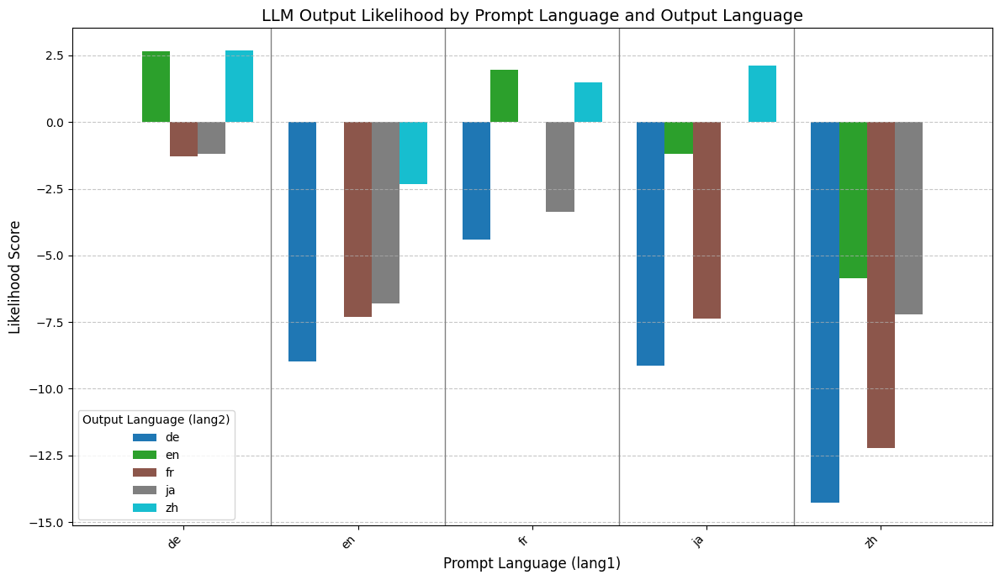

/tmp/ipykernel_4031379/2126995624.py:141: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors =cm.get_cmap('tab10', num_output_languages)


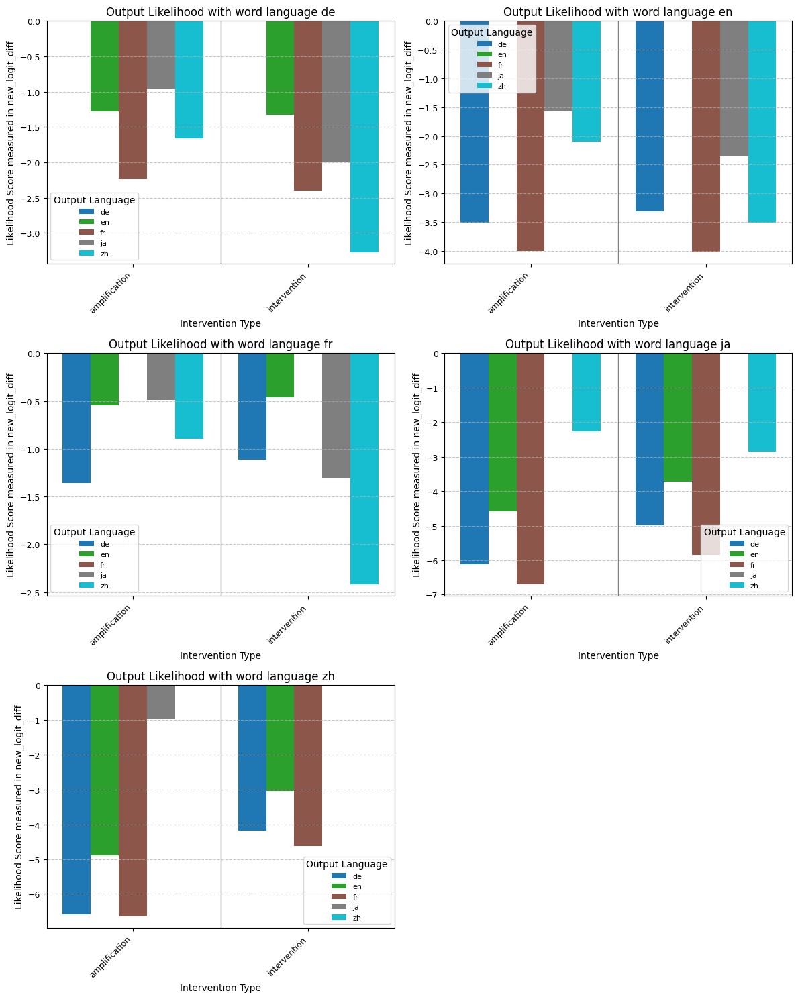

/tmp/ipykernel_4031379/2126995624.py:141: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors =cm.get_cmap('tab10', num_output_languages)


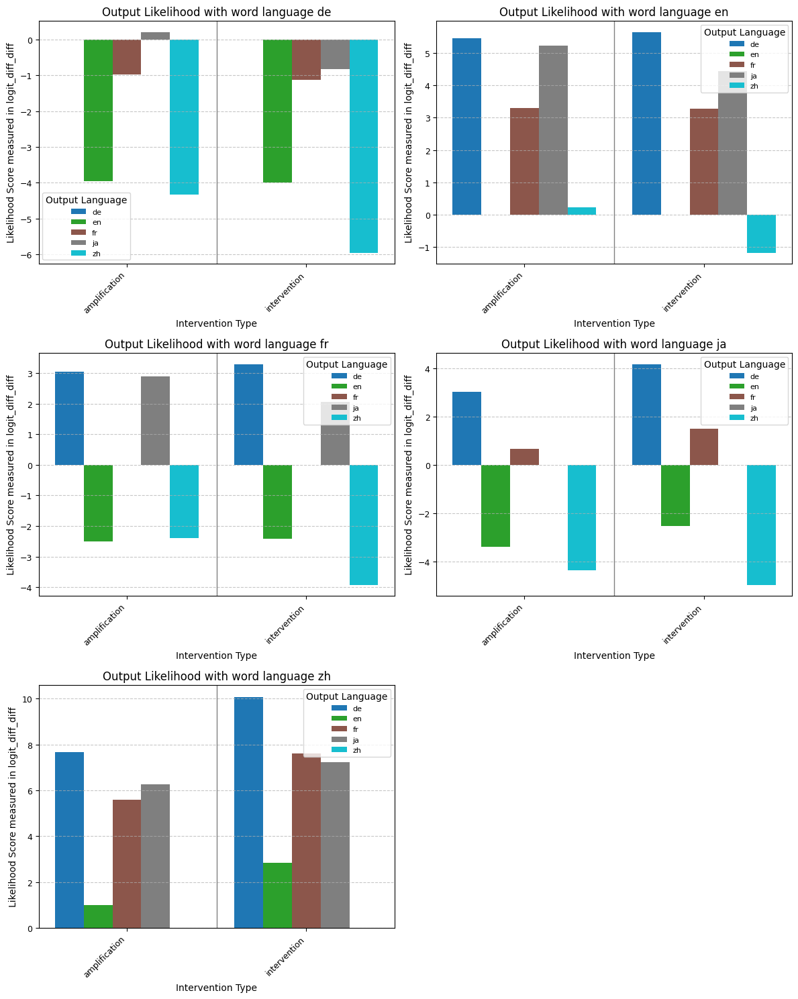

In [51]:
#%%
categories = ['old_logit_diff', 'new_logit_diff', 'logit_diff_diff', 'best_rank']
types = ['amplification', 'intervention']
combined_dict_everything = dict()
for category in categories:
    combined_dict_everything[category] = dict()
    for lang in langs:
        combined_dict_everything[category][lang] = dict()
        for t in types:
            combined_dict_everything[category][lang][t] = dict()

for lang in langs:
    for lang2 in langs:
        for category in categories:
            combined_dict_everything[category][lang]['amplification'][lang2] = result_everything_amplified[lang][lang2][category]
            combined_dict_everything[category][lang]['intervention'][lang2] = result_everything_amplified_and_ablation[lang][lang2][category]

smaller_dict = dict()
for lang in langs:
    smaller_dict[lang] = dict()
    for lang2 in langs:
        smaller_dict[lang][lang2] = result_everything_amplified[lang][lang2]['old_logit_diff']
visualize_bar_2ddict_outer_inter(smaller_dict)

for key, value in combined_dict_everything.items():
    if key == 'old_logit_diff' or key == 'best_rank':
        continue
    bar_graph_visualize(value, key)



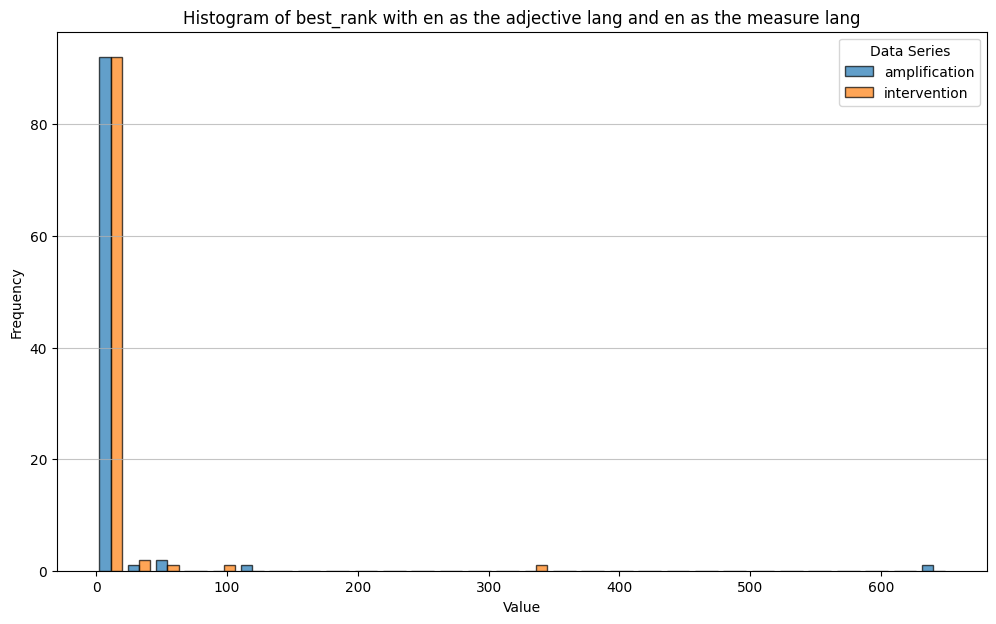

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


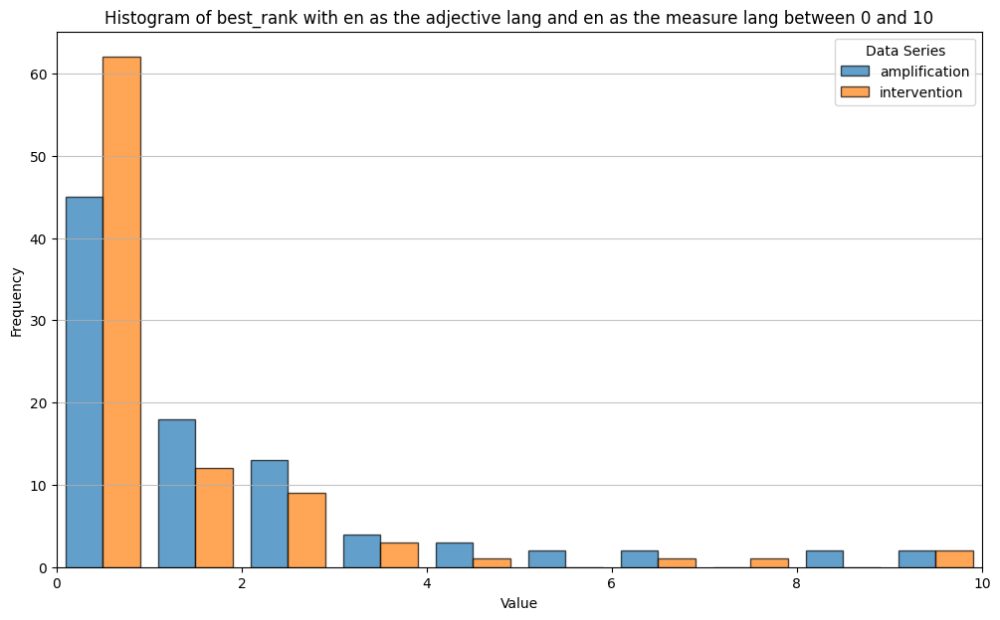

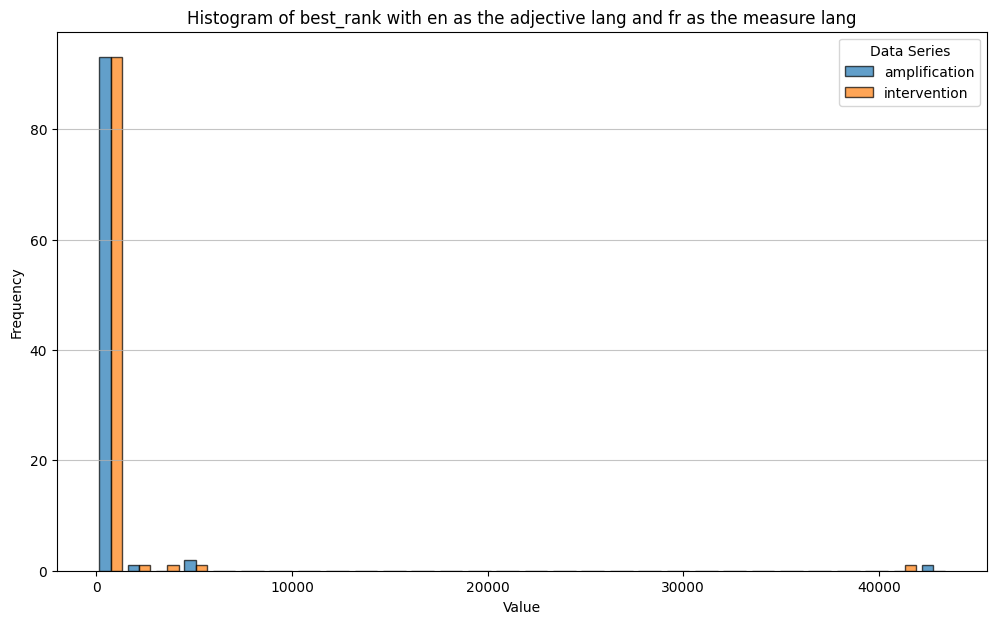

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


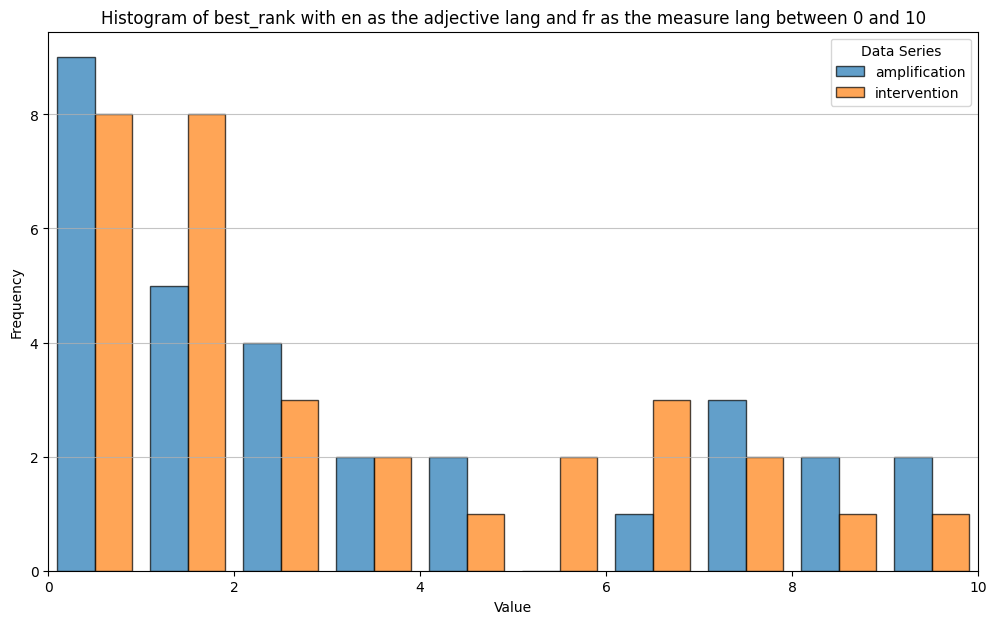

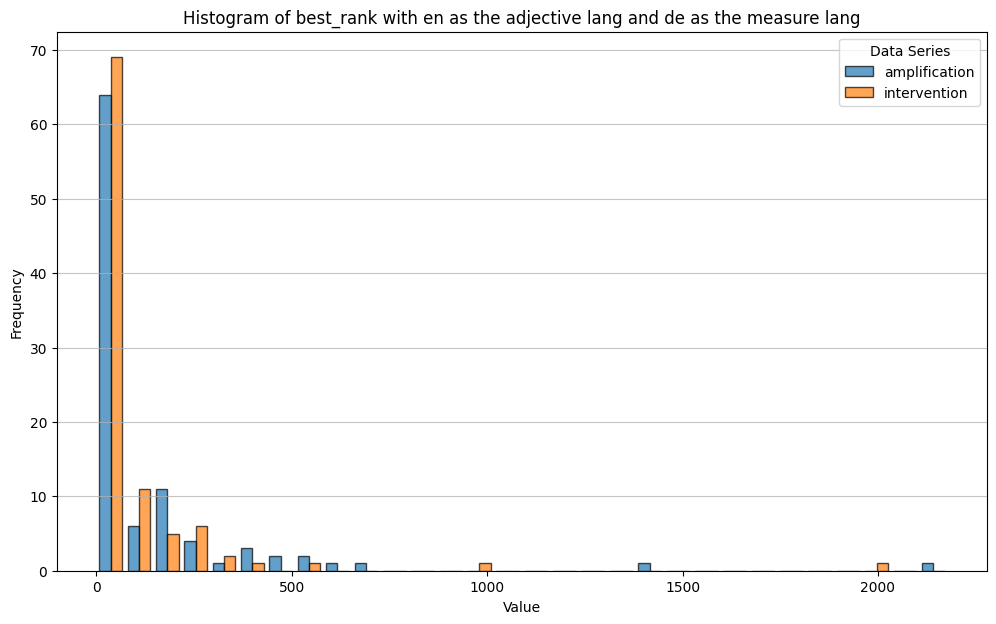

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


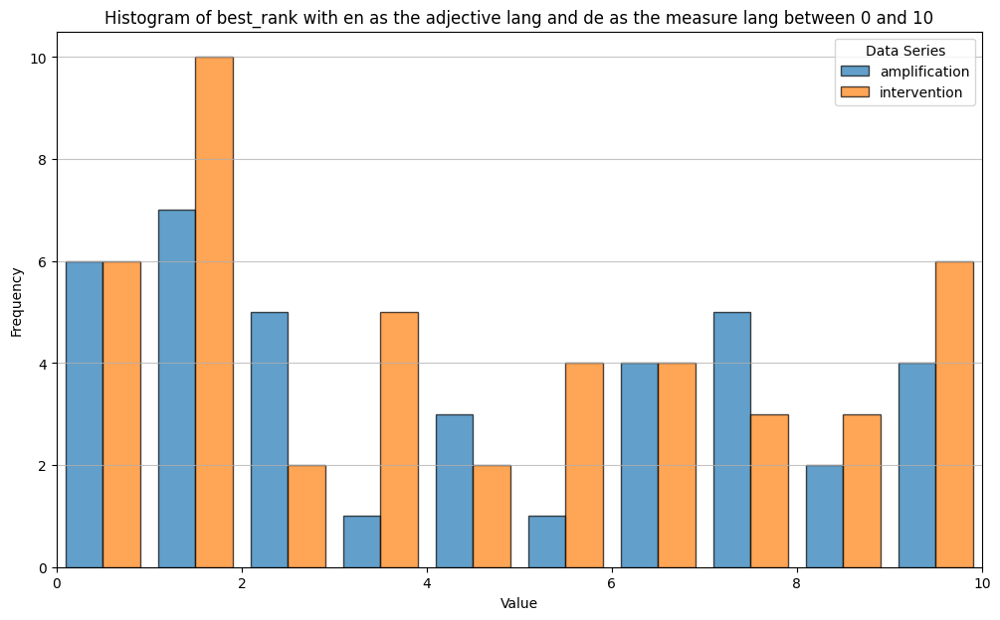

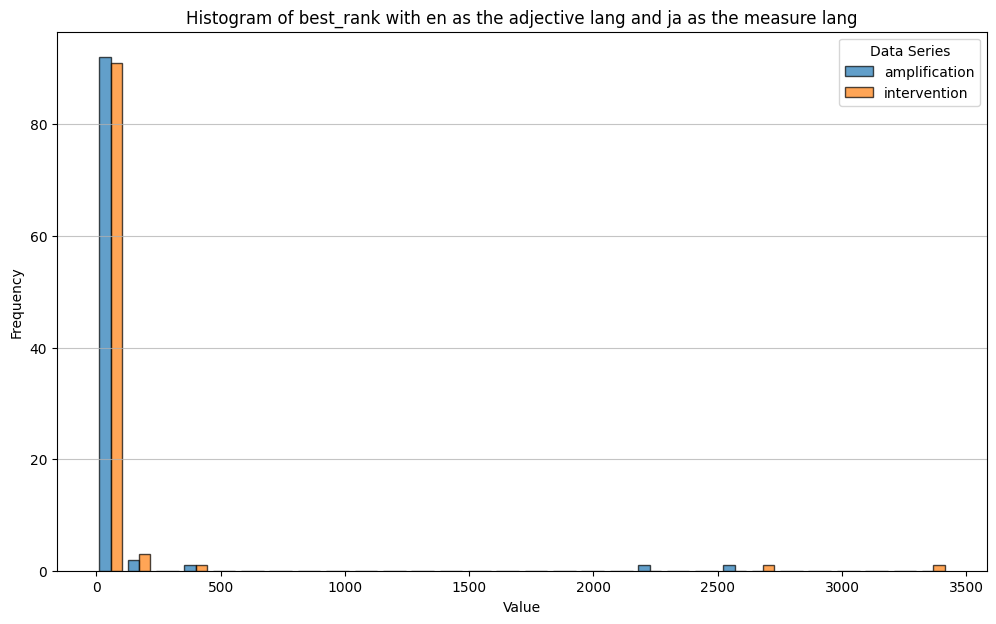

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


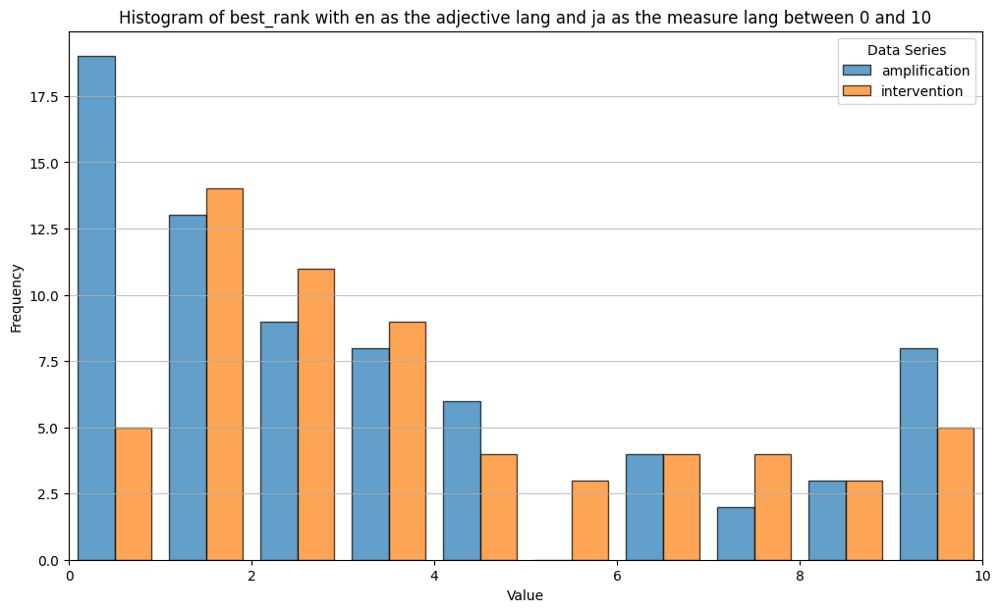

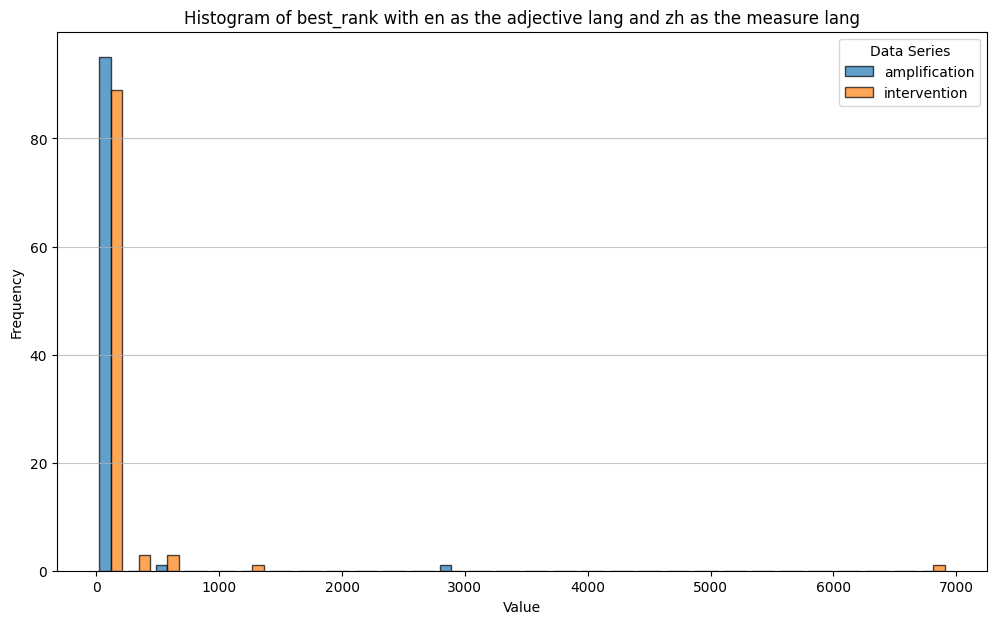

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


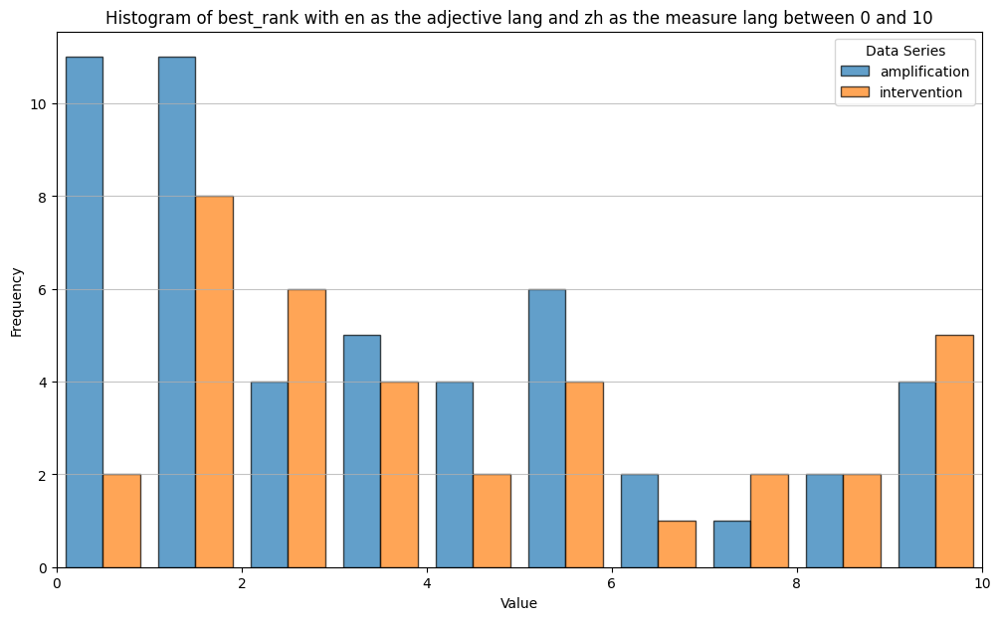

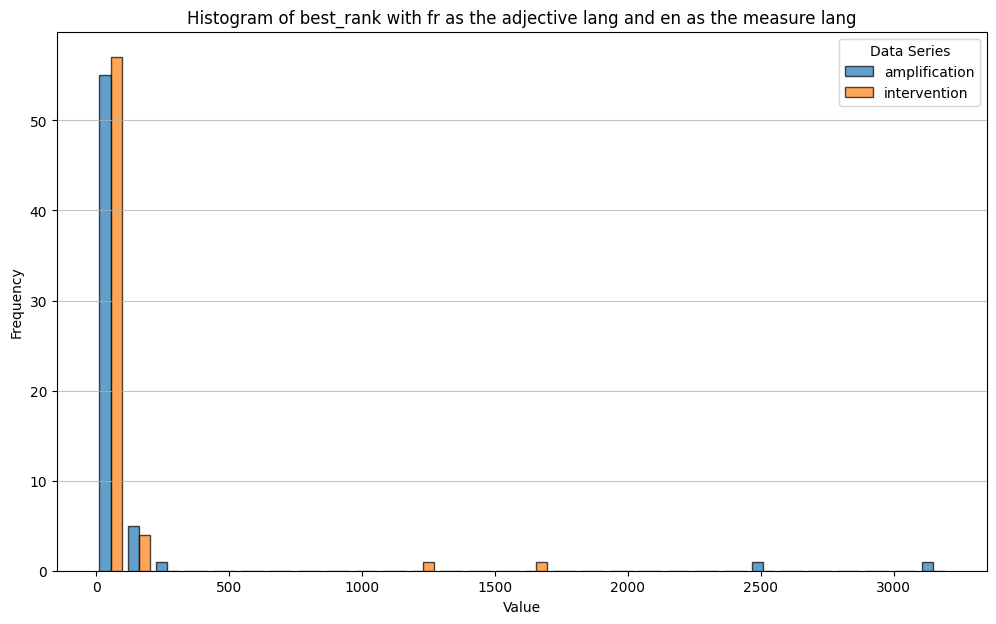

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


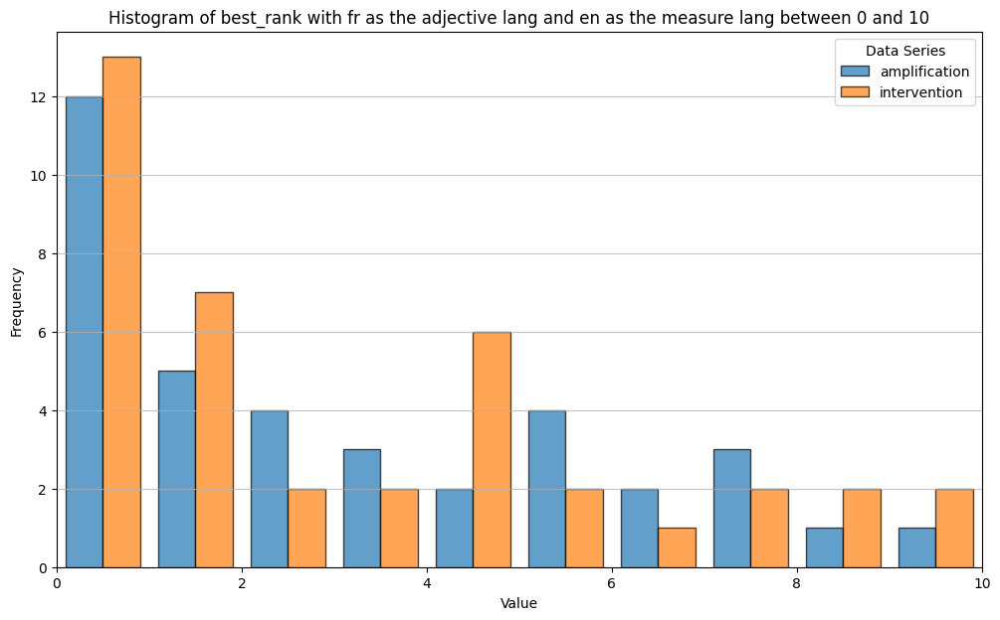

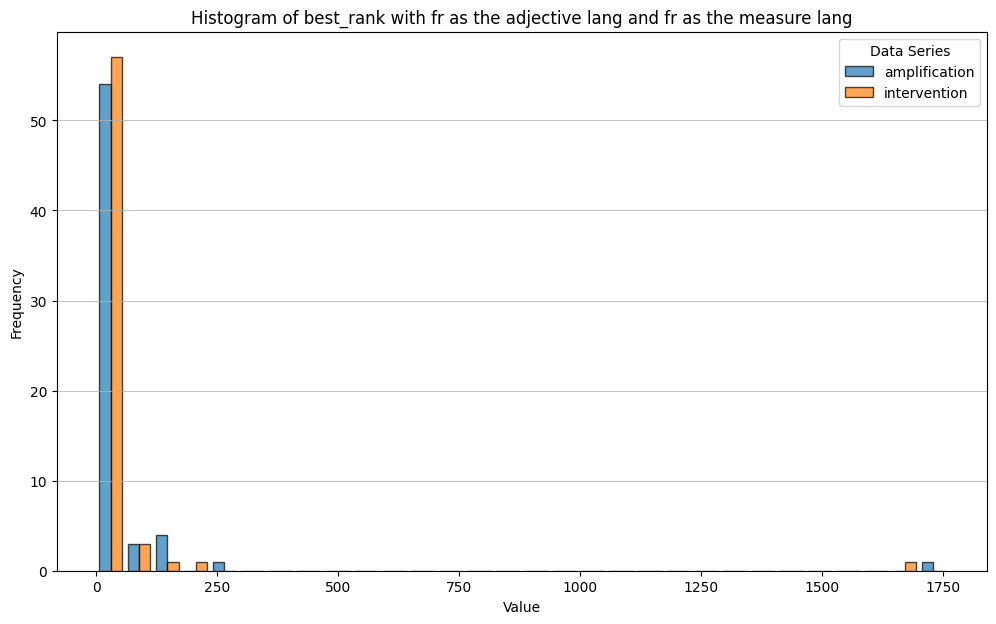

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


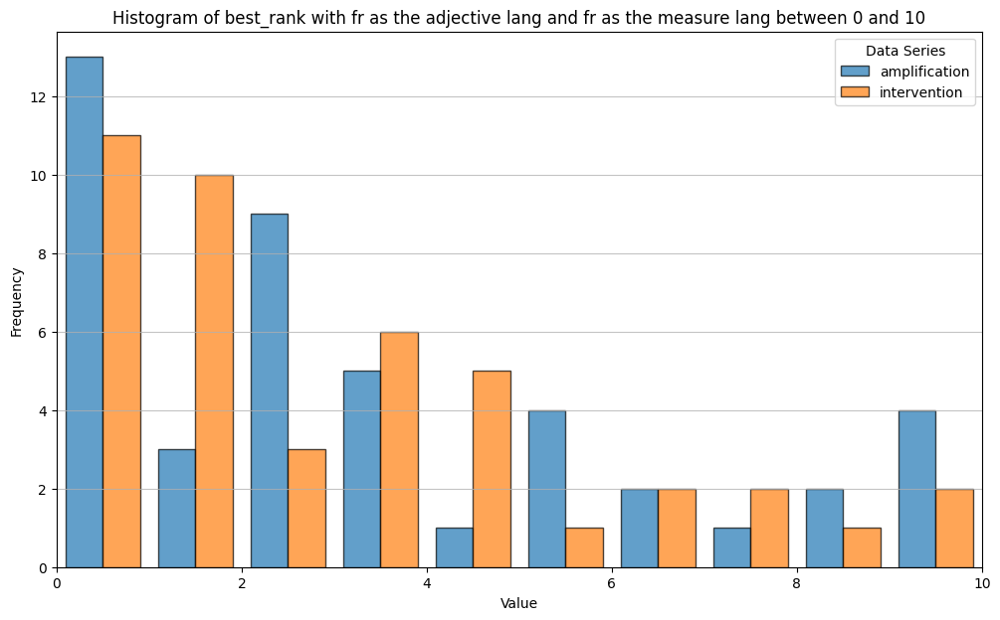

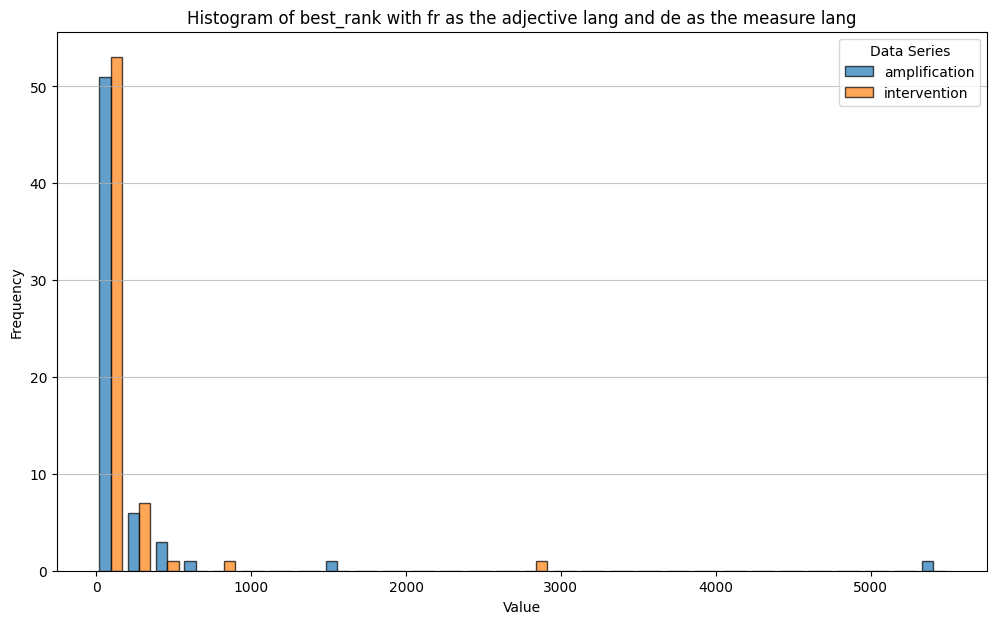

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


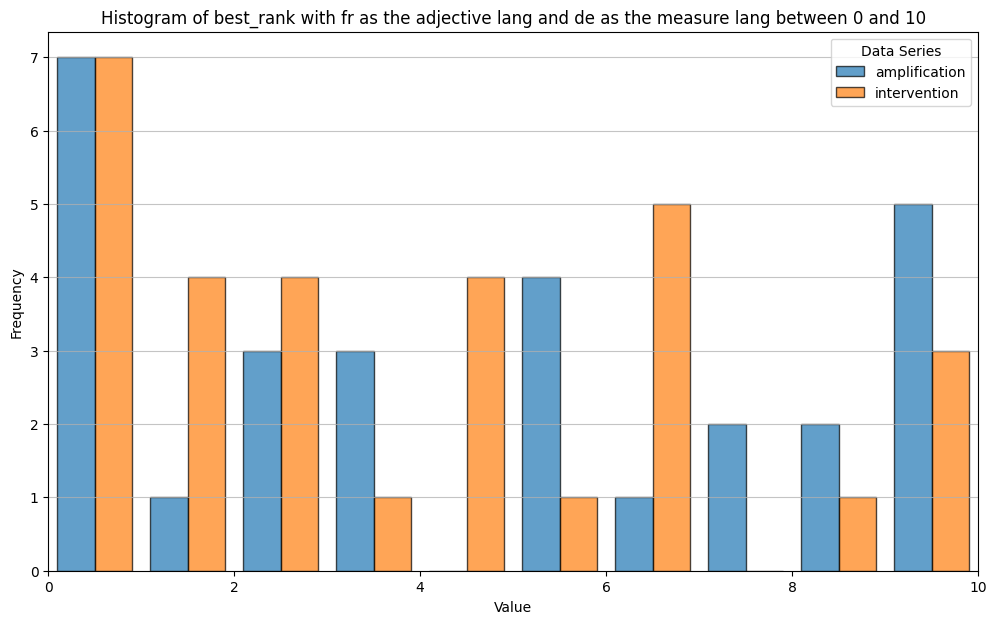

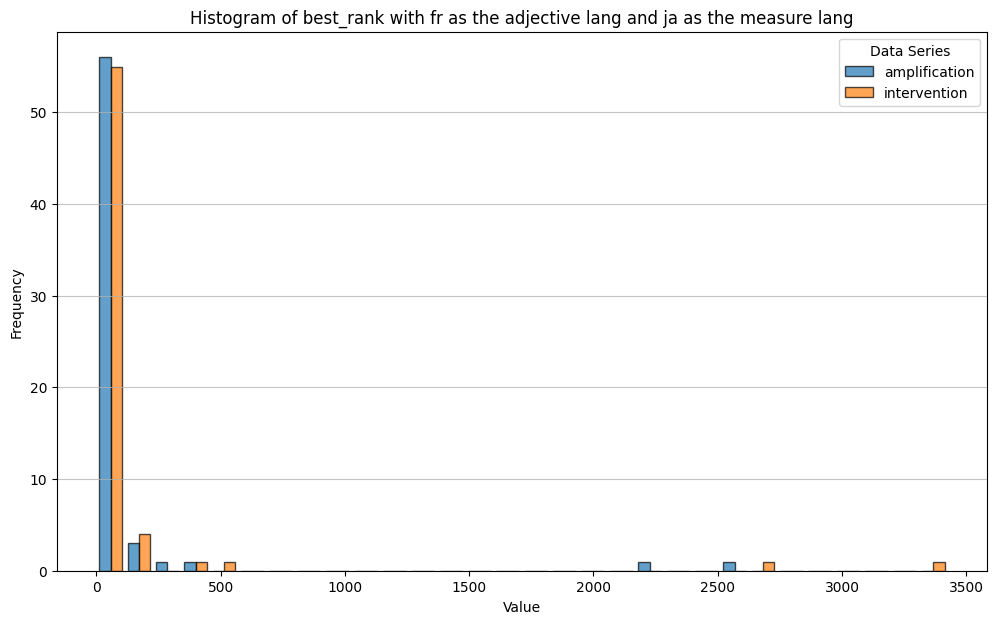

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


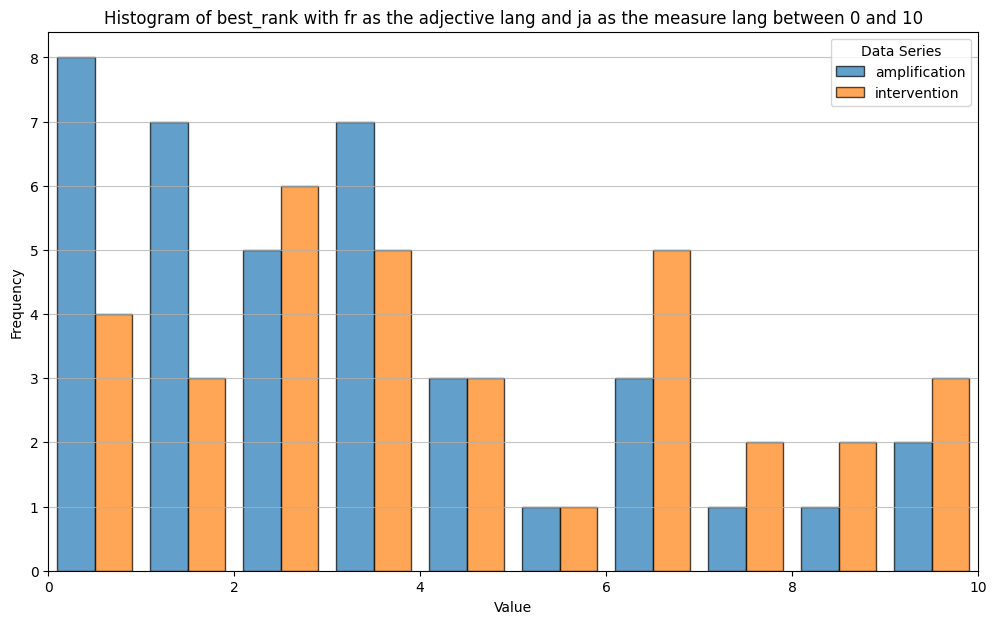

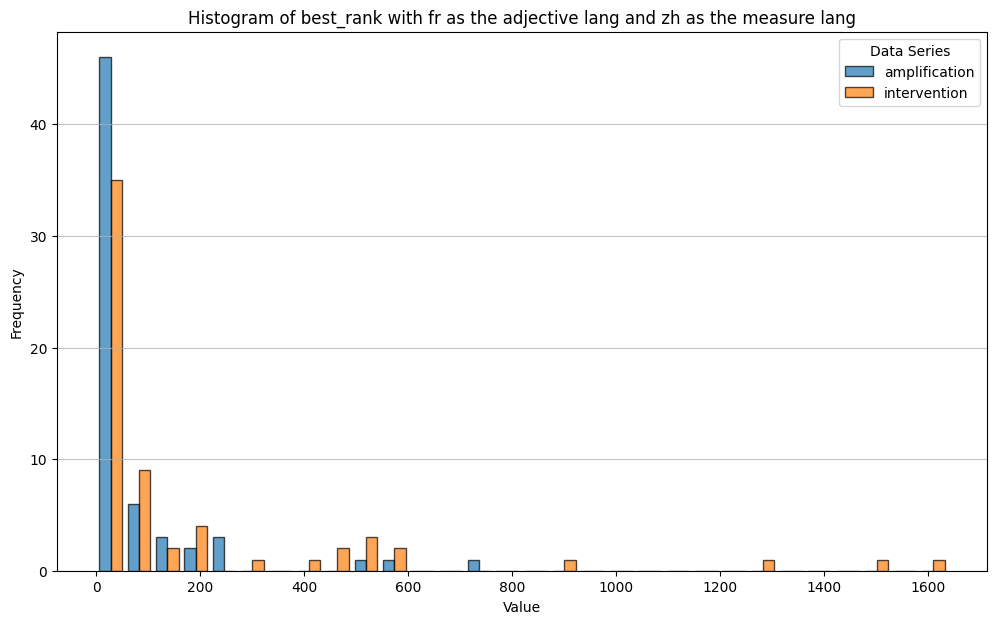

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


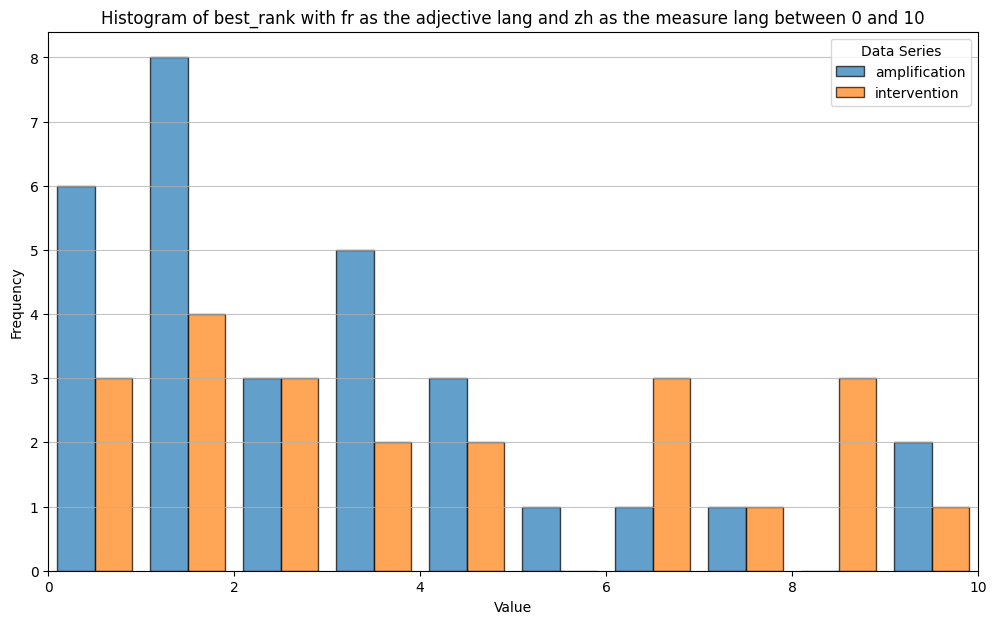

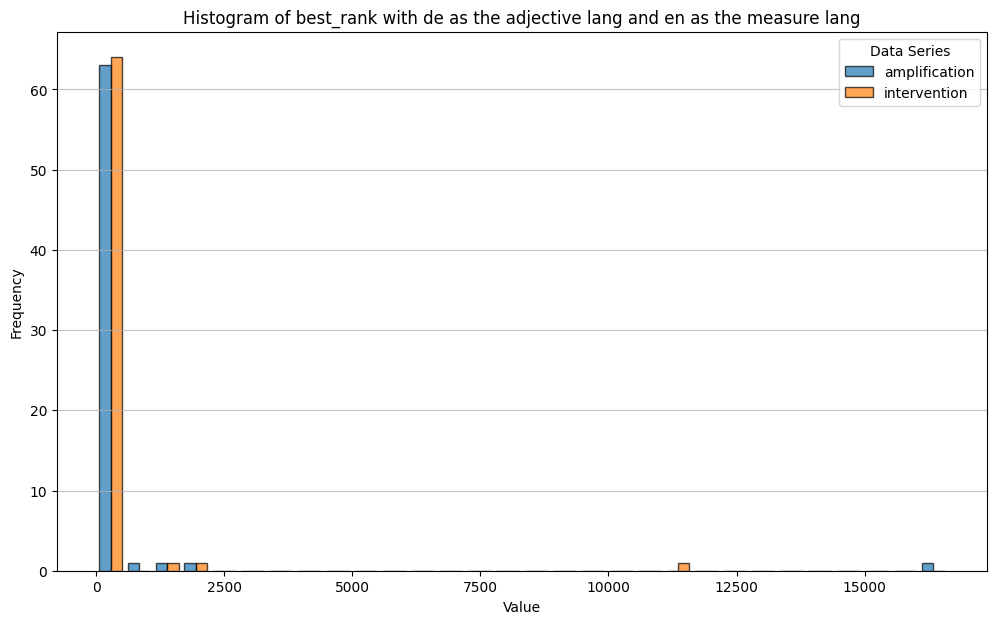

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


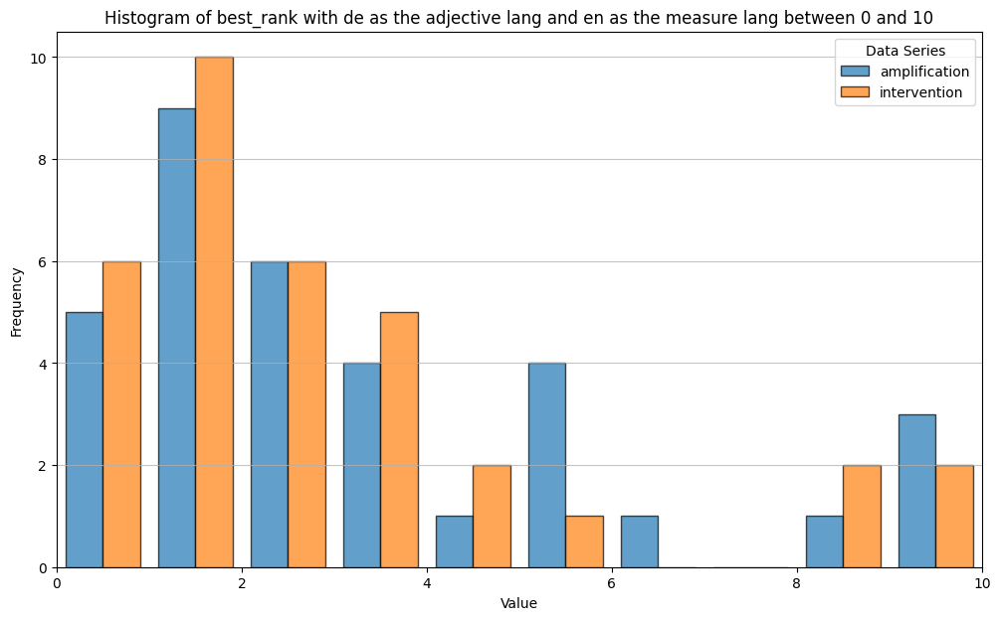

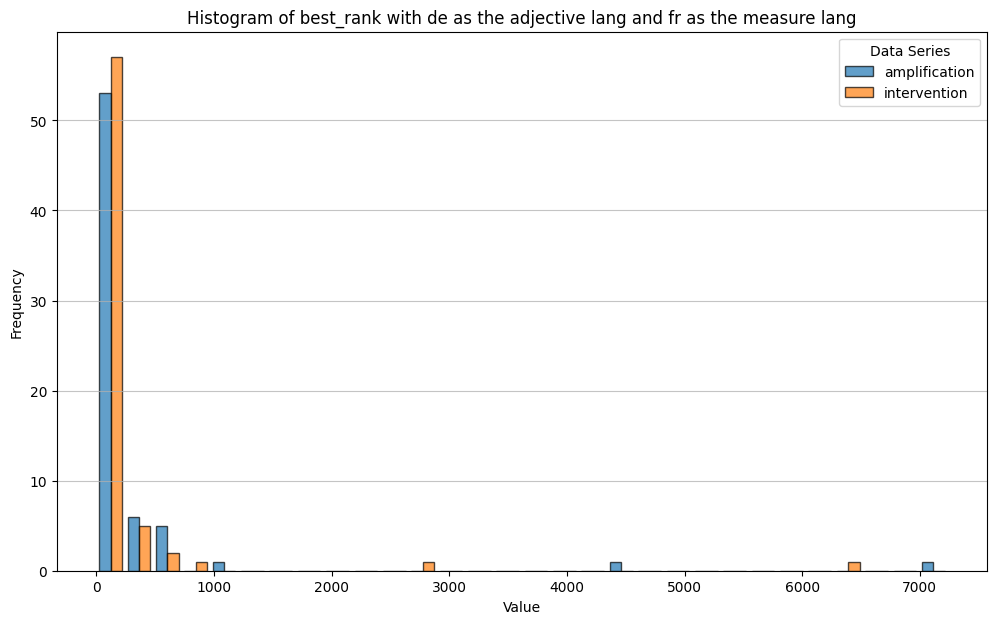

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


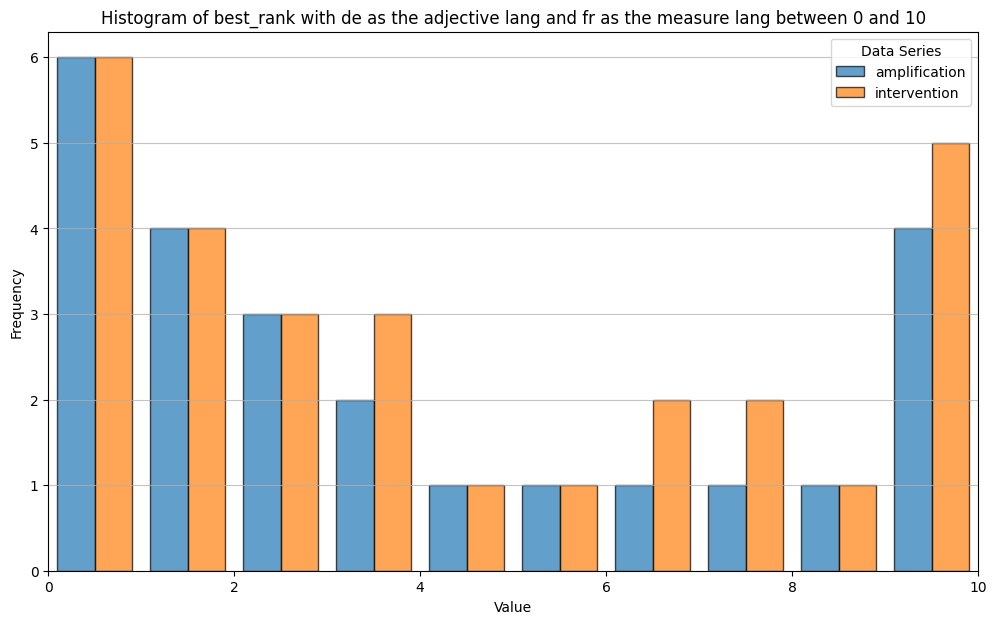

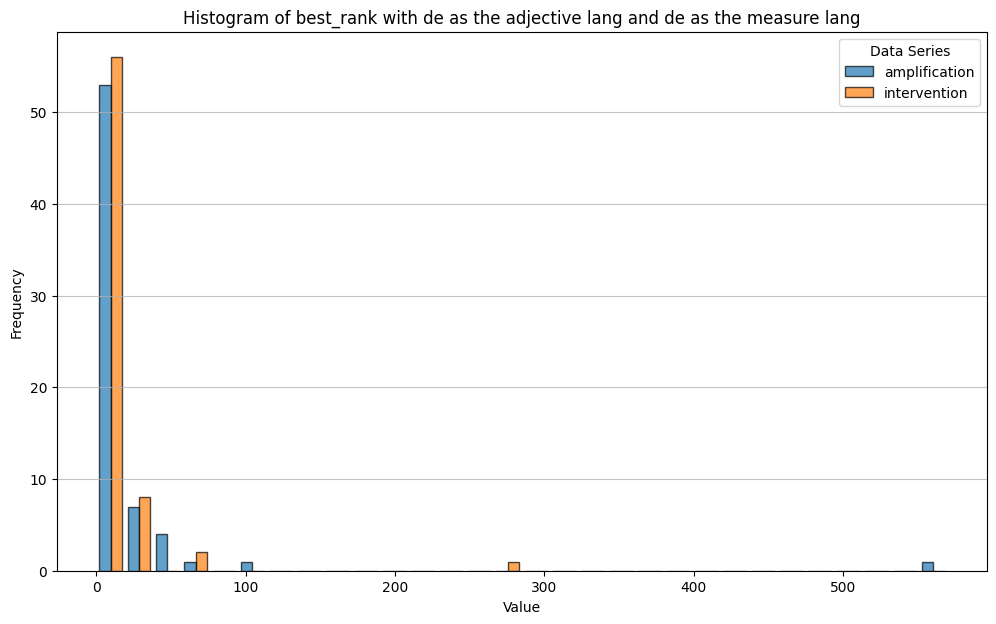

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


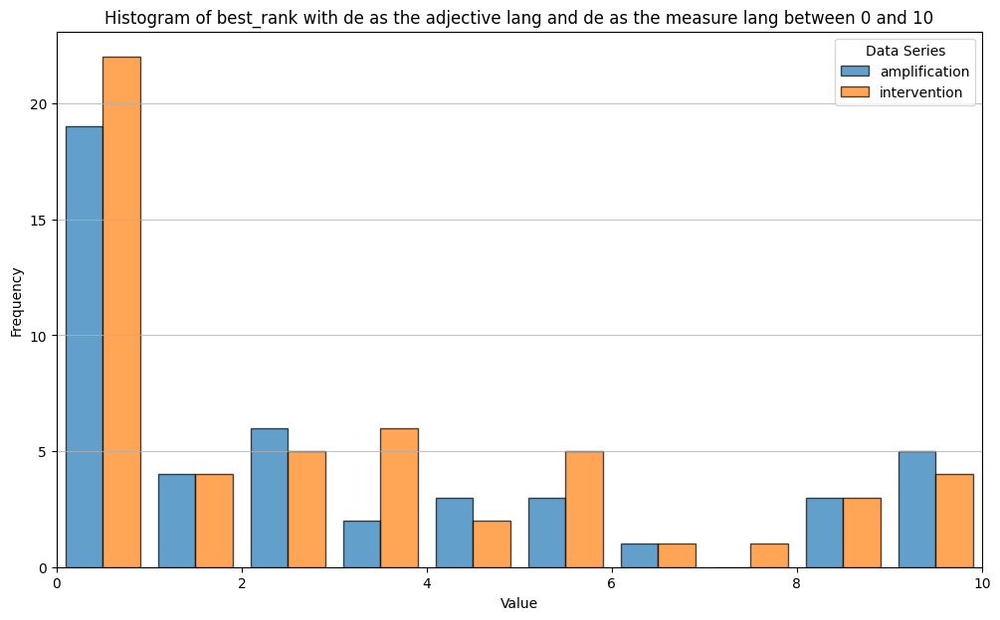

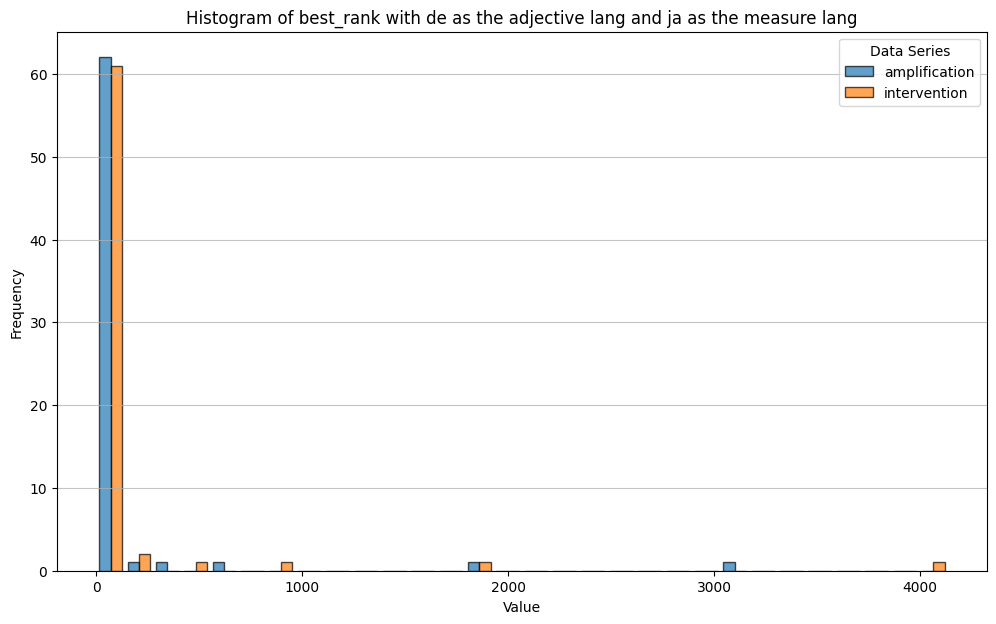

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


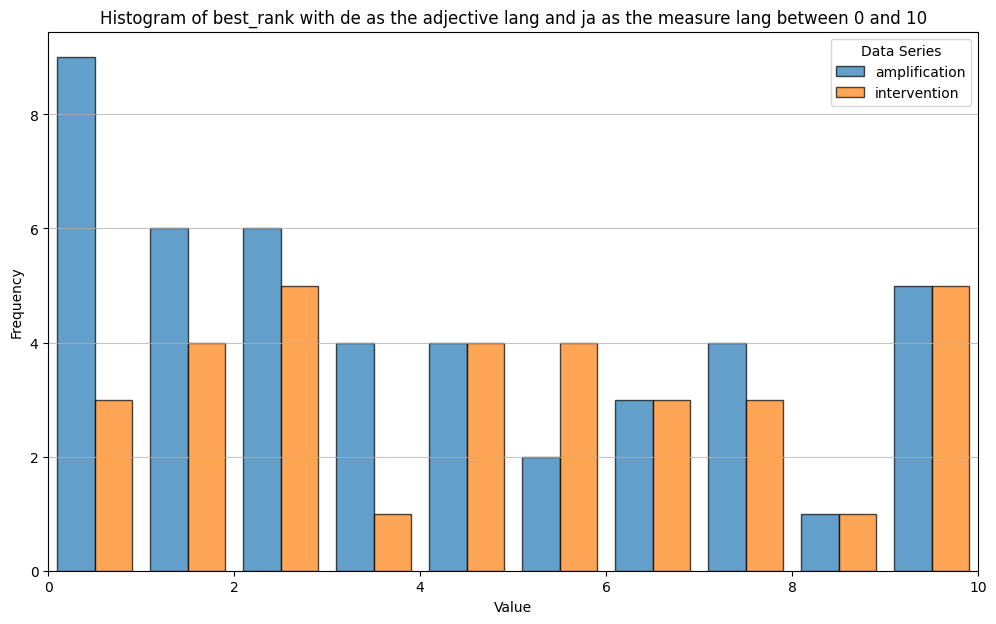

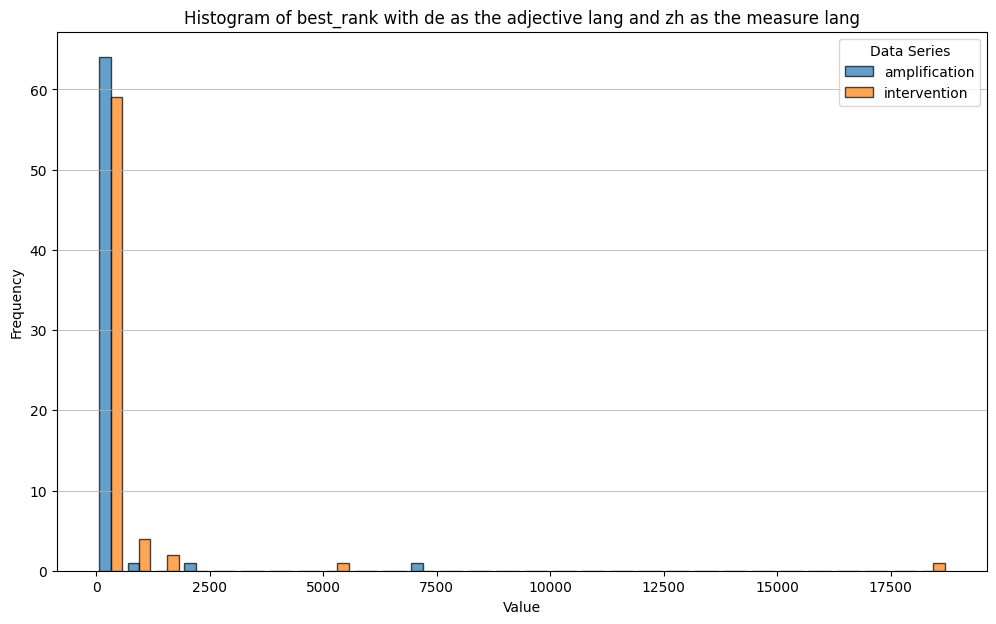

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


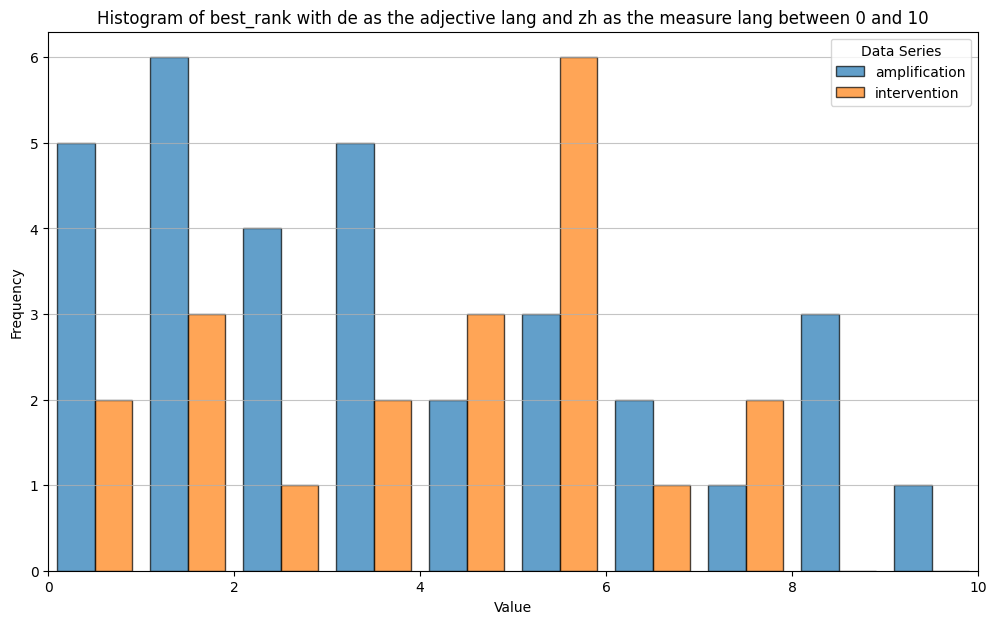

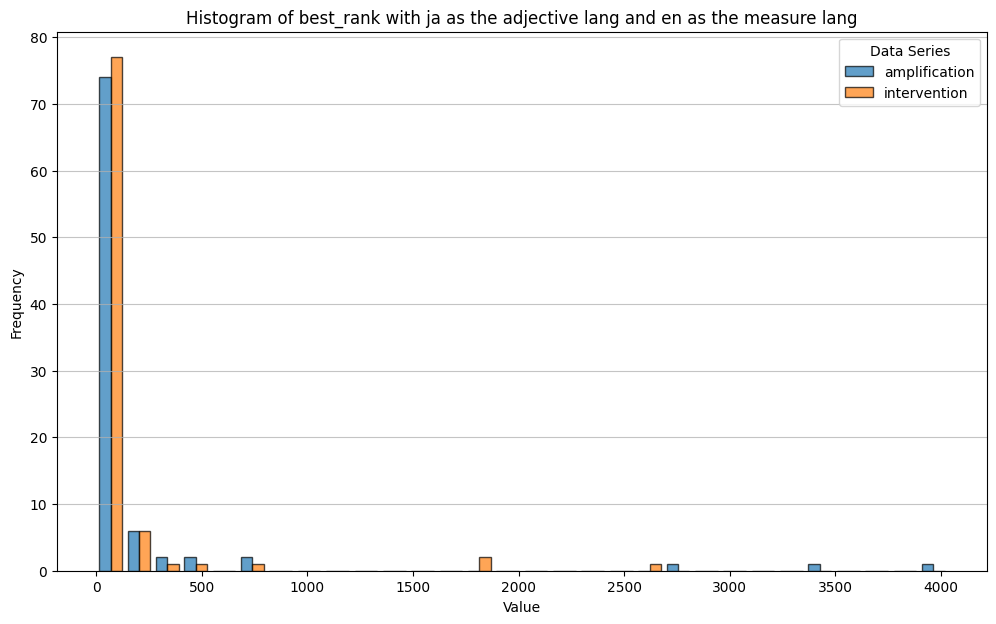

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


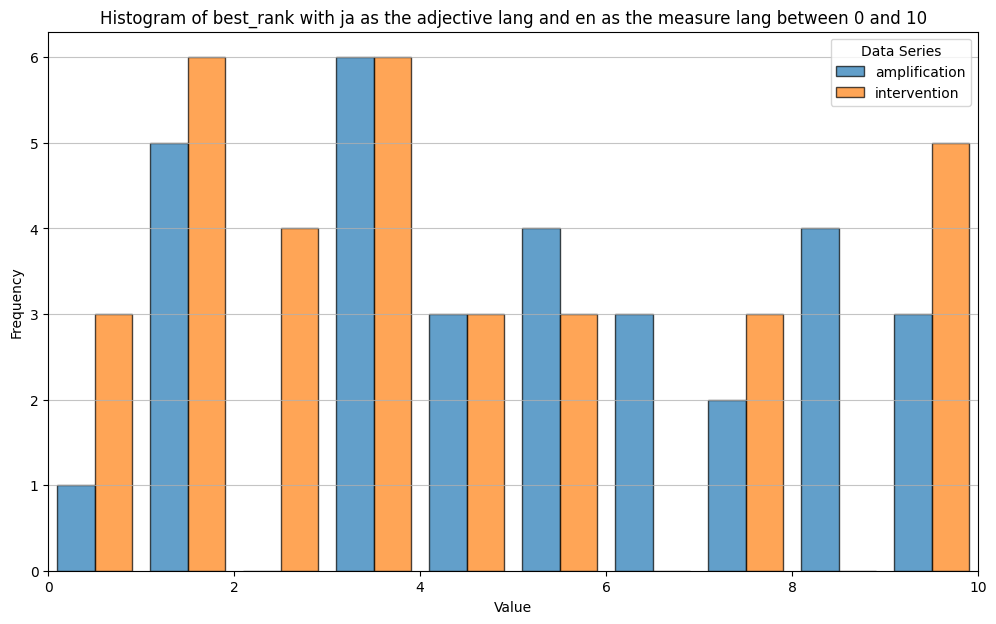

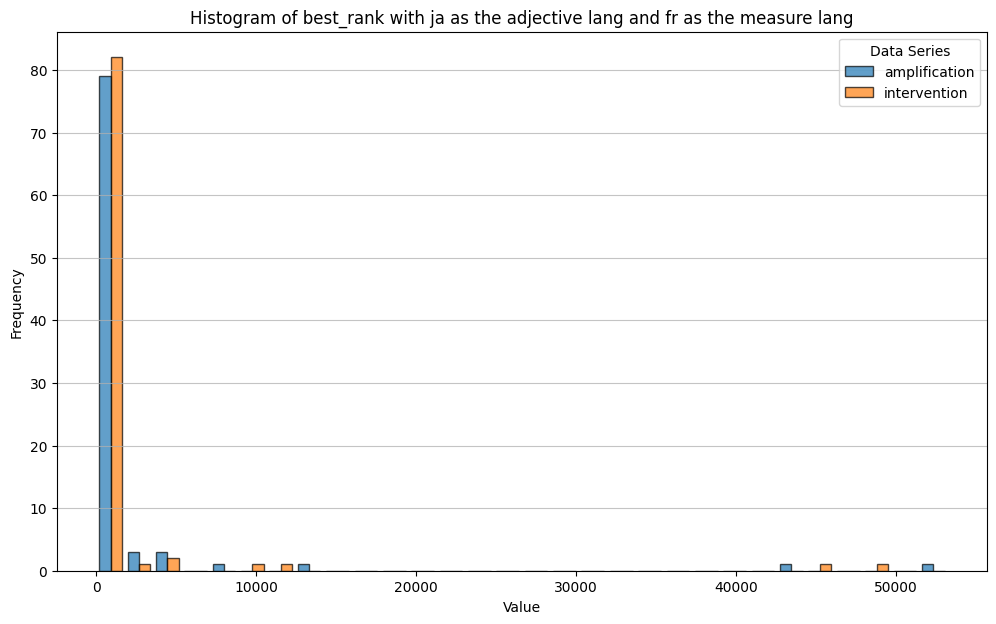

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


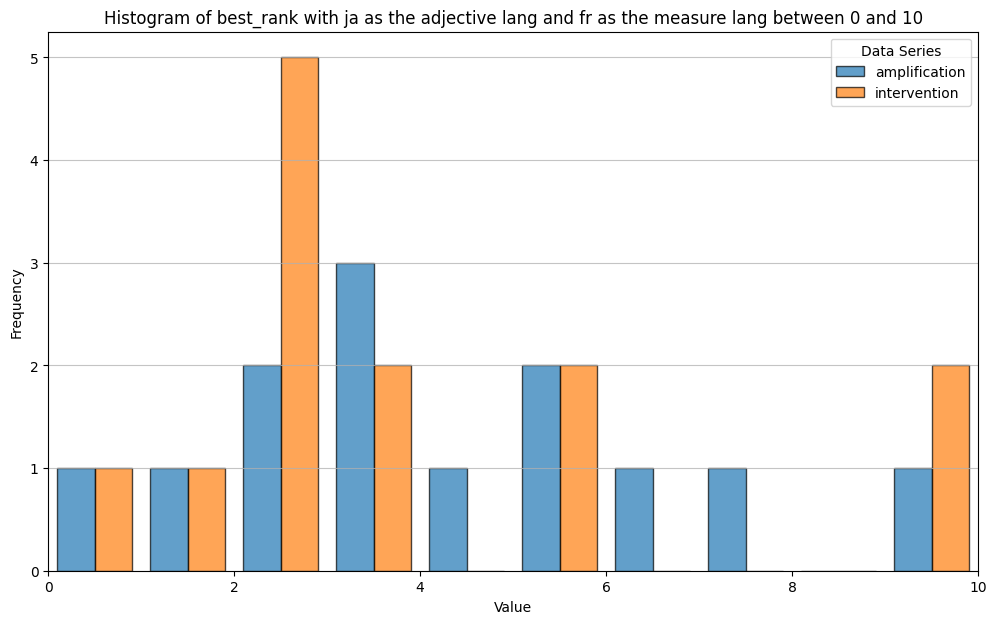

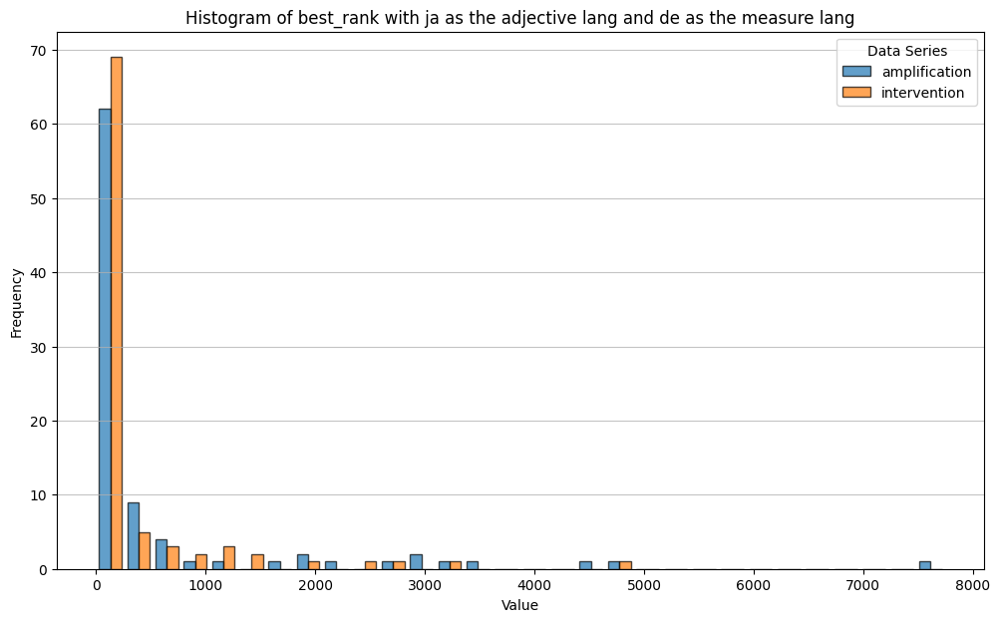

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


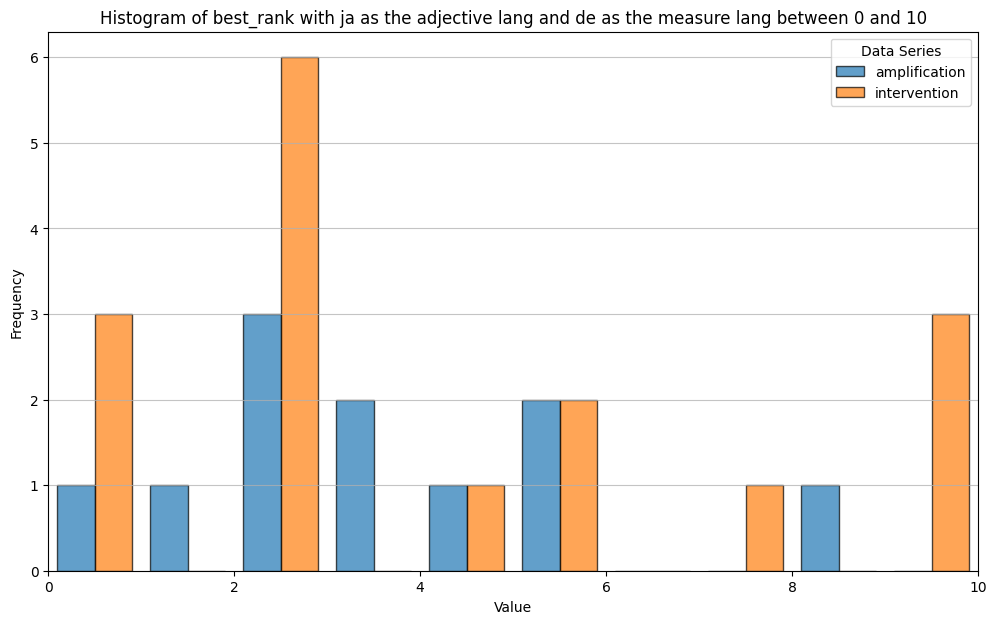

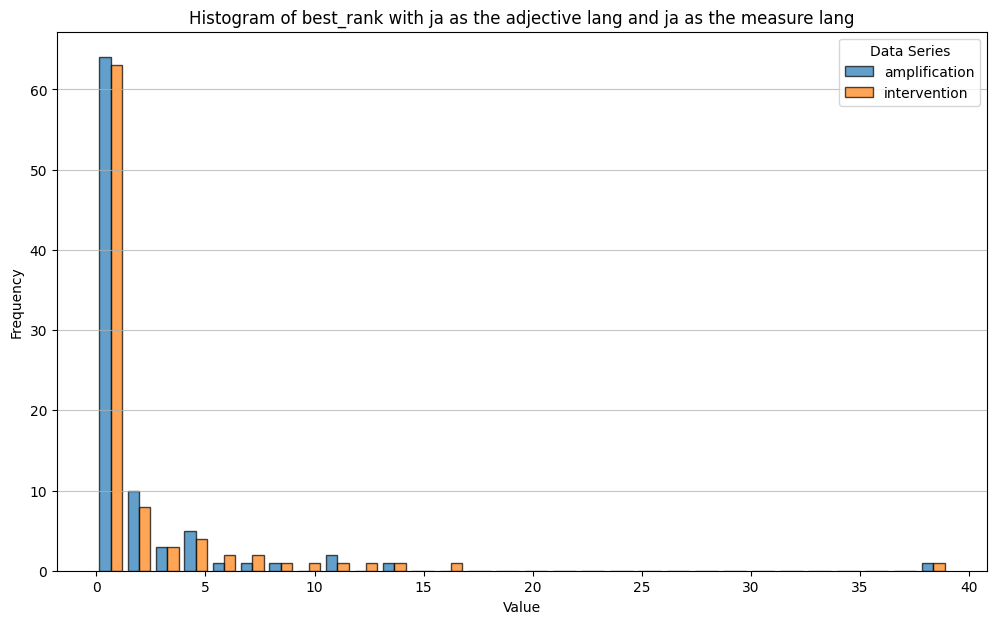

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


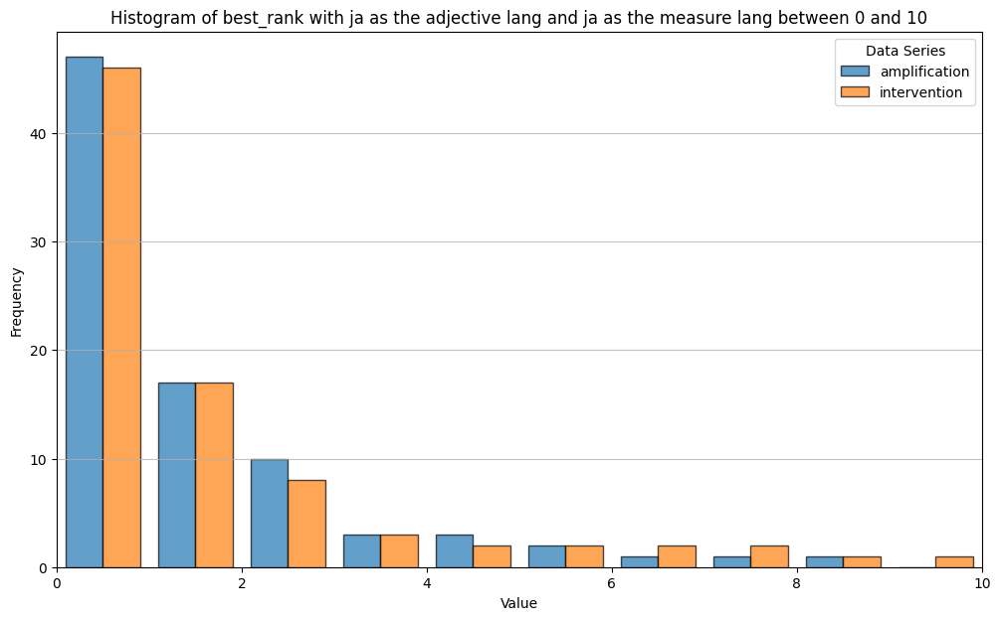

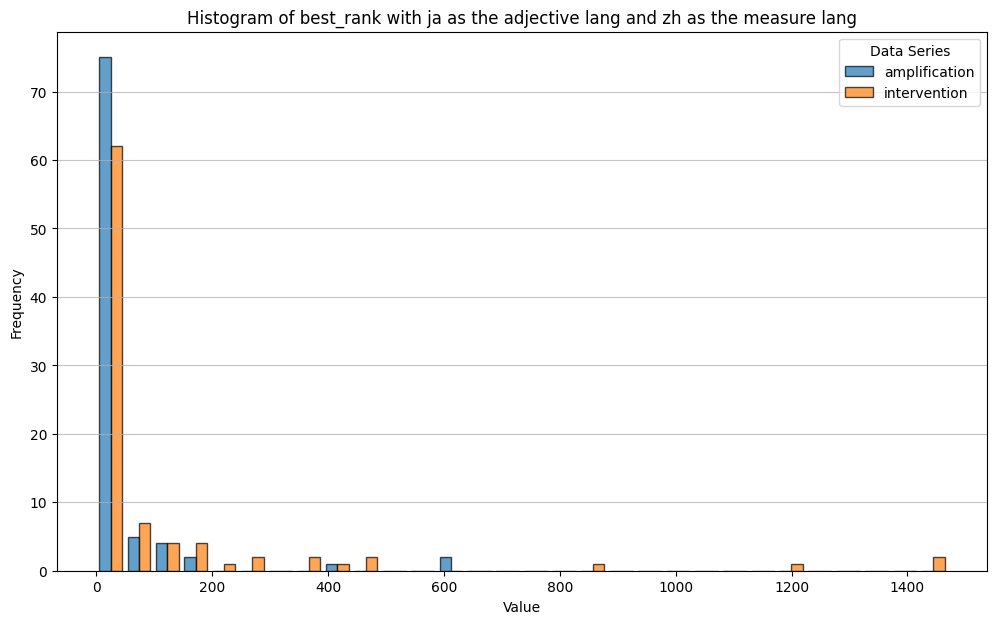

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


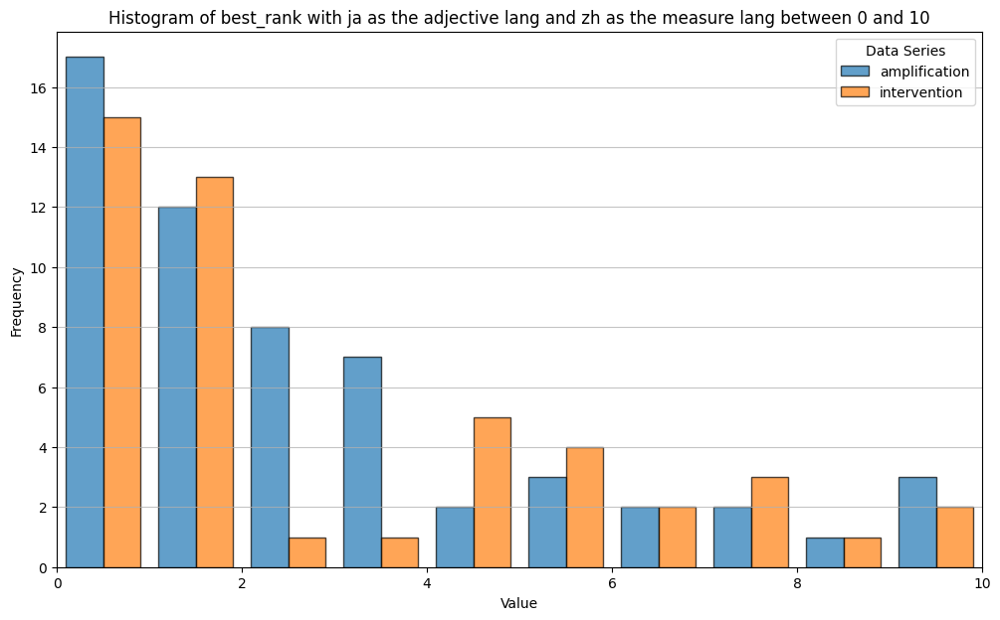

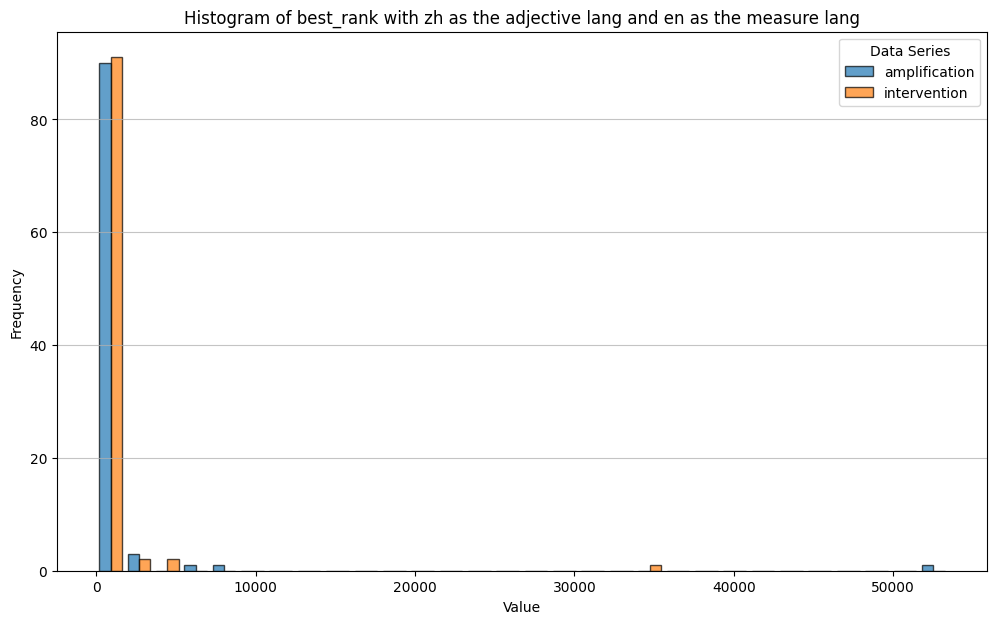

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


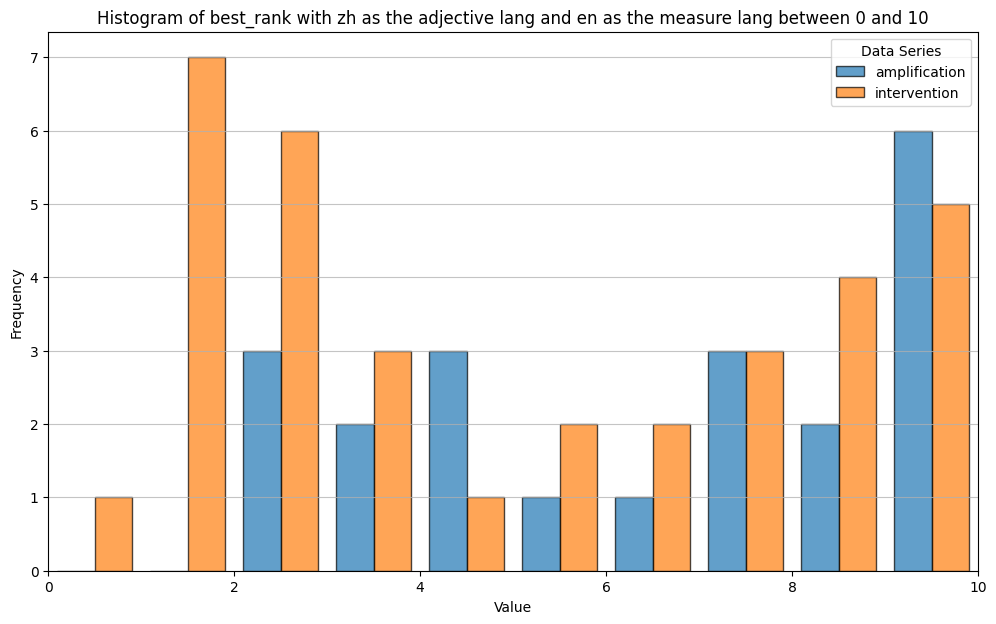

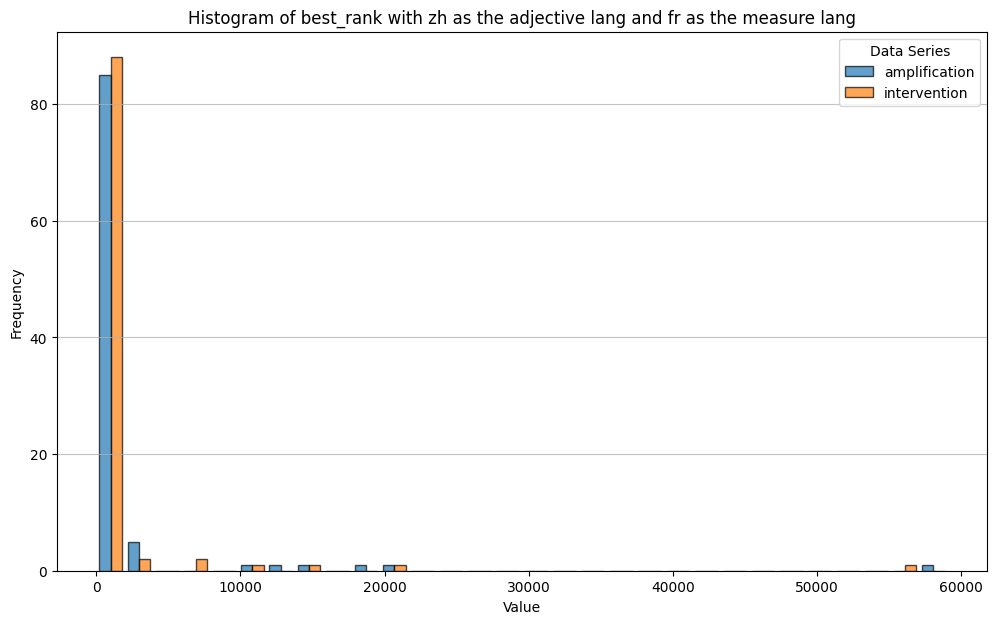

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


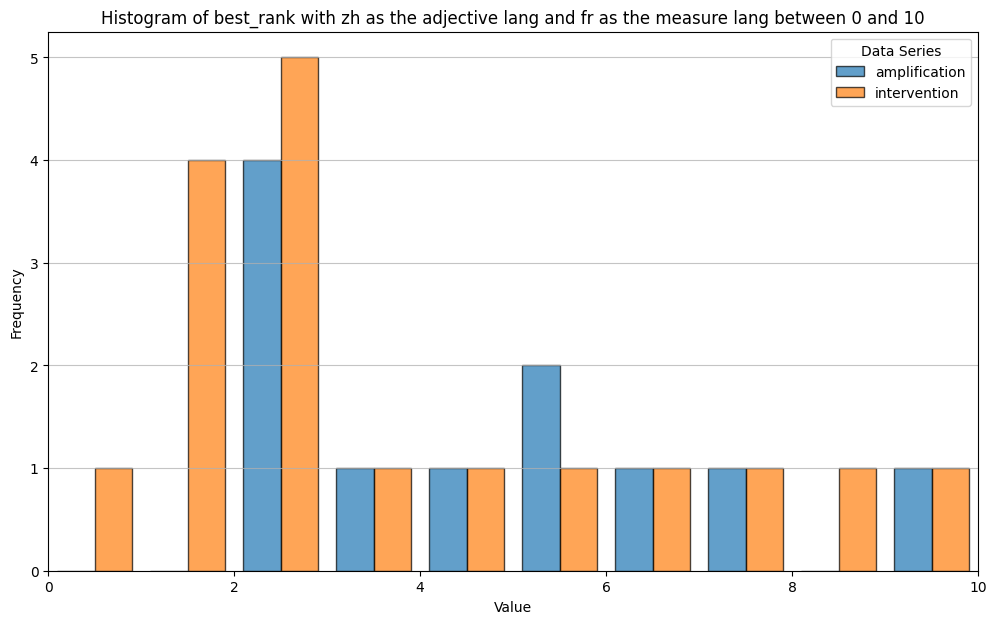

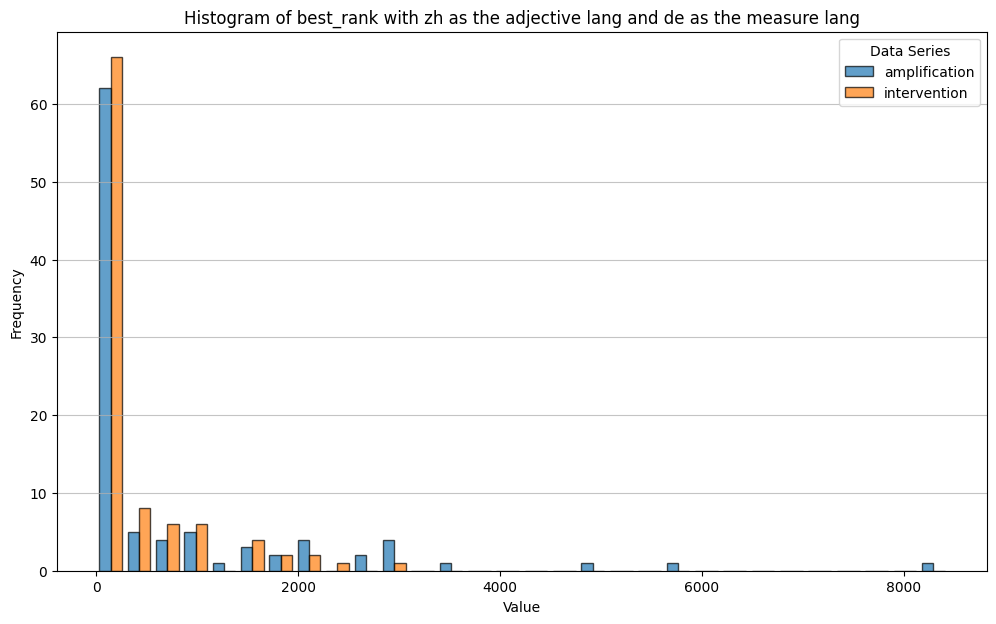

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


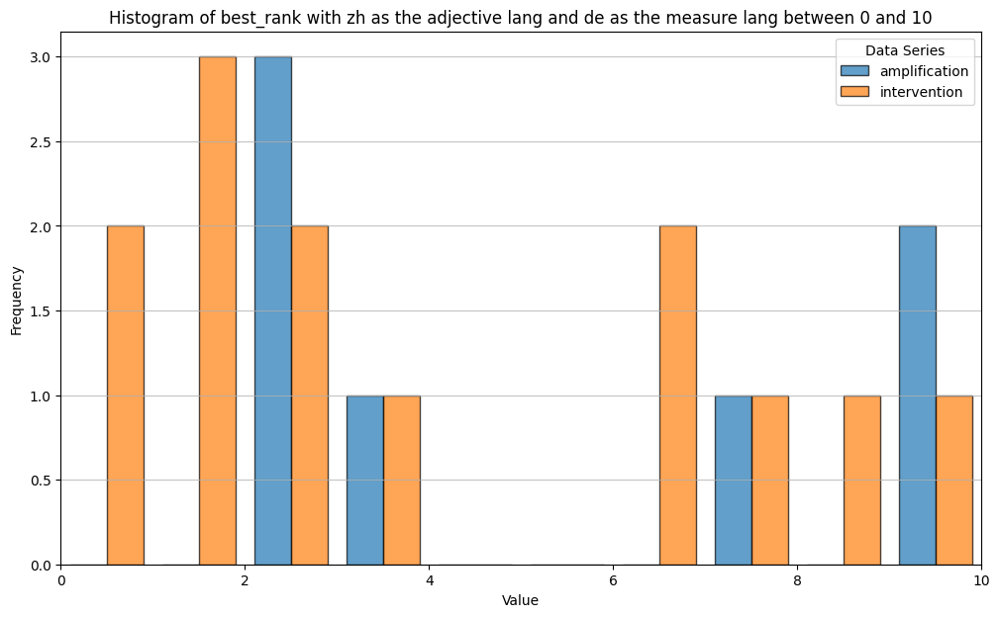

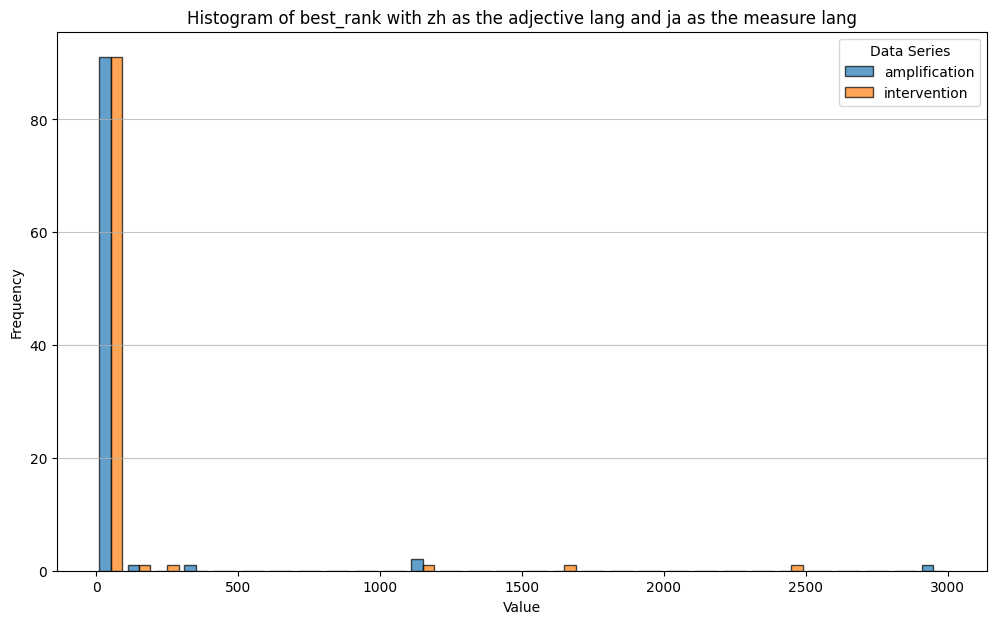

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


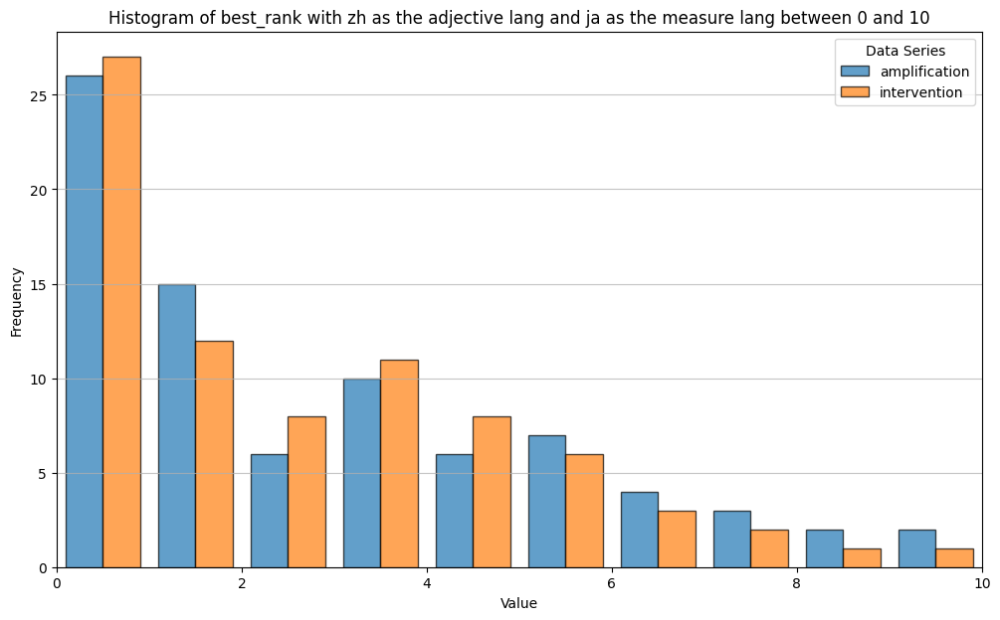

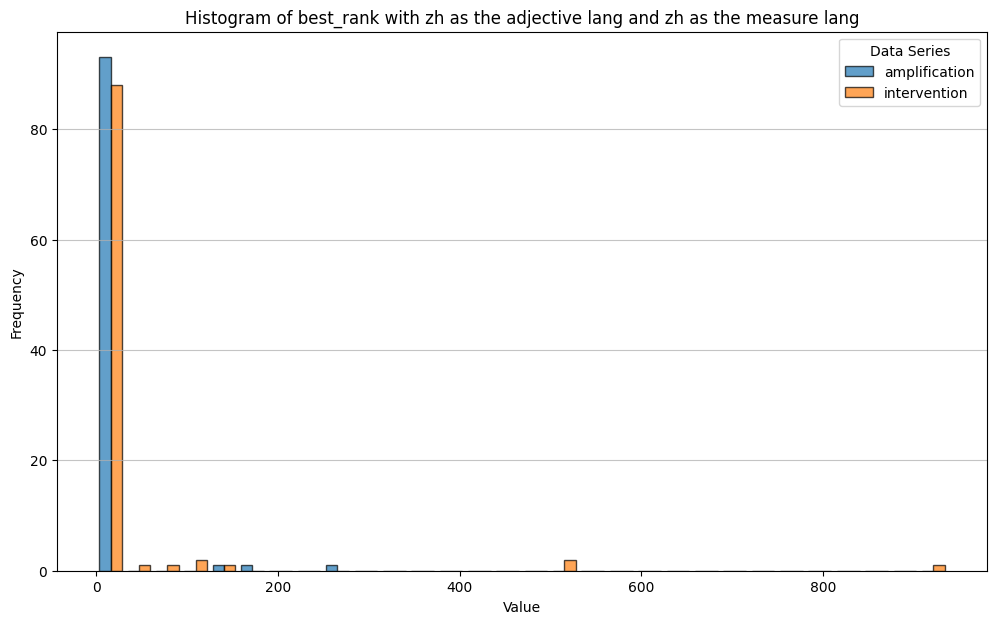

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


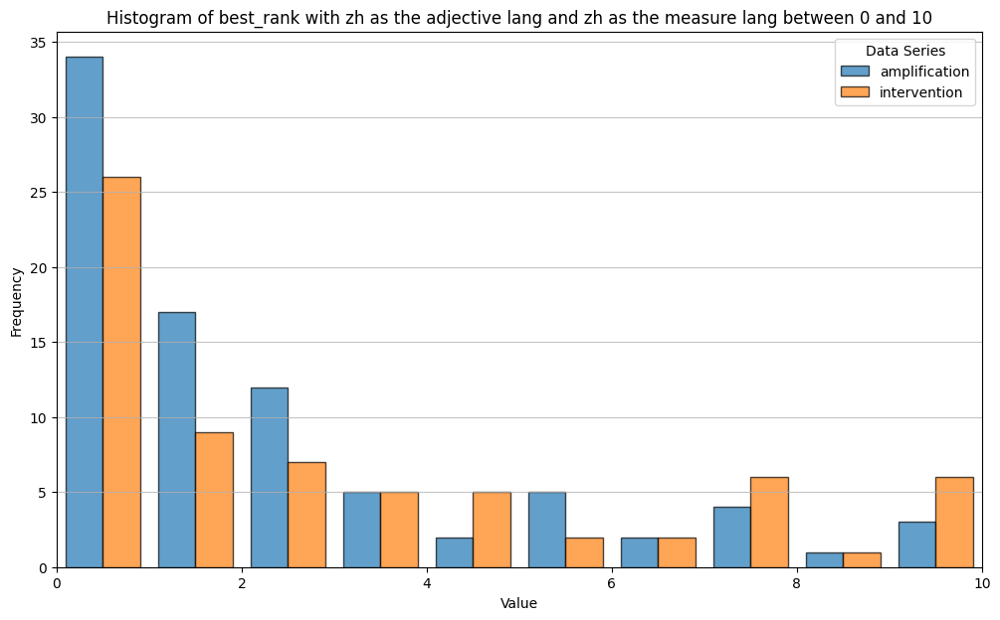

In [53]:
rank_dict = dict()
for lang in langs:
  rank_dict[lang] = dict()
  for lang2 in langs:
    rank_dict[lang][lang2] = dict()

for lang in langs:
  for key, value in combined_dict_everything['best_rank'][lang].items():
    for lang2, val in value.items():
      rank_dict[lang][lang2][key] = val

for lang in langs:
  for lang2 in langs:
    title = f"Histogram of best_rank with {lang} as the adjective lang and {lang2} as the measure lang"
    create_multi_series_histogram(rank_dict[lang][lang2], title=title)

In [54]:
langs_plus = langs + ['all']

## with expected-lang-based-metric
# with Chinese ablation
result_zh_ablation_n = dict() # result[adj lang][result lang][types]
for lang in langs:
    result_zh_ablation_n[lang] = dict()
    for lang2 in langs:
        result_zh_ablation_n[lang][lang2] = {'old_logit_diff': [], 'new_logit_diff': [], 'logit_diff_diff': [], 'best_rank': []}
    for adj, ans in train_data:
        prompt = prompt_zh.format(adj=adj[lang])
        if (lang, adj[lang]) in inappropriate_set:
          print(f'Skip {prompt}')
          continue
        print(prompt)
        d = faster_whole_iterate(prompt, lang, ['zh'], [], ans, supernodes_dict)
        if not d:
            continue

        for lang2 in langs:
            o_diff, n_diff, diff, rank = d[lang2]
            result_zh_ablation_n[lang][lang2]['old_logit_diff'].append(o_diff)
            result_zh_ablation_n[lang][lang2]['new_logit_diff'].append(n_diff)
            result_zh_ablation_n[lang][lang2]['logit_diff_diff'].append(diff)
            result_zh_ablation_n[lang][lang2]['best_rank'].append(rank)

    for lang2 in langs:
        for key, value in result_zh_ablation_n[lang][lang2].items():
            if key == 'best_rank':
                continue
            # take mean
            if len(value) != 0:
                result_zh_ablation_n[lang][lang2][key] = sum(value) / len(value)
            if len(value) == 0:
                result_zh_ablation_n[lang][lang2][key] = 0

# with lang node amplification
result_amplification_n = dict()
for lang in langs:
    result_amplification_n[lang] = dict()
    for lang2 in langs:
        result_amplification_n[lang][lang2] = {'old_logit_diff': [], 'new_logit_diff': [], 'logit_diff_diff': [], 'best_rank': []}
    for adj, ans in train_data:
        prompt = prompt_zh.format(adj=adj[lang])
        if (lang, adj[lang]) in inappropriate_set:
          print(f'Skip {prompt}')
          continue
        print(prompt)
        d = faster_whole_iterate(prompt, lang, [], [lang], ans, supernodes_dict)
        if not d:
            continue
        for lang2 in langs:
            o_diff, n_diff, diff, rank = d[lang2]
            result_amplification_n[lang][lang2]['old_logit_diff'].append(o_diff)
            result_amplification_n[lang][lang2]['new_logit_diff'].append(n_diff)
            result_amplification_n[lang][lang2]['logit_diff_diff'].append(diff)
            result_amplification_n[lang][lang2]['best_rank'].append(rank)

    for lang2 in langs:
        for key, value in result_amplification_n[lang][lang2].items():
            if key == 'best_rank':
              continue
            # take mean
            if len(value) != 0:
              result_amplification_n[lang][lang2][key] = sum(value) / len(value)
            else:
              result_amplification_n[lang][lang2][key] = 0

# with both ablation and amplification
result_ablation_amplification_n = dict()
for lang in langs:
    result_ablation_amplification_n[lang] = dict()
    for lang2 in langs:
        result_ablation_amplification_n[lang][lang2] = {'old_logit_diff': [], 'new_logit_diff': [], 'logit_diff_diff': [], 'best_rank': []}
    for adj, ans in train_data:
        prompt = prompt_zh.format(adj=adj[lang])
        if (lang, adj[lang]) in inappropriate_set:
          print(f'Skip {prompt}')
          continue
        print(prompt)
        try:
            d = faster_whole_iterate(prompt, lang, ['zh'], [lang], ans, supernodes_dict)
            if not d:
                continue
            for lang2 in langs:
                o_diff, n_diff, diff, rank = d[lang2]
                result_ablation_amplification_n[lang][lang2]['old_logit_diff'].append(o_diff)
                result_ablation_amplification_n[lang][lang2]['new_logit_diff'].append(n_diff)
                result_ablation_amplification_n[lang][lang2]['logit_diff_diff'].append(diff)
                result_ablation_amplification_n[lang][lang2]['best_rank'].append(rank)
        except ValueError:
            # amplifying Chinese -> we could say the difference is 0 bcz it is unchanged
            for lang2 in langs:
                result_ablation_amplification_n[lang][lang2]['old_logit_diff'].append(0)
                result_ablation_amplification_n[lang][lang2]['new_logit_diff'].append(0)
                result_ablation_amplification_n[lang][lang2]['logit_diff_diff'].append(0)
                logits, activaitons = model.get_activations(prompt)
                best_rank = get_best_rank(logits, ans[lang2])
                result_ablation_amplification_n[lang][lang2]['best_rank'].append(best_rank)

    for lang2 in langs:
        for key, value in result_ablation_amplification_n[lang][lang2].items():
            if key == 'best_rank':
              continue
            # take mean
            if len(value) != 0:
              result_ablation_amplification_n[lang][lang2][key] = sum(value) / len(value)
            else:
              result_ablation_amplification_n[lang][lang2][key] = 0

"good"的反义词是"
[('bad', 0.703125), ('Bad', 0.051025390625), ('poor', 0.031005859375), ('坏', 0.021240234375), ('差', 0.018798828125), ('BAD', 0.012939453125), ('not', 0.01141357421875), (' bad', 0.01007080078125), ('不好', 0.00885009765625), ('terrible', 0.00885009765625)]
[('bad', 0.6484375), ('poor', 0.060546875), (' bad', 0.032470703125), ('Bad', 0.028564453125), ('not', 0.025146484375), ('excellent', 0.01348876953125), ('evil', 0.01348876953125), ('terrible', 0.01190185546875), ('good', 0.0081787109375), ('BAD', 0.0081787109375)]
Logit difference of "bad" to "bad": old 0.0, new 0.0, diff 0.0
Logit difference of "mauvais" to "bad": old -11.625, new -12.5, diff -0.875
Logit difference of "schlecht" to "bad": old -14.9375, new -12.5, diff 2.4375
Logit difference of "悪い" to "bad": old -8.25, new -8.75, diff -0.5
Logit difference of "坏" to "bad": old -3.5, new -7.0, diff -3.5
"happy"的反义词是"
[('sad', 0.69140625), ('un', 0.1357421875), ('dis', 0.0208740234375), (' unhappy', 0.0184326171875), ('不

In [55]:
categories = ['old_logit_diff', 'new_logit_diff', 'logit_diff_diff', 'best_rank']
types = ['ablation', 'amplification', 'intervention']
combined_dict_n = dict()
for category in categories:
    combined_dict_n[category] = dict()
    for lang in langs:
        combined_dict_n[category][lang] = dict()
        for t in types:
            combined_dict_n[category][lang][t] = dict()

for lang in langs:
    for lang2 in langs:
        for category in categories:
            combined_dict_n[category][lang]['ablation'][lang2] = result_zh_ablation_n[lang][lang2][category]
            combined_dict_n[category][lang]['amplification'][lang2] = result_amplification_n[lang][lang2][category]
            combined_dict_n[category][lang]['intervention'][lang2] = result_ablation_amplification_n[lang][lang2][category]


/tmp/ipykernel_4031379/2126995624.py:95: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab10', num_inter_keys)


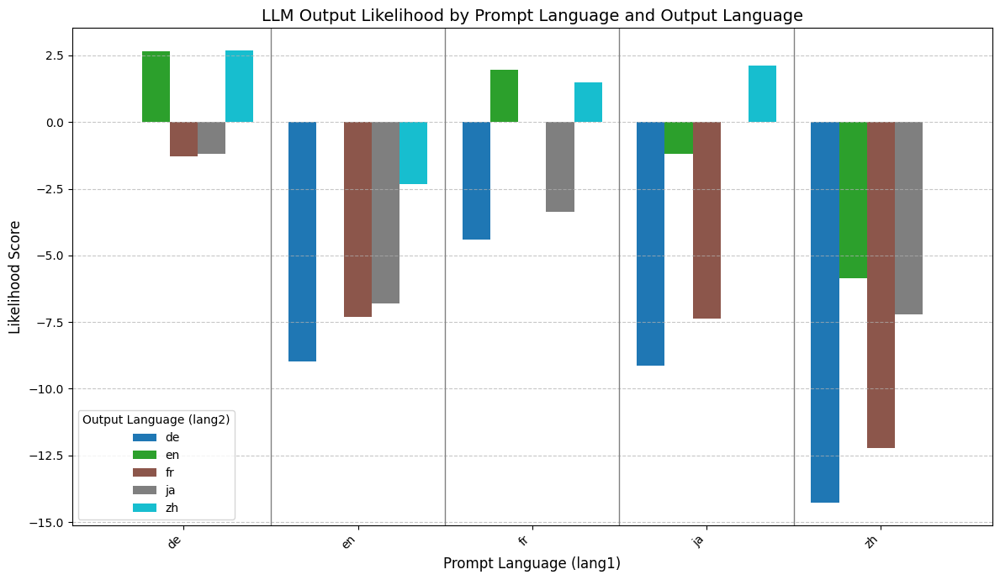

/tmp/ipykernel_4031379/2126995624.py:141: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors =cm.get_cmap('tab10', num_output_languages)


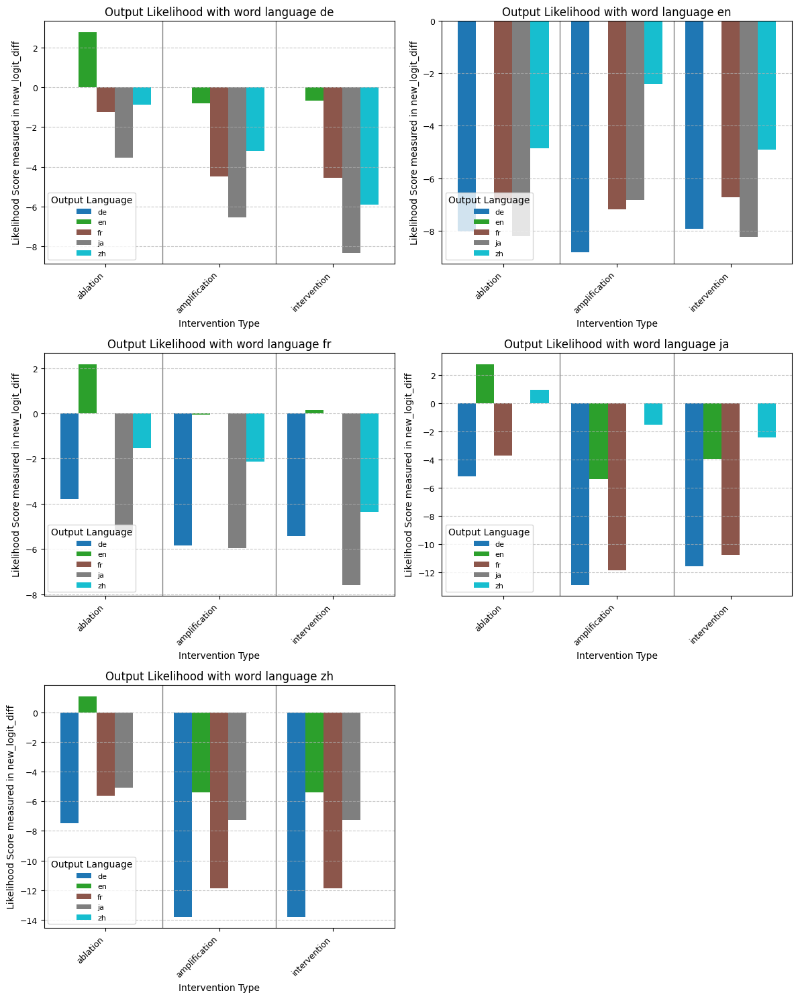

/tmp/ipykernel_4031379/2126995624.py:141: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors =cm.get_cmap('tab10', num_output_languages)


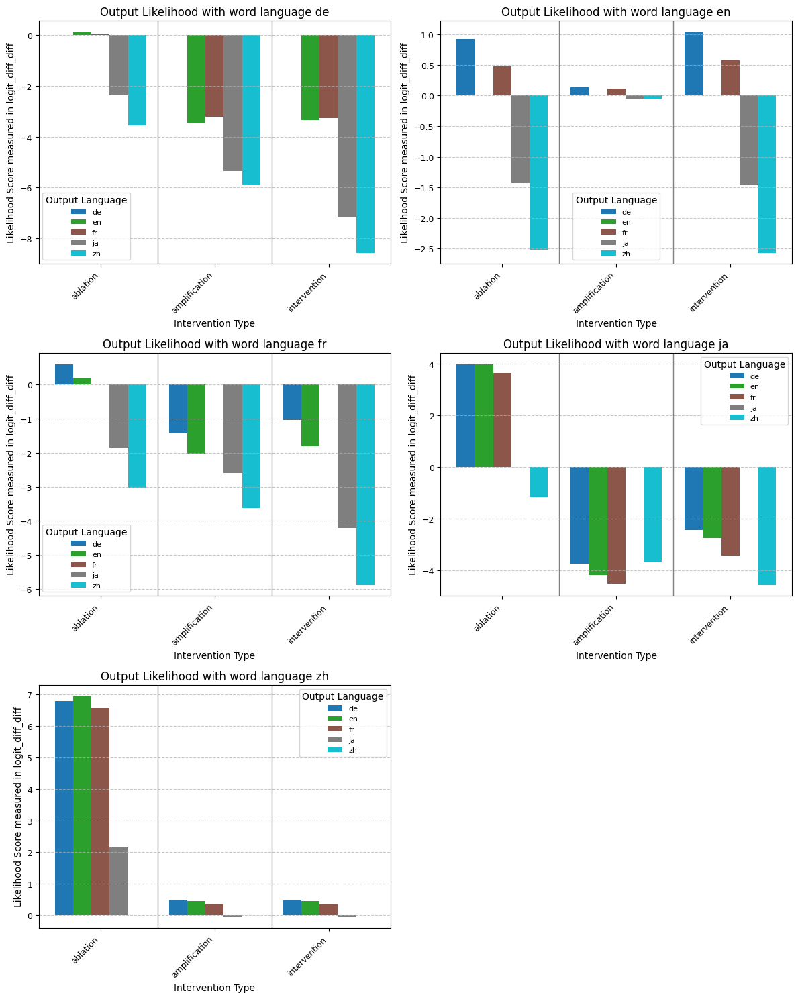

In [56]:
smaller_dict_n = dict()
for lang in langs:
    smaller_dict_n[lang] = dict()
    for lang2 in langs:
        smaller_dict_n[lang][lang2] = result_zh_ablation_n[lang][lang2]['old_logit_diff']
visualize_bar_2ddict_outer_inter(smaller_dict_n)

for key, value in combined_dict_n.items():
    if key == 'old_logit_diff' or key == 'best_rank':
        continue
    bar_graph_visualize(value, key)

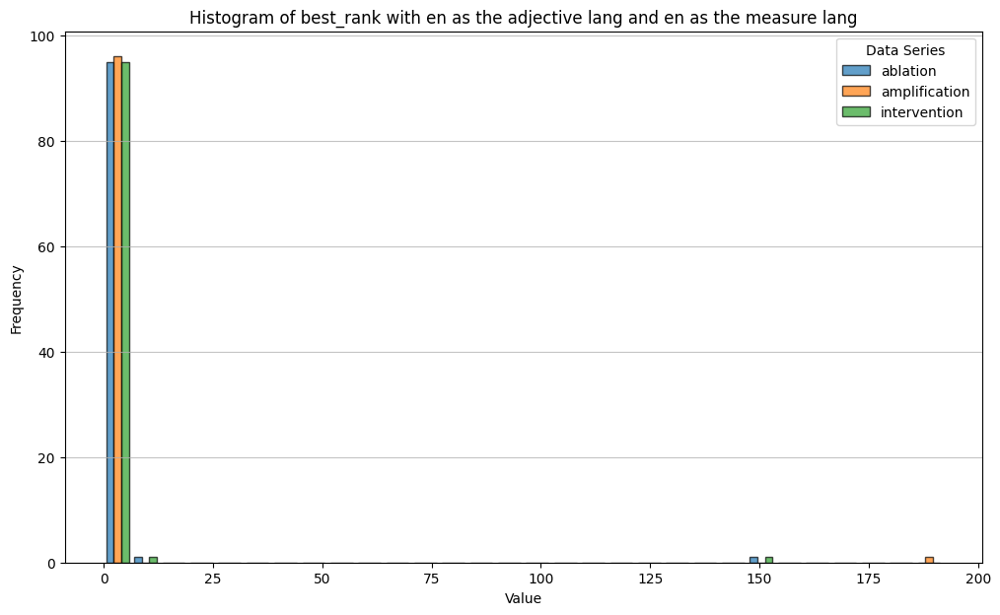

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


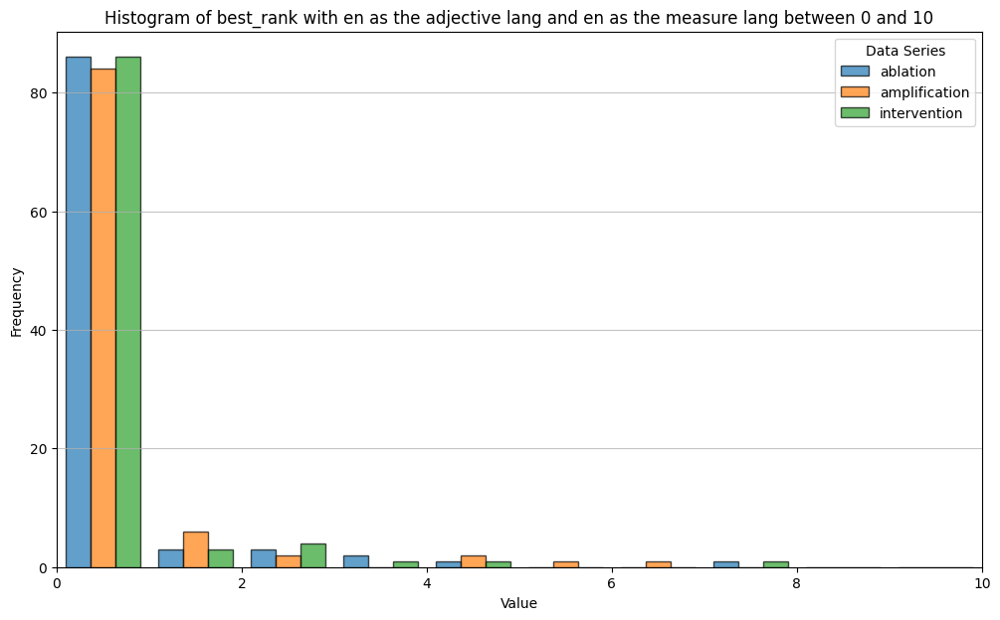

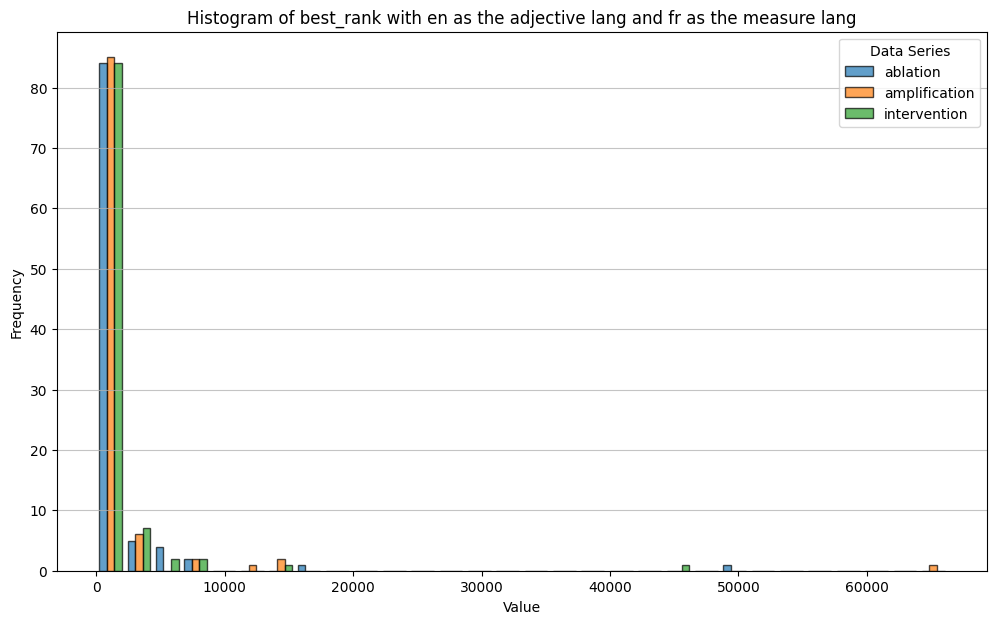

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


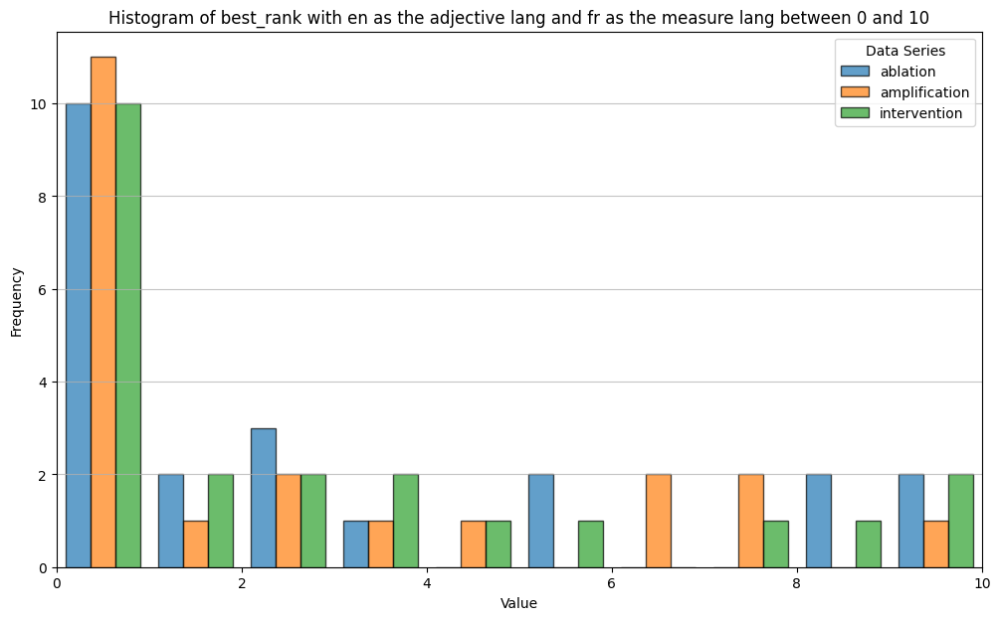

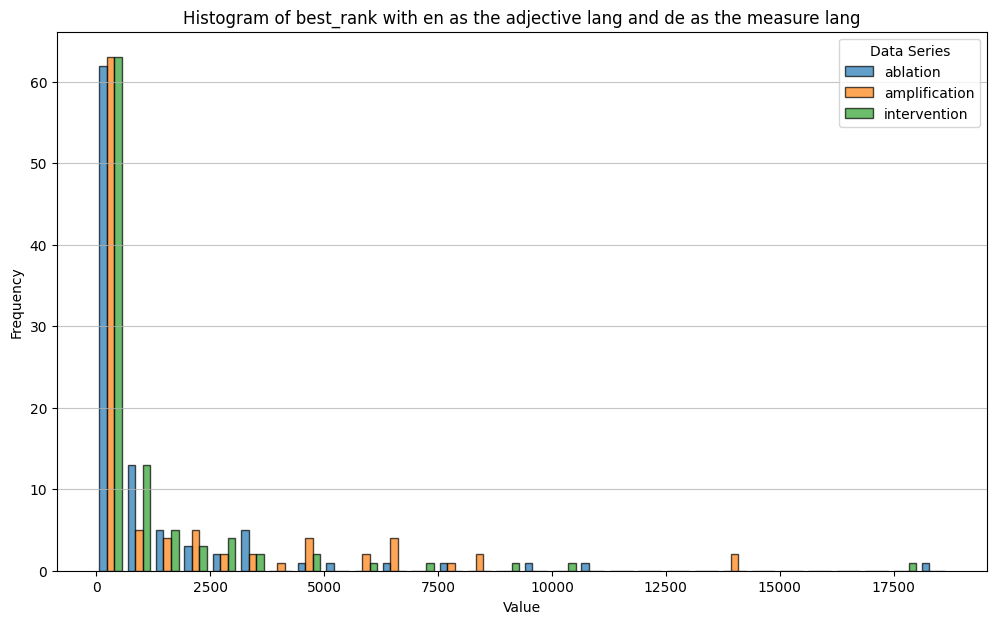

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


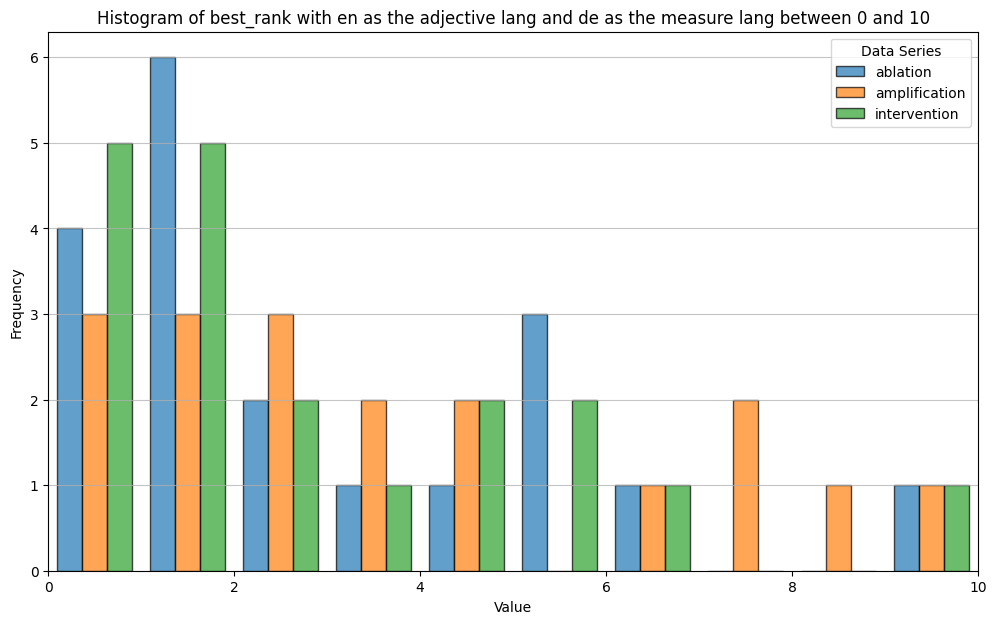

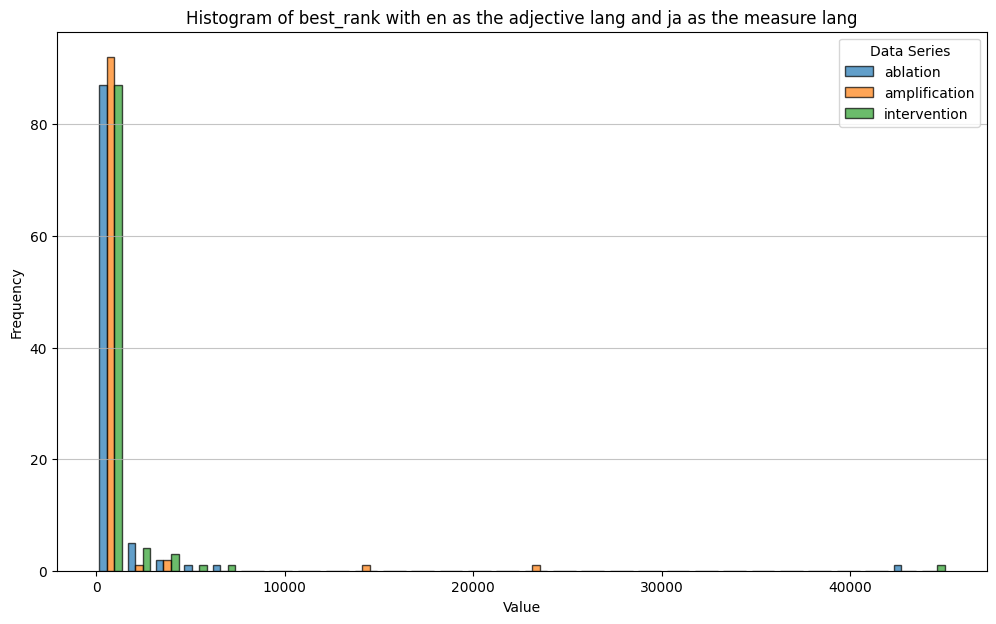

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


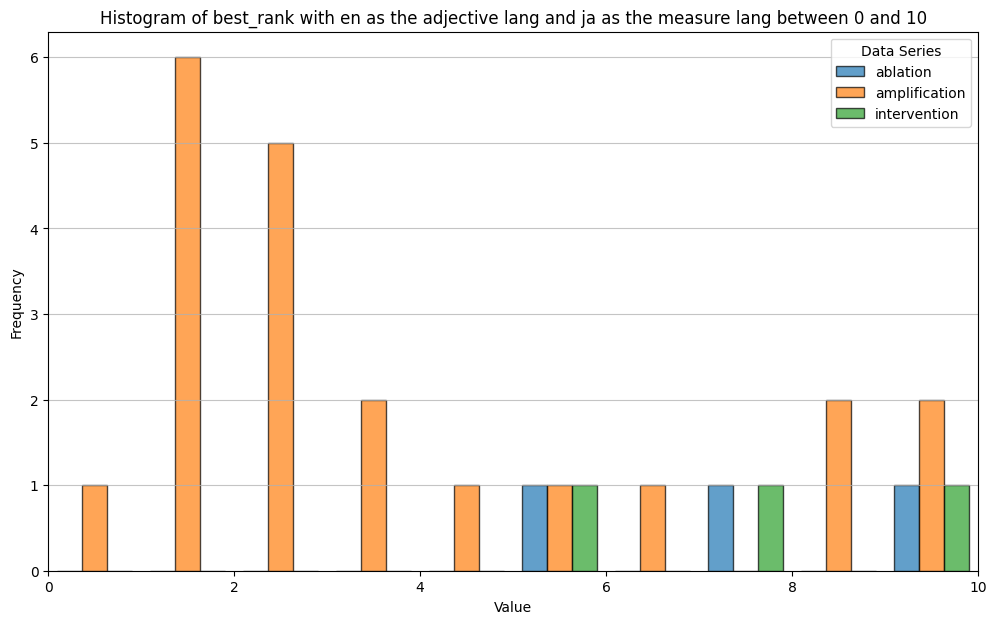

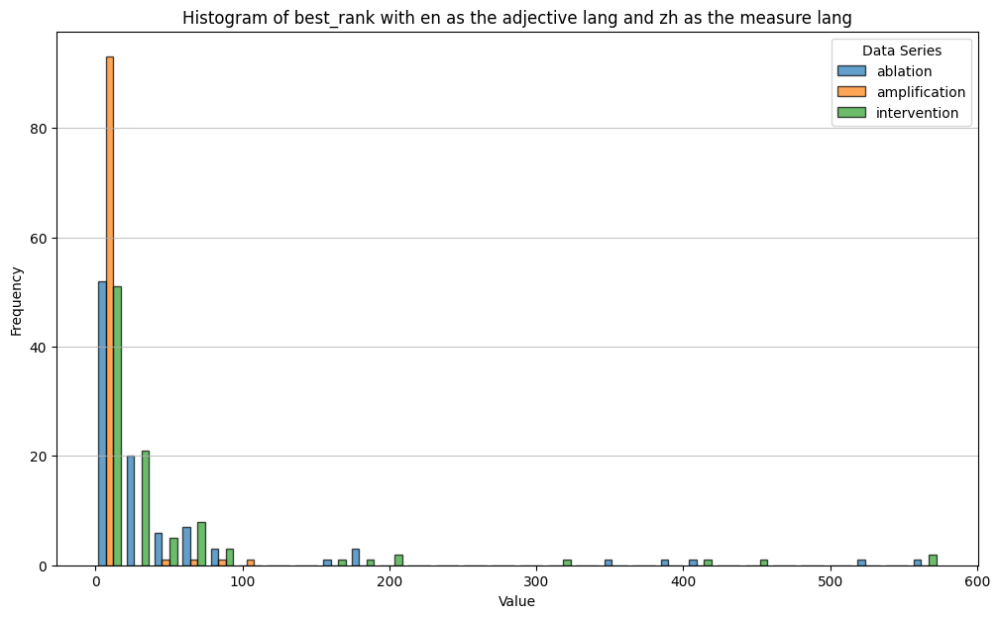

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


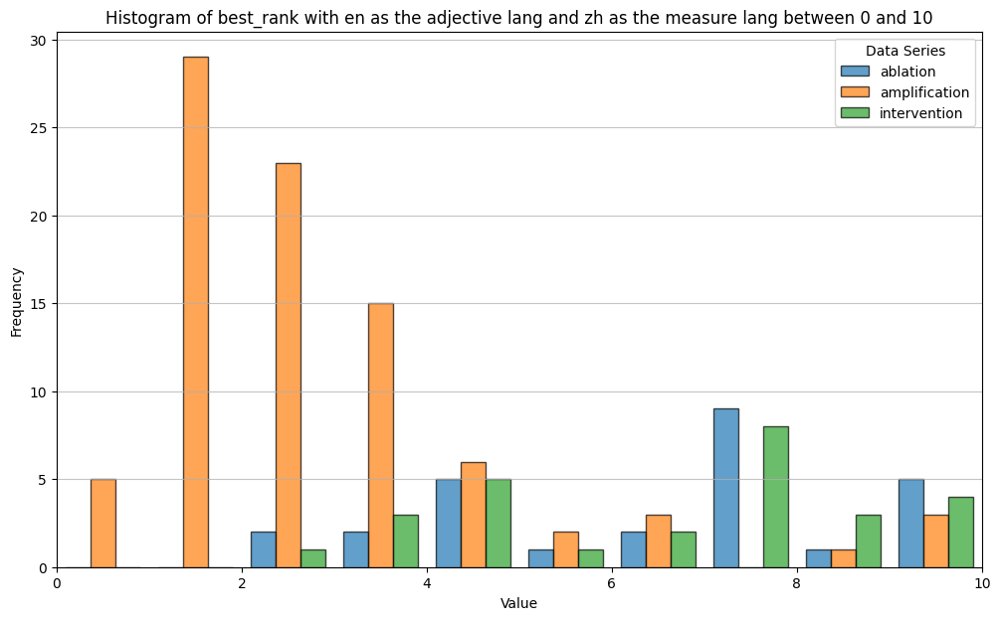

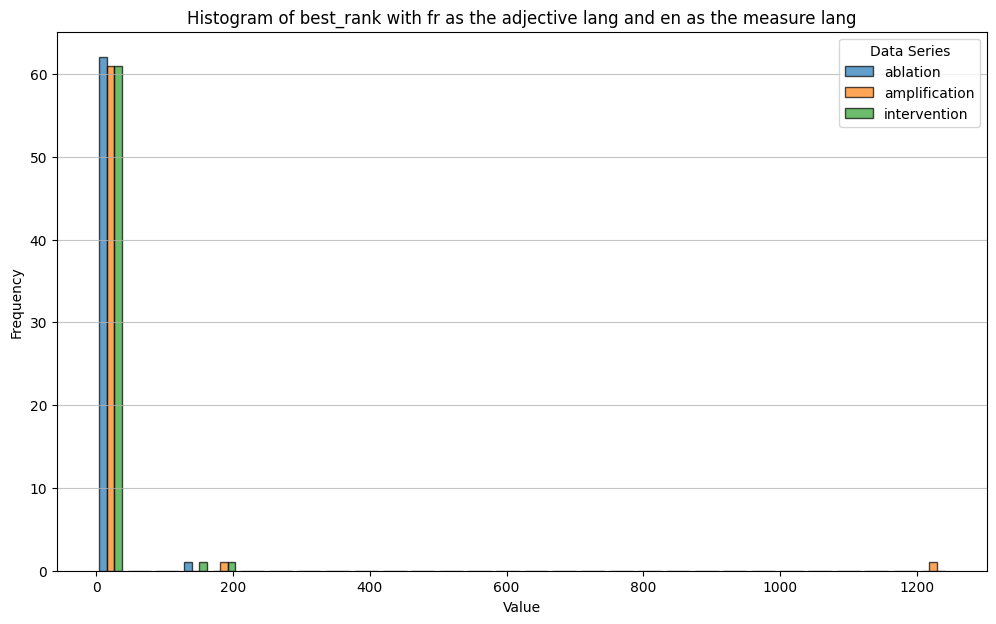

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


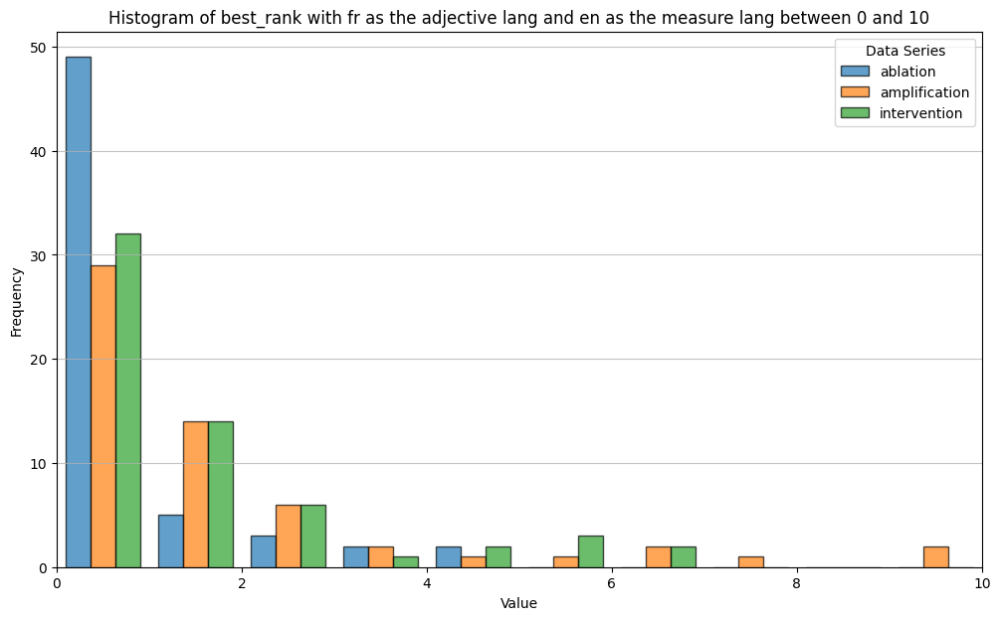

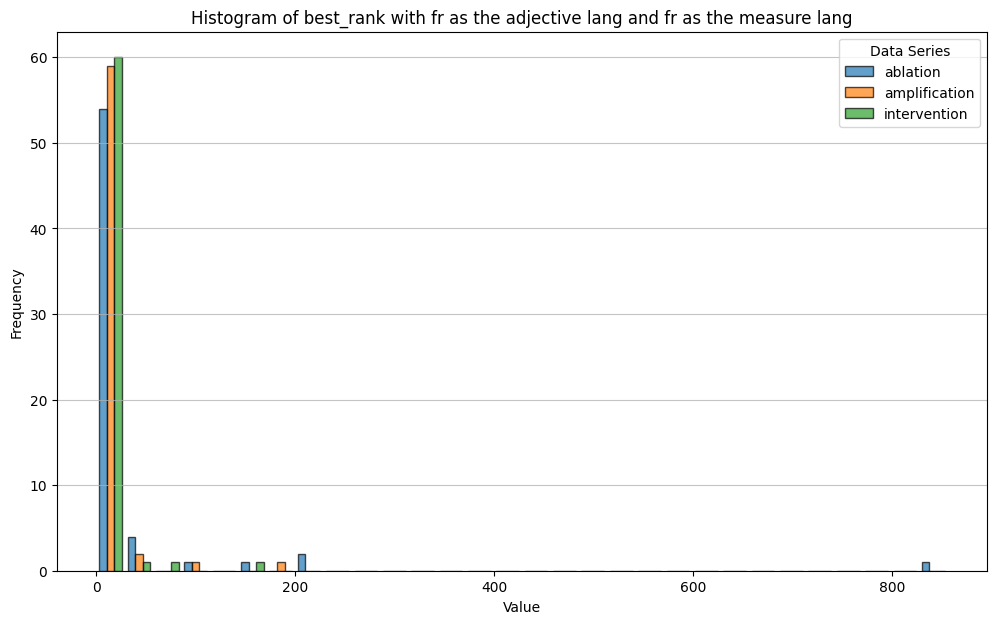

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


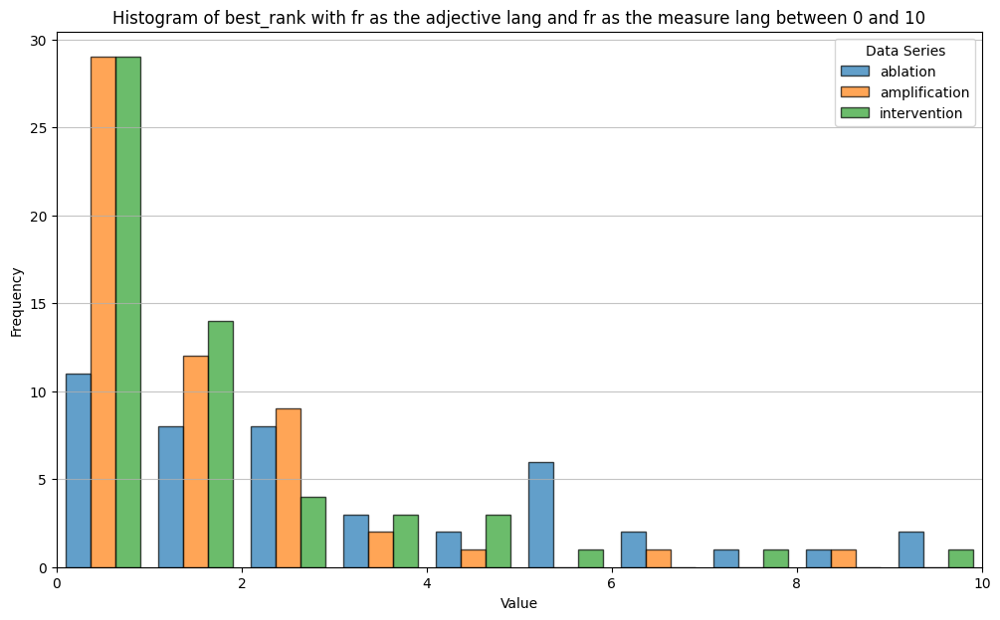

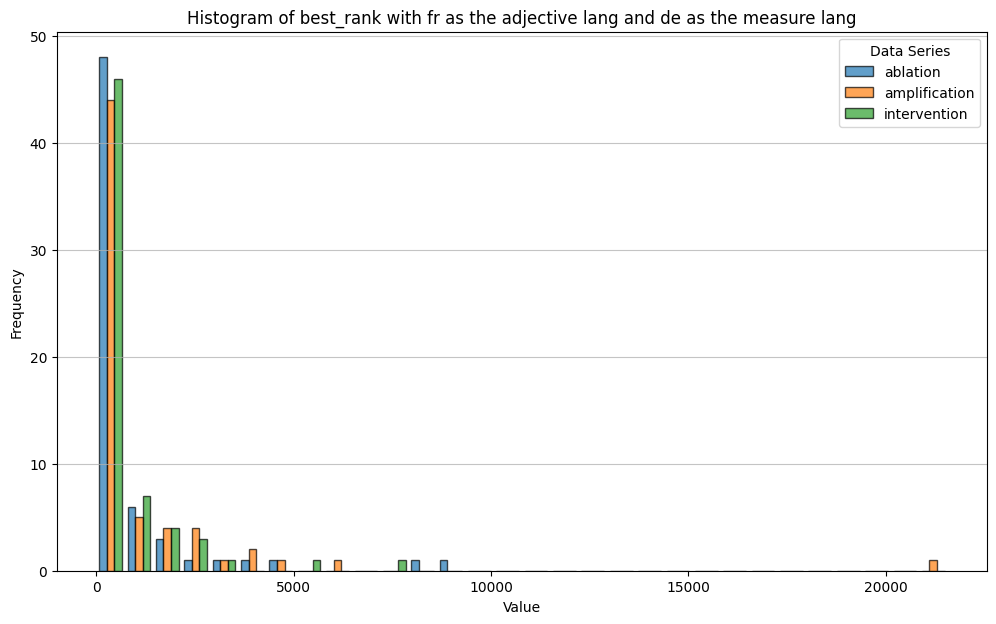

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


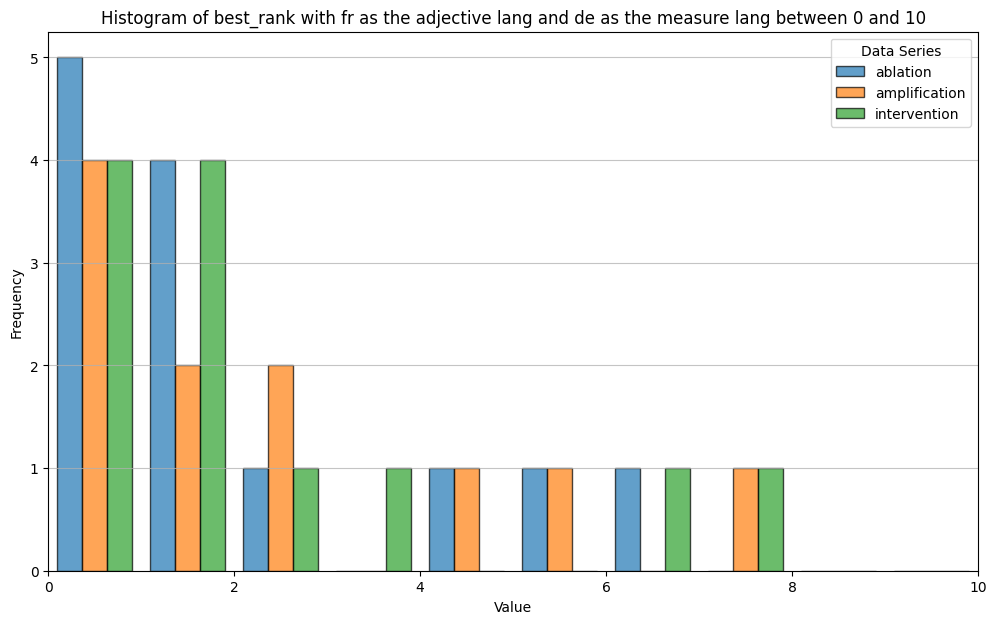

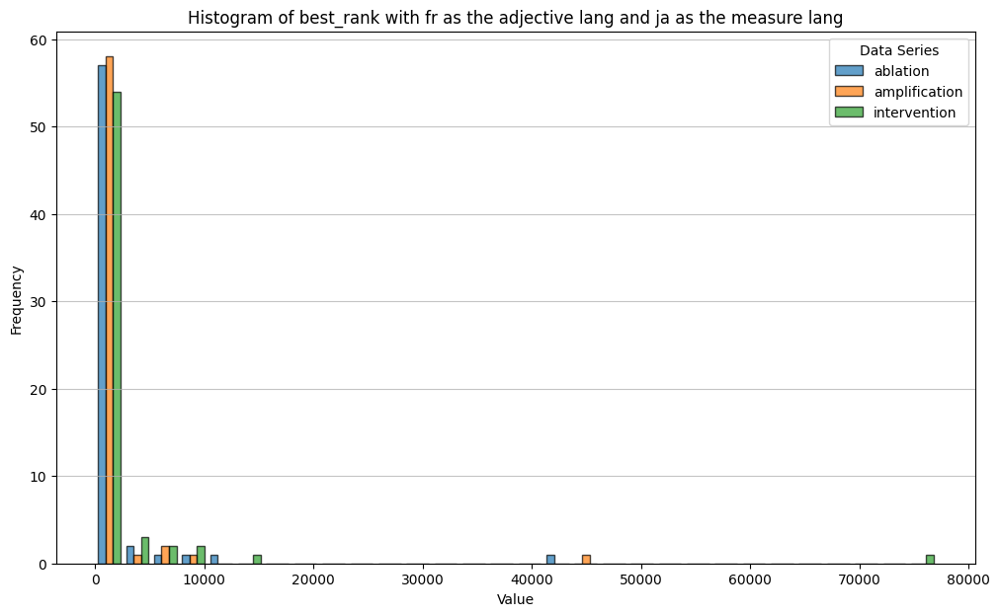

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


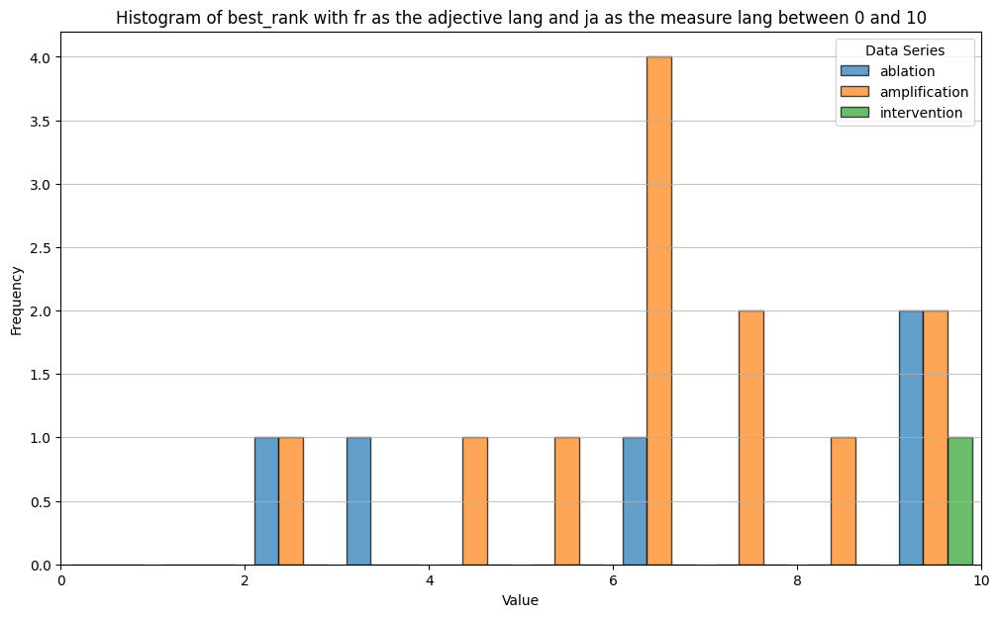

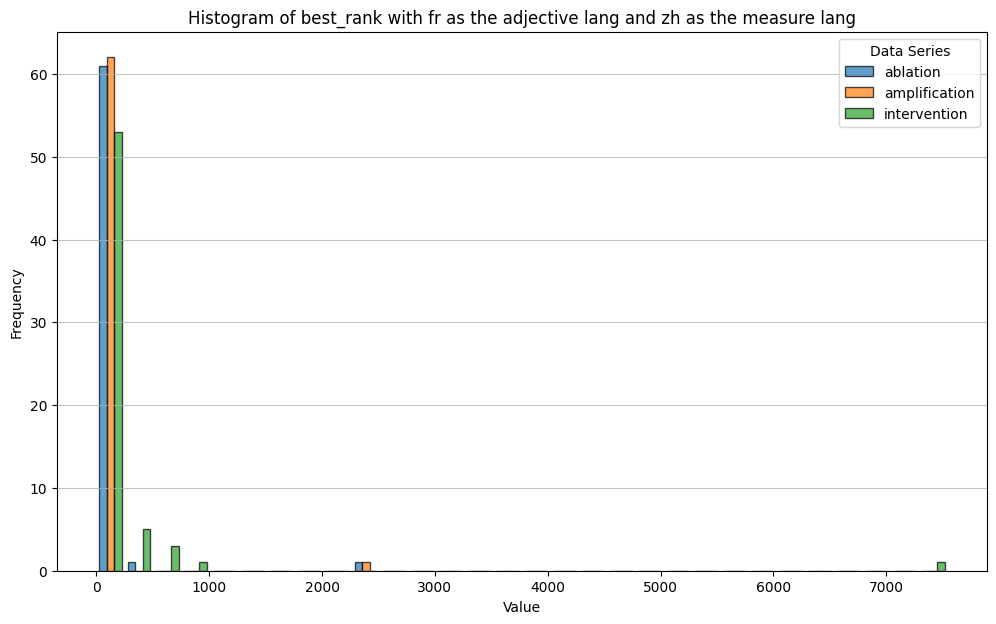

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


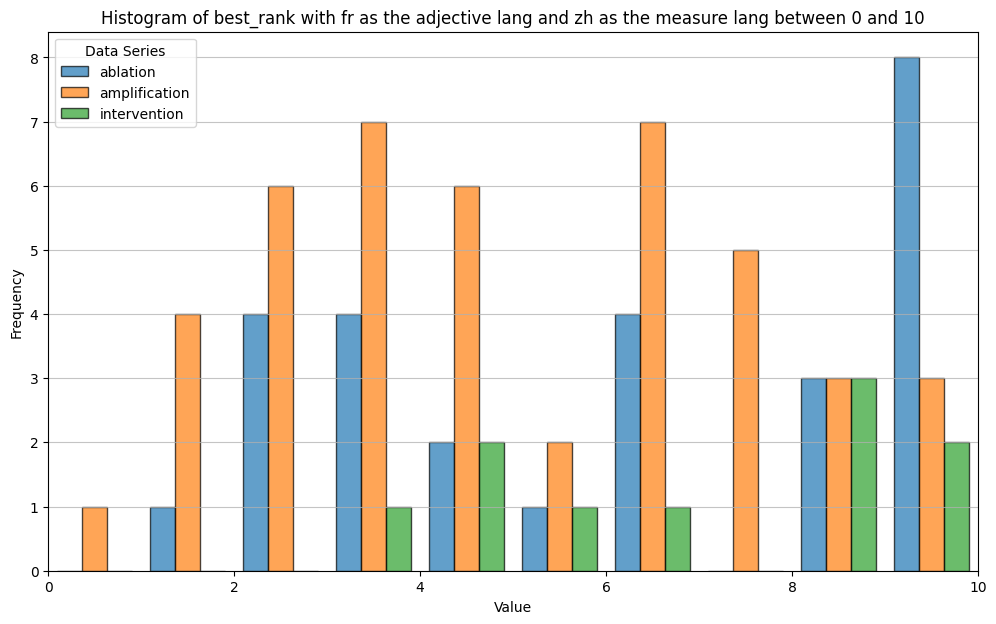

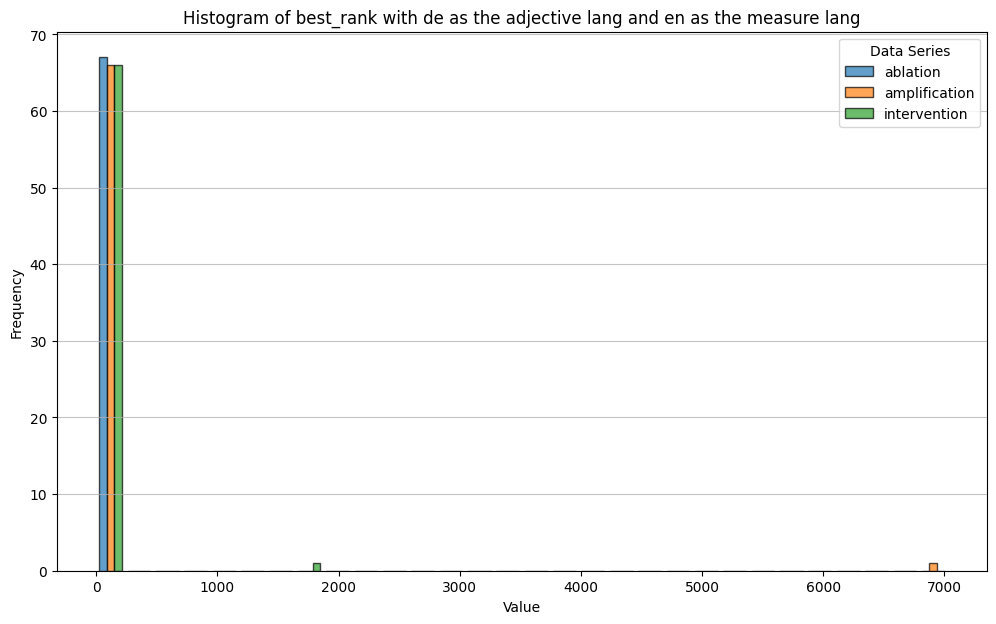

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


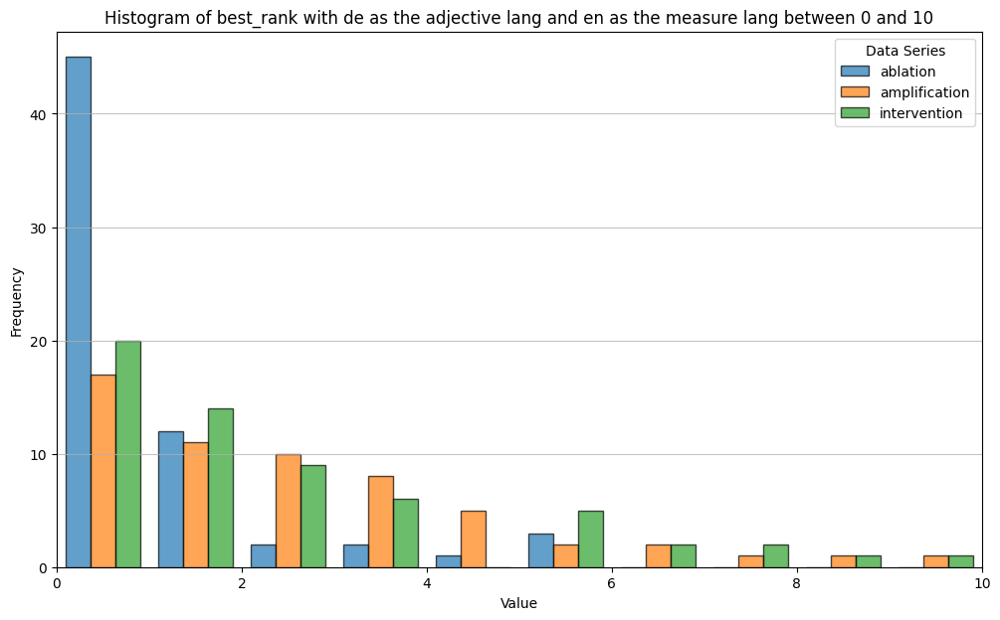

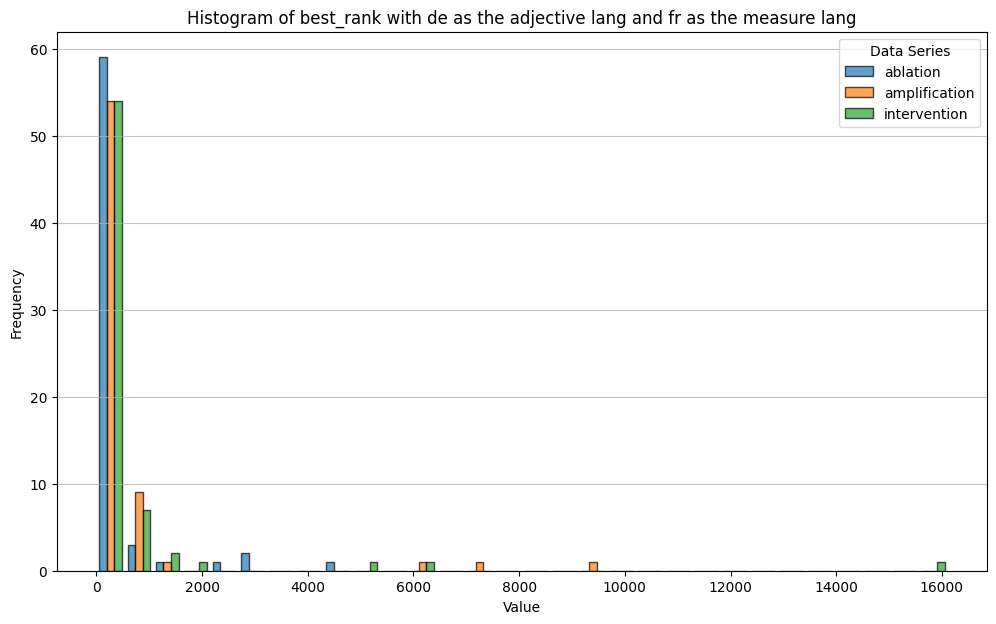

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


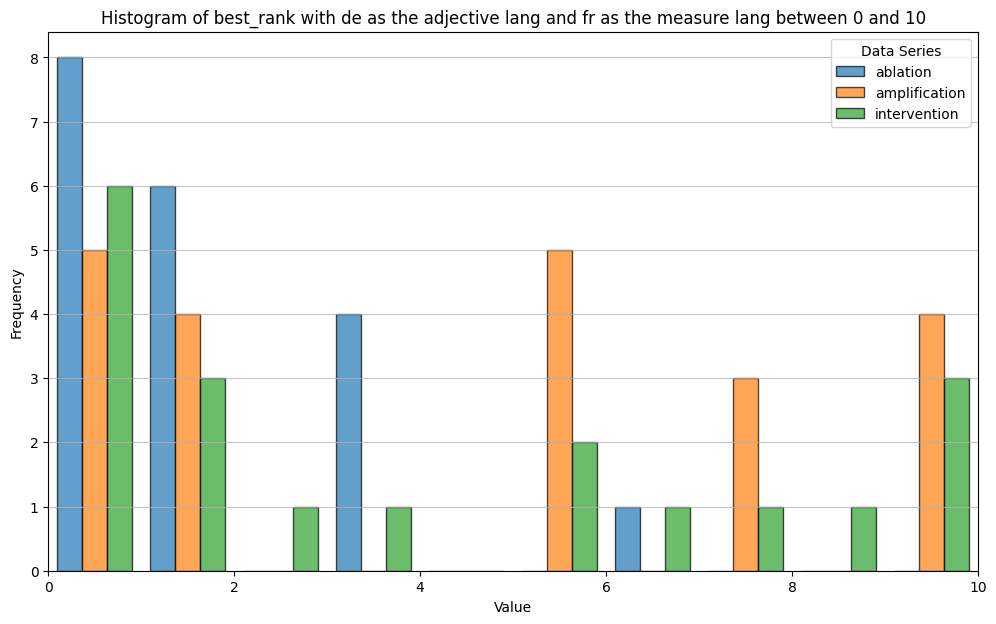

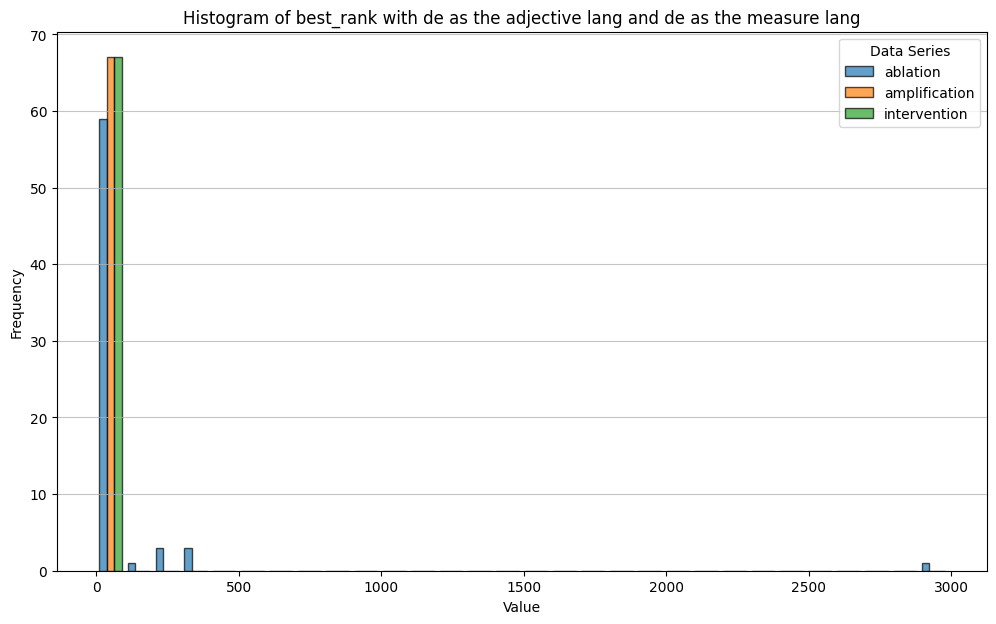

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


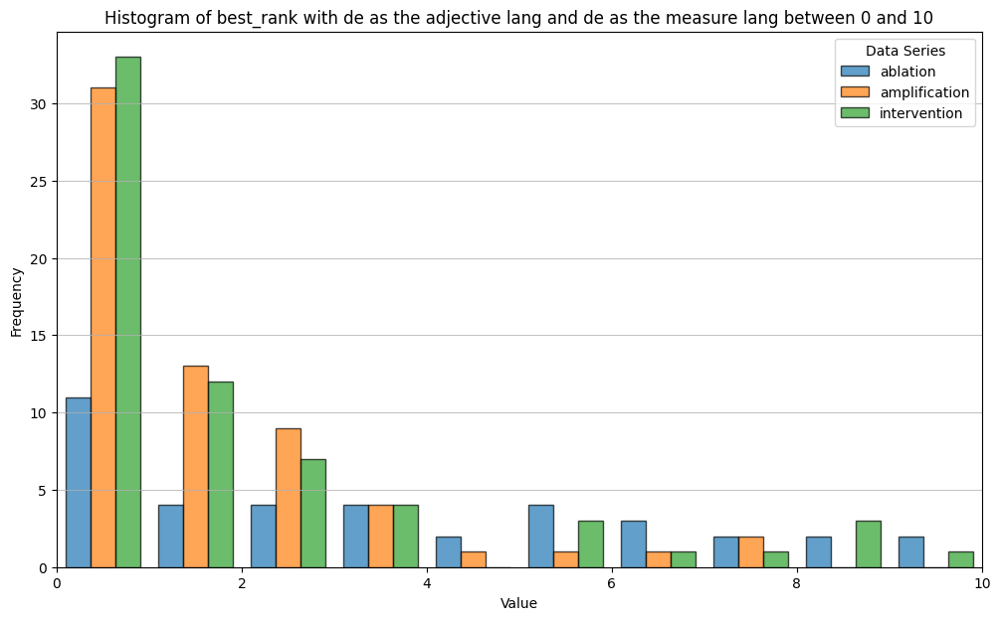

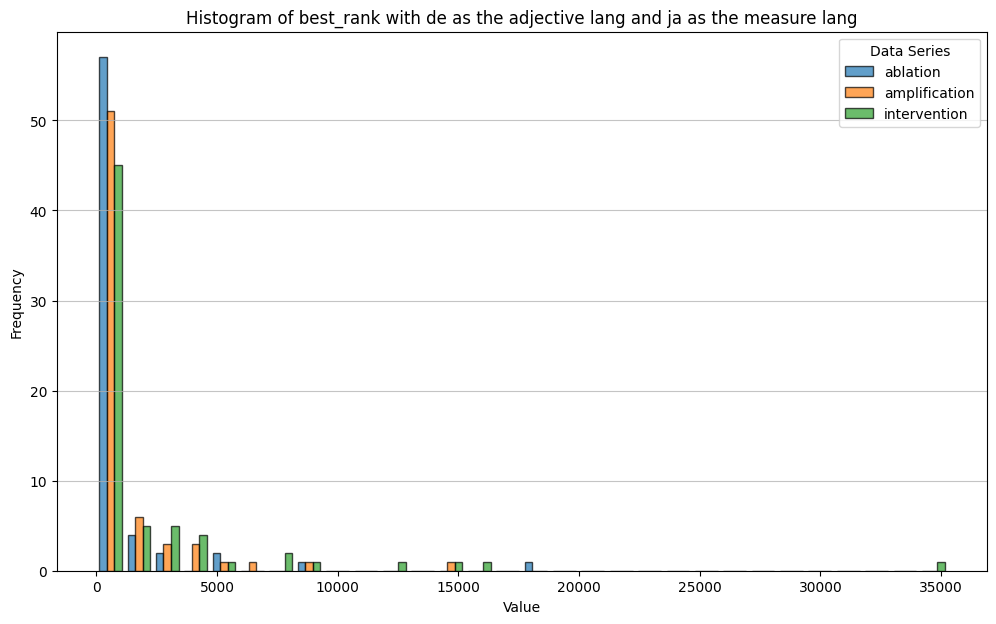

Series 'intervention' has no data points within the 0-10 range and will not be plotted.
Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


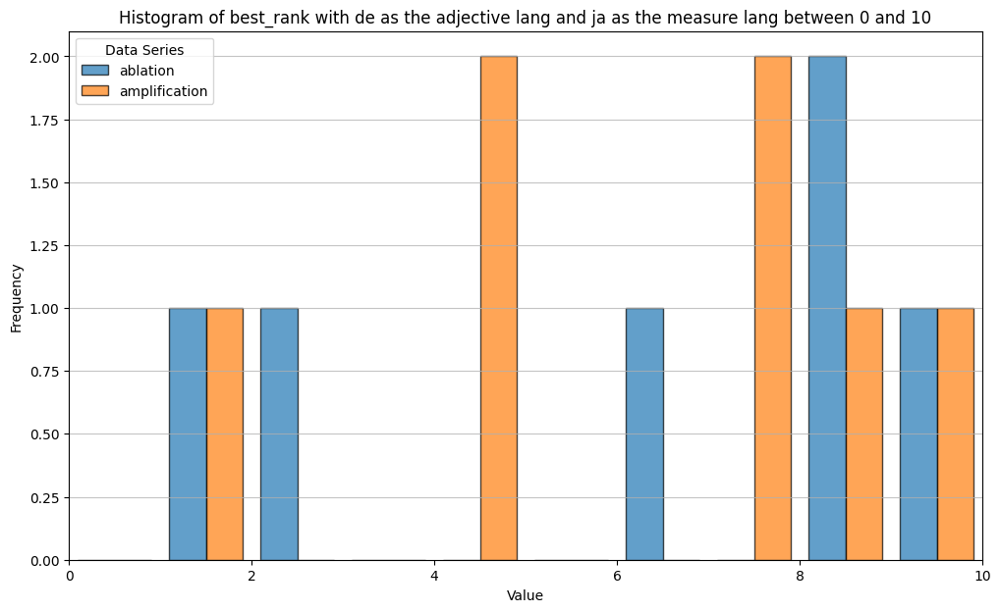

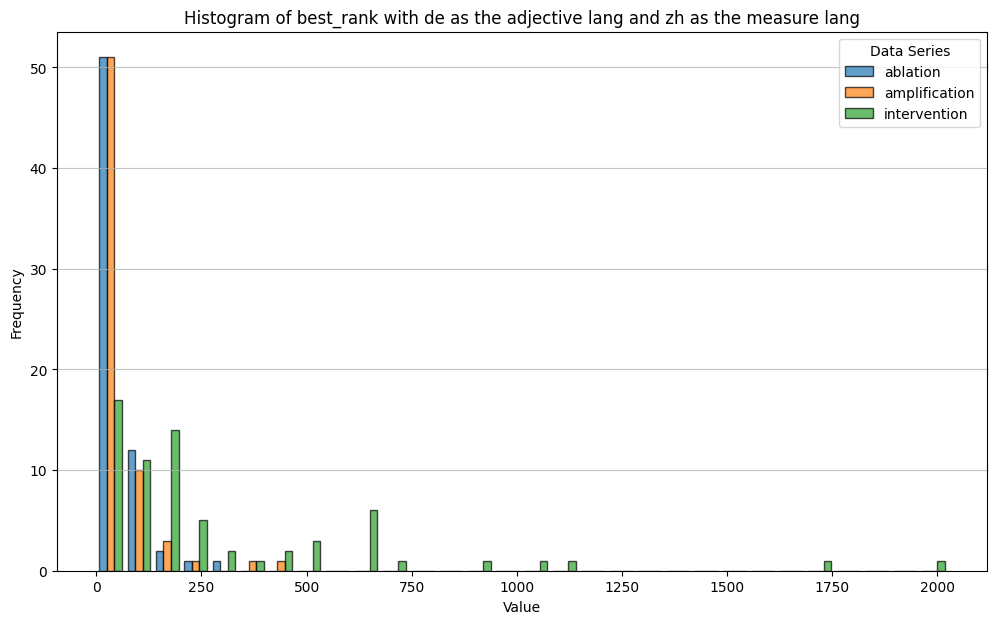

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


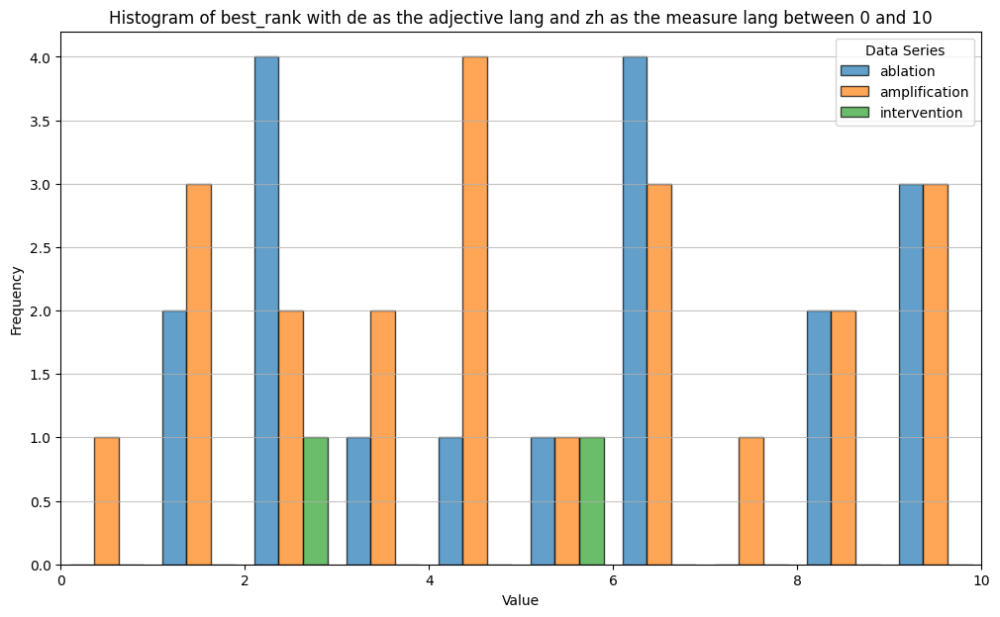

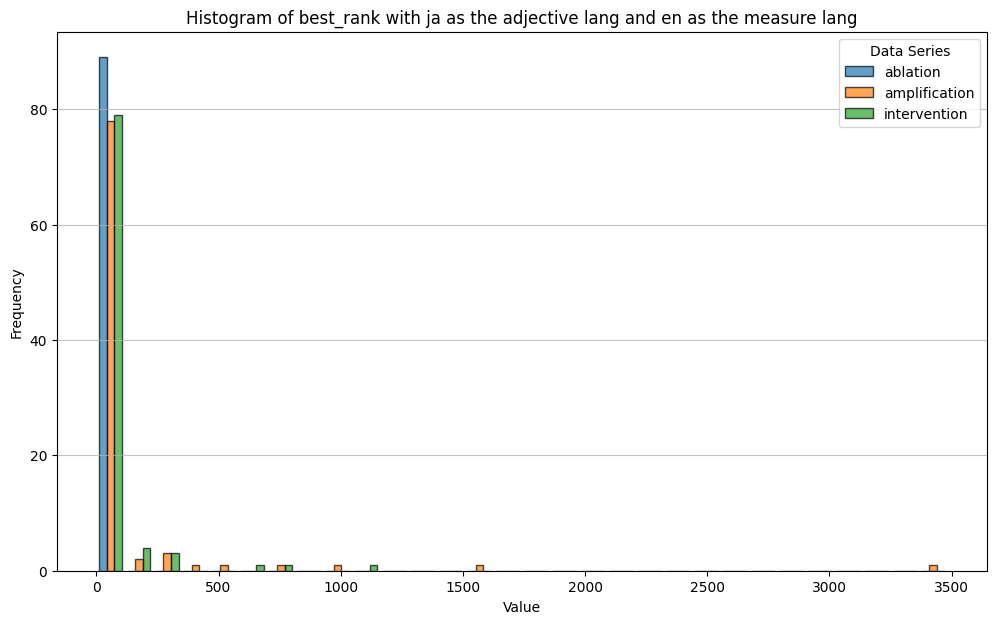

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


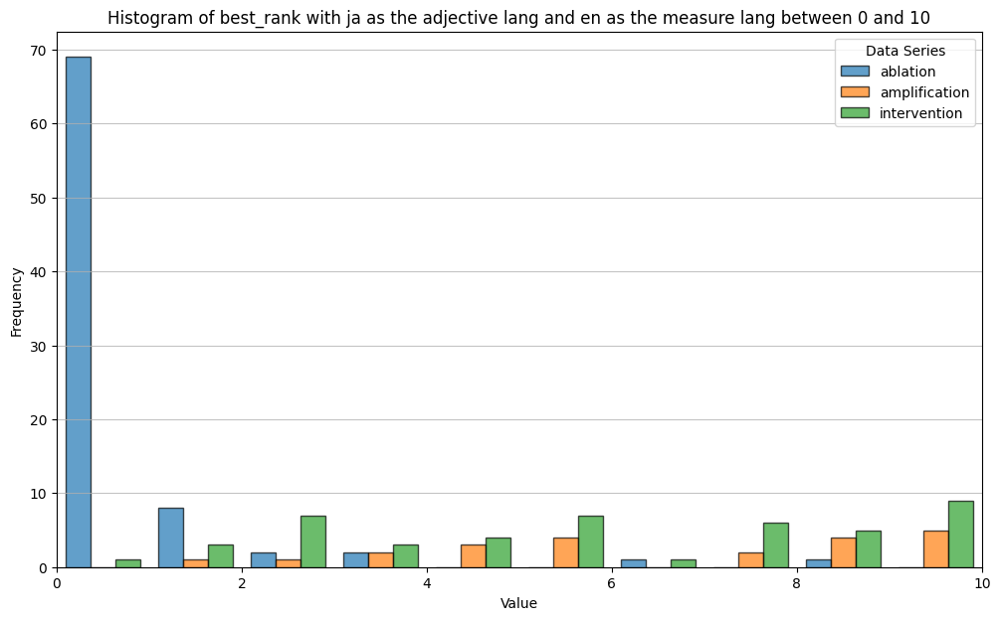

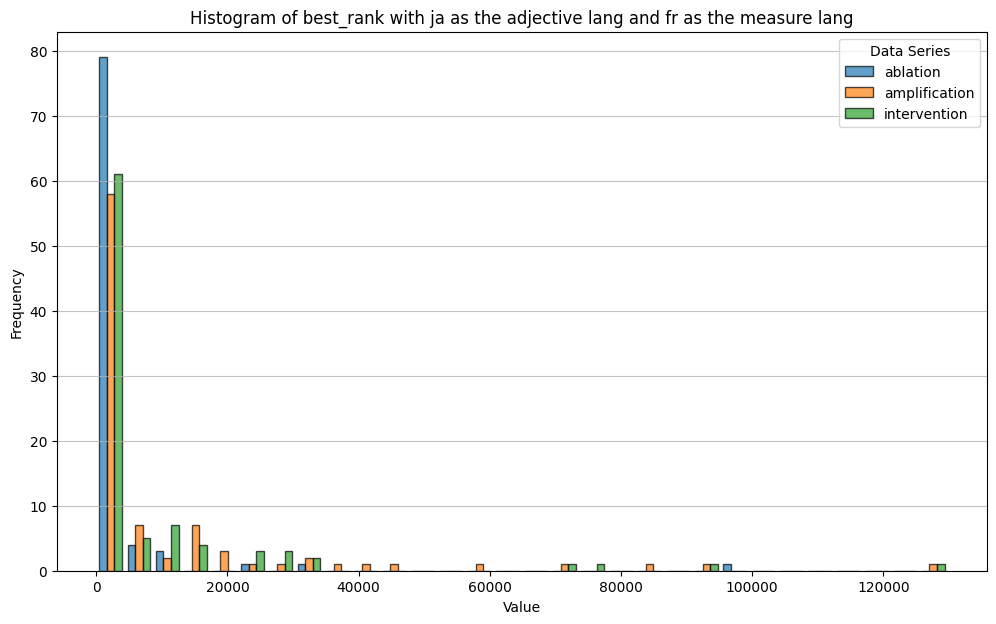

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


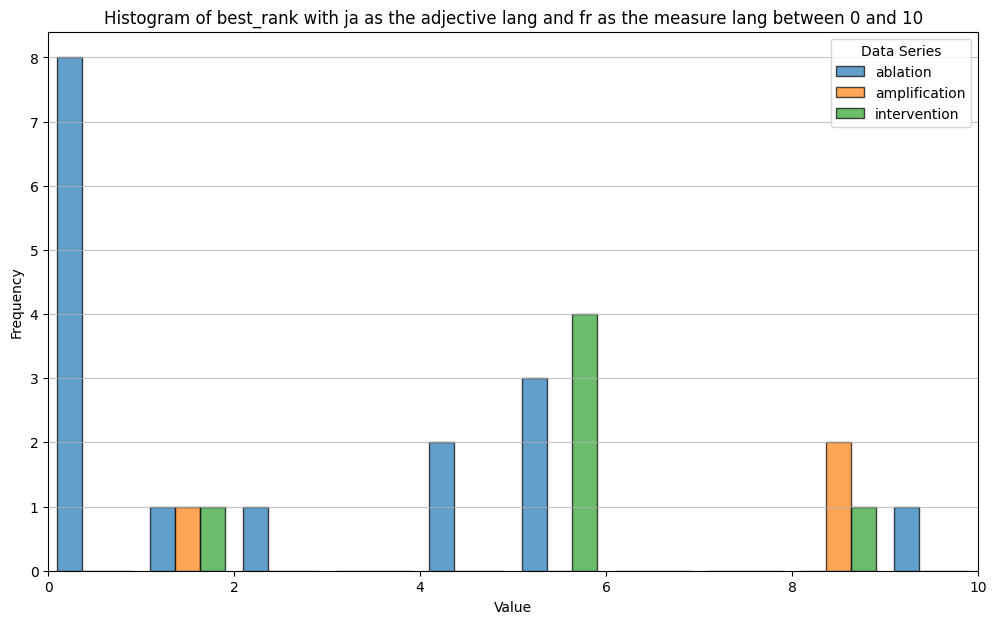

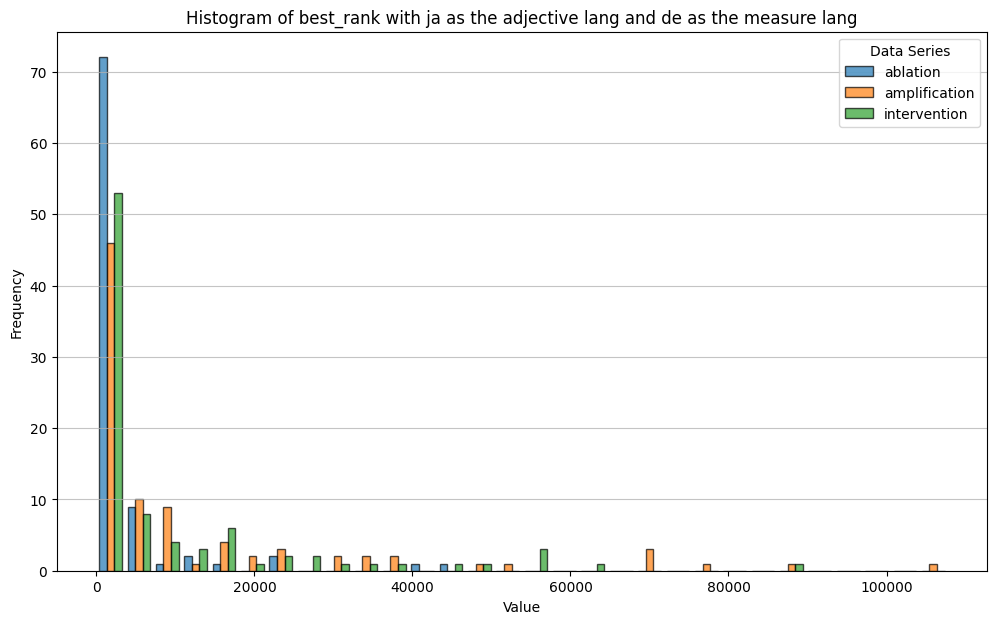

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


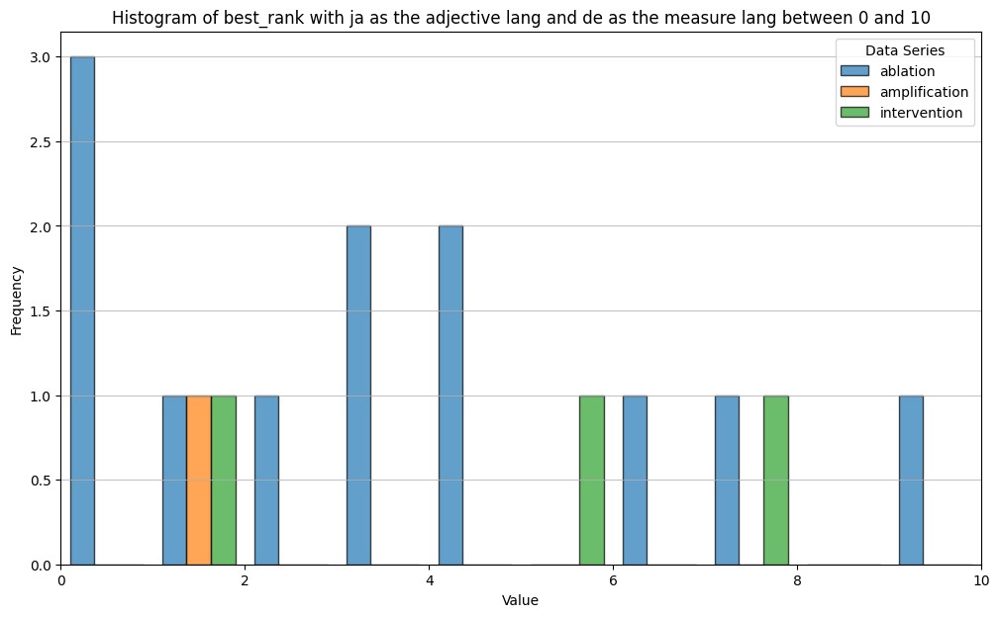

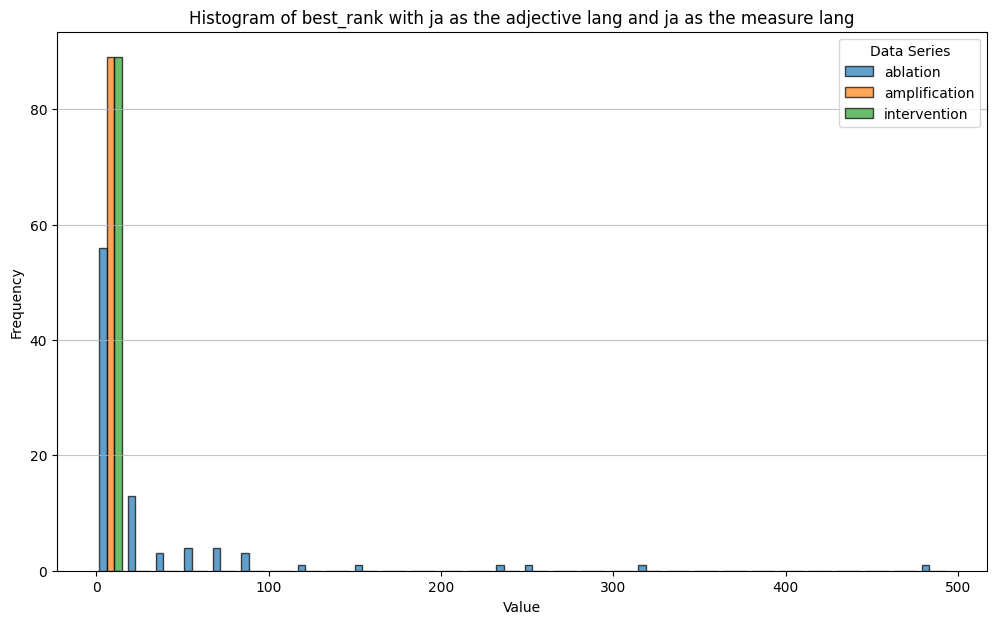

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


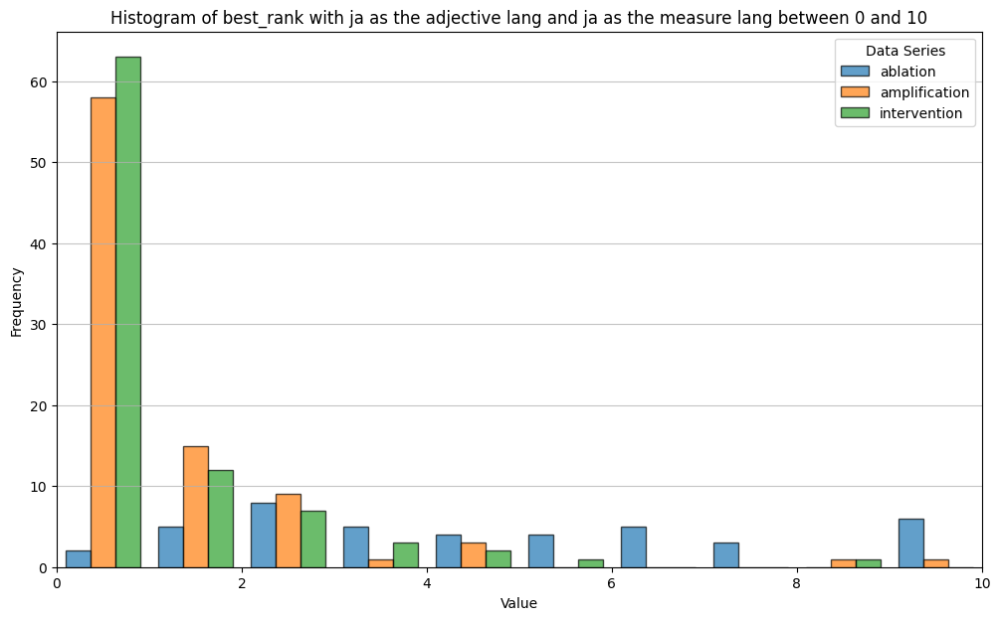

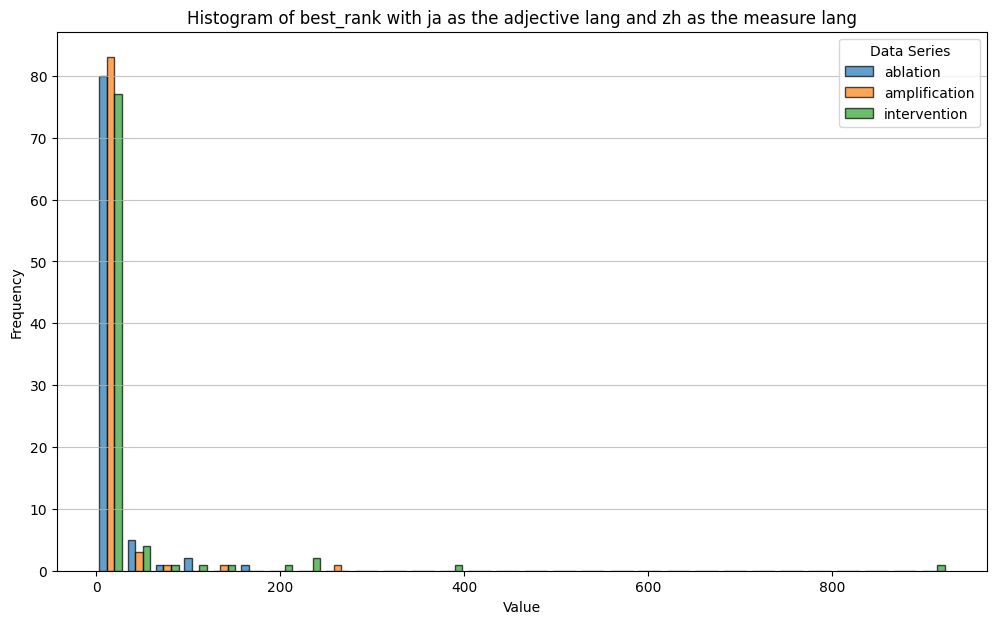

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


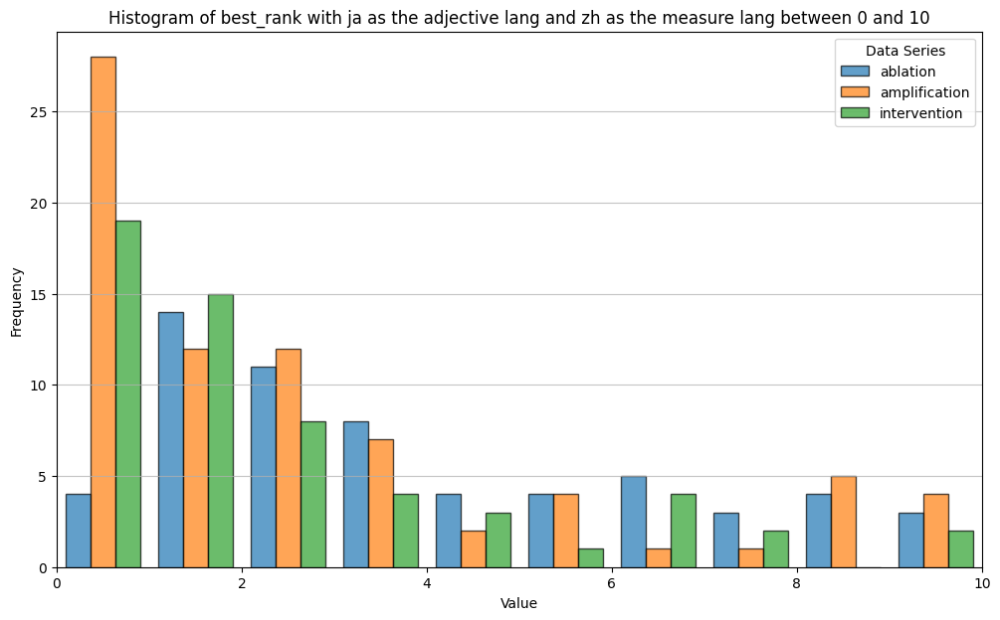

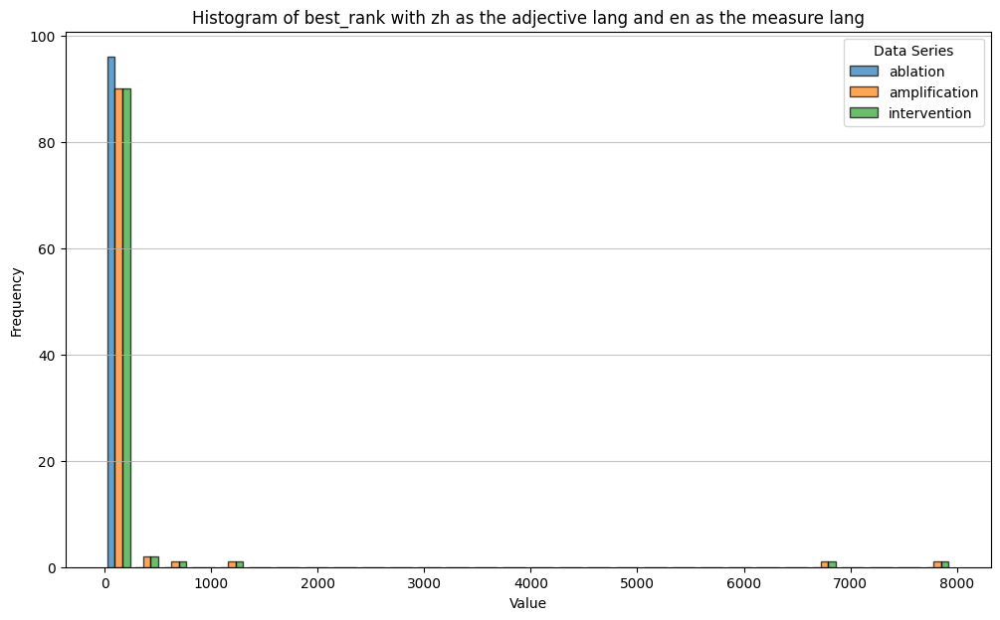

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


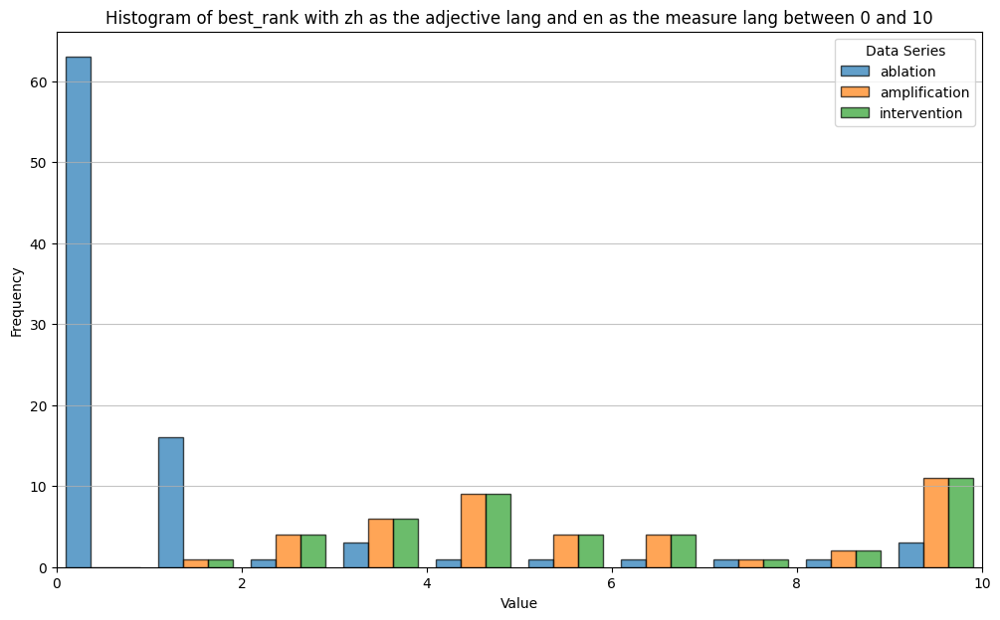

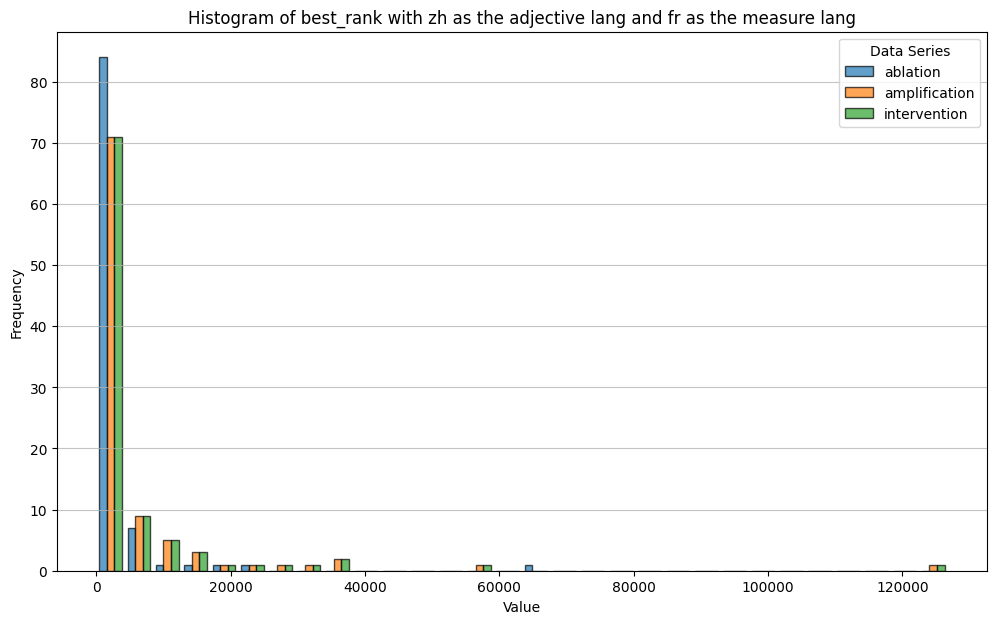

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


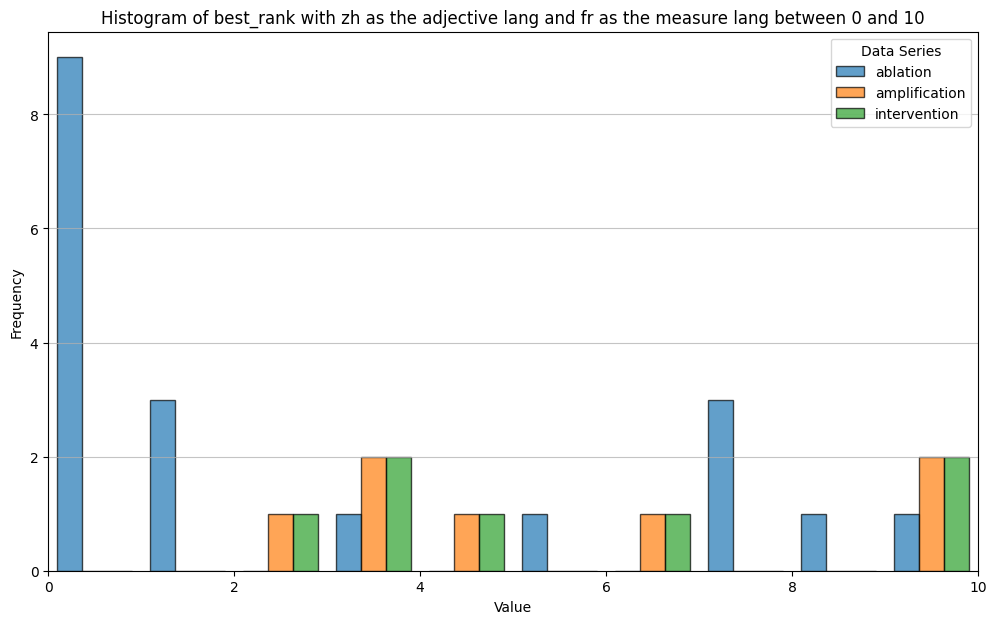

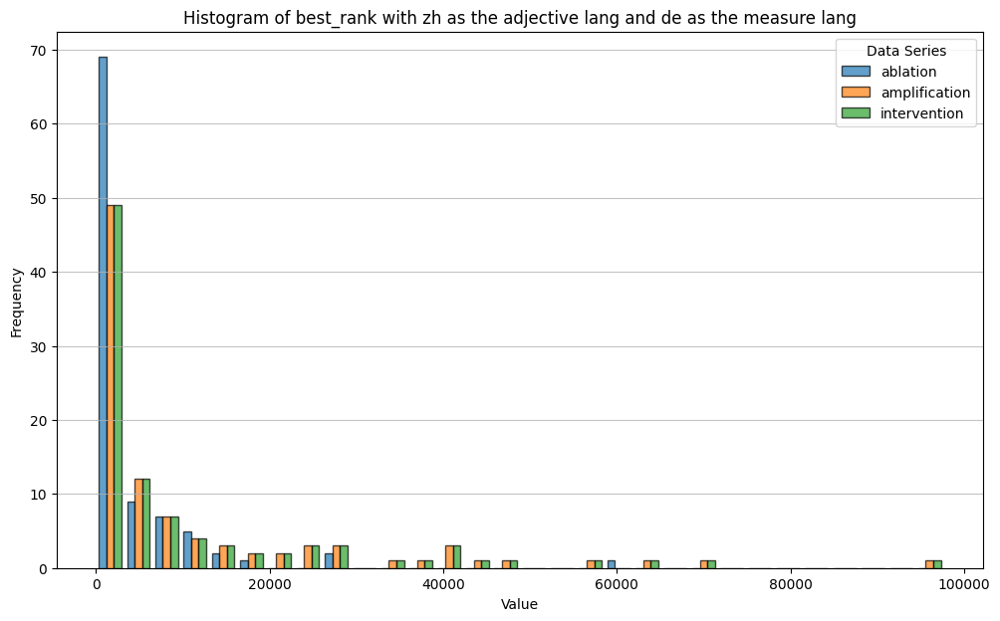

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


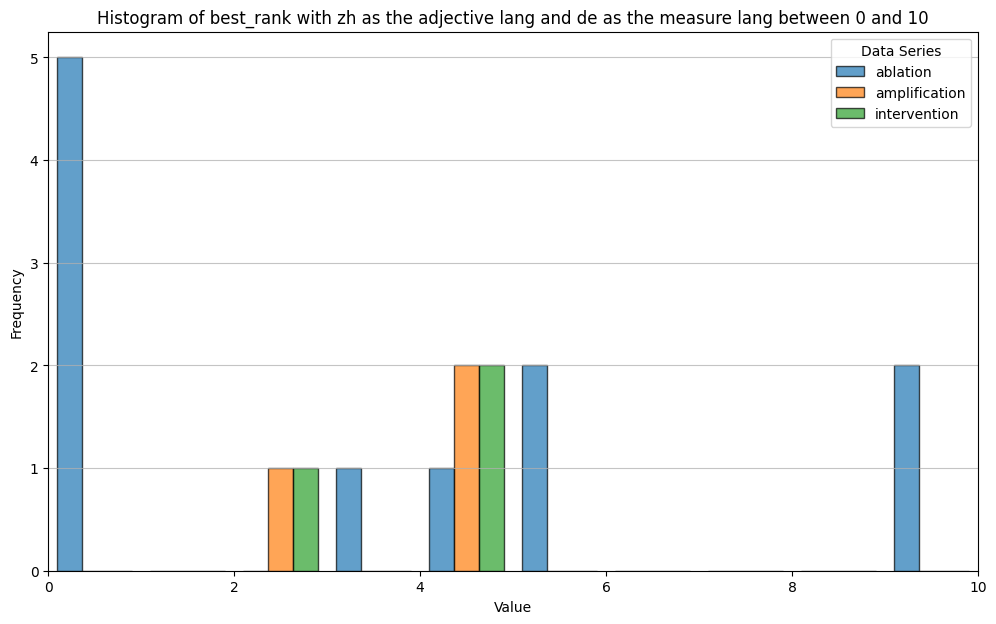

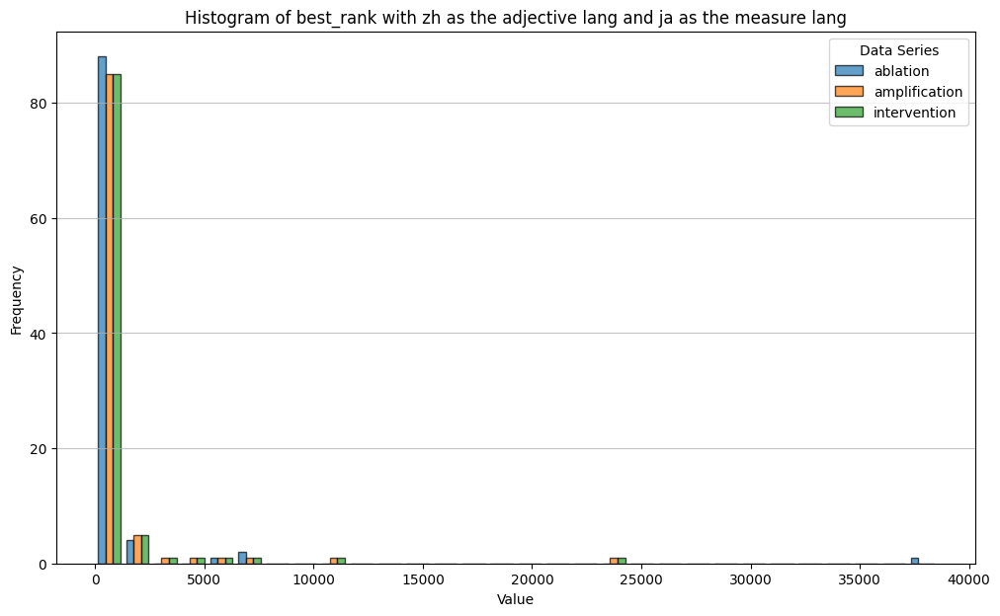

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


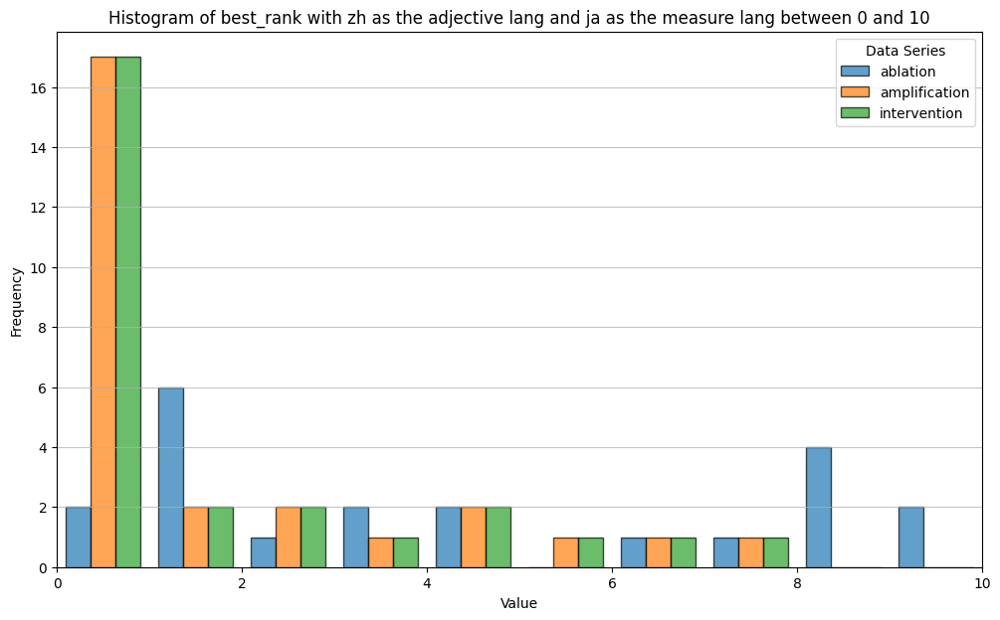

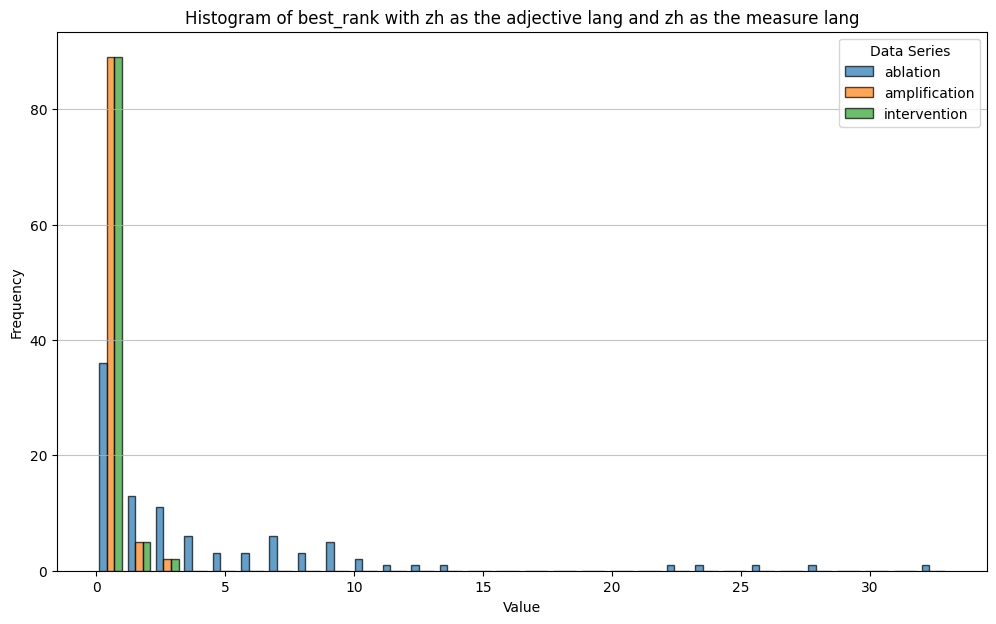

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


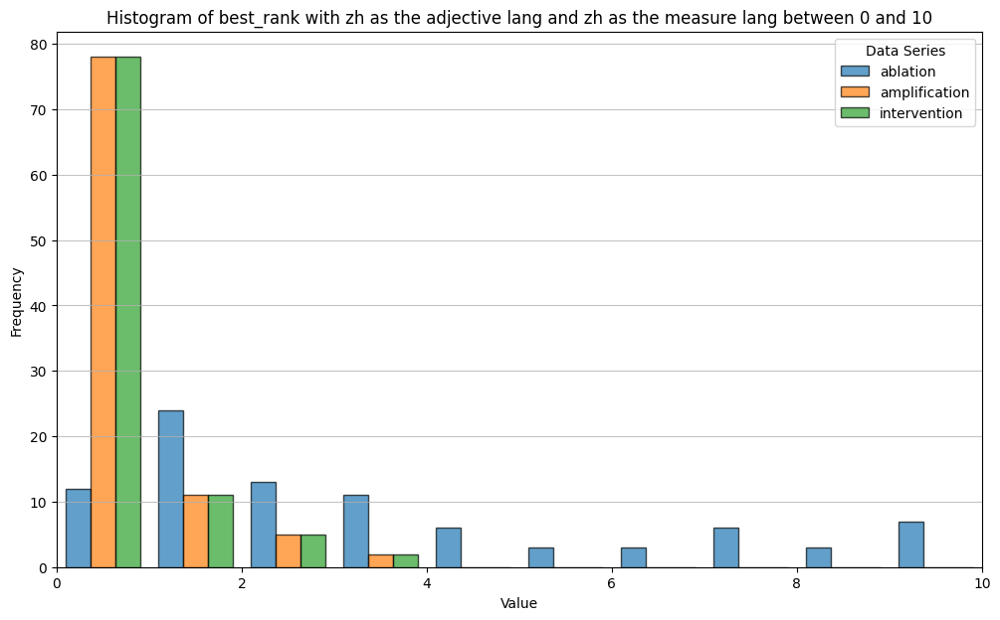

In [57]:
rank_dict = dict()
for lang in langs:
  rank_dict[lang] = dict()
  for lang2 in langs:
    rank_dict[lang][lang2] = dict()

for lang in langs:
  for key, value in combined_dict_n['best_rank'][lang].items():
    for lang2, val in value.items():
      rank_dict[lang][lang2][key] = val

for lang in langs:
  for lang2 in langs:
    title = f"Histogram of best_rank with {lang} as the adjective lang and {lang2} as the measure lang"
    create_multi_series_histogram(rank_dict[lang][lang2], title=title)

### Added Korean and Spanish

"good"的反义词是"
[('bad', 0.703125), ('Bad', 0.051025390625), ('poor', 0.031005859375), ('坏', 0.021240234375), ('差', 0.018798828125), ('BAD', 0.012939453125), ('not', 0.01141357421875), (' bad', 0.01007080078125), ('不好', 0.00885009765625), ('terrible', 0.00885009765625)]
[('bad', 0.28125), ('悪', 0.1923828125), ('悪い', 0.048828125), ('<b>', 0.037841796875), ('пло', 0.026123046875), ('f', 0.01483154296875), ('差', 0.01483154296875), ('<strong>', 0.01483154296875), ('et', 0.0123291015625), ('un', 0.0123291015625)]
Logit difference of "bad" to "bad": old 0.0, new 0.0, diff 0.0
Logit difference of "mauvais" to "bad": old -11.625, new -4.875, diff 6.75
Logit difference of "schlecht" to "bad": old -14.9375, new -6.8125, diff 8.125
Logit difference of "坏" to "bad": old -3.5, new -6.0625, diff -2.5625
Logit difference of "悪い" to "bad": old -8.25, new -1.75, diff 6.5
Logit difference of "malo" to "bad": old -9.6875, new -10.5, diff -0.8125
Logit difference of "나쁜" to "bad": old -13.25, new -17.75, dif

/tmp/ipykernel_1812624/2126995624.py:95: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab10', num_inter_keys)


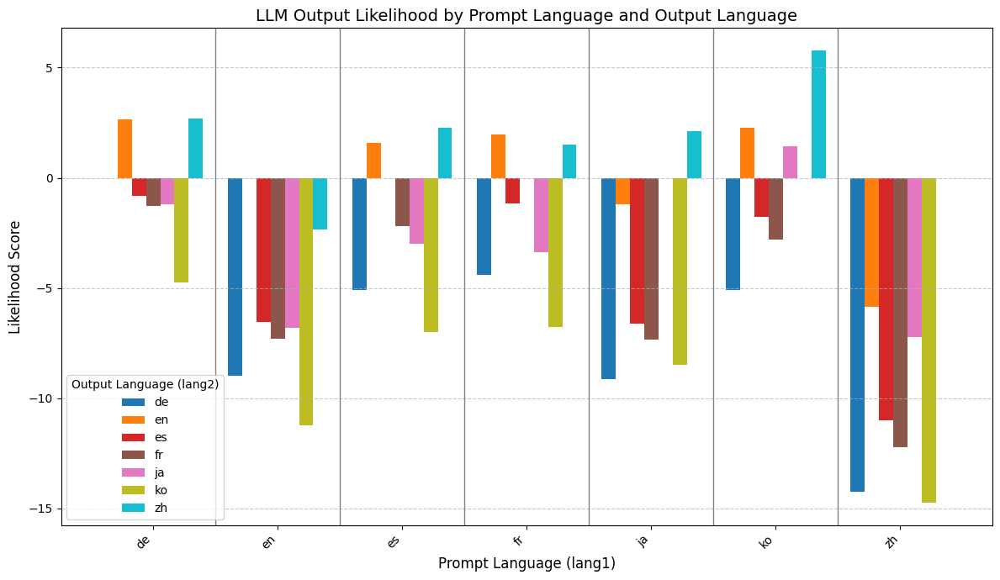

/tmp/ipykernel_1812624/2126995624.py:141: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors =cm.get_cmap('tab10', num_output_languages)


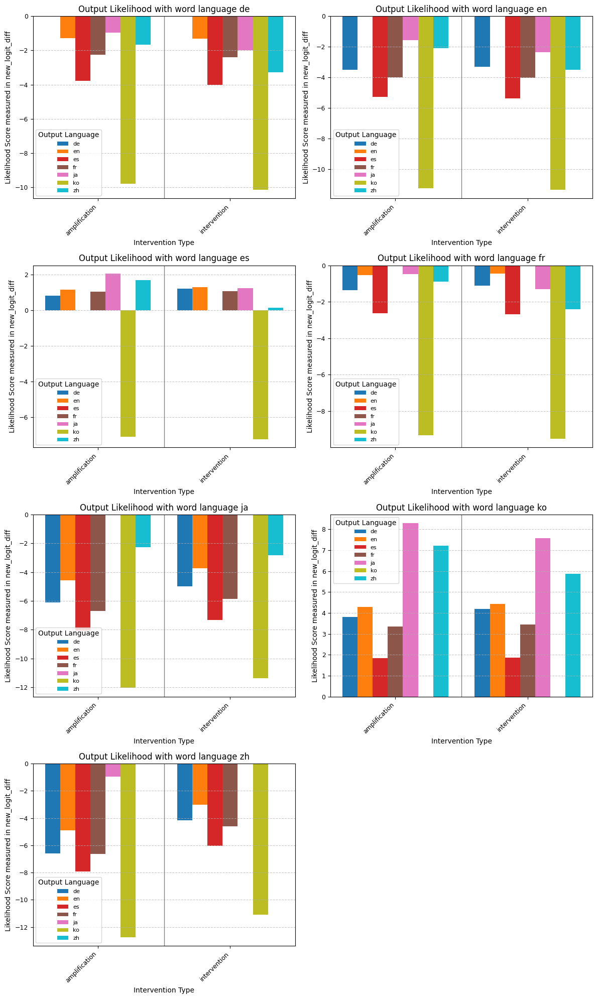

/tmp/ipykernel_1812624/2126995624.py:141: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors =cm.get_cmap('tab10', num_output_languages)


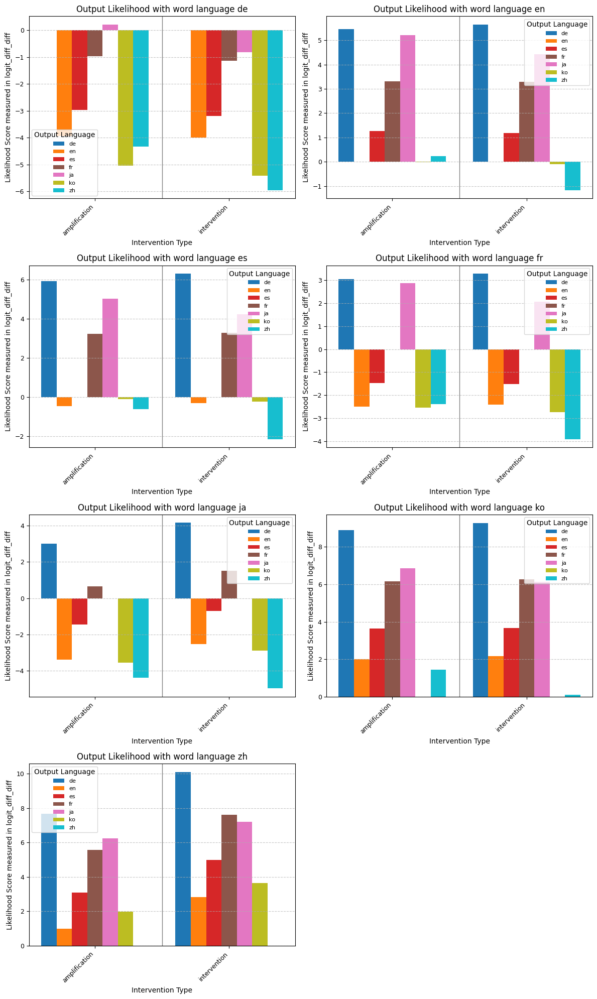

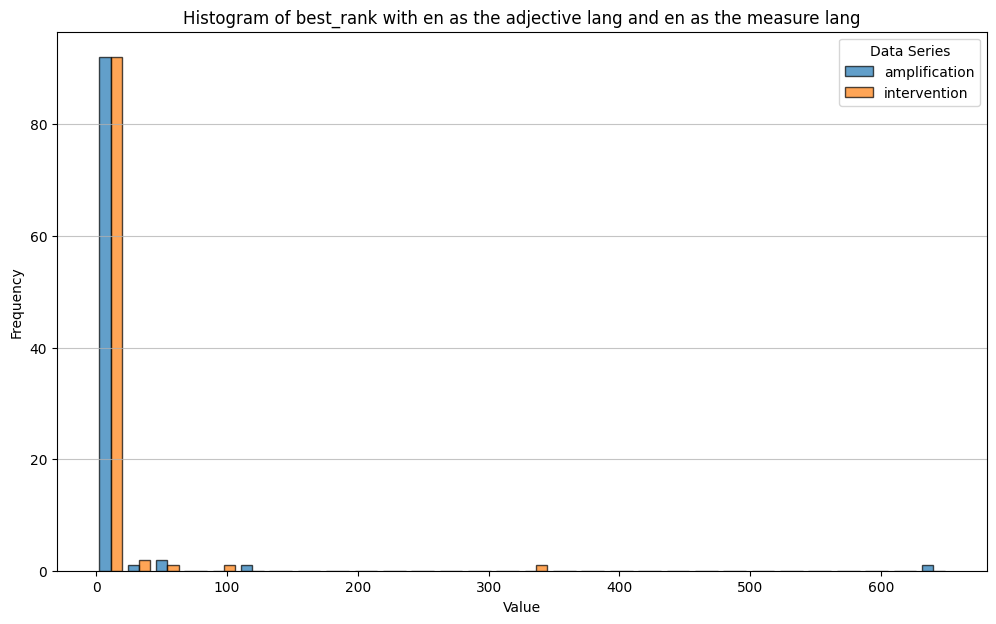

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


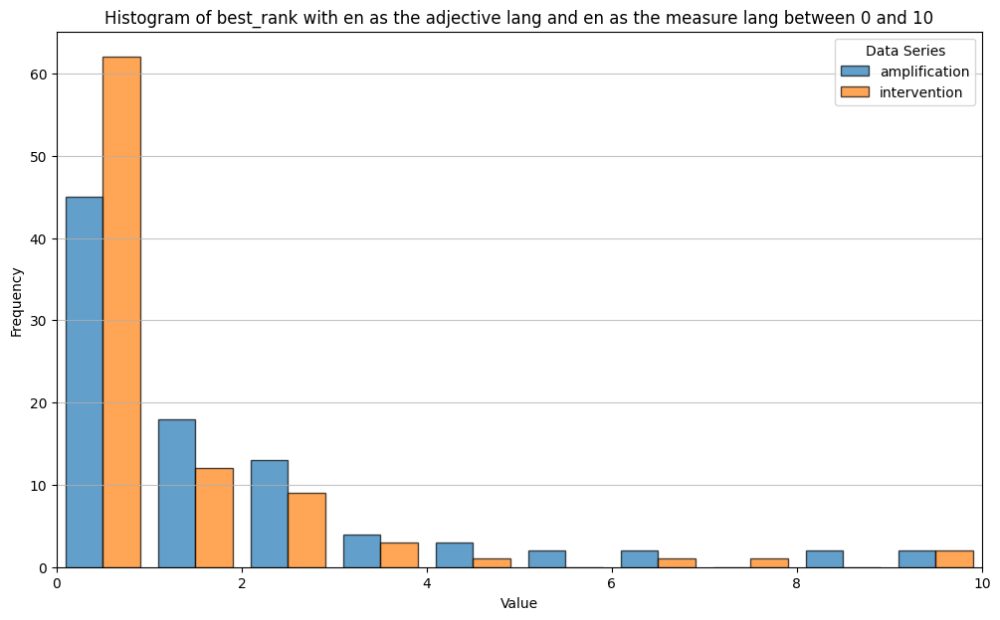

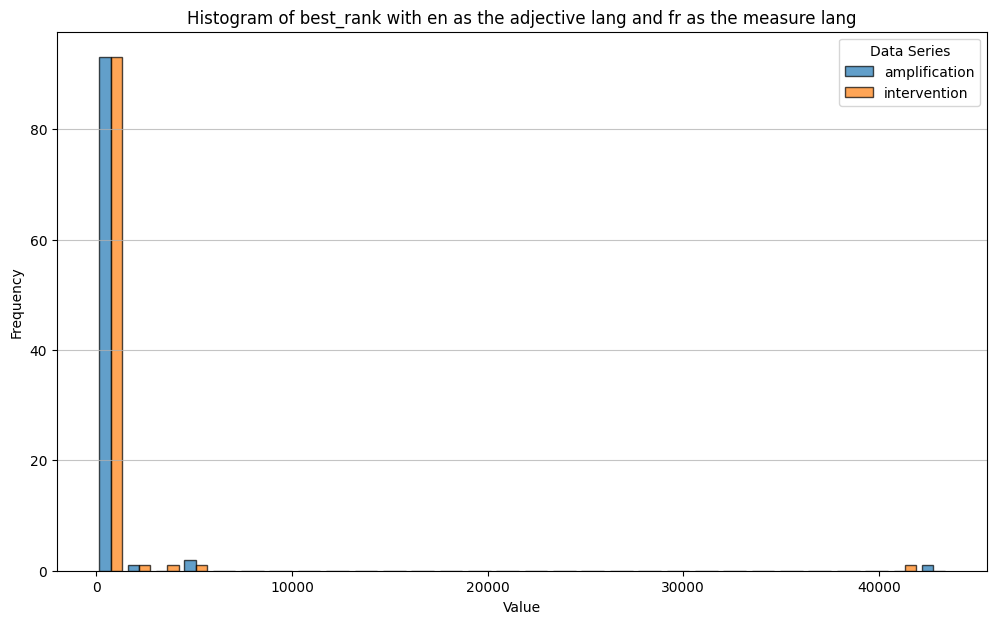

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


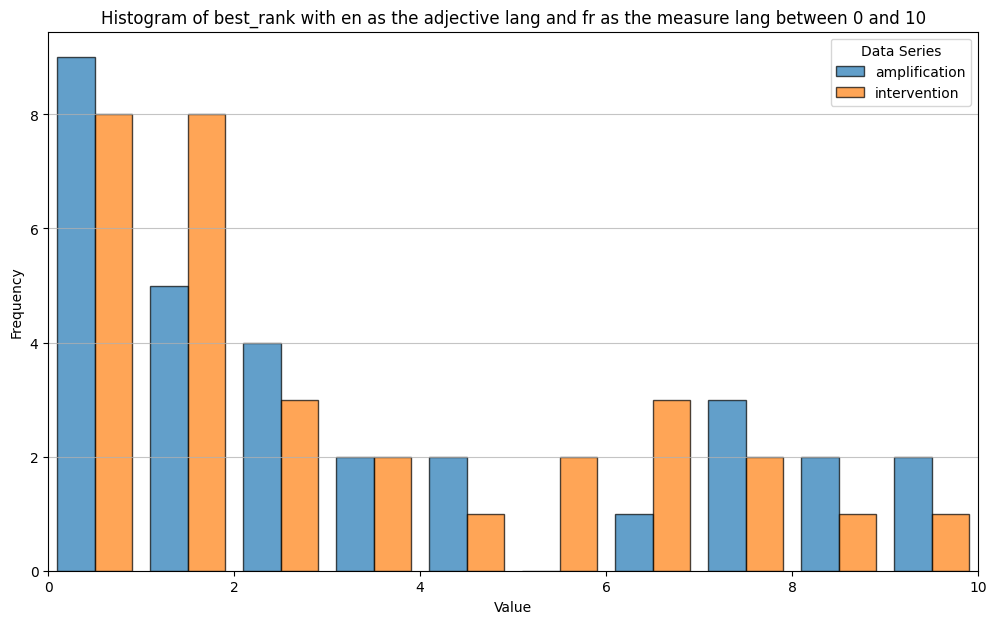

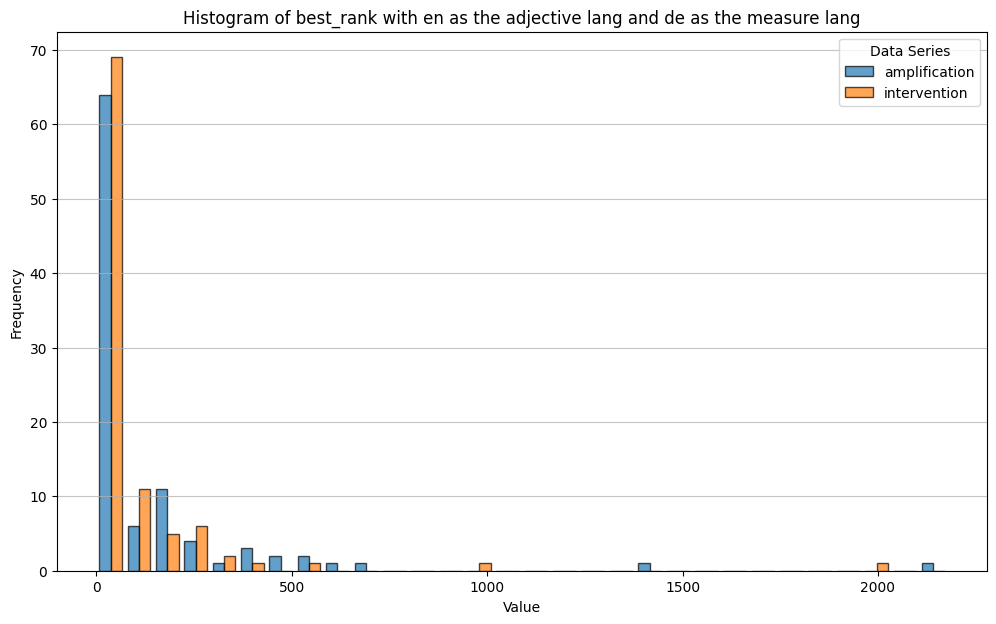

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


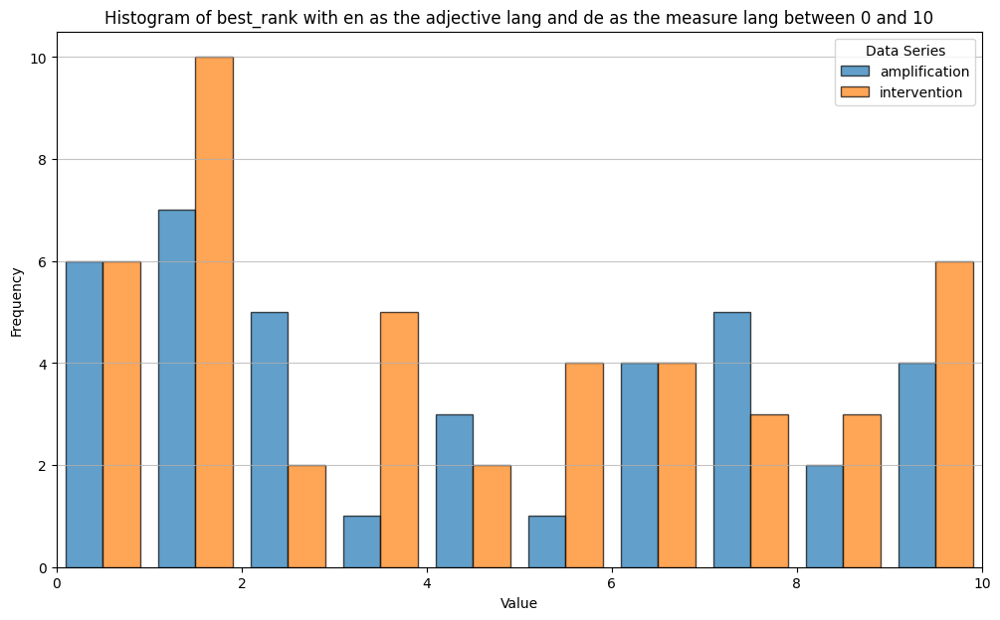

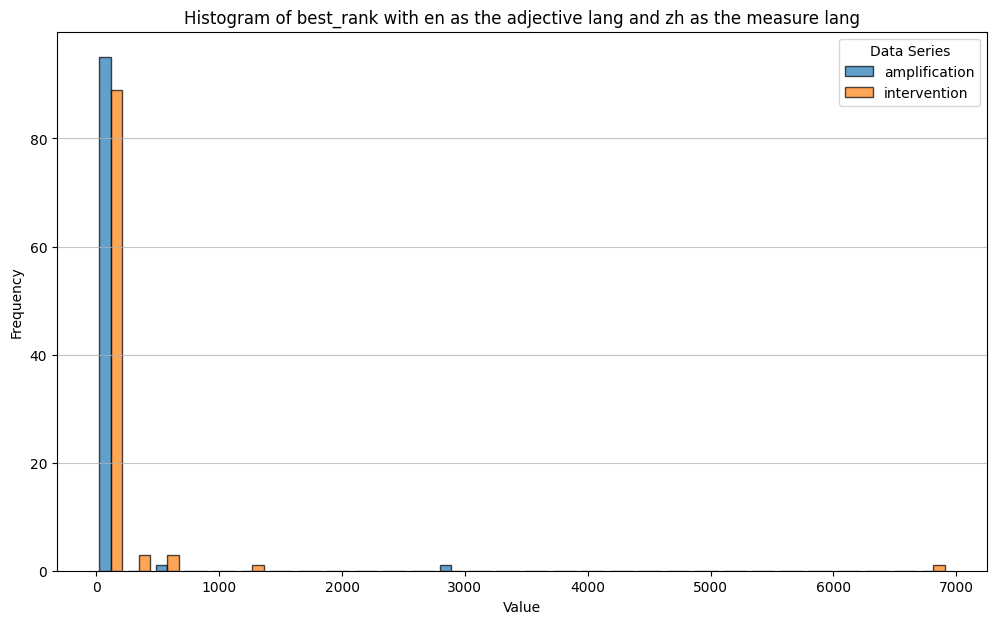

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


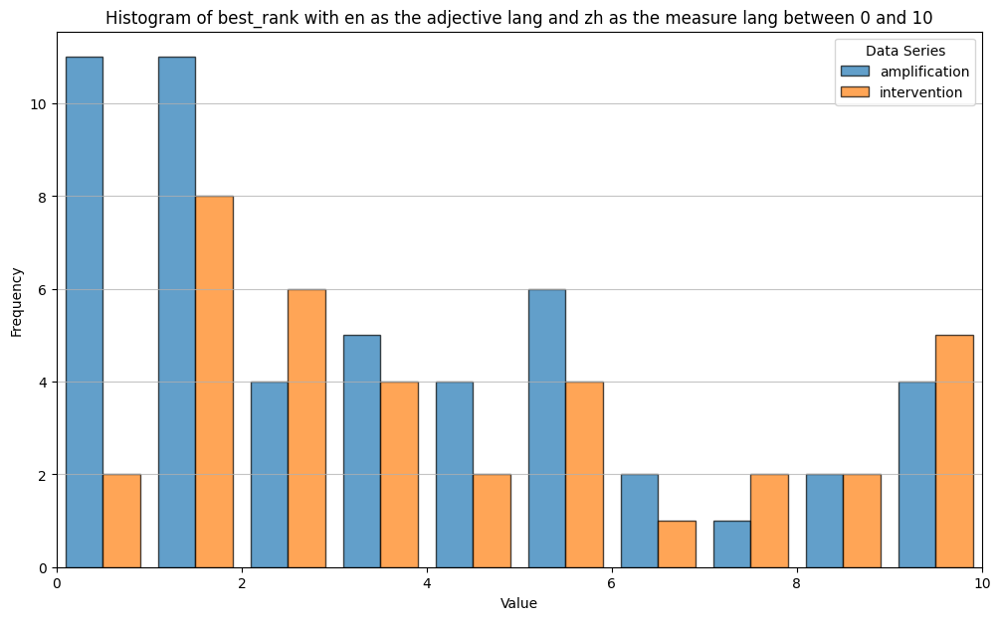

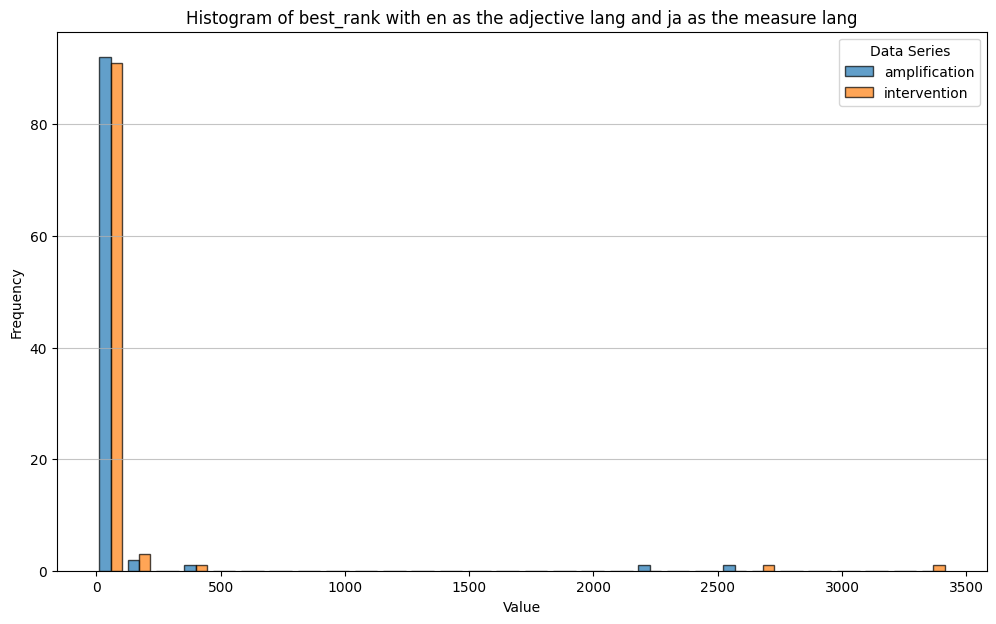

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


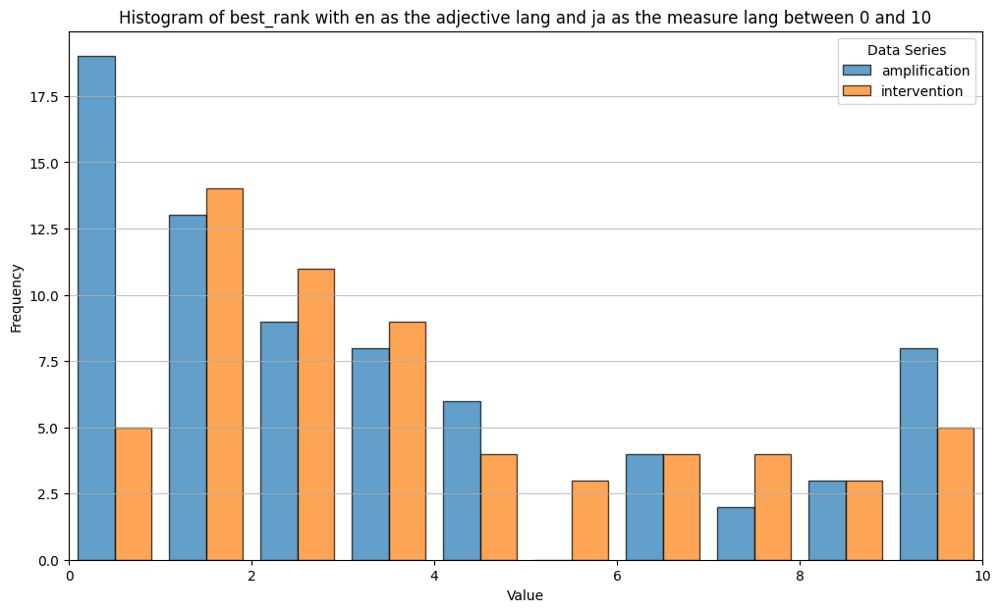

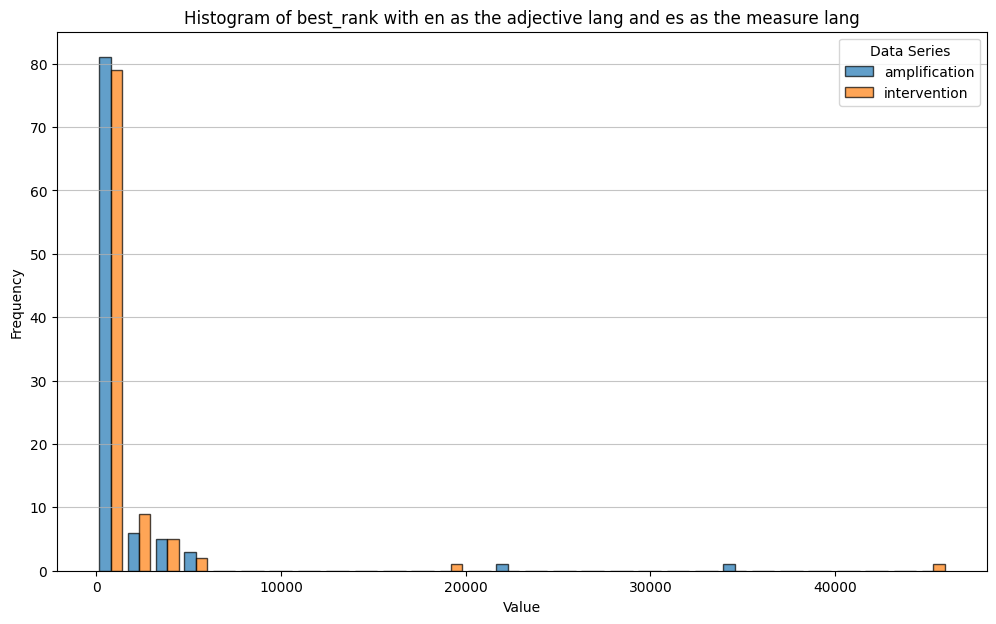

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


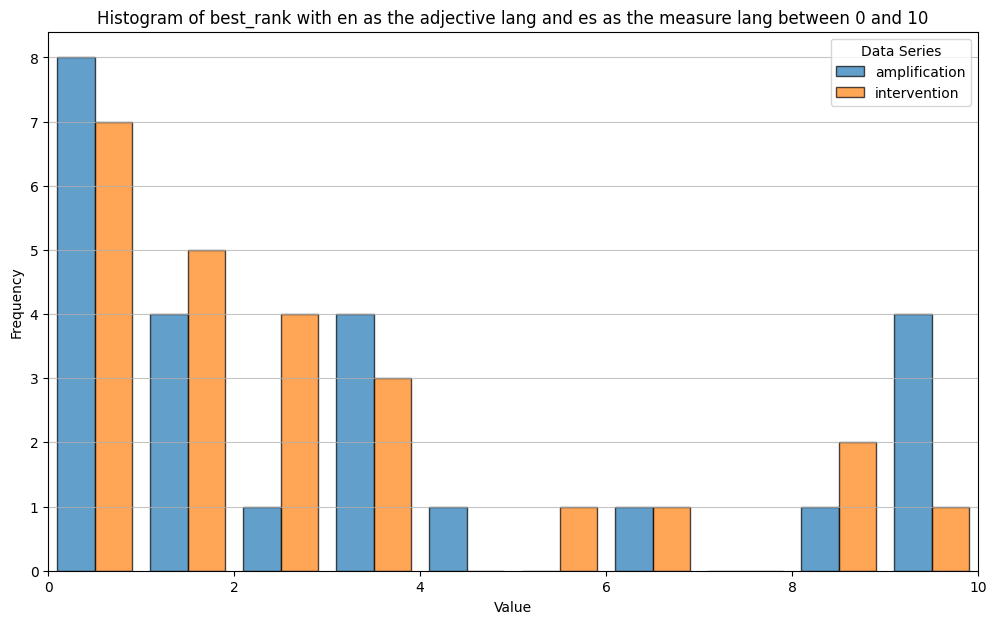

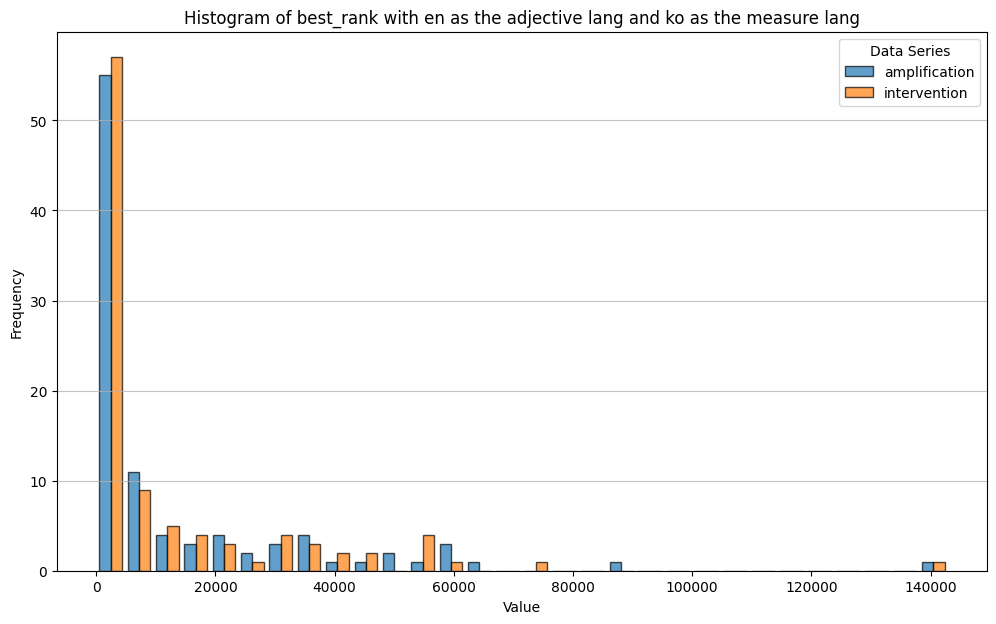

Series 'amplification' has no data points within the 0-10 range and will not be plotted.
Series 'intervention' has no data points within the 0-10 range and will not be plotted.
No valid data points to plot from any series within the 0-10 range.


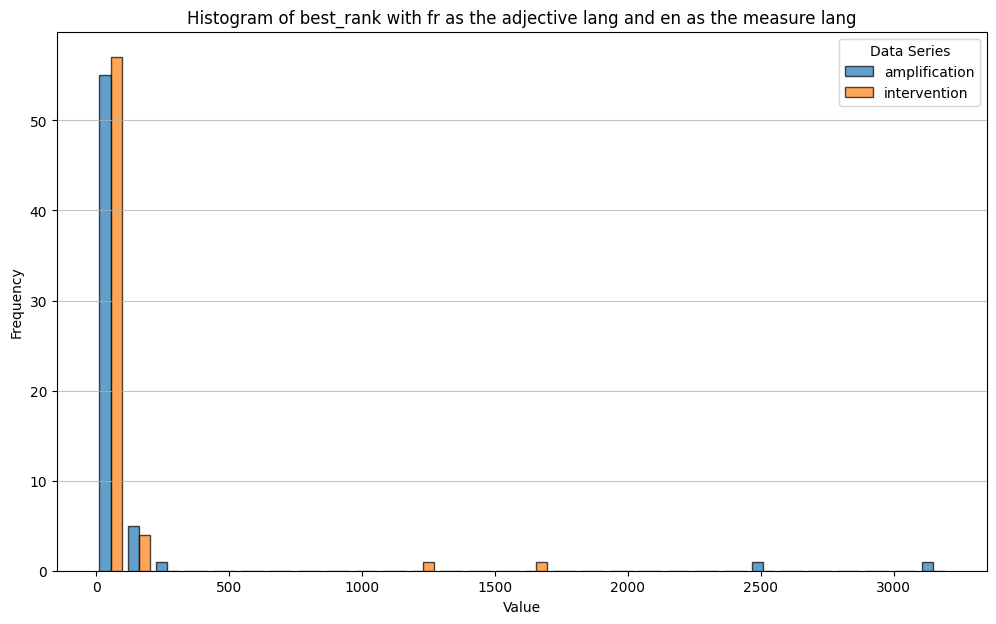

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


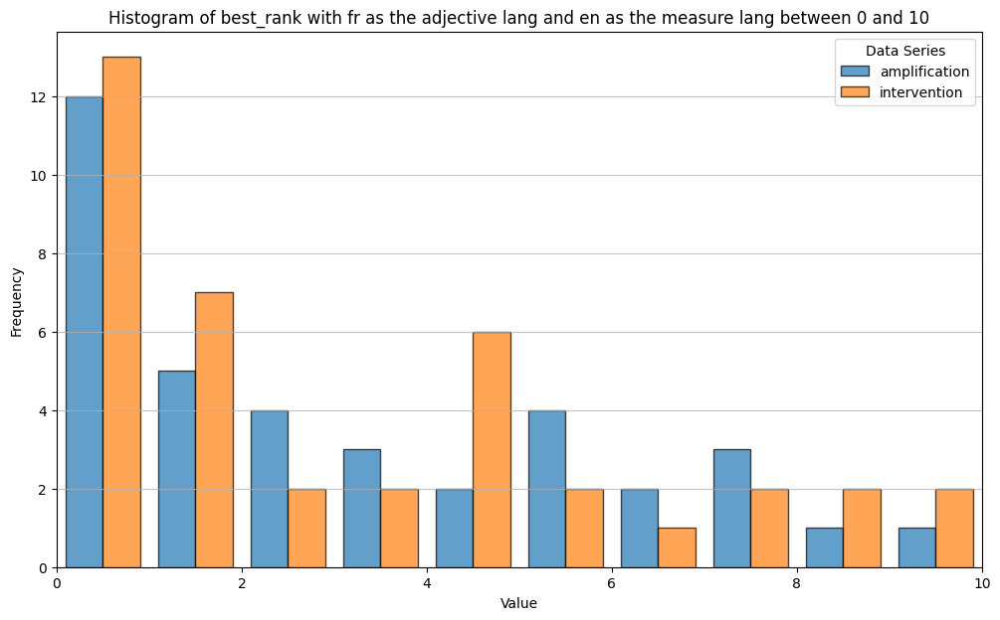

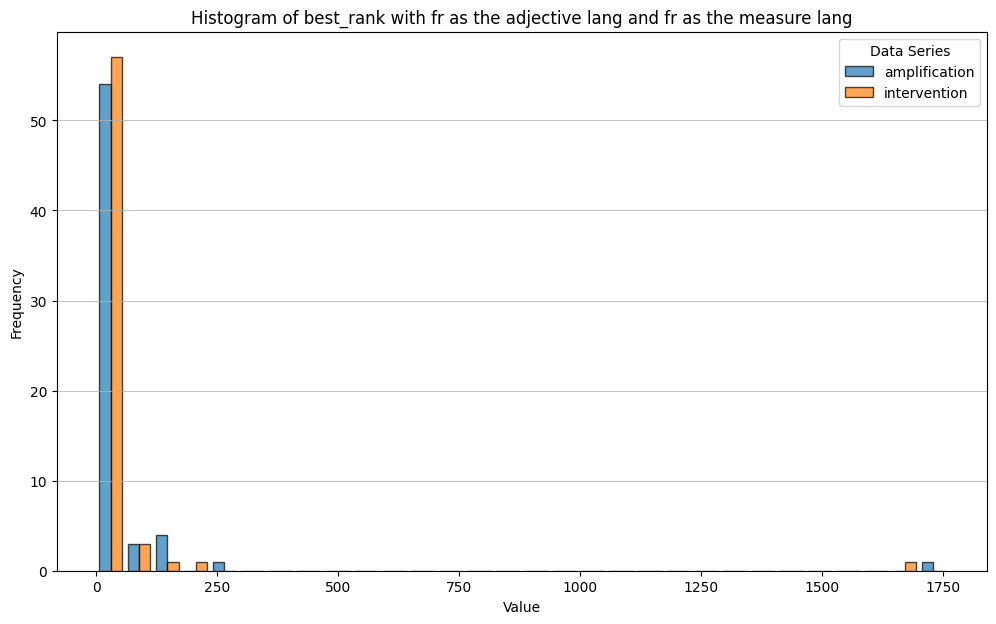

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


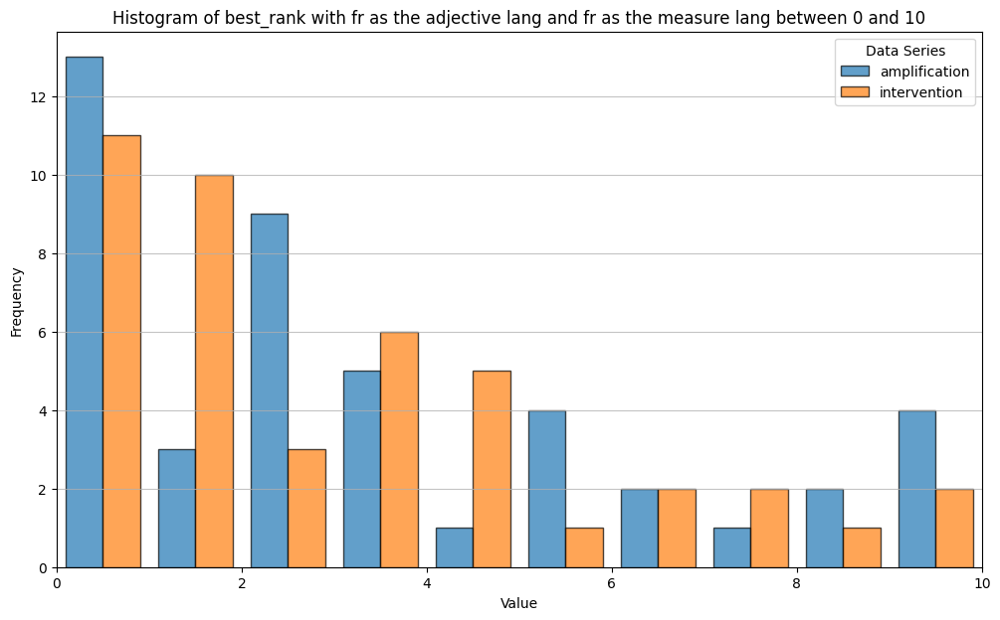

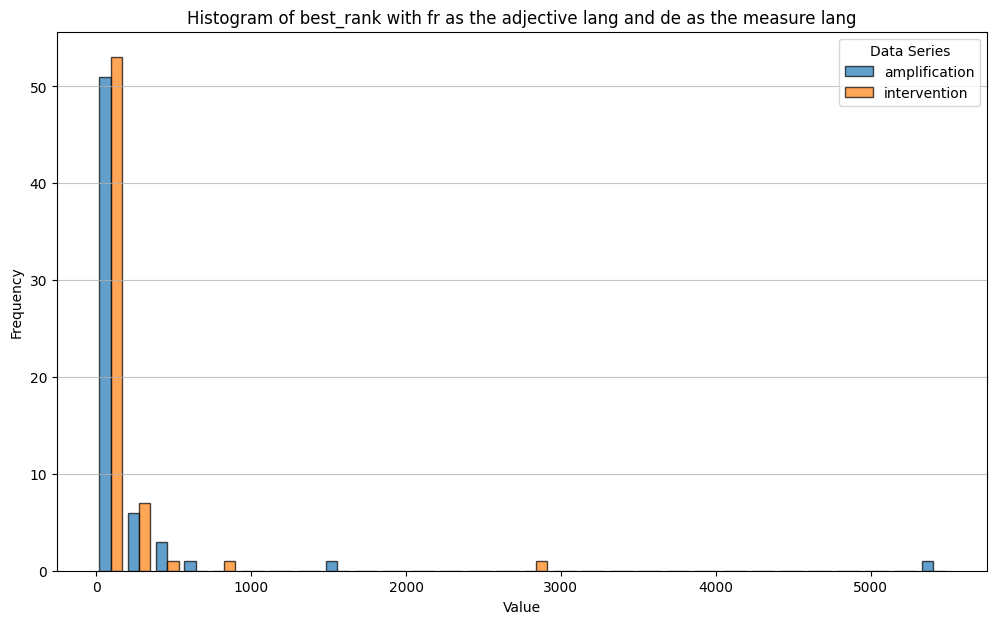

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


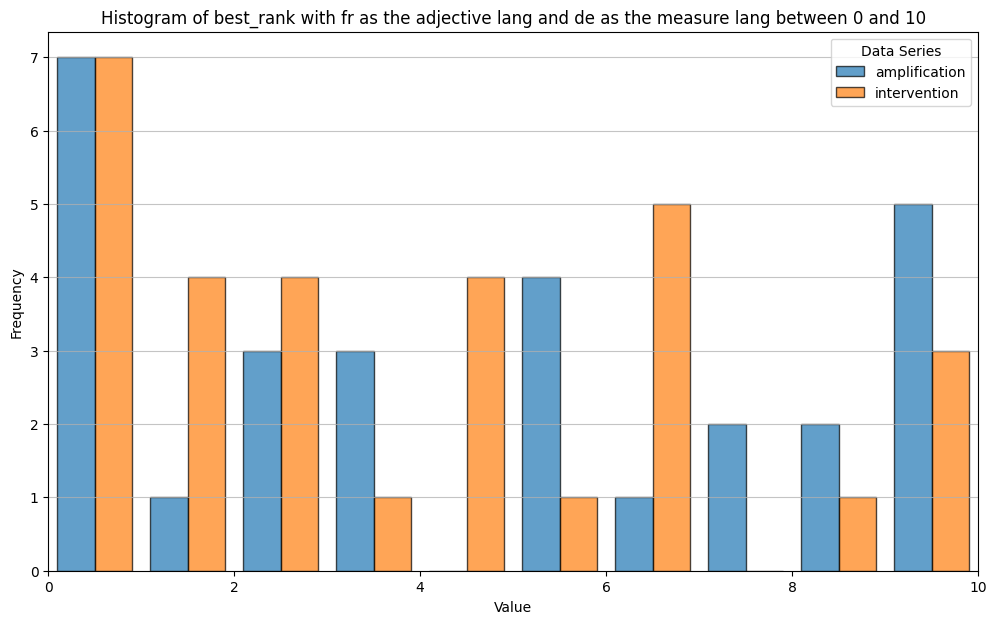

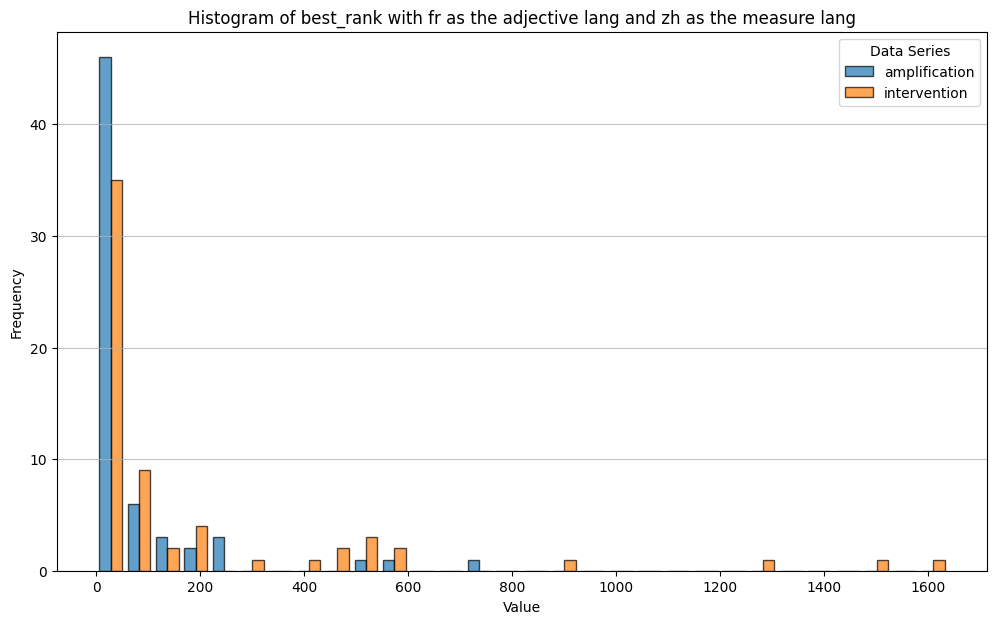

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


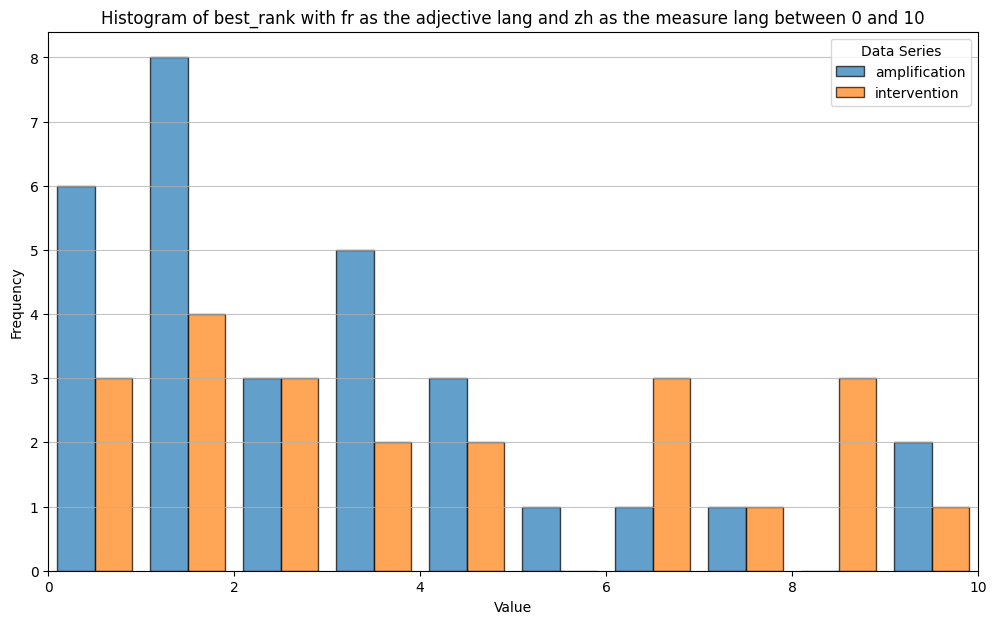

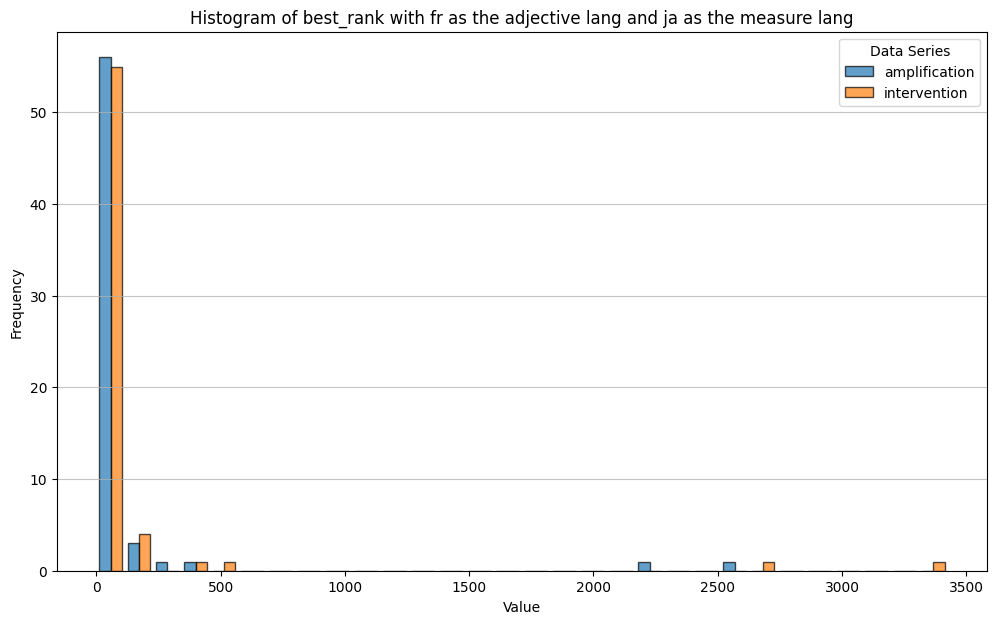

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


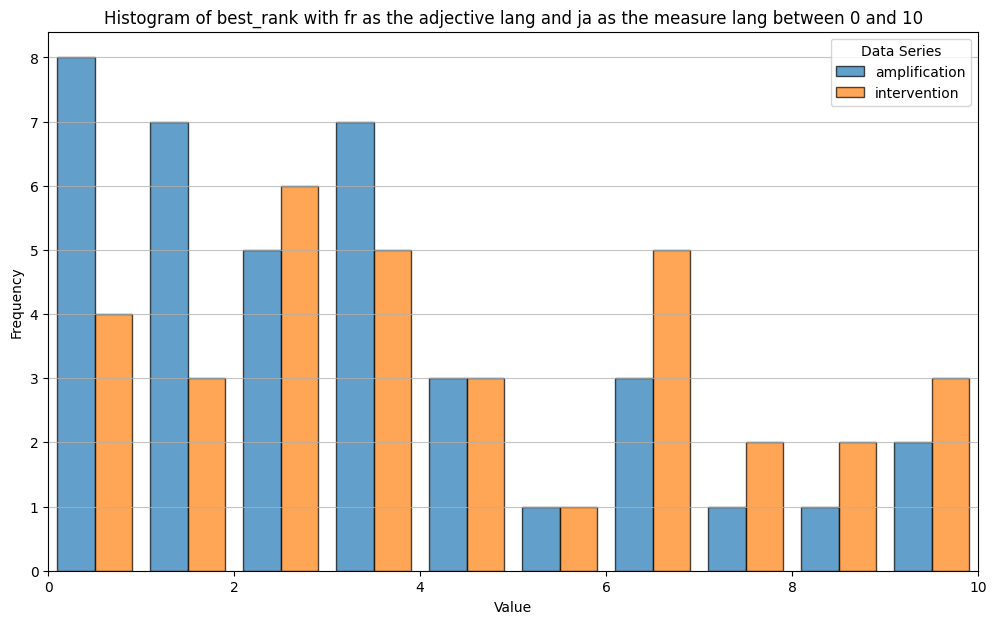

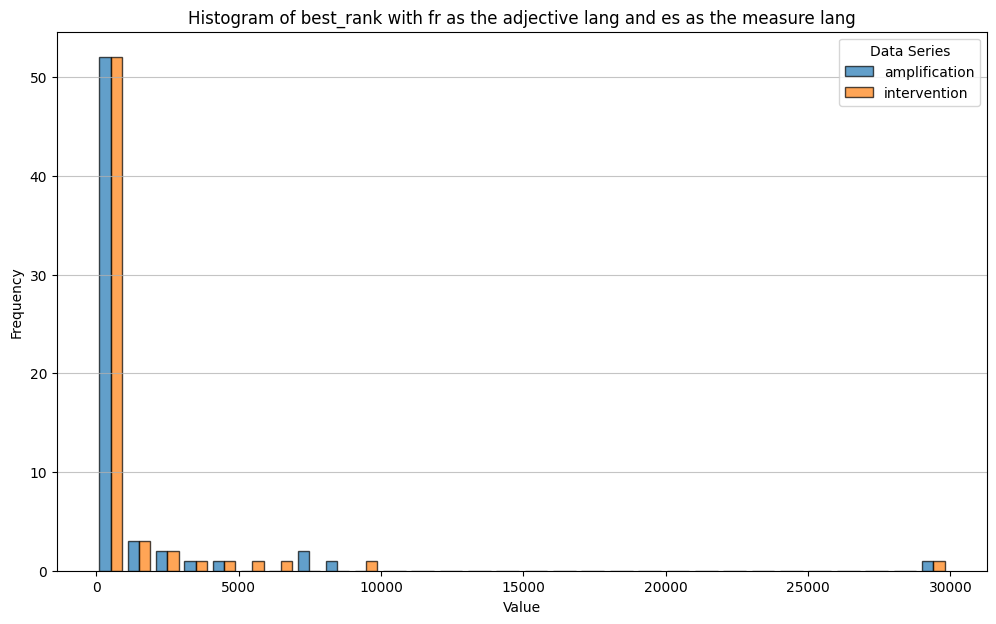

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


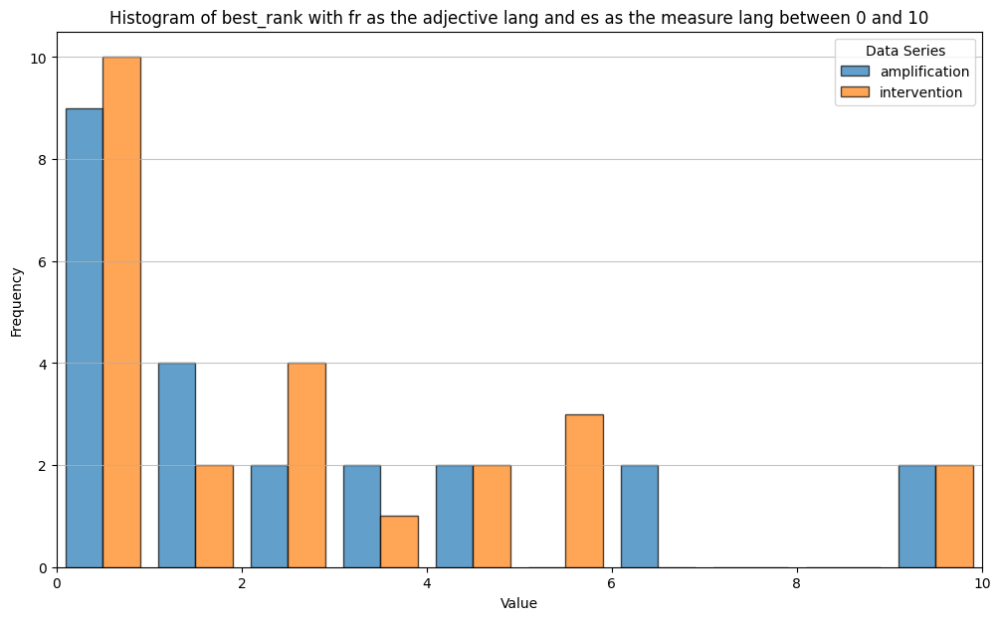

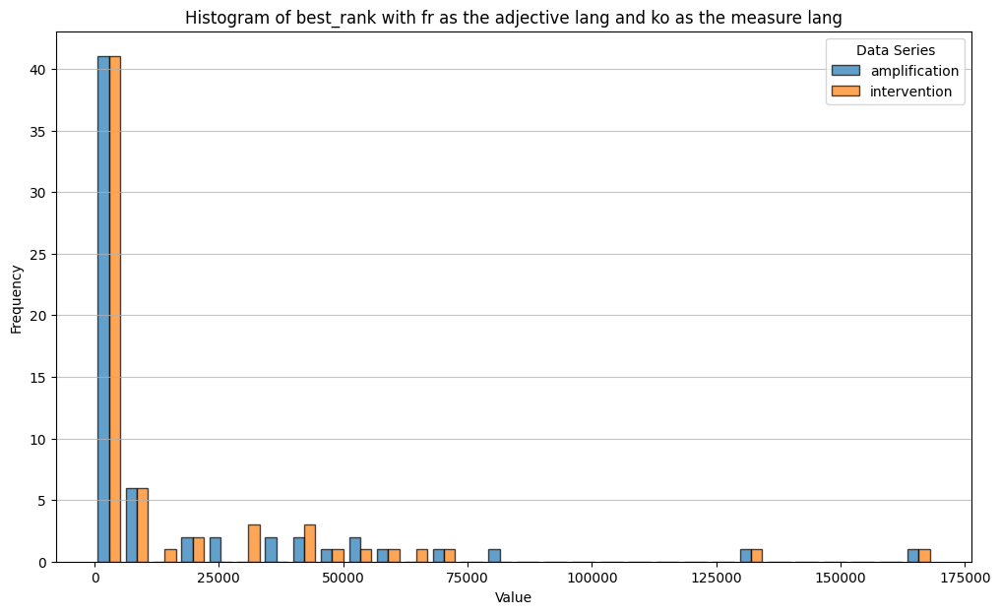

Series 'amplification' has no data points within the 0-10 range and will not be plotted.
Series 'intervention' has no data points within the 0-10 range and will not be plotted.
No valid data points to plot from any series within the 0-10 range.


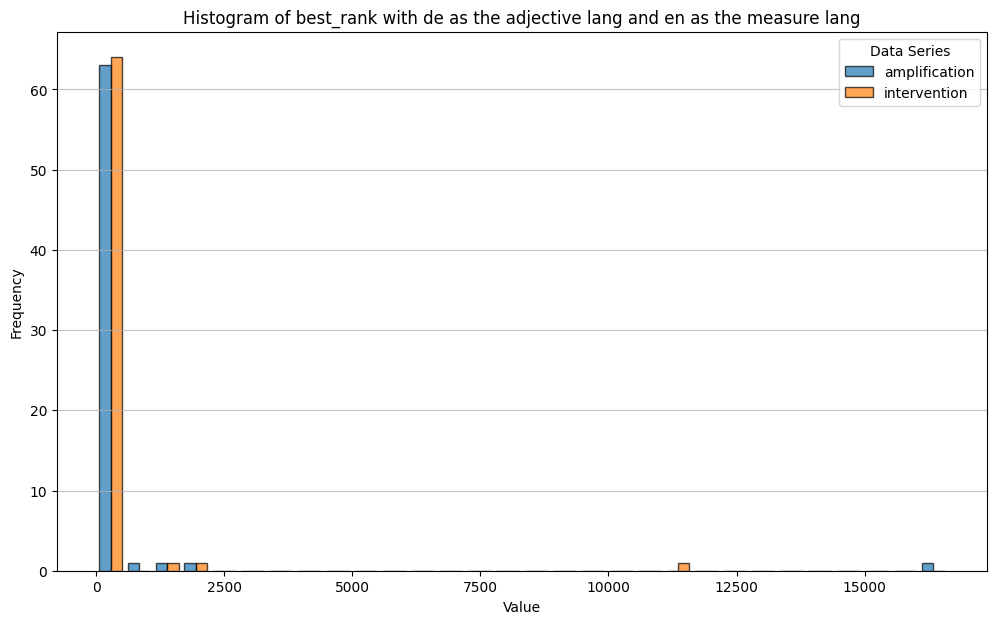

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


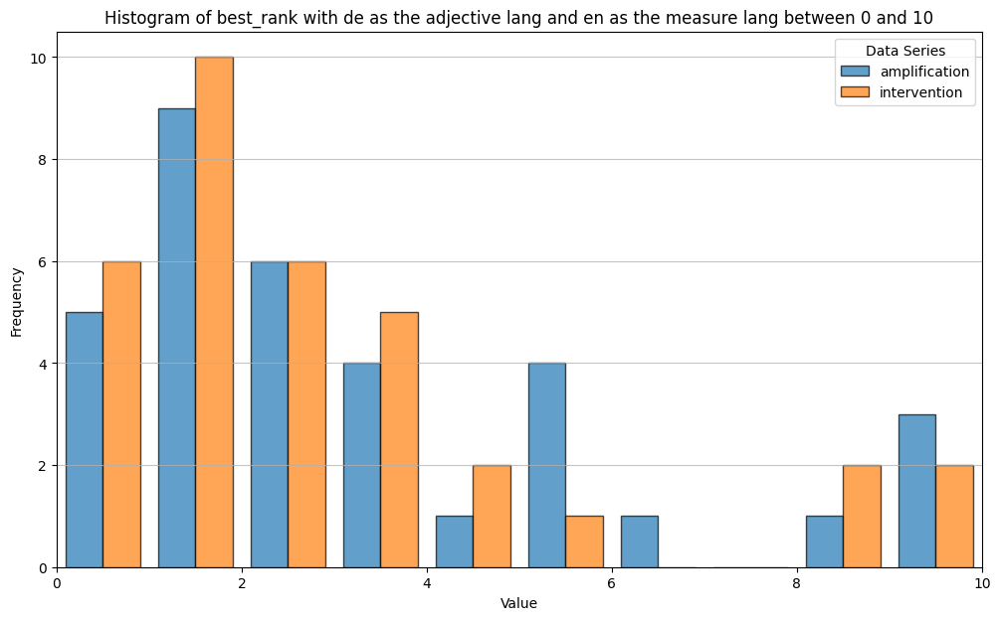

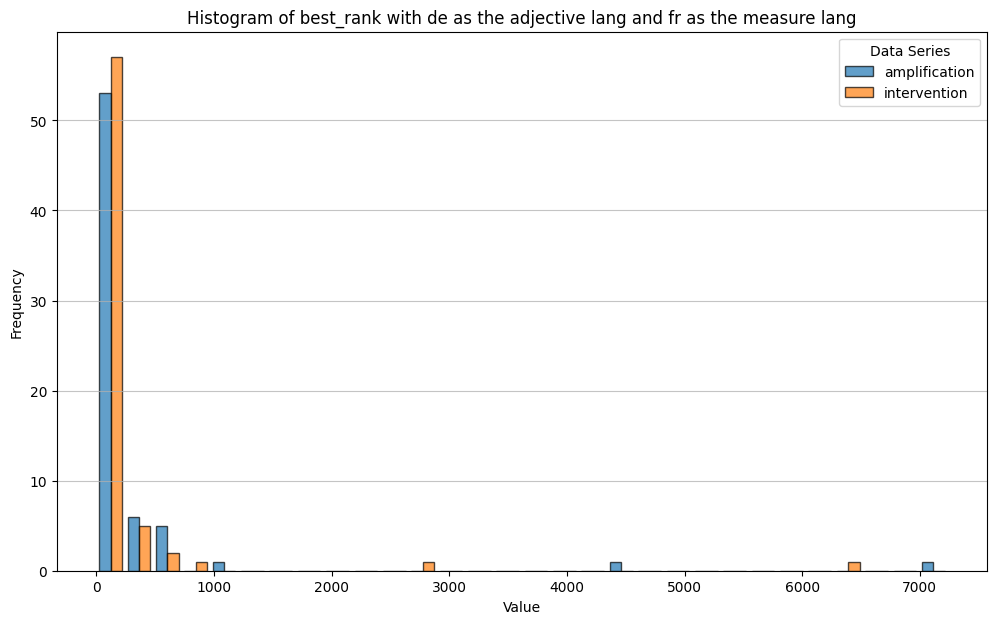

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


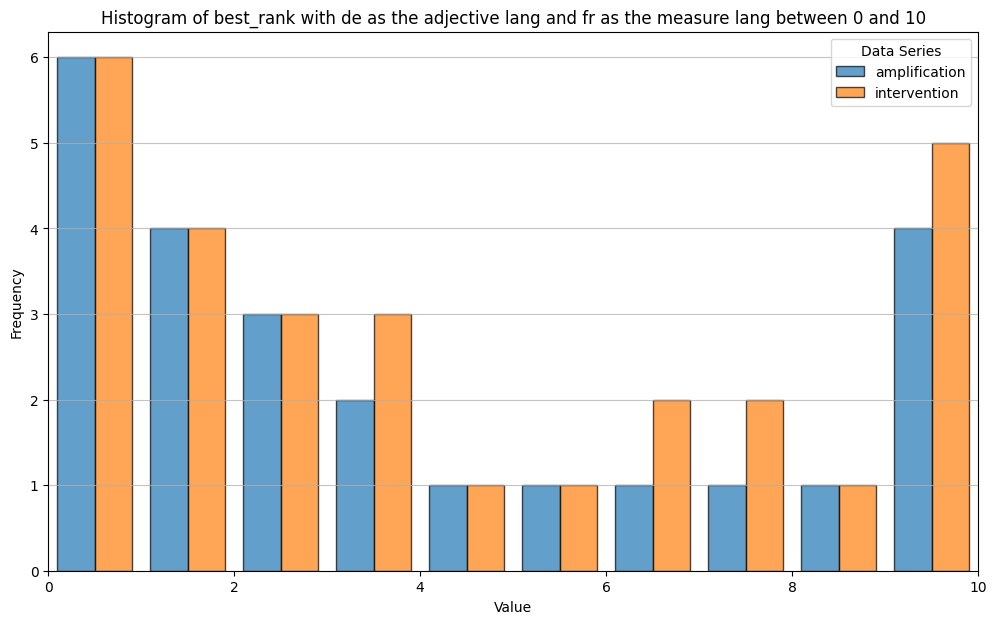

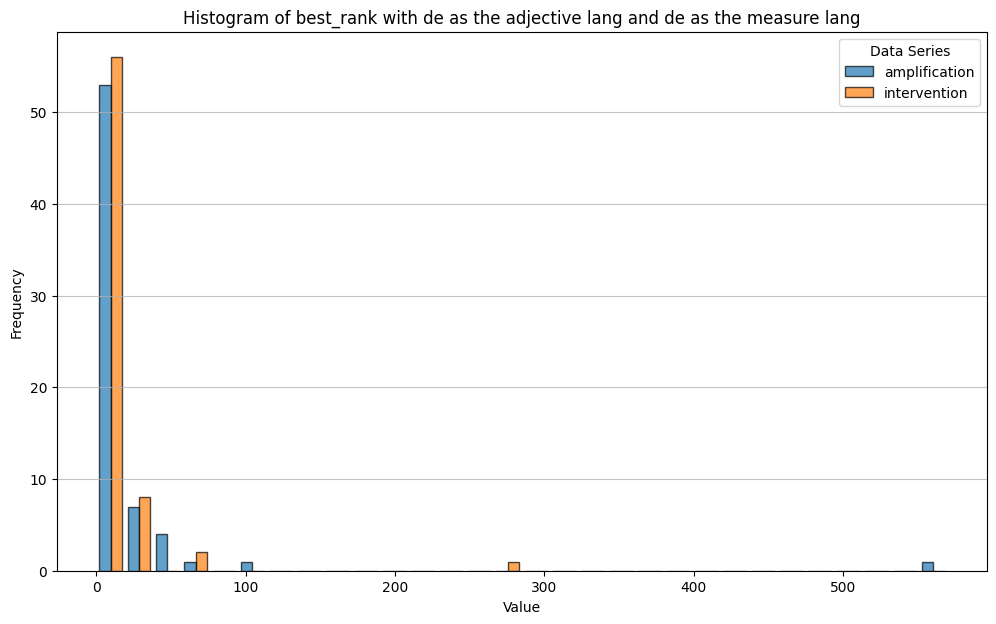

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


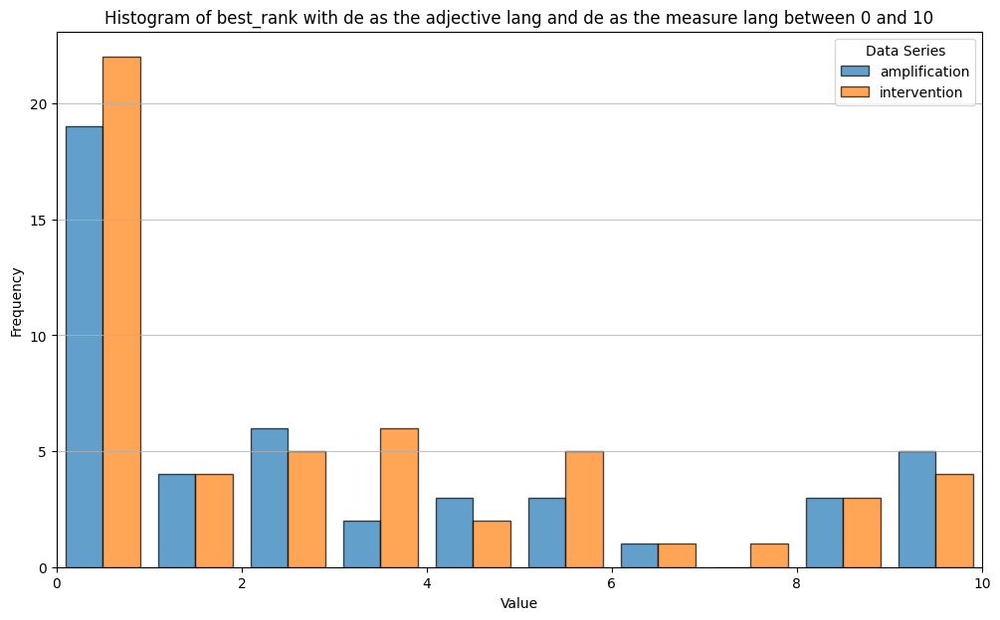

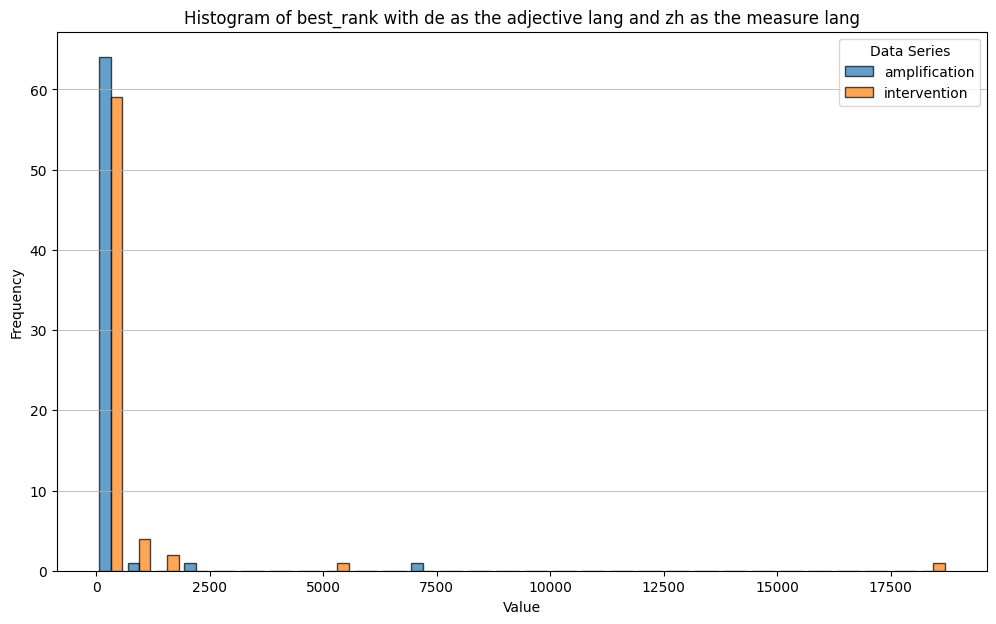

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


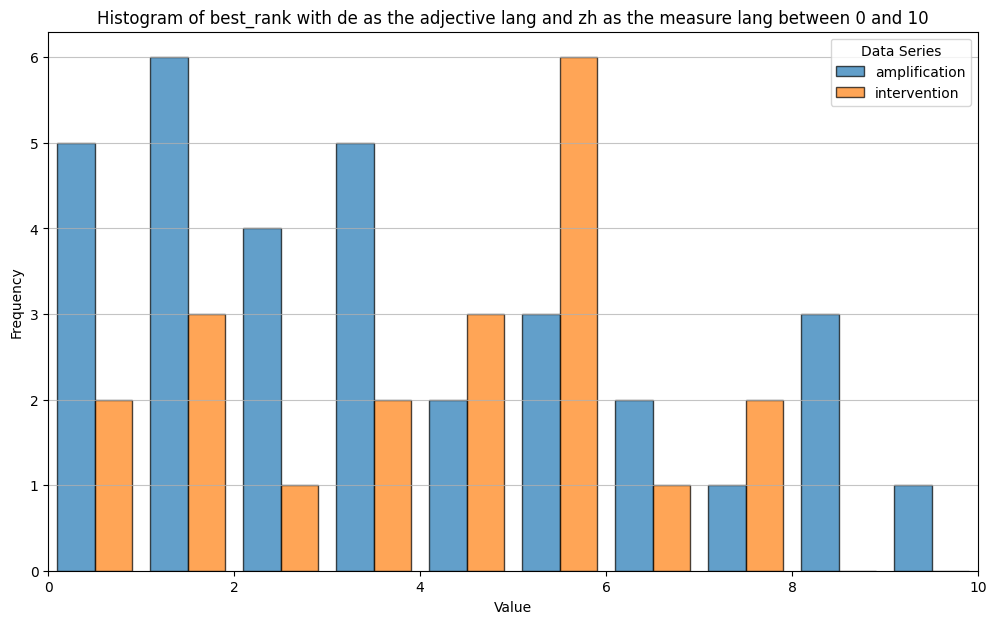

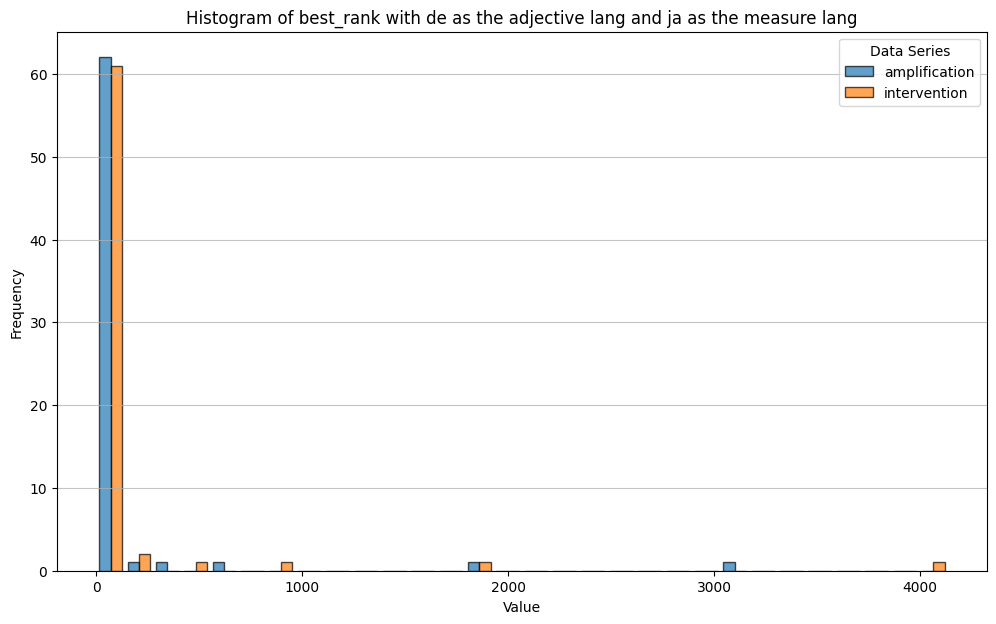

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


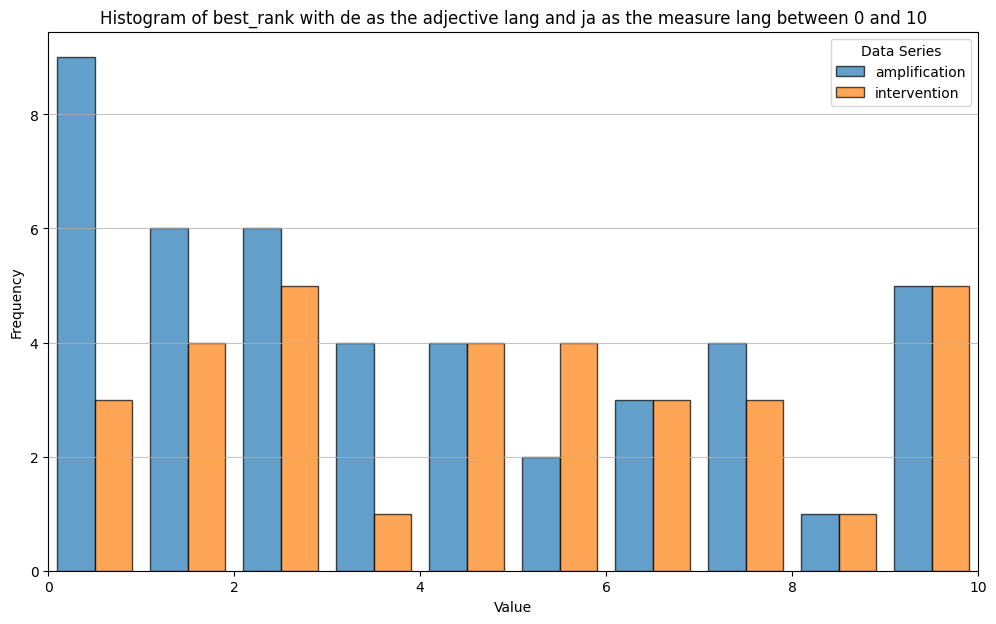

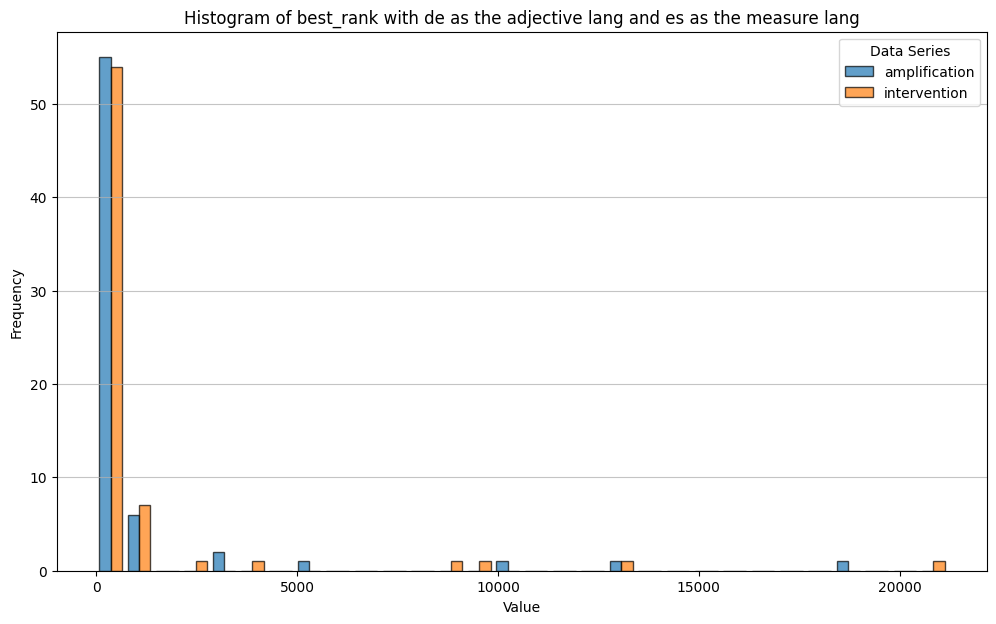

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


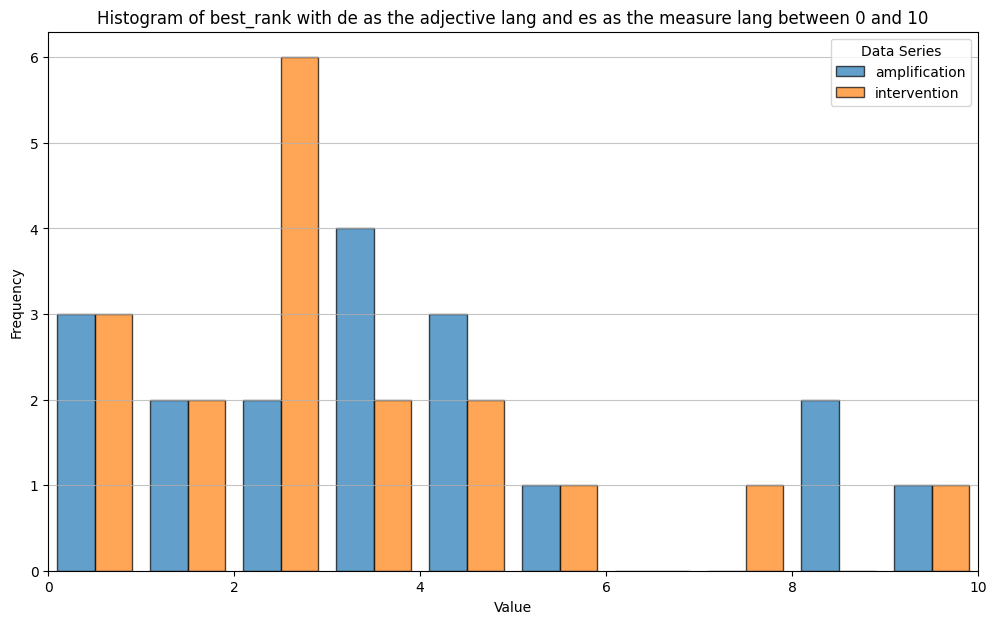

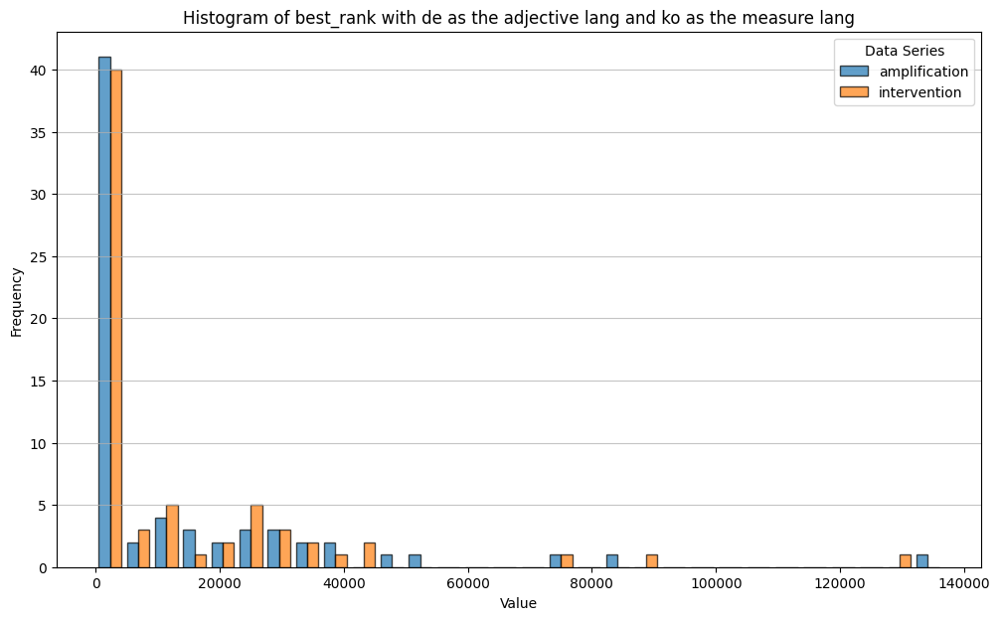

Series 'amplification' has no data points within the 0-10 range and will not be plotted.
Series 'intervention' has no data points within the 0-10 range and will not be plotted.
No valid data points to plot from any series within the 0-10 range.


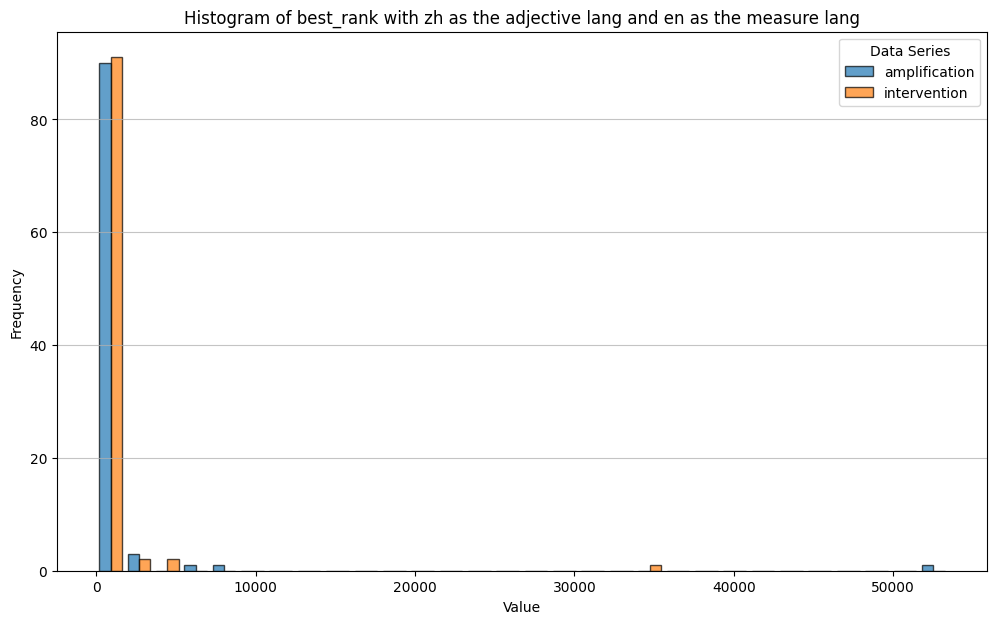

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


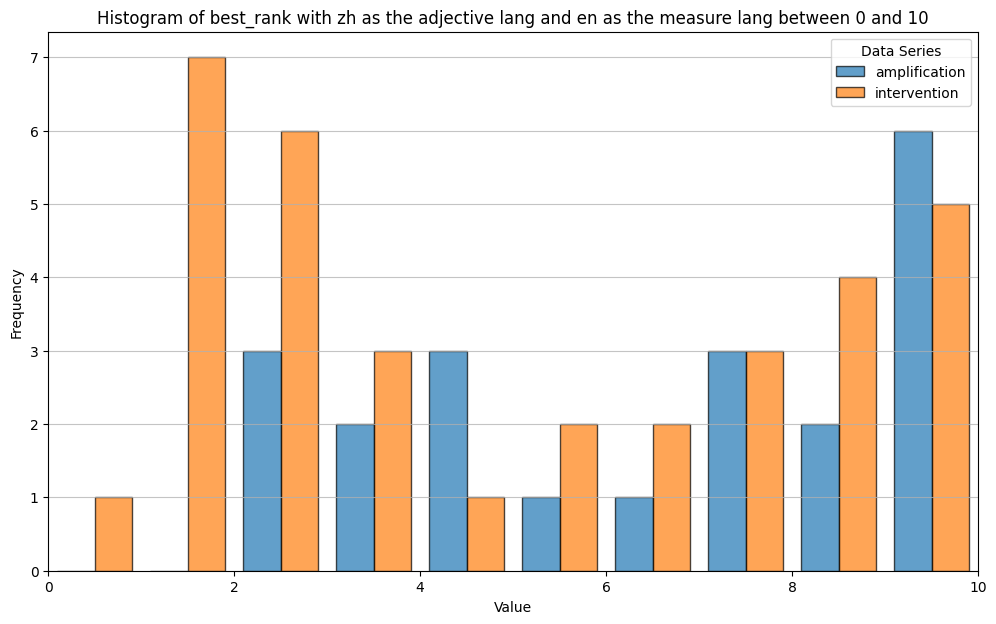

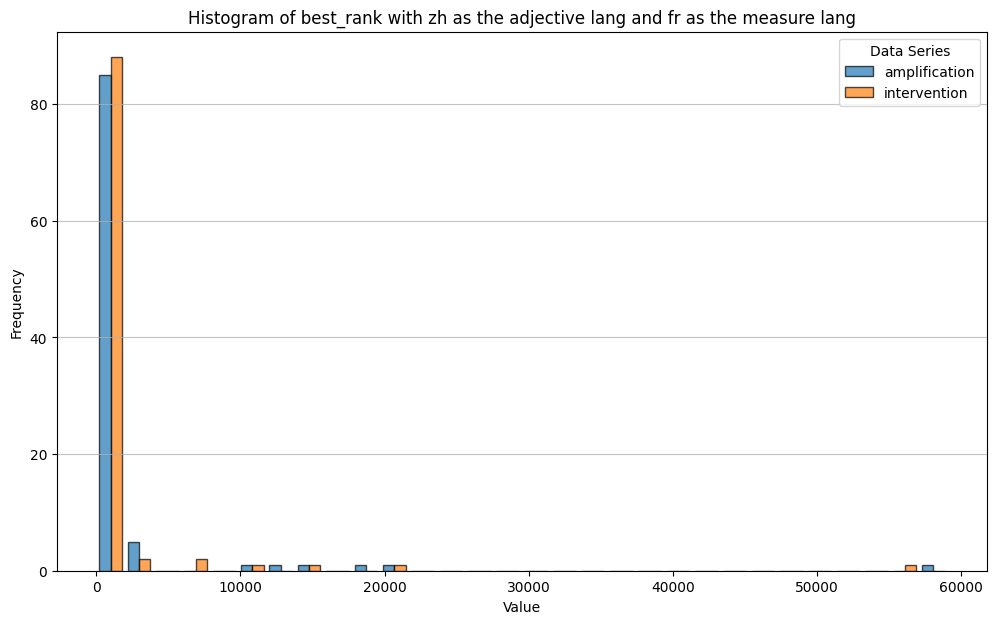

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


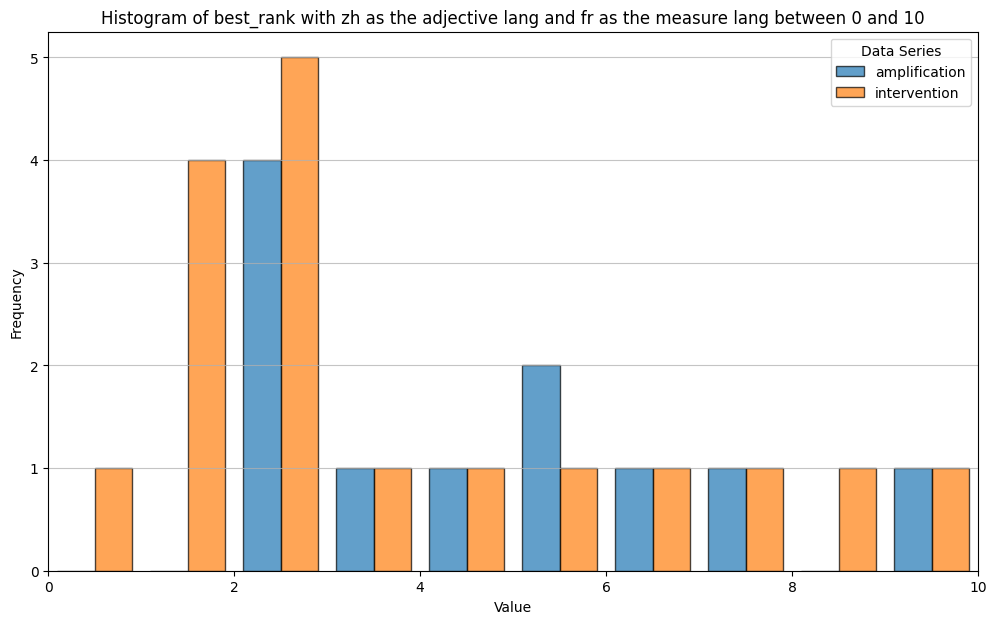

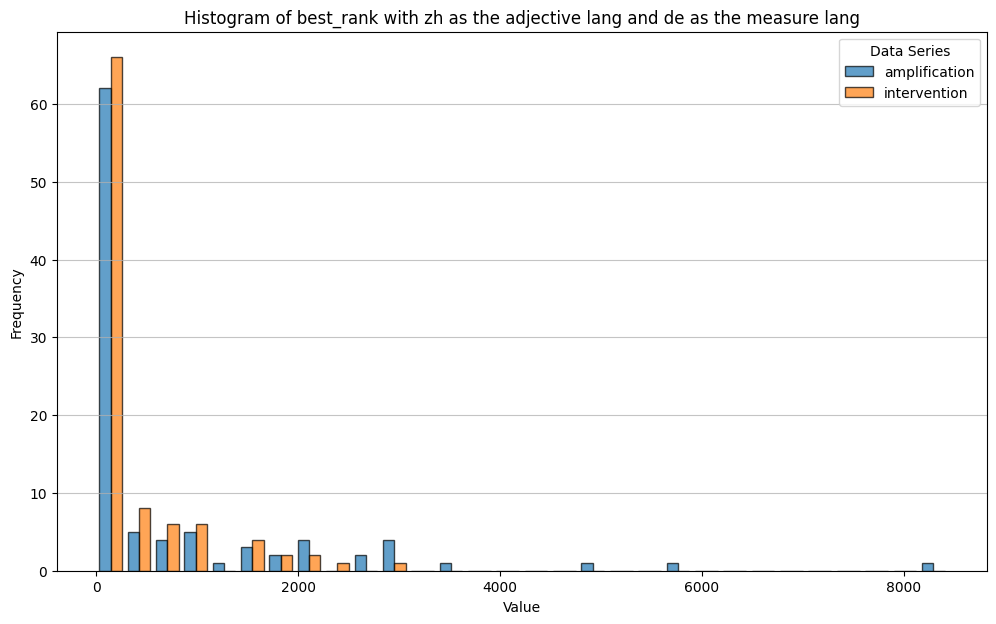

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


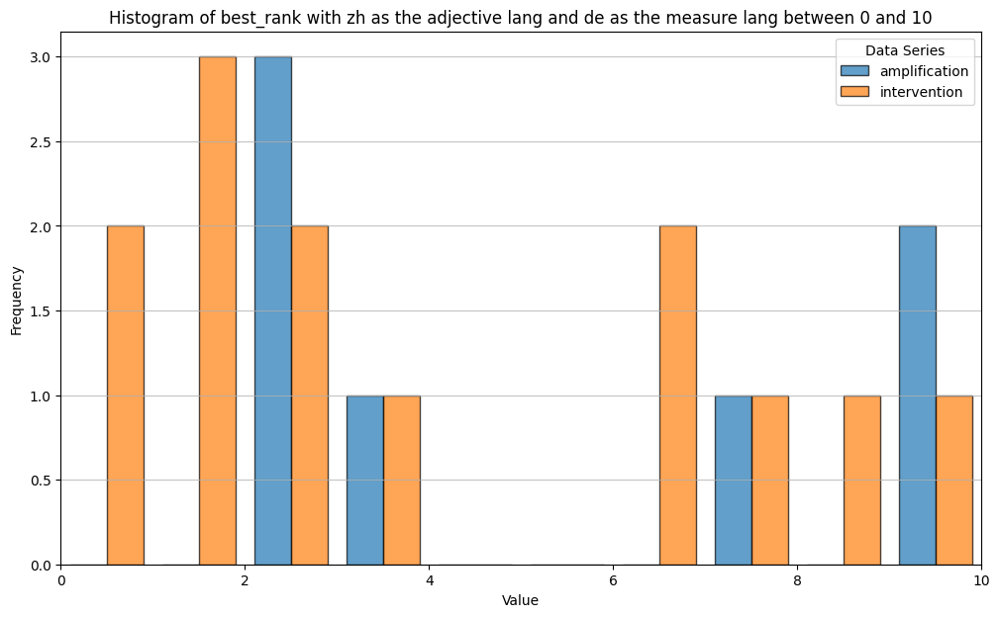

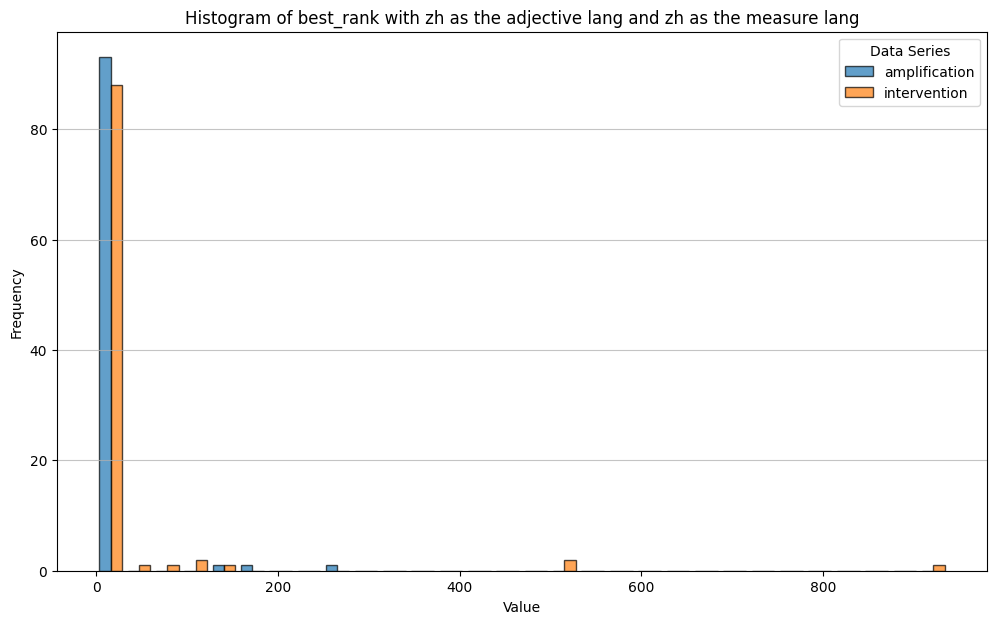

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


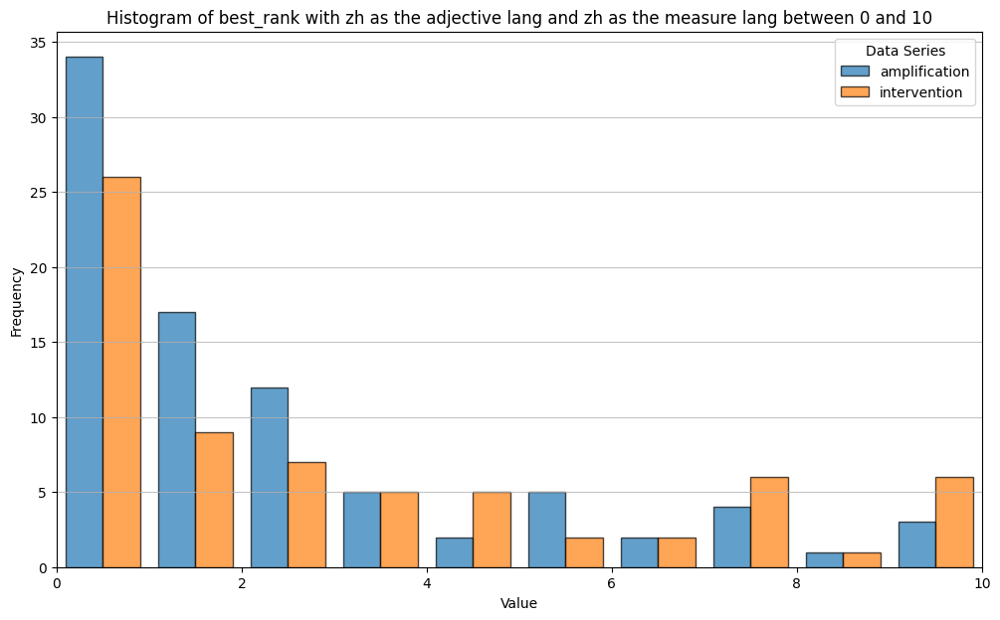

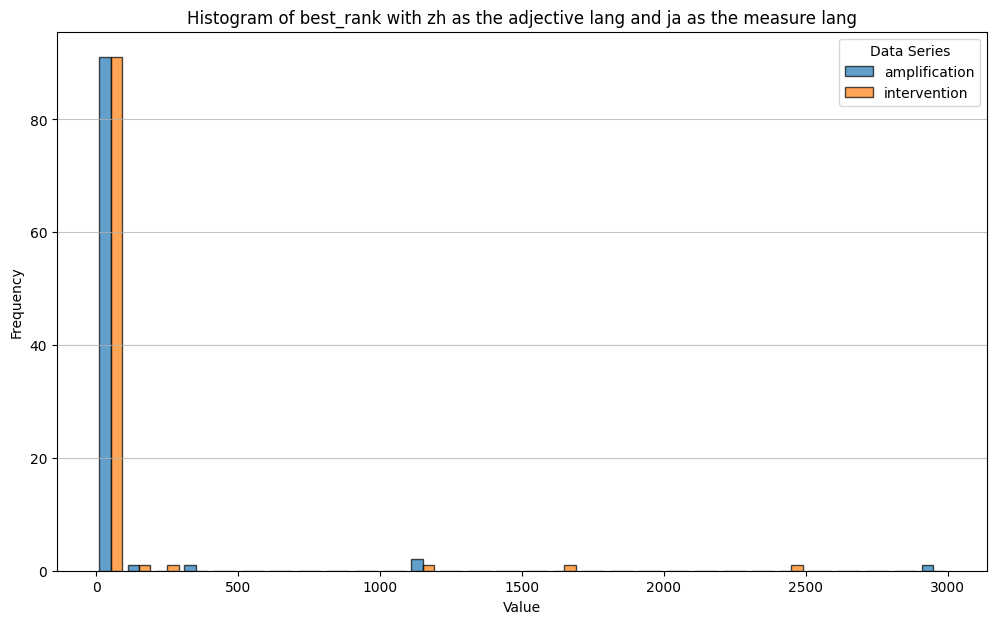

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


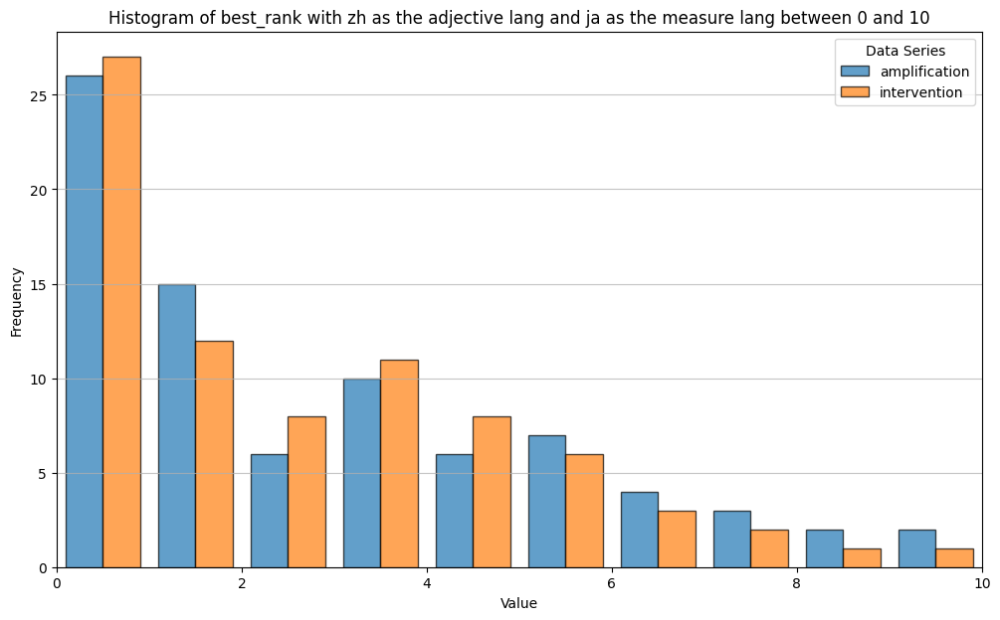

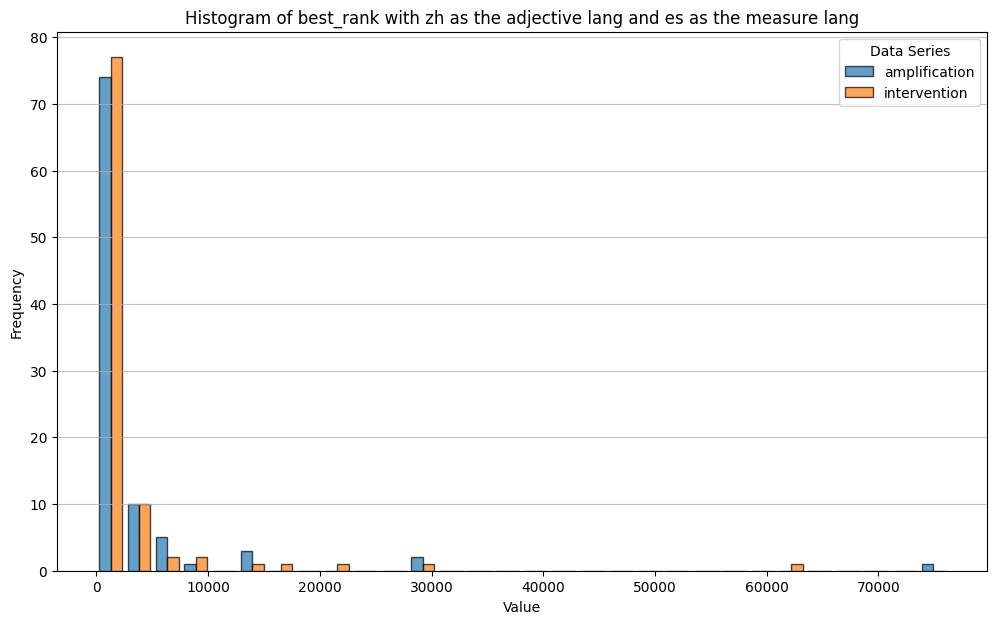

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


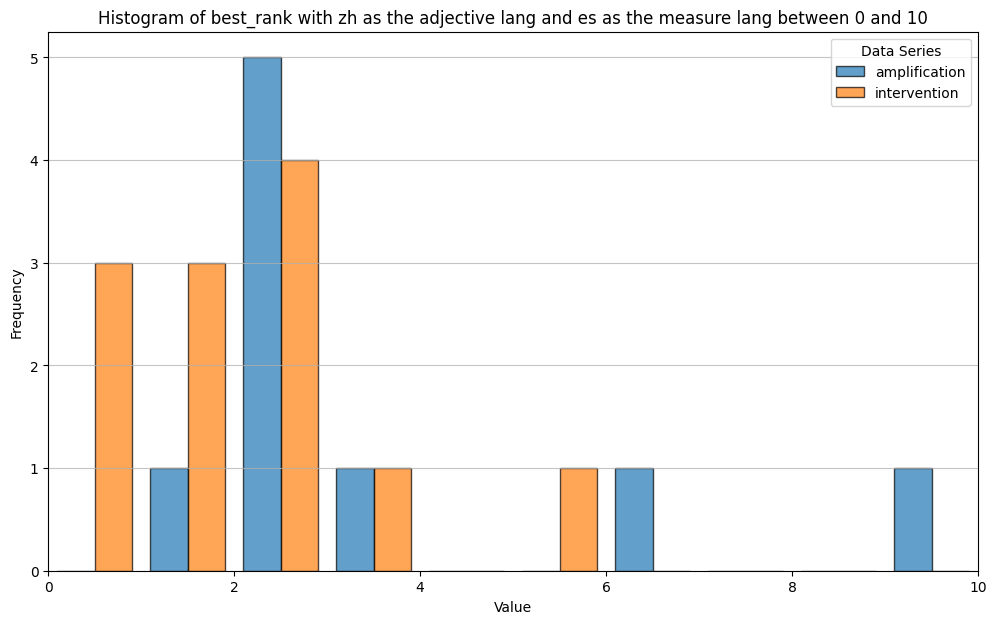

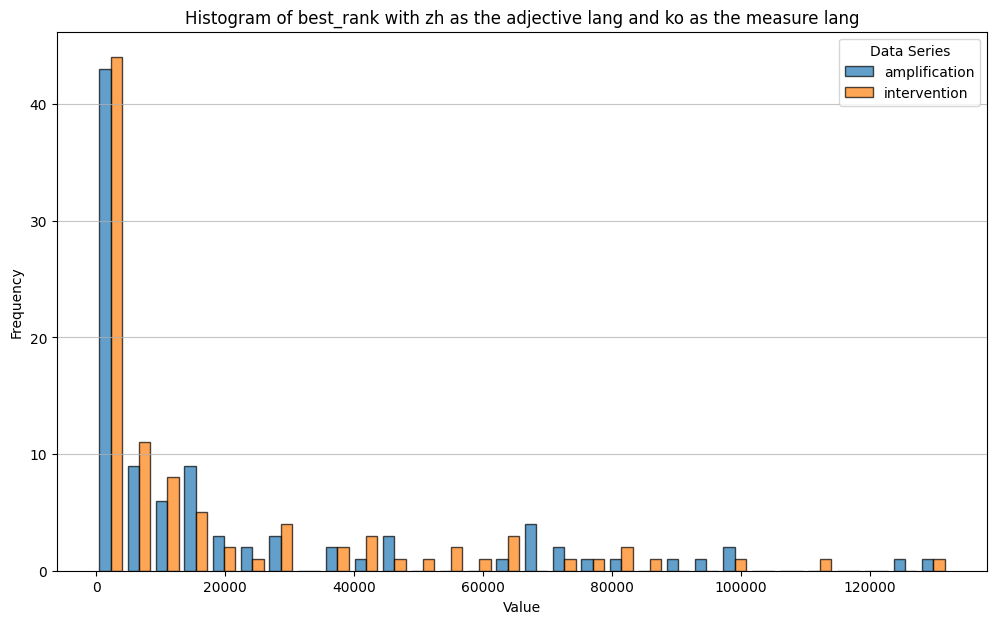

Series 'amplification' has no data points within the 0-10 range and will not be plotted.
Series 'intervention' has no data points within the 0-10 range and will not be plotted.
No valid data points to plot from any series within the 0-10 range.


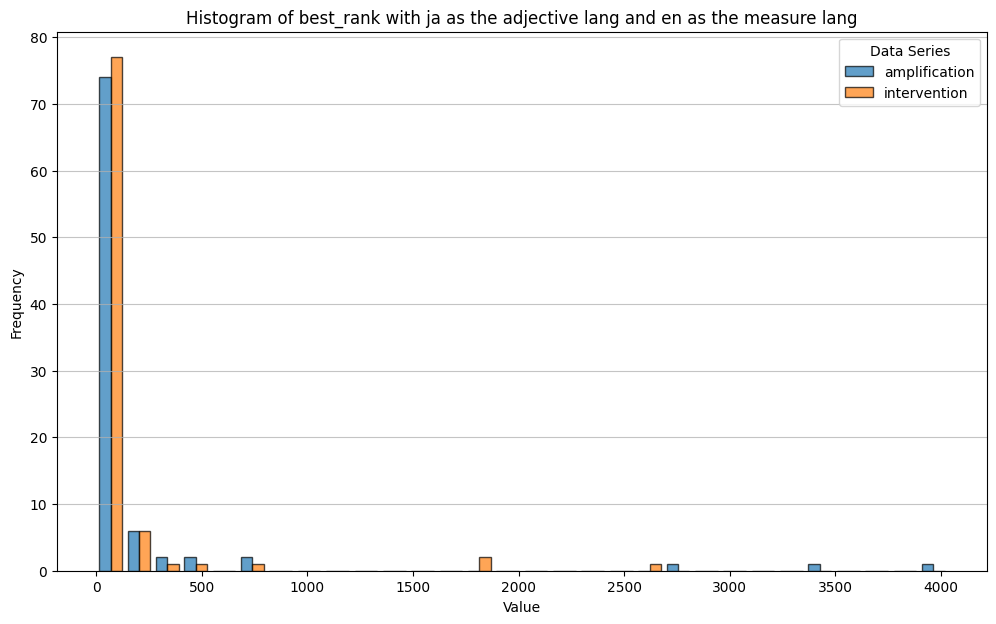

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


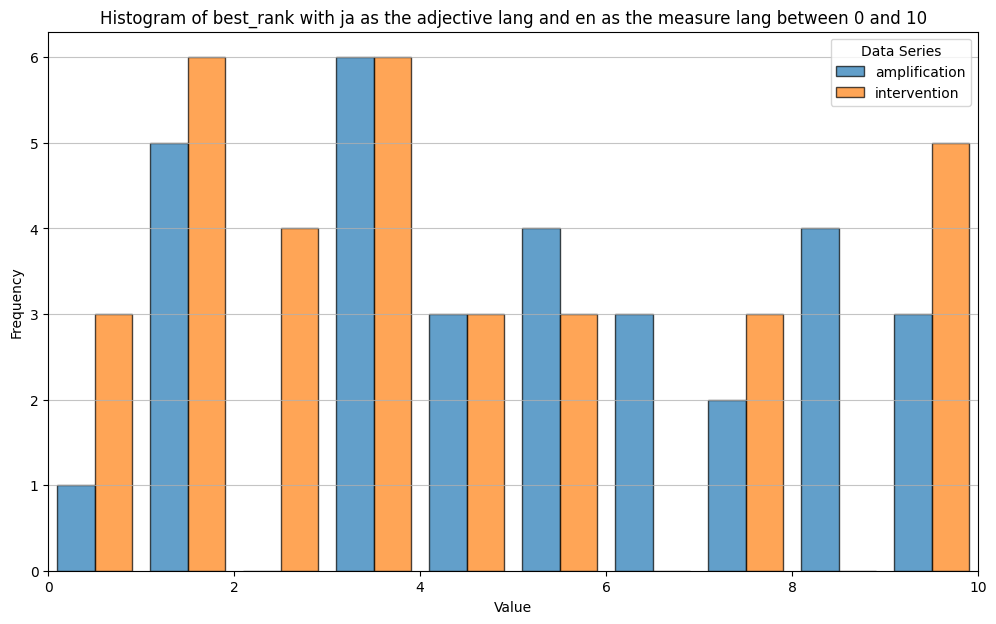

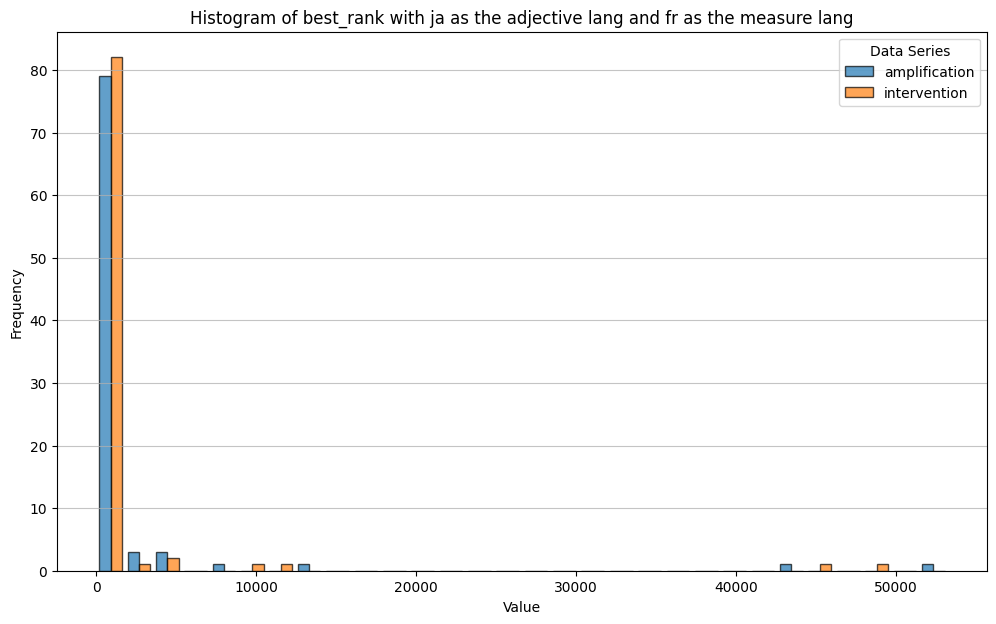

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


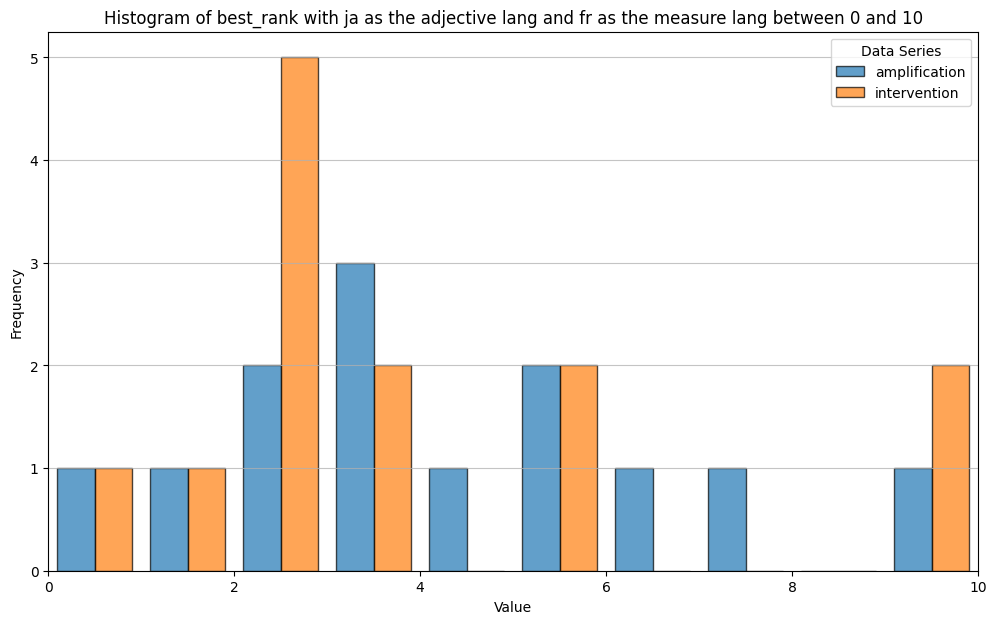

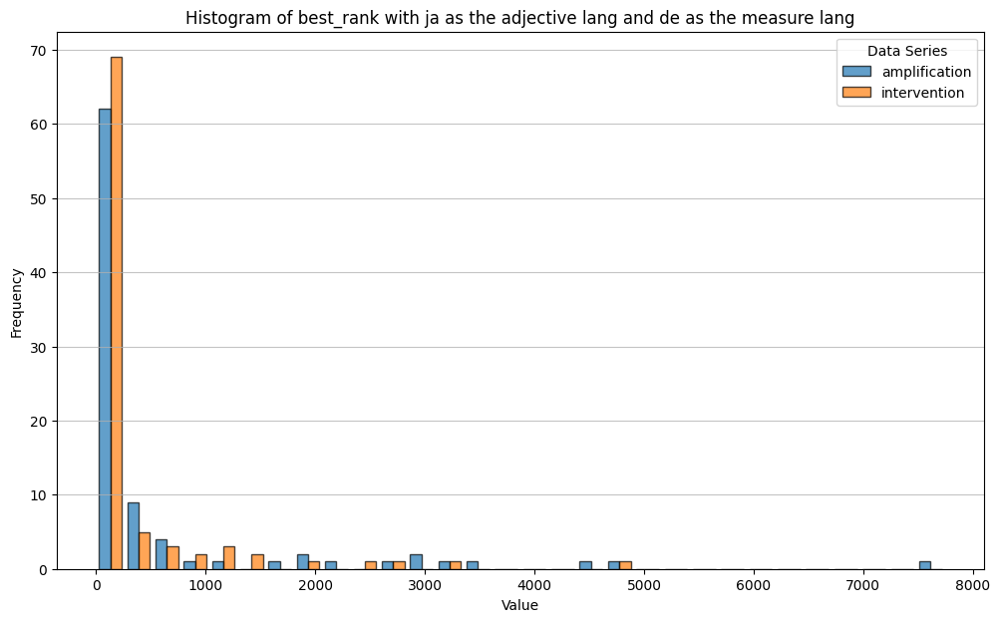

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


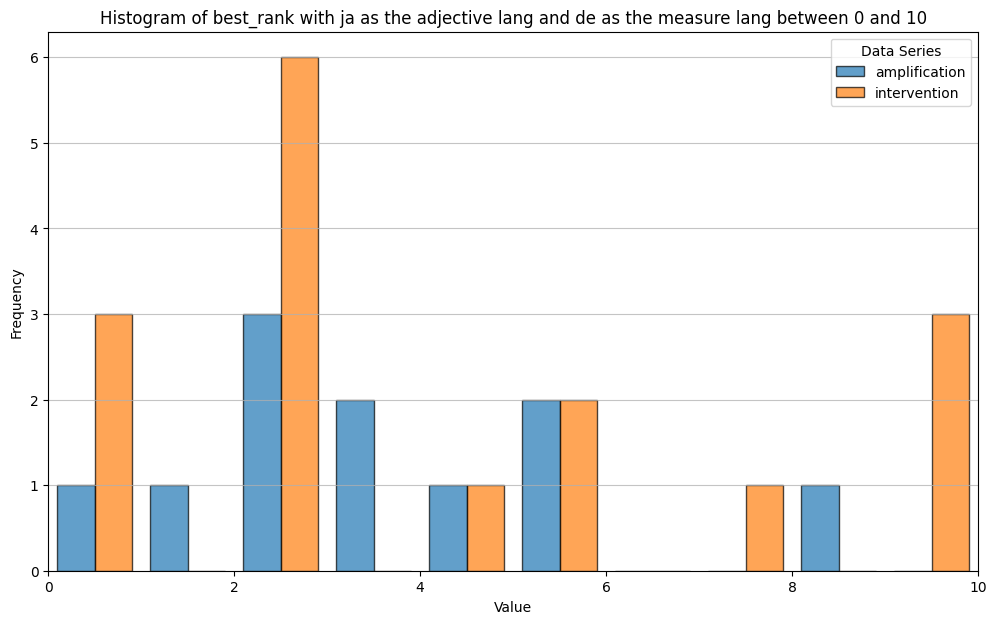

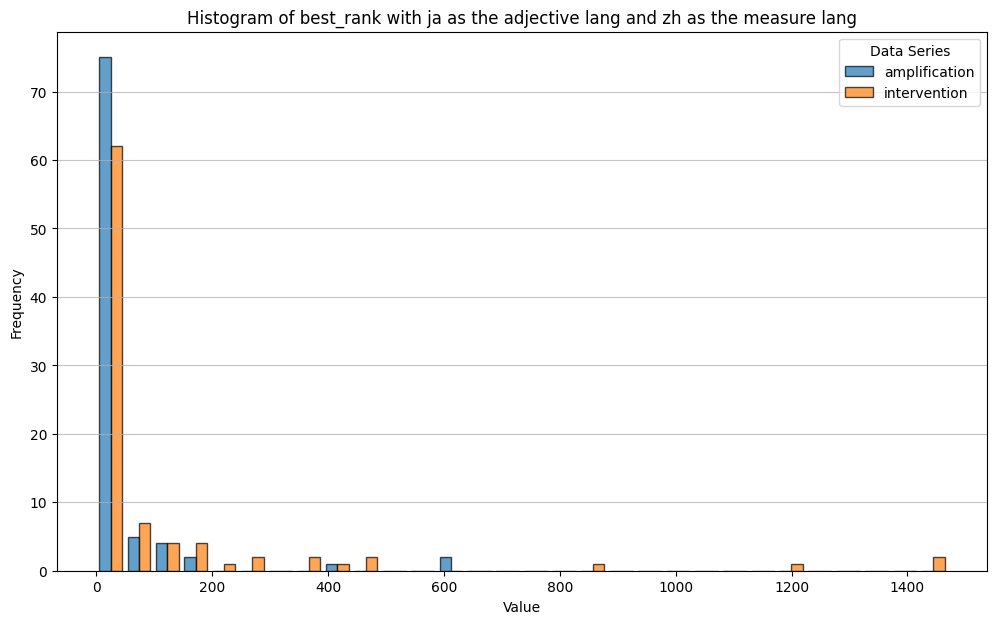

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


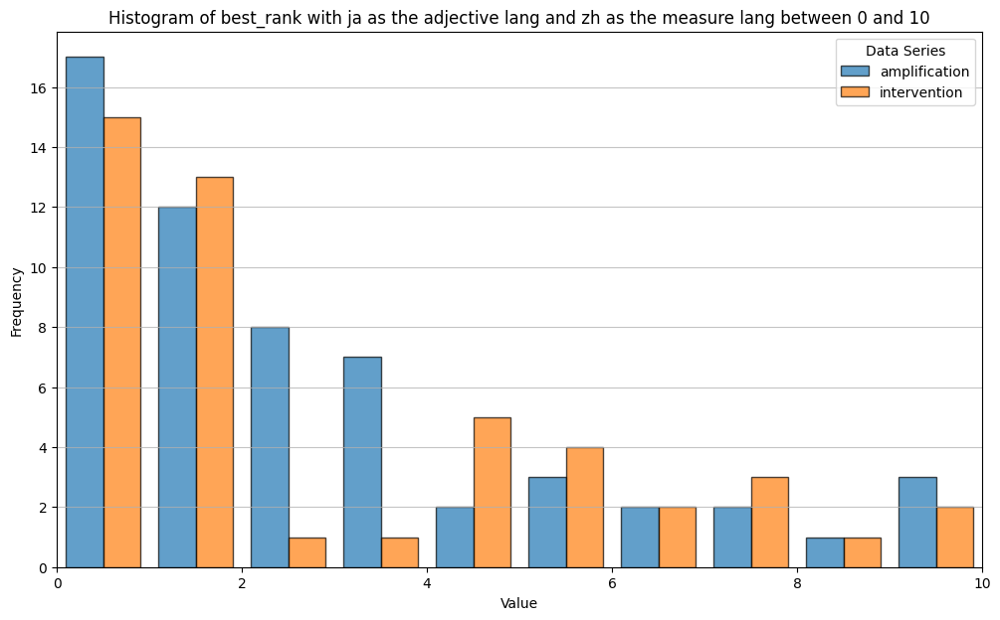

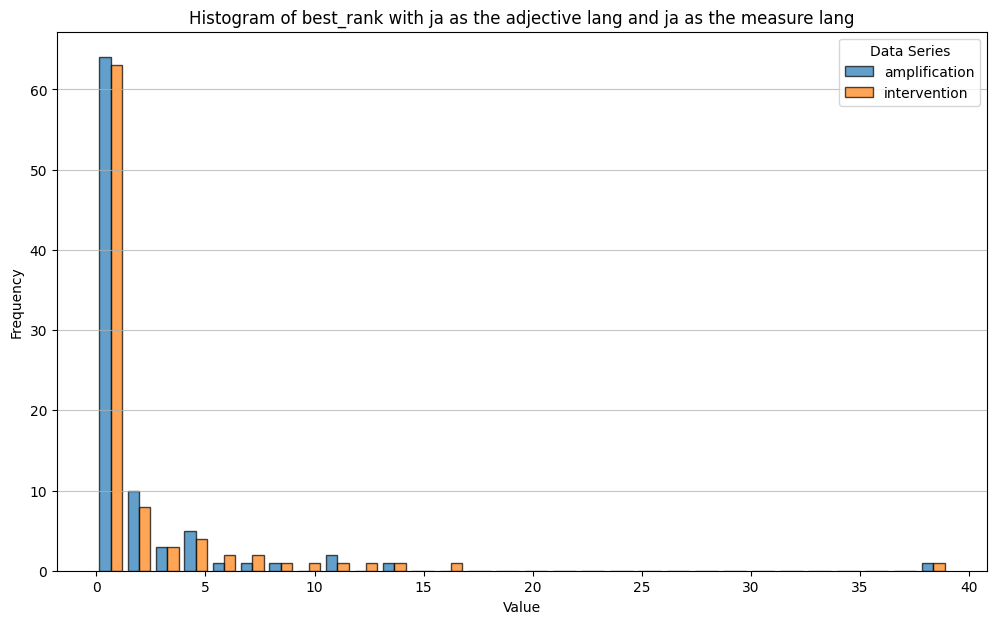

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


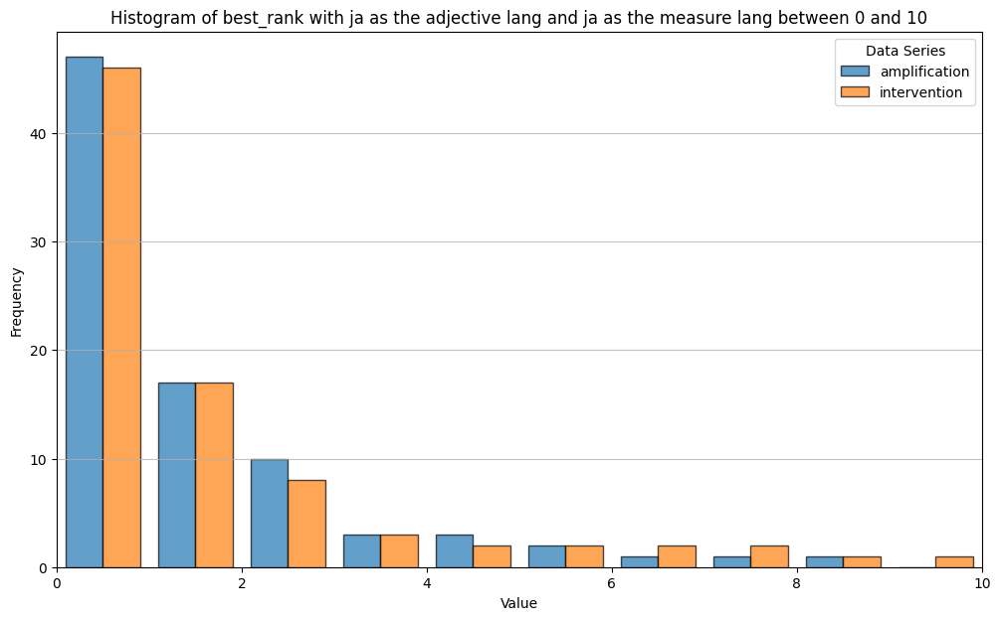

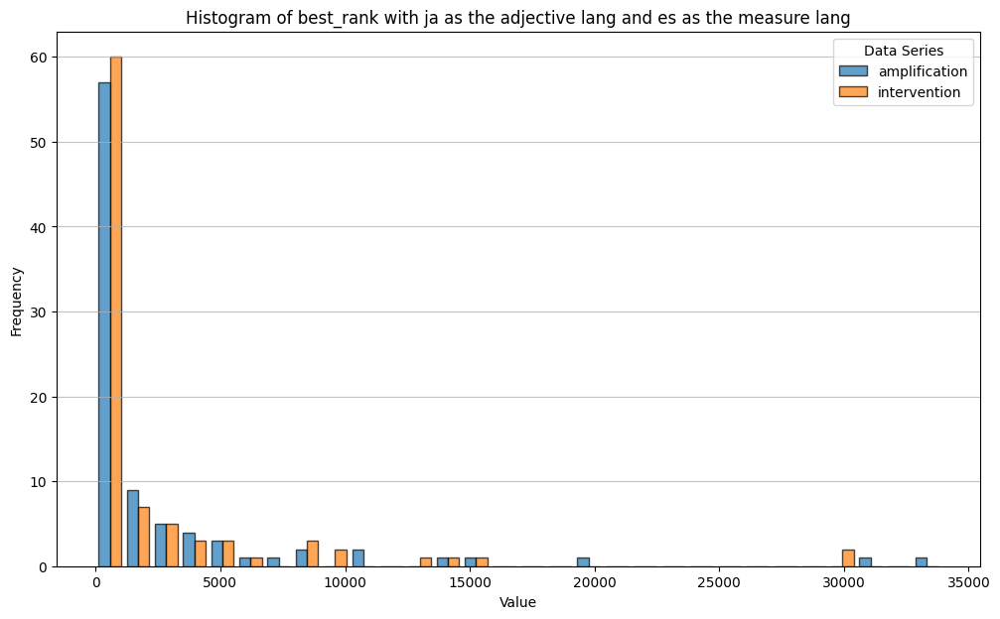

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


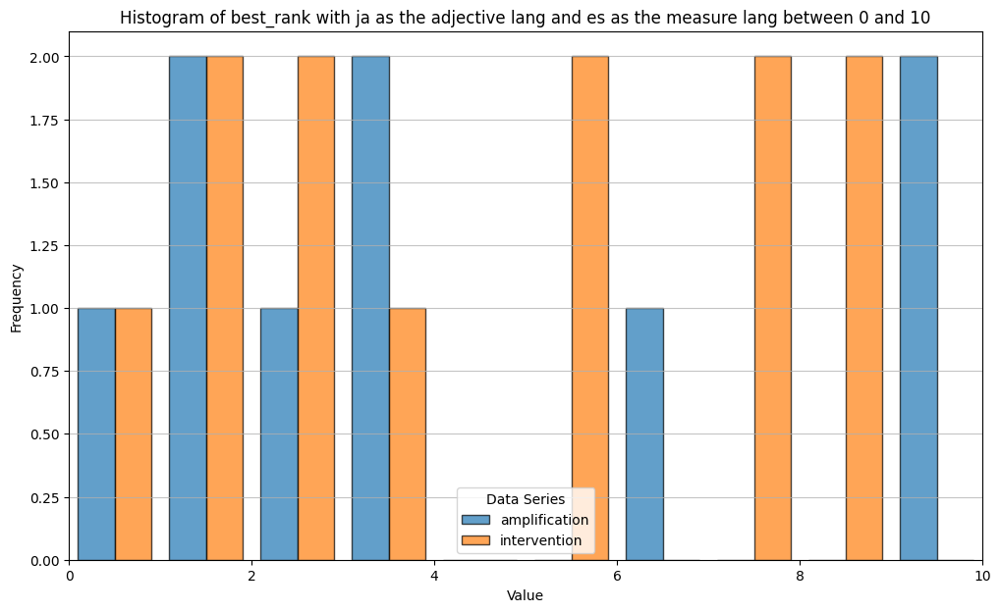

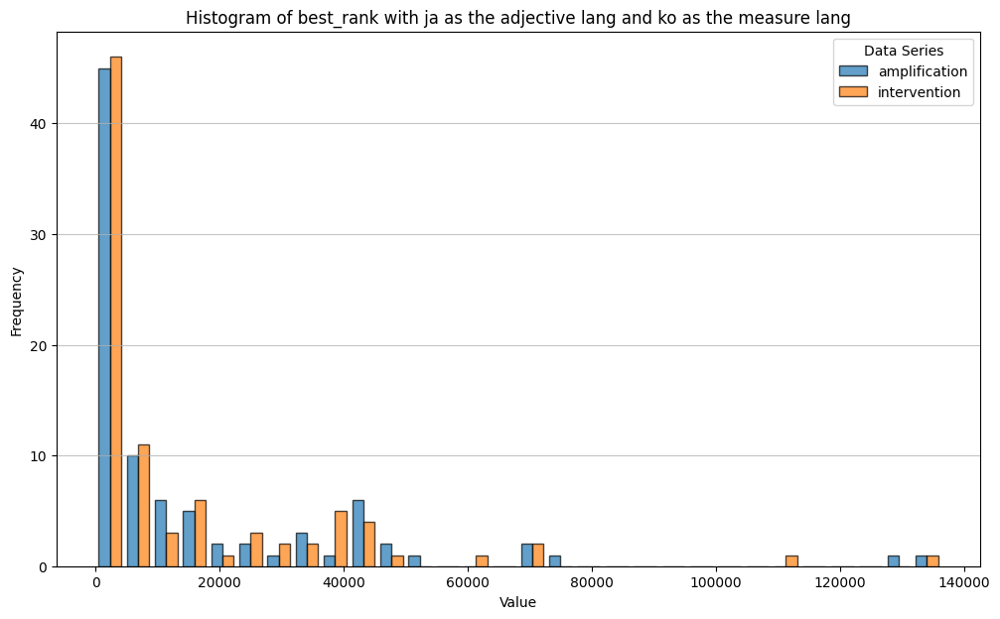

Series 'amplification' has no data points within the 0-10 range and will not be plotted.
Series 'intervention' has no data points within the 0-10 range and will not be plotted.
No valid data points to plot from any series within the 0-10 range.


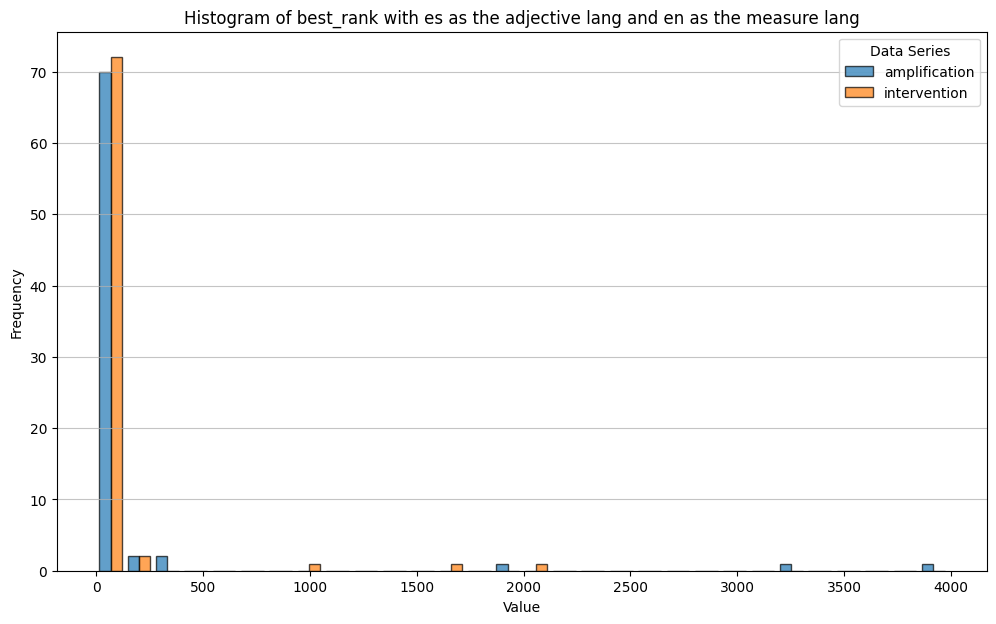

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


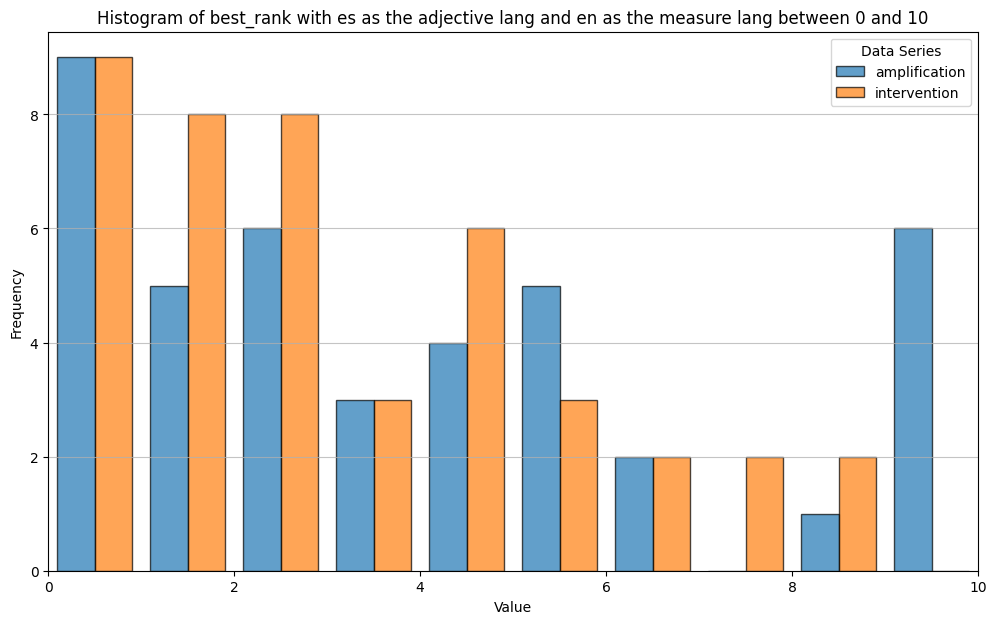

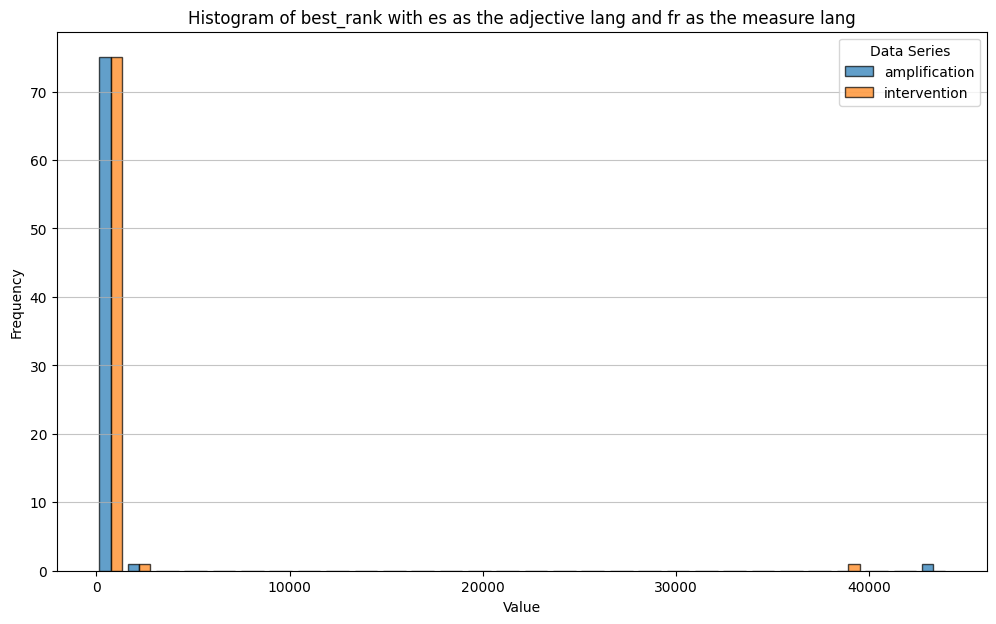

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


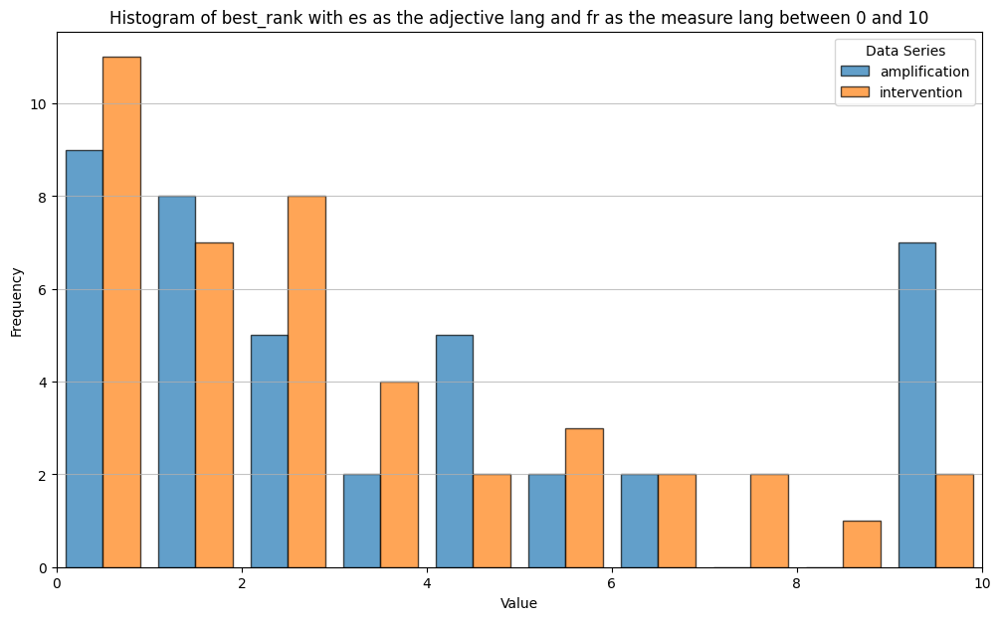

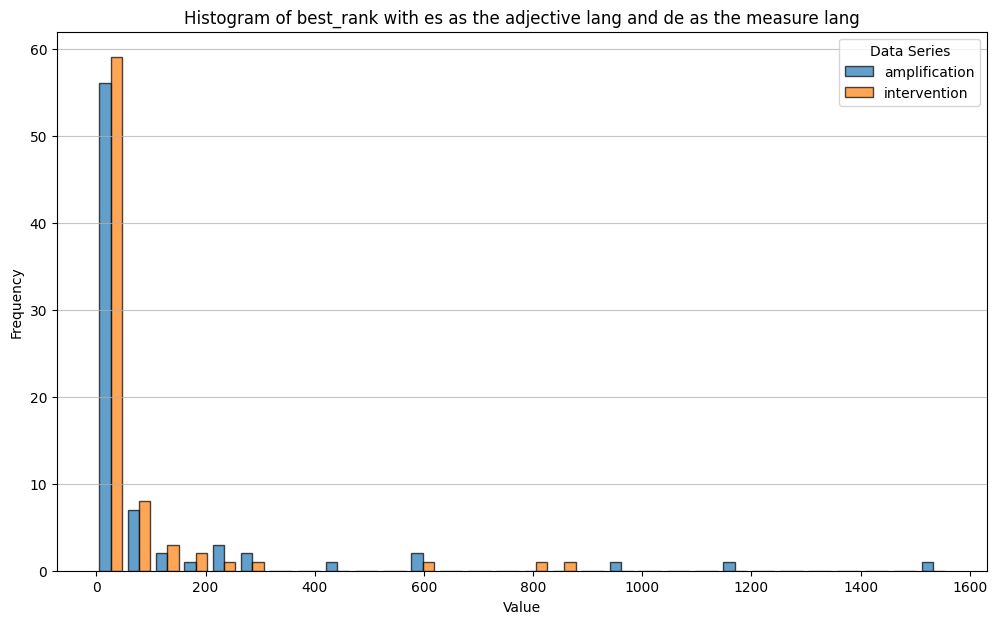

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


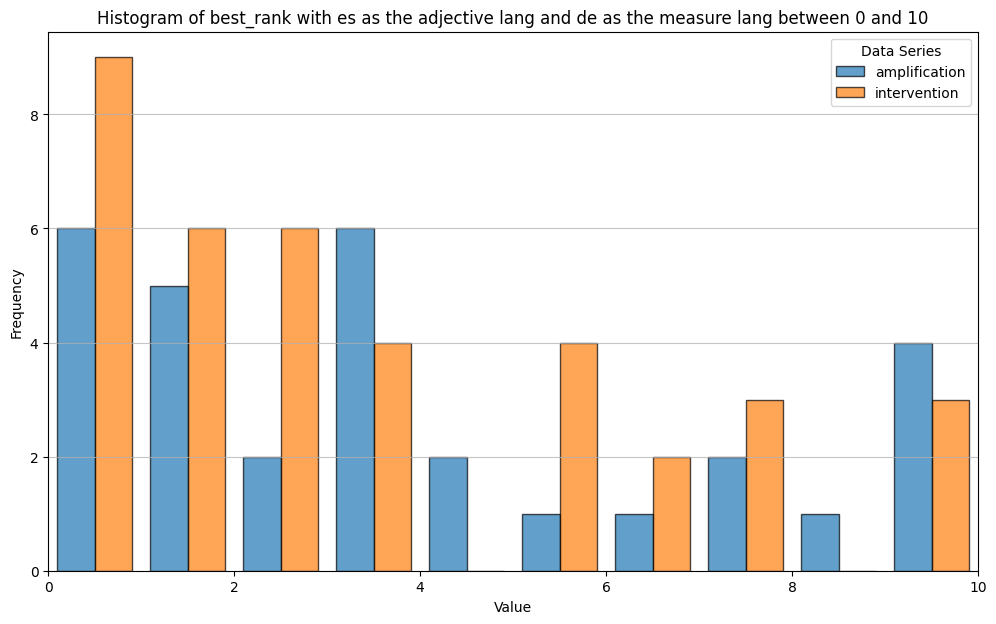

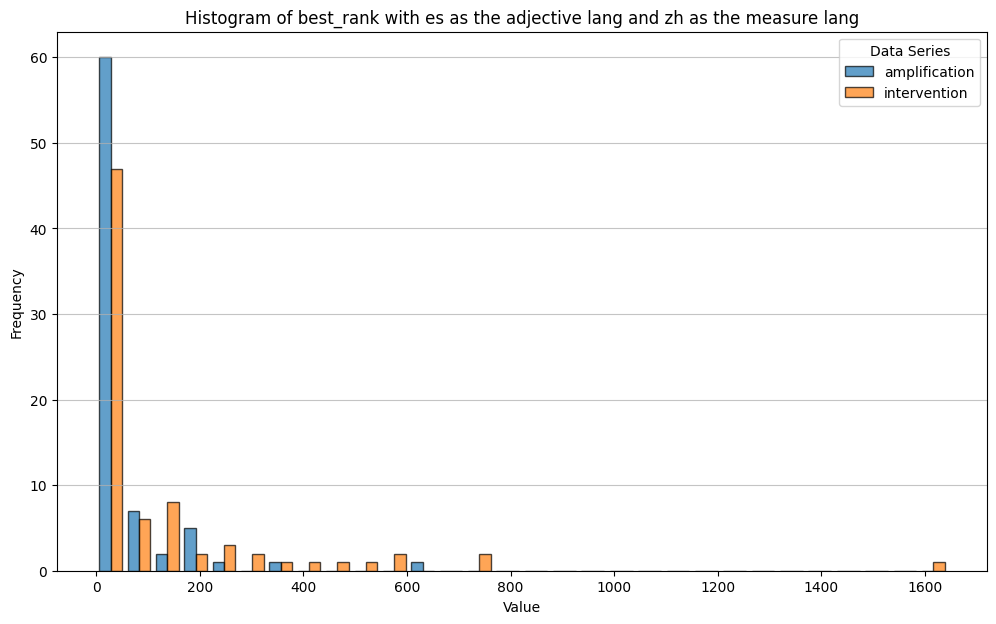

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


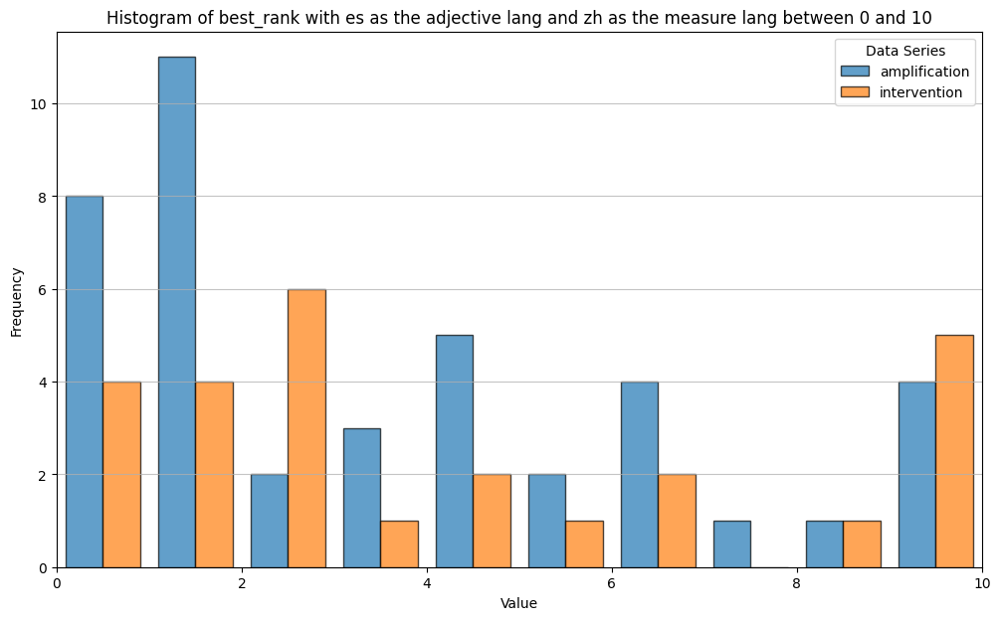

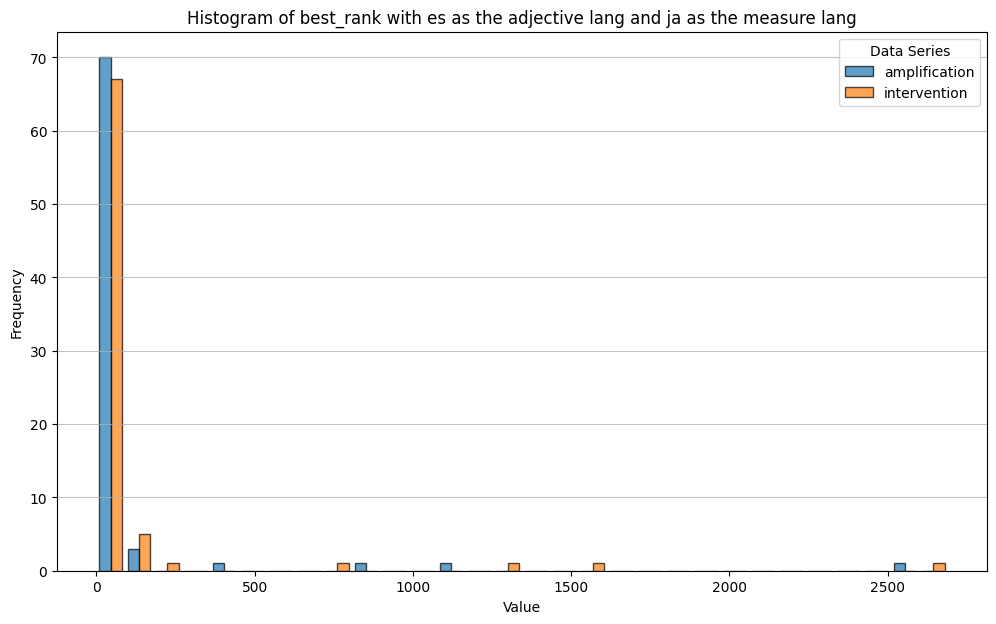

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


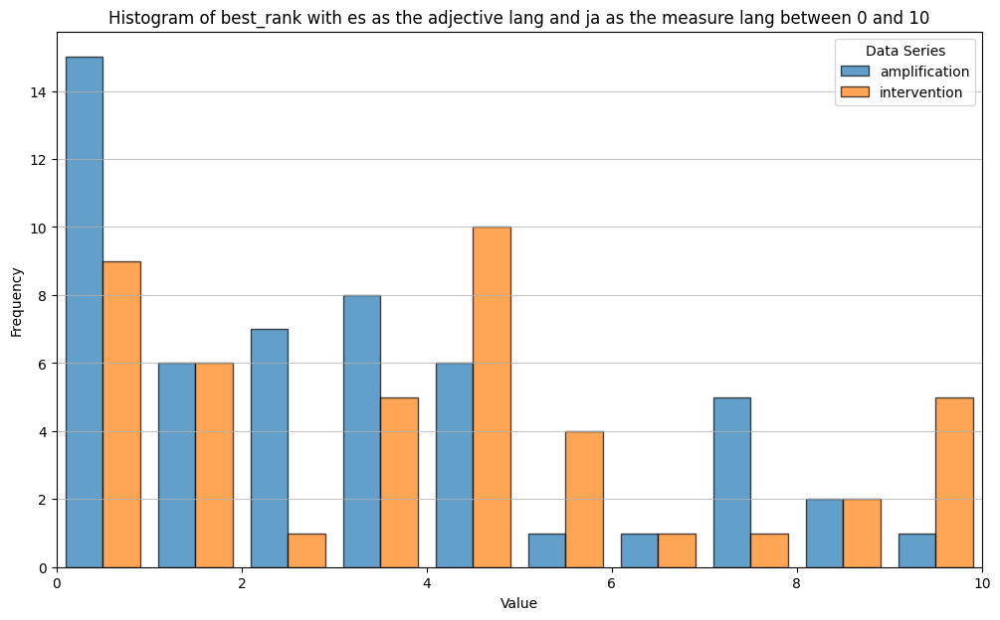

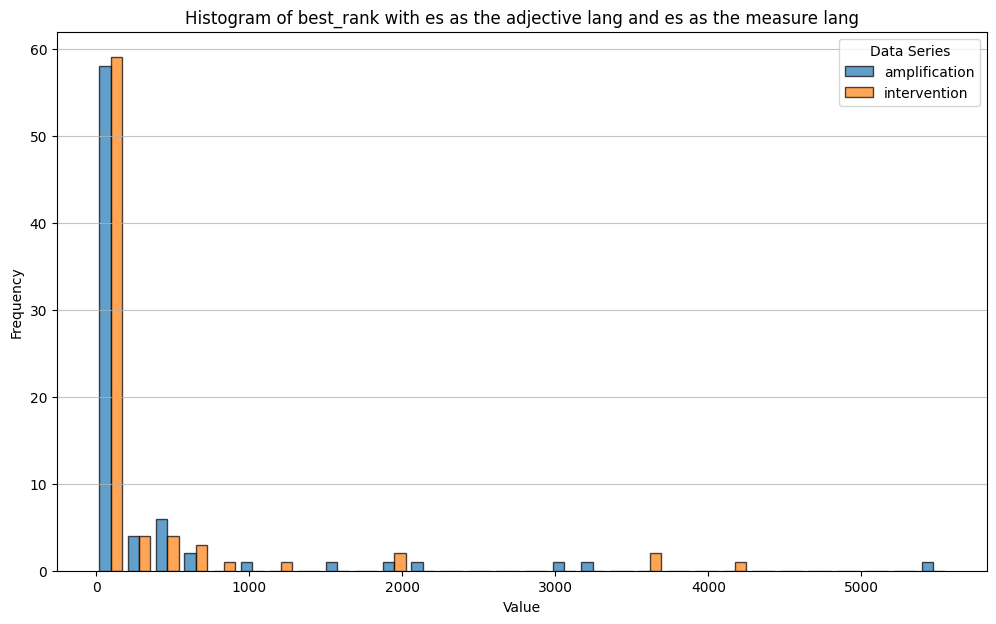

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


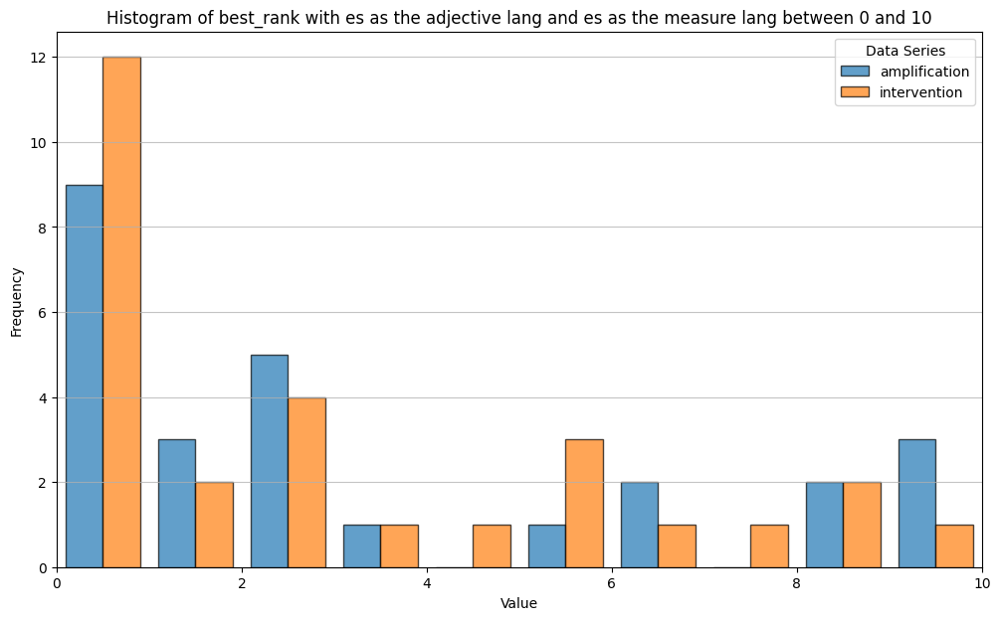

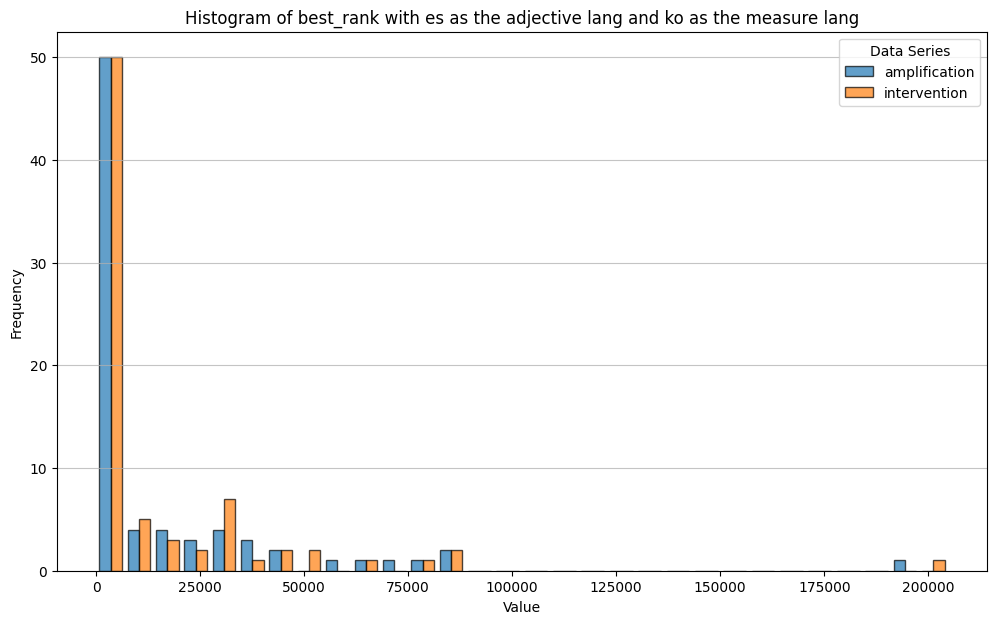

Series 'amplification' has no data points within the 0-10 range and will not be plotted.
Series 'intervention' has no data points within the 0-10 range and will not be plotted.
No valid data points to plot from any series within the 0-10 range.


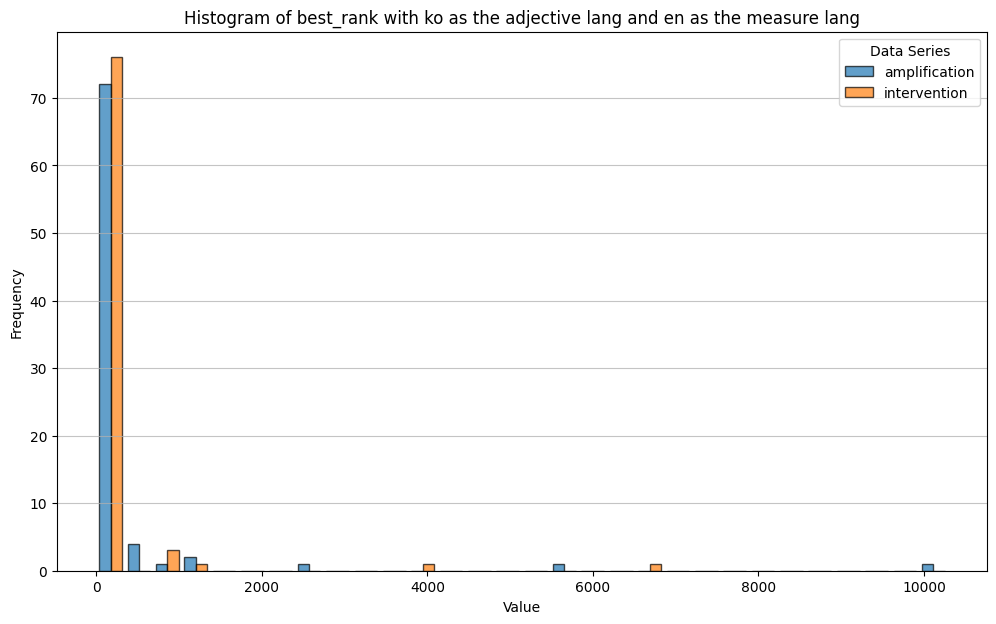

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


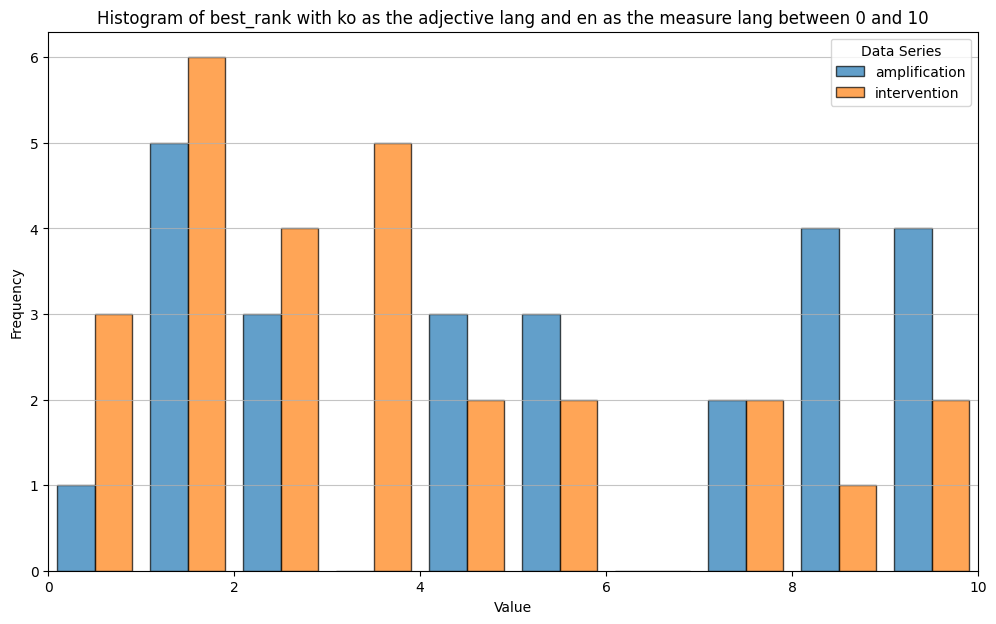

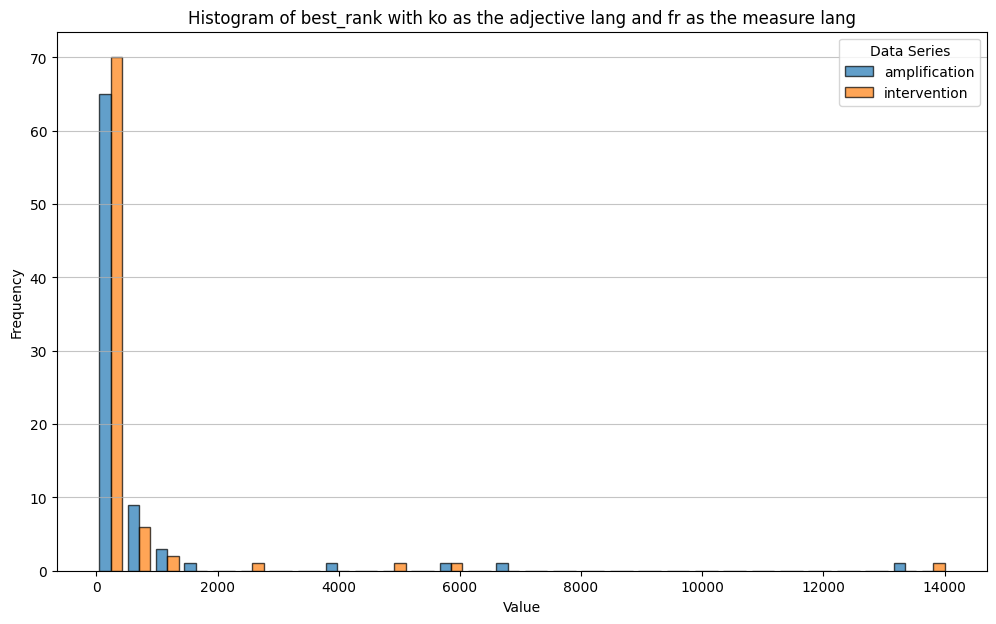

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


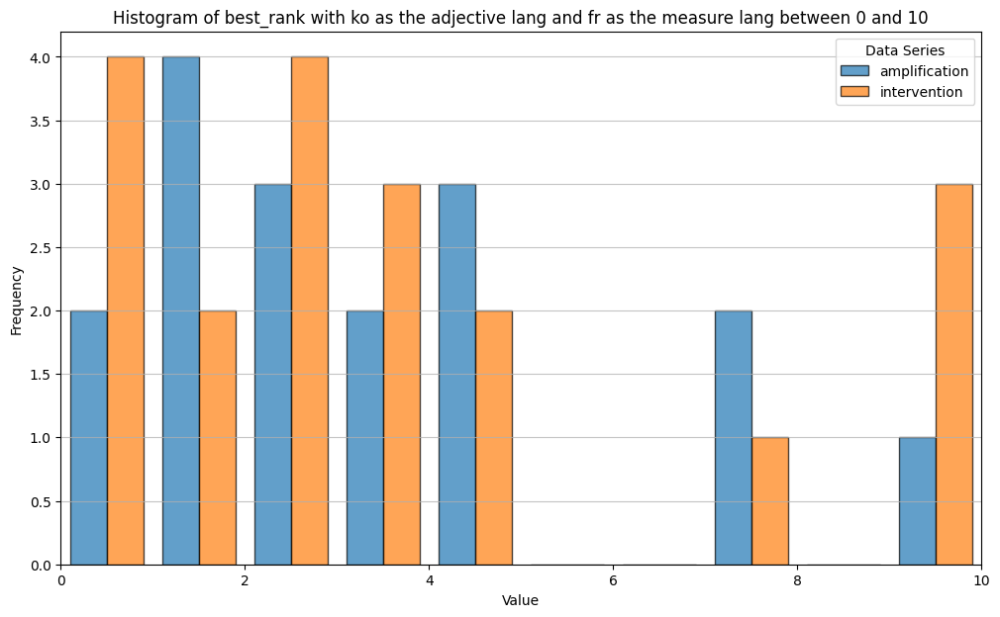

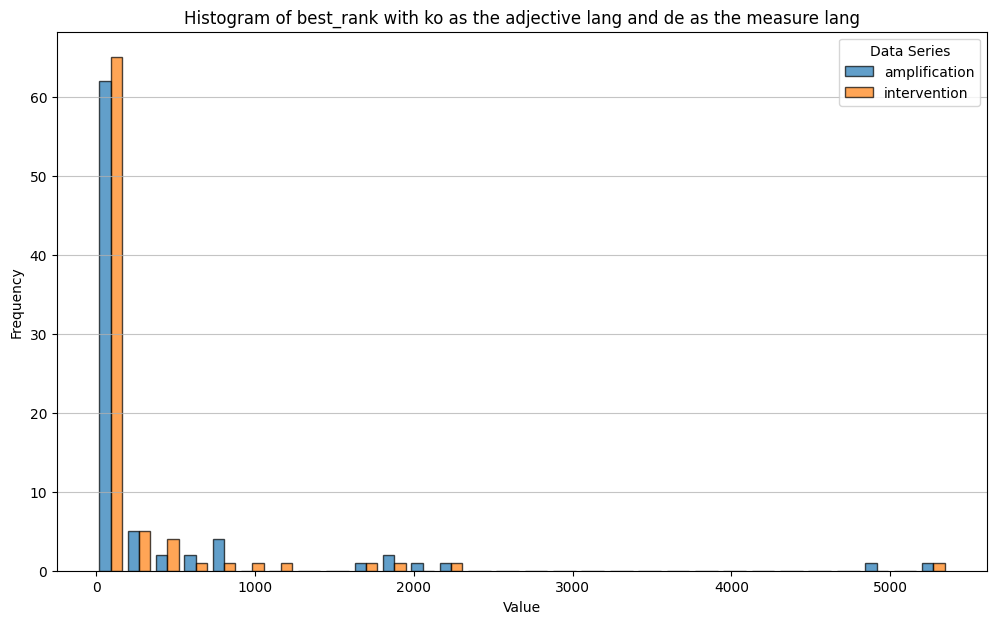

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


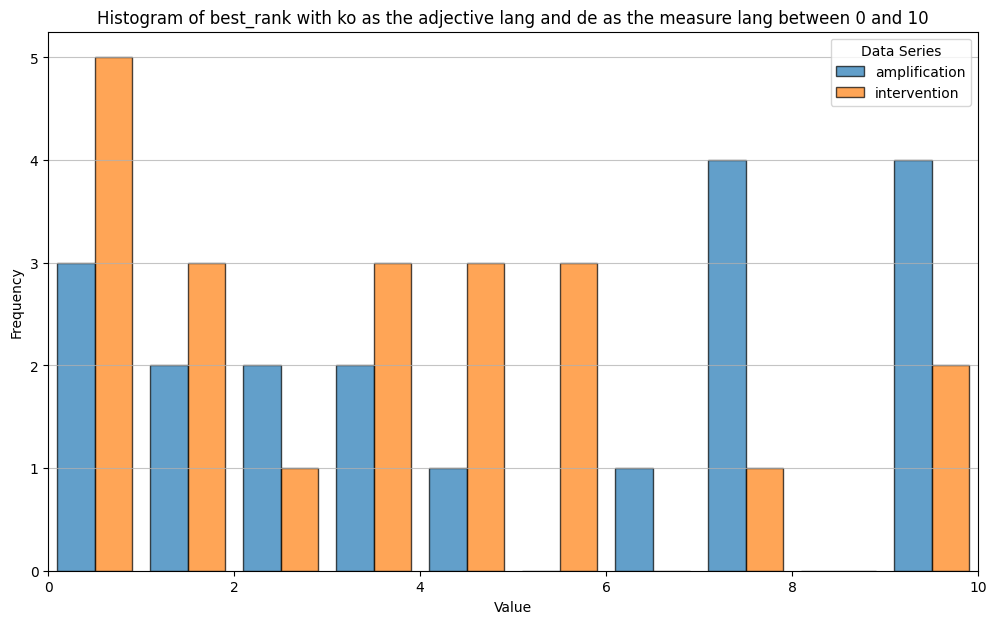

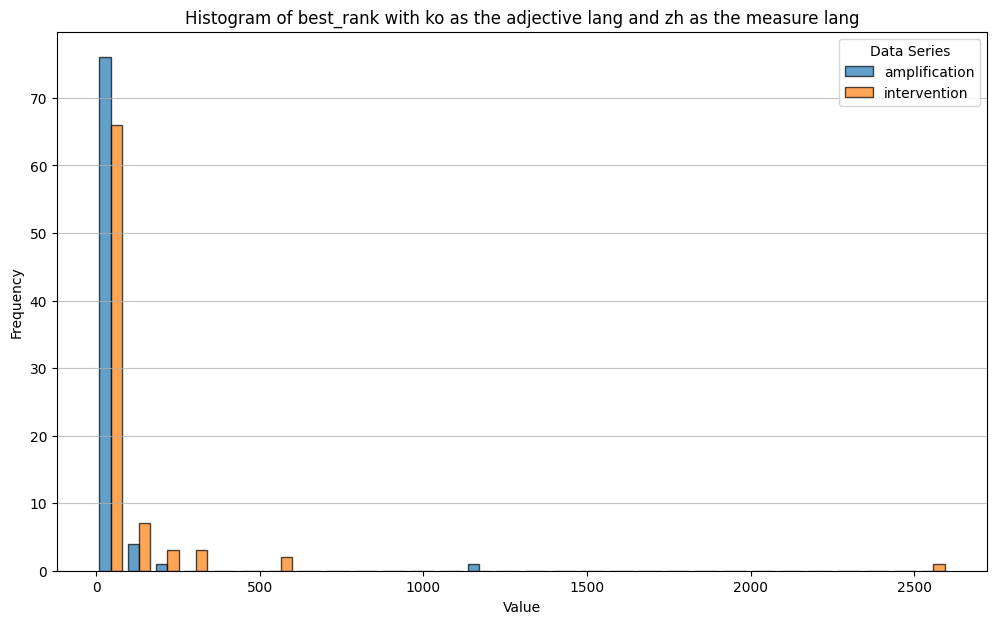

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


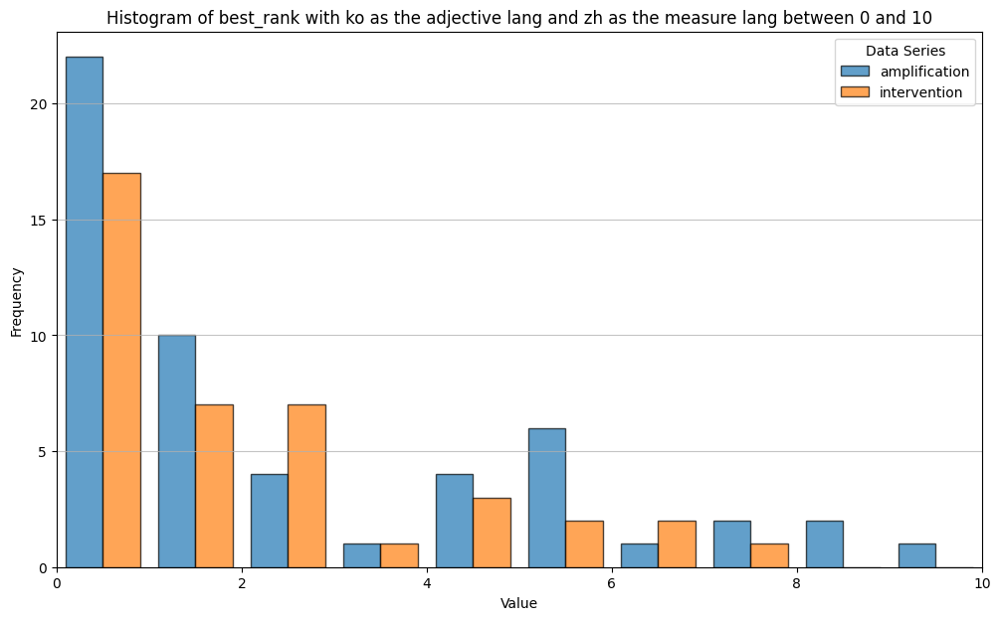

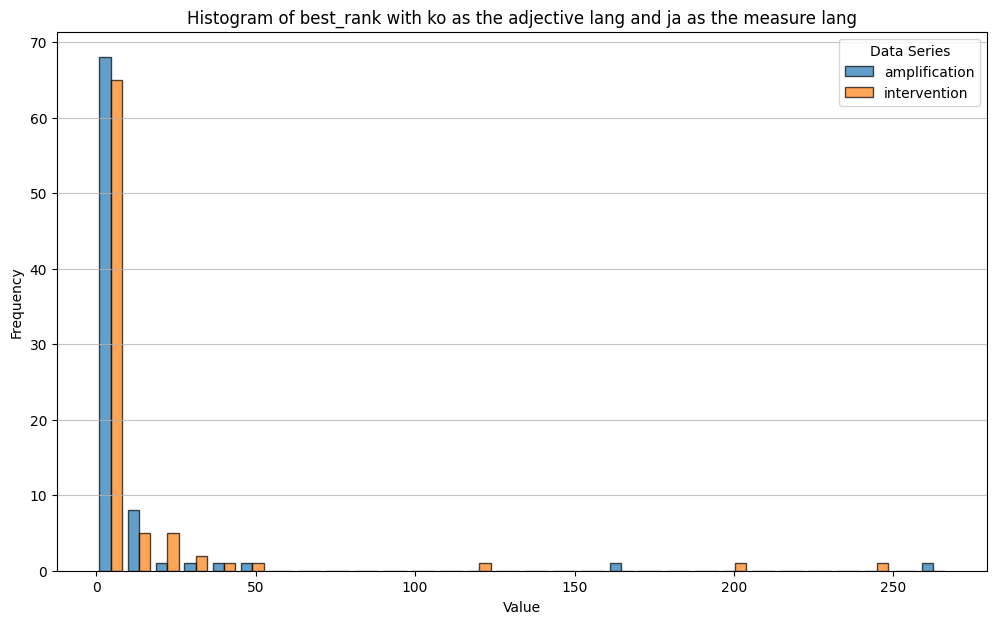

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


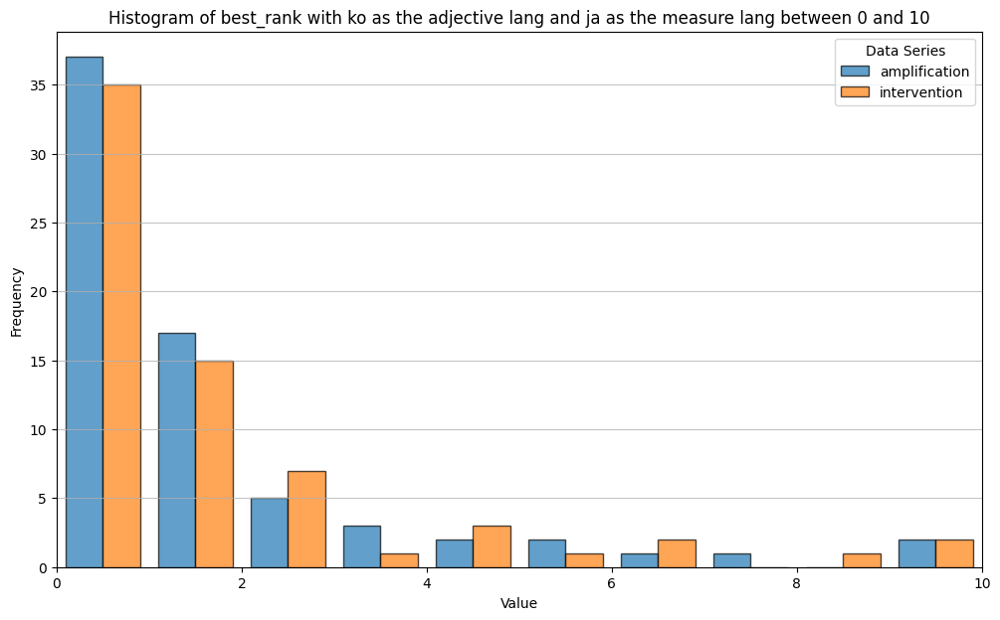

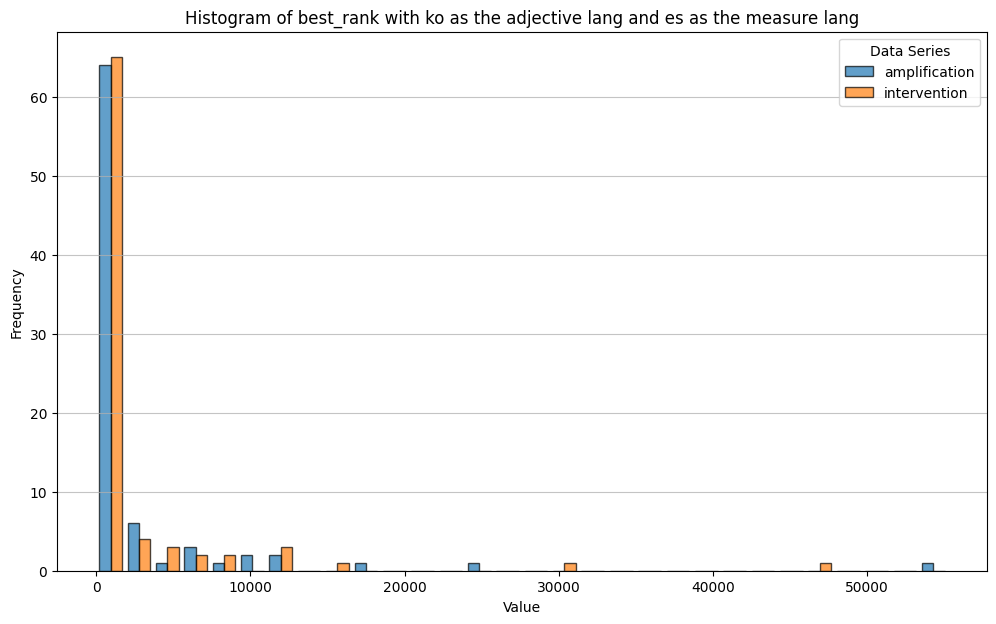

Generated bins for 0-10 range: [ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10.]


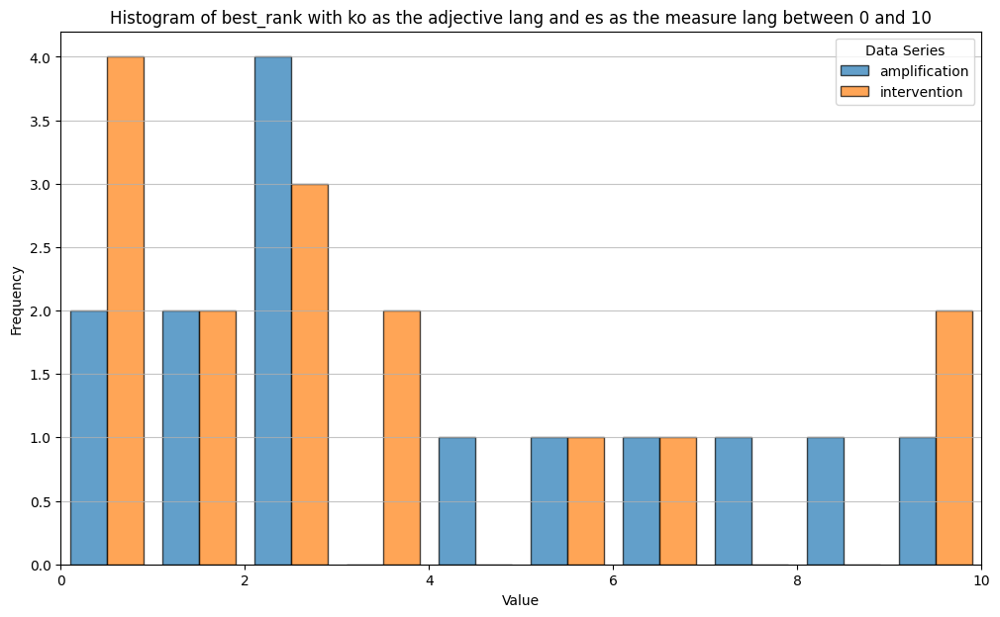

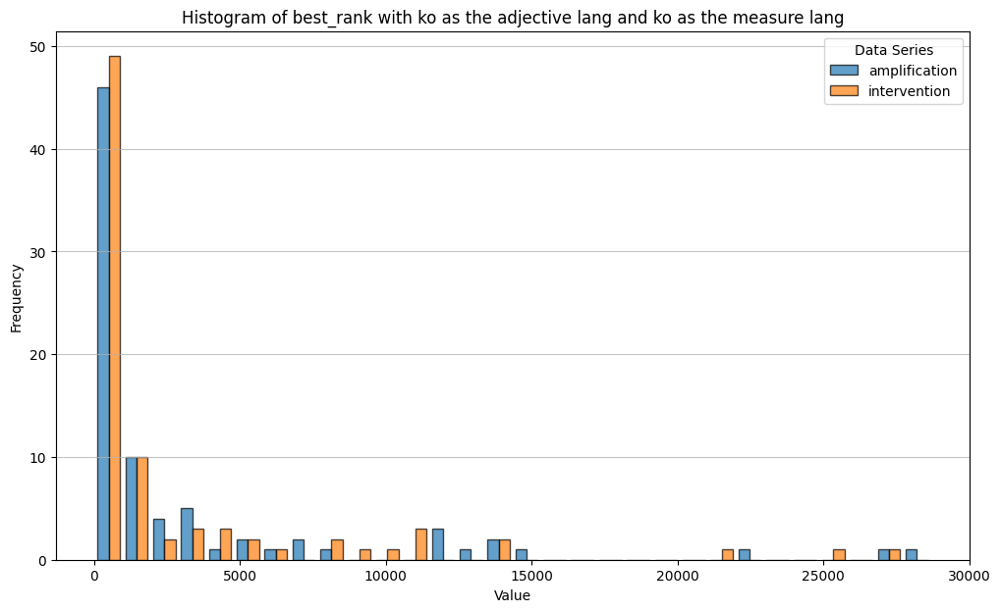

Series 'amplification' has no data points within the 0-10 range and will not be plotted.
Series 'intervention' has no data points within the 0-10 range and will not be plotted.
No valid data points to plot from any series within the 0-10 range.


In [54]:
langs_plus = ['en', 'fr', 'de', 'zh', 'ja', 'es', 'ko']

def faster_whole_iterate(prompt: str, base_lang: str, ablation_langs: list[str], amplification_langs: list[str], ans: dict[str, list[str]], supernodes_dict, alpha: float = -0.5, k: int=10) -> dict:
    logits, activaitons = model.get_activations(prompt)
    en = get_best_rank(logits, ans['en'])
    zh = get_best_rank(logits, ans['zh'])
    if not (en <= k or zh <= k):
        print(f'Skip {prompt} because the model understands this incorrectly')
        return dict()
    outputs_og = get_top_outputs(logits, k)
    print(outputs_og)

    intervention_lst = []
    for lang in ablation_langs:
        intervention_lst.extend(ablation(supernodes_dict, lang, alpha))
    for lang in amplification_langs:
        intervention_lst.extend(amplification(supernodes_dict, lang))

    new_logits, new_activations = model.feature_intervention(prompt, intervention_lst)
    new_outputs = get_top_outputs(new_logits, k)
    print(new_outputs)

    base = get_best_base(logits, ans[base_lang])
    result_dict = dict()

    for lang2 in langs_plus:
        target = get_best_base(logits, ans[lang2])
        o_diff, n_diff, diff = logit_diff_single(logits, new_logits, target, base)
        best_rank = get_best_rank(new_logits, ans[lang2])

        result_dict[lang2] = (o_diff, n_diff, diff, best_rank)
    return result_dict


#%%
# with everything amplification
result_everything_amplified = dict()
for lang in langs_plus:
  result_everything_amplified[lang] = dict()
  for lang2 in langs_plus:
    result_everything_amplified[lang][lang2] = {'old_logit_diff': [], 'new_logit_diff': [], 'logit_diff_diff': [], 'best_rank': []}
  for adj, ans in train_data:
      prompt = prompt_zh.format(adj=adj[lang])
      if (lang, adj[lang]) in inappropriate_set:
        print(f'Skip {prompt}')
        continue
      print(prompt)
      d = faster_whole_iterate(prompt, lang, [], ['fr', 'de', 'ja'], ans, supernodes_dict)
      if not d:
          continue
      for lang2 in langs_plus:
          o_diff, n_diff, diff, rank = d[lang2]
          result_everything_amplified[lang][lang2]['old_logit_diff'].append(o_diff)
          result_everything_amplified[lang][lang2]['new_logit_diff'].append(n_diff)
          result_everything_amplified[lang][lang2]['logit_diff_diff'].append(diff)
          result_everything_amplified[lang][lang2]['best_rank'].append(rank)

  for lang2 in langs_plus:
      for key, value in result_everything_amplified[lang][lang2].items():
          if key == 'best_rank':
            continue
          # take mean
          if len(value) != 0:
            result_everything_amplified[lang][lang2][key] = sum(value) / len(value)
          else:
            result_everything_amplified[lang][lang2][key] = 0

# with everything amplification and ablation
result_everything_amplified_and_ablation = dict()
for lang in langs_plus:
  result_everything_amplified_and_ablation[lang] = dict()
  for lang2 in langs_plus:
    result_everything_amplified_and_ablation[lang][lang2] = {'old_logit_diff': [], 'new_logit_diff': [], 'logit_diff_diff': [], 'best_rank': []}
  for adj, ans in train_data:
      prompt = prompt_zh.format(adj=adj[lang])
      if (lang, adj[lang]) in inappropriate_set:
        print(f'Skip {prompt}')
        continue
      print(prompt)
      d = faster_whole_iterate(prompt, lang, ['zh'], ['fr', 'de', 'ja'], ans, supernodes_dict)
      if not d:
          continue
      for lang2 in langs_plus:
          o_diff, n_diff, diff, rank = d[lang2]
          result_everything_amplified_and_ablation[lang][lang2]['old_logit_diff'].append(o_diff)
          result_everything_amplified_and_ablation[lang][lang2]['new_logit_diff'].append(n_diff)
          result_everything_amplified_and_ablation[lang][lang2]['logit_diff_diff'].append(diff)
          result_everything_amplified_and_ablation[lang][lang2]['best_rank'].append(rank)

  for lang2 in langs_plus:
      for key, value in result_everything_amplified_and_ablation[lang][lang2].items():
          if key == 'best_rank':
            continue
          # take mean
          if len(value) != 0:
            result_everything_amplified_and_ablation[lang][lang2][key] = sum(value) / len(value)
          else:
            result_everything_amplified_and_ablation[lang][lang2][key] = 0

#%%
categories = ['old_logit_diff', 'new_logit_diff', 'logit_diff_diff', 'best_rank']
types = ['amplification', 'intervention']
combined_dict_everything = dict()
for category in categories:
    combined_dict_everything[category] = dict()
    for lang in langs_plus:
        combined_dict_everything[category][lang] = dict()
        for t in types:
            combined_dict_everything[category][lang][t] = dict()

for lang in langs_plus:
    for lang2 in langs_plus:
        for category in categories:
            combined_dict_everything[category][lang]['amplification'][lang2] = result_everything_amplified[lang][lang2][category]
            combined_dict_everything[category][lang]['intervention'][lang2] = result_everything_amplified_and_ablation[lang][lang2][category]

smaller_dict = dict()
for lang in langs_plus:
    smaller_dict[lang] = dict()
    for lang2 in langs_plus:
        smaller_dict[lang][lang2] = result_everything_amplified[lang][lang2]['old_logit_diff']
visualize_bar_2ddict_outer_inter(smaller_dict)

for key, value in combined_dict_everything.items():
    if key == 'old_logit_diff' or key == 'best_rank':
        continue
    bar_graph_visualize(value, key)

rank_dict = dict()
for lang in langs_plus:
  rank_dict[lang] = dict()
  for lang2 in langs_plus:
    rank_dict[lang][lang2] = dict()

for lang in langs_plus:
  for key, value in combined_dict_everything['best_rank'][lang].items():
    for lang2, val in value.items():
      rank_dict[lang][lang2][key] = val

for lang in langs_plus:
  for lang2 in langs_plus:
    title = f"Histogram of best_rank with {lang} as the adjective lang and {lang2} as the measure lang"
    create_multi_series_histogram(rank_dict[lang][lang2], title=title)